Python: 3.8.12 (default, Oct 12 2021, 13:49:34) 
[GCC 7.5.0]
Numpy: 1.21.2
Torch: 1.10.0


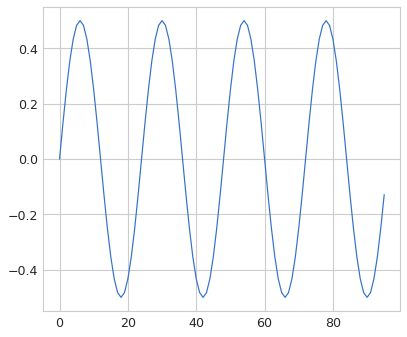

M=96
Signal Length M=96


In [9]:
import sys
sys.path.insert(1,'/home/bwhiteak/ChaosESN/ESN_utils/')

import numpy as np
import torch
import rc_tools as rct
import rc_analysis as rca
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error
from scipy.optimize import fsolve
from scipy.signal import argrelextrema
import sys
import warnings
import time

import pdb

from skopt.space import Real,Integer
from skopt.utils import use_named_args
from skopt import gp_minimize

import signalz

import warnings
warnings.filterwarnings("ignore")

from jupyterthemes import jtplot
jtplot.style()

np.random.seed(11)
torch.set_printoptions(precision=10)
dtype = torch.float32 

print(f'Python: {sys.version}')
print(f'Numpy: {np.__version__}')
print(f'Torch: {torch.__version__}')

DEVICE = 'cuda:3'

T = 24
f = lambda x: 0.5*np.sin(2*np.pi*x/24)
signal = f(np.arange(4*T))
FREERUN = 0
plt.figure()
plt.plot(signal[:4*T])
plt.show()

M = signal.shape[0]-FREERUN

K = 1
L = 1
RF = .5
TEST = 24*2
LEAD = 24
BURNIN = 24
REG = 1e-8
TRAINLENGTH = M-TEST
print(f'M={M}')
MINMAX = np.max(signal[:TRAINLENGTH+TEST]) - np.min(signal[:TRAINLENGTH+TEST])
print(f'Signal Length M={M}')

In [10]:
def get_weight_matricesGPU(k,n,l,ri,ro):
    win = torch.rand((n,k),dtype=dtype,
                      device=torch.device(DEVICE)).sub(.5).mul(ri)
    wfb = torch.zeros((n,l),dtype=dtype, device=torch.device(DEVICE))
    wout = torch.rand((l,n+k),dtype=dtype,
                      device=torch.device(DEVICE)).sub(.5).mul(ro)
    return win, wfb, wout

def set_vectorsGPU(n,l,r):
    x0 = torch.rand((n,1),dtype=dtype,
                      device=torch.device(DEVICE)).sub(.5).mul(r)
    y0 = torch.zeros((l,1),dtype=dtype, device=torch.device(DEVICE))
    return x0, y0

def update_res_stateGPU(wnet,xt,uxy,a,g):
    z = torch.matmul(wnet,uxy)
    return torch.mul(xt,1-a) + torch.mul(torch.tanh(z),a*g)

def predict_yGPU(wout,xu):
    return torch.matmul(wout, xu)

def get_matrixGPU(n,r,sr):
    A = (torch.rand((n,n),dtype=dtype,
                   device=torch.device(DEVICE))-.5)*r
    At = torch.transpose(A,0,1)
    D = torch.diag(torch.diag(A))   
    W = A + At - D
    eig = torch.eig(W, eigenvectors=False)
    wsr = torch.max(torch.abs(eig[0]))
    return W.div(wsr).mul(sr)

def resize_spaces(mn, mx, best, isAlpha=False):
    #pdb.set_trace()
    if(best.size==0):
        new_mn = np.max([0, mn - .5*mn])
        new_mx = 1.5*mx
    else:
        best_mn = np.min(best)
        best_mx = np.max(best)
        mn_bound = (best_mn-mn)/2
        mx_bound = (mx -best_mx)/2
        new_mn, new_mx = best_mn-mn_bound, best_mx+mx_bound
        print(f'\nBest mn:{best_mn:.3f}\t mn:{best_mx:.3f}')
        print(f'New bounds mn--mx: {mn_bound:.3f}--{mx_bound:.3f}')
    if(isAlpha):
        if(new_mx>1):
            new_mx = 1
    
    return new_mn, new_mx

In [11]:
min_a, max_a = .001, 1.
min_sr, max_sr = .001, 1.2
min_g, max_g = .001, 1.
min_ri, max_ri = .001, 1.
min_rr, max_rr = .001, 5.
space = [Real(min_a, max_a, name='a'),
                 Real(min_sr, max_sr, name='sr'),
                 Real(min_g, max_g, name='amp'), 
                 Real(min_ri, max_ri, name='ri'),
                 Real(min_rr, max_rr, name='rr')
                ]

@use_named_args(space)
def loop(a=1.0,sr=1.0,amp=1.0,ri=1.0,rr=1.0):
    start = time.time()
    global running_error, s, signal, counter, N, ref, rn, \
           alphas, rhos, gammas, inScales, resScales
    
    ut = torch.zeros((1,1),dtype=dtype,
                     device=torch.device(DEVICE))
    tp = torch.zeros((1,1),dtype=dtype,
                     device=torch.device(DEVICE))
    
    Wres = get_matrixGPU(N,rr,sr)
    Win, Wfb, Wout = get_weight_matricesGPU(K,N,L,ri,RF)
    Wnet = torch.cat((Win,Wres,Wfb),1)
    xt, yt = set_vectorsGPU(N,L,rr)

    states = torch.zeros((TRAINLENGTH, N+K),dtype=dtype,
                         device=DEVICE)
    targets = torch.zeros((TRAINLENGTH),dtype=dtype,
                         device=DEVICE)
    for i in range(TRAINLENGTH):
        ut[0,0] = s[i]
        tp[0,0] = s[i+1]
        targets[i] = s[i+1]
        uxy = torch.cat((ut,xt,yt),0)
        xt1 = update_res_stateGPU(Wnet,xt,uxy,a,amp)
        xu = torch.transpose(torch.cat((xt1,ut),0),0,1).to(DEVICE)
        states[i,:] = xu[0,:]
        xt, yt = xt1, tp 
        
    state = states.detach().cpu().numpy()

    torch.cuda.synchronize()
    wout = rct.get_trained_weights(state[BURNIN:],
                                   signal[BURNIN+1:TRAINLENGTH+1],
                                   REG)
    Wout = torch.from_numpy(wout.reshape(L,N+K)).type(dtype).cuda(DEVICE)
    torch.cuda.synchronize()

    predictions = torch.zeros((M+FREERUN,1),
                              dtype=dtype,
                              device=torch.device(DEVICE))

    xt, yt = set_vectorsGPU(N,L,rr)
    ut.fill_(0.0)
    for i in range(M+FREERUN):
        if(i < TRAINLENGTH):
            ut[0,0] = s[i]
        else:
            ut = yt
        uxy = torch.cat((ut,xt,yt),0)
        xt1 = update_res_stateGPU(Wnet,xt,uxy,a,amp)
        xu = torch.cat((xt1,ut),0)
        yt1 = predict_yGPU(Wout,xu)
        predictions[i] = yt1[0,0]
        xt, yt = xt1, yt1

    yHat_GPU = predictions.detach().cpu().numpy()
    
    nrmse = 1000.0
    try:
        nrmse = rca.NRMSE(signal[TRAINLENGTH:TRAINLENGTH+TEST],
                          yHat_GPU[TRAINLENGTH:TRAINLENGTH+TEST],
                          MINMAX) 
    except:
        pass
        
    
    av = signal[TRAINLENGTH:TRAINLENGTH+TEST].reshape(TEST,1)
    bv = np.squeeze(yHat_GPU[TRAINLENGTH:TRAINLENGTH+TEST]).reshape(TEST,1)
    num = np.squeeze(np.dot(av.T,bv))
    den = np.linalg.norm(av)*np.linalg.norm(bv)
    cosine_similarity = num/den
    cosine_distance = 1 - cosine_similarity
    dist = cosine_distance
    
    loss = nrmse
    if(np.isnan(loss) or (np.isinf(loss) or (loss > 1000.0))):
        loss = 1000

    if((loss < running_error) & (loss < .08)):
        alphas.append(a)
        rhos.append(sr)
        gammas.append(amp)
        inScales.append(ri)
        resScales.append(rr)
        running_error = loss
        wnet = Wnet.detach().cpu().numpy()
        currentParams = np.array([a,sr,amp,ri,rr,loss])
        
        fig = plt.figure(figsize=(10,8))
        ax1 = plt.subplot(111)
        ax1.plot(signal[TRAINLENGTH-LEAD:], label='Target')
        ax1.plot(yHat_GPU[TRAINLENGTH-LEAD:], label='GPU')
        ax1.axvline(LEAD,c='orange',linestyle='dashed')
        #ax1.axvline(LEAD+TEST,c='r',linestyle='dashed')
        ax1.set_ylim(-2,2)
        ax1.legend()
        plt.show()
        fig.savefig(f'./S1_Saved_Models/S1_sz{N}_ref{ref}_run{rn}_iter{counter}.pdf',
                    format='pdf', bbox_inches='tight', pad_inches=.01)
        plt.close()
        
        np.save(f'./S1_Saved_Models/S1_it{counter}_{N}_{ref}_{rn}_Wnet',wnet)
        np.save(f'./S1_Saved_Models/S1_it{counter}_{N}_{ref}_{rn}_Preds',yHat_GPU)
        np.save(f'./S1_Saved_Models/S1_it{counter}_{N}_{ref}_{rn}_InstanceParams',currentParams)  
        print(f' Iter={counter} a={a:.3f} sr={sr:.3f} amp={amp:.3f}',
              f' ri={ri:.3f} rr={rr:.3f} loss={loss:3f}\n\n')
    
    print(f'Iter: {counter} #### Diagnostic {loss:.3f}   Time {(time.time()-start):.2f}',
          f' Best {running_error:.3f} NRMSE {nrmse:.3f} CD {dist:.3f}')
    
    counter += 1
    return loss


 ********** 1000 ***********
Iter: 0 #### Diagnostic 0.088   Time 3.51  Best 1000.000 NRMSE 0.088 CD 0.032
Iter: 1 #### Diagnostic 0.108   Time 2.01  Best 1000.000 NRMSE 0.108 CD 0.035
Iter: 2 #### Diagnostic 0.093   Time 2.06  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 3 #### Diagnostic 0.242   Time 2.23  Best 1000.000 NRMSE 0.242 CD 0.253
Iter: 4 #### Diagnostic 0.092   Time 2.01  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 5 #### Diagnostic 0.092   Time 2.06  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 6 #### Diagnostic 0.092   Time 4.09  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 7 #### Diagnostic 0.092   Time 3.06  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 8 #### Diagnostic 0.090   Time 2.48  Best 1000.000 NRMSE 0.090 CD 0.021
Iter: 9 #### Diagnostic 0.092   Time 2.31  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 10 #### Diagnostic 0.171   Time 0.97  Best 1000.000 NRMSE 0.171 CD 0.048
Iter: 11 #### Diagnostic 0.093   Time 1.93  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 12 #### Diagnostic 0.092  

Iter: 2 #### Diagnostic 0.087   Time 2.66  Best 1000.000 NRMSE 0.087 CD 0.030
Iter: 3 #### Diagnostic 0.092   Time 2.41  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 4 #### Diagnostic 0.093   Time 3.11  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 5 #### Diagnostic 0.093   Time 2.77  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 6 #### Diagnostic 0.093   Time 3.85  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 7 #### Diagnostic 0.092   Time 2.50  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 8 #### Diagnostic 0.092   Time 2.10  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 9 #### Diagnostic 0.093   Time 2.85  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 10 #### Diagnostic 0.097   Time 4.95  Best 1000.000 NRMSE 0.097 CD 0.037
Iter: 11 #### Diagnostic 0.092   Time 3.26  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 12 #### Diagnostic 0.088   Time 2.97  Best 1000.000 NRMSE 0.088 CD 0.031
Iter: 13 #### Diagnostic 0.093   Time 2.25  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 14 #### Diagnostic 0.092   Time 2.47  Best 1000.000 NR

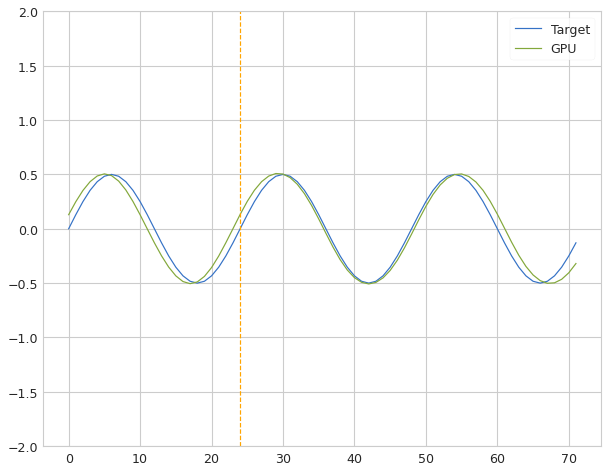

 Iter=35 a=0.982 sr=0.862 amp=0.092  ri=0.394 rr=3.226 loss=0.074210


Iter: 35 #### Diagnostic 0.074   Time 4.30  Best 0.074 NRMSE 0.074 CD 0.020
Iter: 36 #### Diagnostic 0.093   Time 3.33  Best 0.074 NRMSE 0.093 CD 0.035
Iter: 37 #### Diagnostic 0.093   Time 3.48  Best 0.074 NRMSE 0.093 CD 0.034
Iter: 38 #### Diagnostic 0.092   Time 2.82  Best 0.074 NRMSE 0.092 CD 0.034
Iter: 39 #### Diagnostic 0.093   Time 2.20  Best 0.074 NRMSE 0.093 CD 0.034
Iter: 40 #### Diagnostic 0.095   Time 2.36  Best 0.074 NRMSE 0.095 CD 0.036
Iter: 41 #### Diagnostic 0.093   Time 2.45  Best 0.074 NRMSE 0.093 CD 0.034
Iter: 42 #### Diagnostic 0.083   Time 2.99  Best 0.074 NRMSE 0.083 CD 0.028
Iter: 43 #### Diagnostic 0.094   Time 2.02  Best 0.074 NRMSE 0.094 CD 0.035
Iter: 44 #### Diagnostic 0.094   Time 2.30  Best 0.074 NRMSE 0.094 CD 0.036
Iter: 45 #### Diagnostic 0.097   Time 2.85  Best 0.074 NRMSE 0.097 CD 0.038
Iter: 46 #### Diagnostic 0.092   Time 1.61  Best 0.074 NRMSE 0.092 CD 0.034
Iter: 47 #### Dia

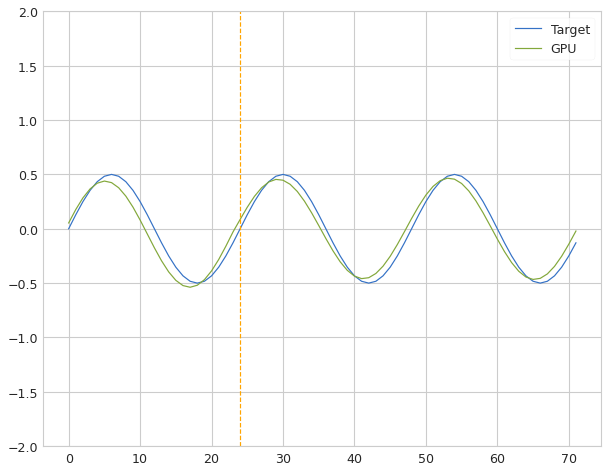

 Iter=73 a=0.213 sr=1.070 amp=0.925  ri=0.834 rr=1.647 loss=0.073724


Iter: 73 #### Diagnostic 0.074   Time 4.68  Best 0.074 NRMSE 0.074 CD 0.020
Iter: 74 #### Diagnostic 0.094   Time 2.21  Best 0.074 NRMSE 0.094 CD 0.035
Iter: 75 #### Diagnostic 0.093   Time 3.16  Best 0.074 NRMSE 0.093 CD 0.034
Iter: 76 #### Diagnostic 0.092   Time 1.89  Best 0.074 NRMSE 0.092 CD 0.034
Iter: 77 #### Diagnostic 0.093   Time 2.73  Best 0.074 NRMSE 0.093 CD 0.034
Iter: 78 #### Diagnostic 0.092   Time 2.19  Best 0.074 NRMSE 0.092 CD 0.034
Iter: 79 #### Diagnostic 0.116   Time 2.06  Best 0.074 NRMSE 0.116 CD 0.046
Iter: 80 #### Diagnostic 0.092   Time 2.20  Best 0.074 NRMSE 0.092 CD 0.034
Iter: 81 #### Diagnostic 0.480   Time 2.74  Best 0.074 NRMSE 0.480 CD 0.113
Iter: 82 #### Diagnostic 0.746   Time 2.82  Best 0.074 NRMSE 0.746 CD 0.055
Iter: 83 #### Diagnostic 0.092   Time 2.37  Best 0.074 NRMSE 0.092 CD 0.034
Iter: 84 #### Diagnostic 0.094   Time 2.28  Best 0.074 NRMSE 0.094 CD 0.035
Iter: 85 #### Dia

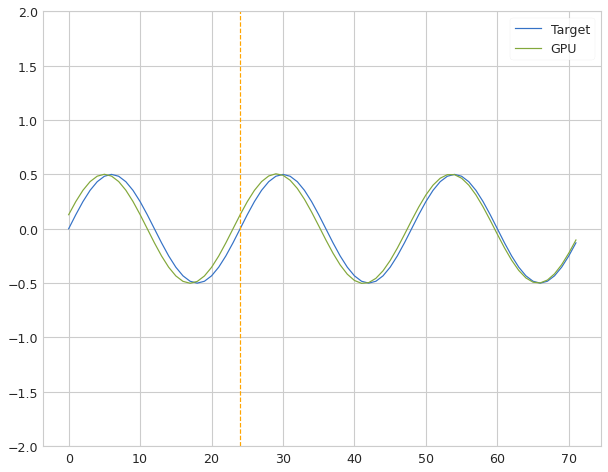

 Iter=72 a=0.889 sr=0.100 amp=0.221  ri=0.851 rr=4.421 loss=0.059467


Iter: 72 #### Diagnostic 0.059   Time 3.33  Best 0.059 NRMSE 0.059 CD 0.014
Iter: 73 #### Diagnostic 0.092   Time 4.18  Best 0.059 NRMSE 0.092 CD 0.034
Iter: 74 #### Diagnostic 0.092   Time 2.09  Best 0.059 NRMSE 0.092 CD 0.034
Iter: 75 #### Diagnostic 0.093   Time 1.99  Best 0.059 NRMSE 0.093 CD 0.034
Iter: 76 #### Diagnostic 0.098   Time 1.61  Best 0.059 NRMSE 0.098 CD 0.038
Iter: 77 #### Diagnostic 0.093   Time 1.58  Best 0.059 NRMSE 0.093 CD 0.035
Iter: 78 #### Diagnostic 0.092   Time 2.01  Best 0.059 NRMSE 0.092 CD 0.034
Iter: 79 #### Diagnostic 0.092   Time 2.30  Best 0.059 NRMSE 0.092 CD 0.034
Iter: 80 #### Diagnostic 0.092   Time 1.93  Best 0.059 NRMSE 0.092 CD 0.034
Iter: 81 #### Diagnostic 0.113   Time 2.38  Best 0.059 NRMSE 0.113 CD 0.051
Iter: 82 #### Diagnostic 0.097   Time 2.53  Best 0.059 NRMSE 0.097 CD 0.037
Iter: 83 #### Diagnostic 0.093   Time 2.91  Best 0.059 NRMSE 0.093 CD 0.035
Iter: 84 #### Dia

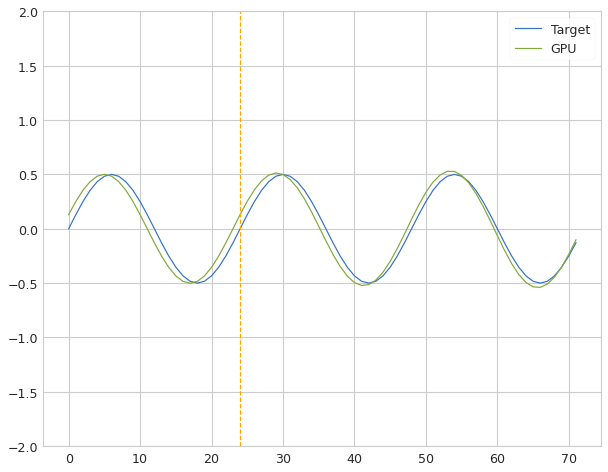

 Iter=37 a=0.953 sr=0.070 amp=0.298  ri=0.653 rr=4.602 loss=0.067256


Iter: 37 #### Diagnostic 0.067   Time 3.13  Best 0.067 NRMSE 0.067 CD 0.015
Iter: 38 #### Diagnostic 1.162   Time 1.80  Best 0.067 NRMSE 1.162 CD 0.028
Iter: 39 #### Diagnostic 0.093   Time 2.73  Best 0.067 NRMSE 0.093 CD 0.034
Iter: 40 #### Diagnostic 0.092   Time 2.02  Best 0.067 NRMSE 0.092 CD 0.034
Iter: 41 #### Diagnostic 0.089   Time 2.00  Best 0.067 NRMSE 0.089 CD 0.032
Iter: 42 #### Diagnostic 0.093   Time 2.07  Best 0.067 NRMSE 0.093 CD 0.035
Iter: 43 #### Diagnostic 0.093   Time 2.39  Best 0.067 NRMSE 0.093 CD 0.034
Iter: 44 #### Diagnostic 0.093   Time 2.15  Best 0.067 NRMSE 0.093 CD 0.034
Iter: 45 #### Diagnostic 0.091   Time 2.36  Best 0.067 NRMSE 0.091 CD 0.033
Iter: 46 #### Diagnostic 0.092   Time 2.19  Best 0.067 NRMSE 0.092 CD 0.034
Iter: 47 #### Diagnostic 0.093   Time 2.20  Best 0.067 NRMSE 0.093 CD 0.035
Iter: 48 #### Diagnostic 0.092   Time 1.59  Best 0.067 NRMSE 0.092 CD 0.034
Iter: 49 #### Dia

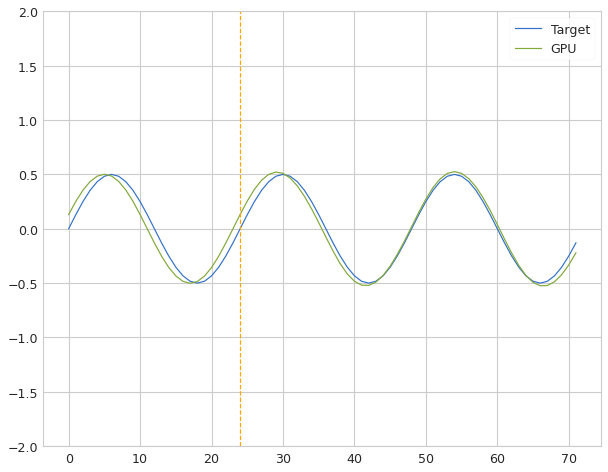

 Iter=30 a=0.979 sr=0.619 amp=0.086  ri=0.840 rr=0.572 loss=0.053691


Iter: 30 #### Diagnostic 0.054   Time 3.32  Best 0.054 NRMSE 0.054 CD 0.009
Iter: 31 #### Diagnostic 0.093   Time 1.65  Best 0.054 NRMSE 0.093 CD 0.034
Iter: 32 #### Diagnostic 0.092   Time 2.00  Best 0.054 NRMSE 0.092 CD 0.034
Iter: 33 #### Diagnostic 0.092   Time 1.81  Best 0.054 NRMSE 0.092 CD 0.034
Iter: 34 #### Diagnostic 0.089   Time 2.59  Best 0.054 NRMSE 0.089 CD 0.031
Iter: 35 #### Diagnostic 0.093   Time 2.50  Best 0.054 NRMSE 0.093 CD 0.035
Iter: 36 #### Diagnostic 0.092   Time 2.69  Best 0.054 NRMSE 0.092 CD 0.034
Iter: 37 #### Diagnostic 0.092   Time 2.04  Best 0.054 NRMSE 0.092 CD 0.034
Iter: 38 #### Diagnostic 0.092   Time 2.00  Best 0.054 NRMSE 0.092 CD 0.034
Iter: 39 #### Diagnostic 0.092   Time 2.30  Best 0.054 NRMSE 0.092 CD 0.034
Iter: 40 #### Diagnostic 0.093   Time 1.98  Best 0.054 NRMSE 0.093 CD 0.034
Iter: 41 #### Diagnostic 0.091   Time 2.53  Best 0.054 NRMSE 0.091 CD 0.033
Iter: 42 #### Dia

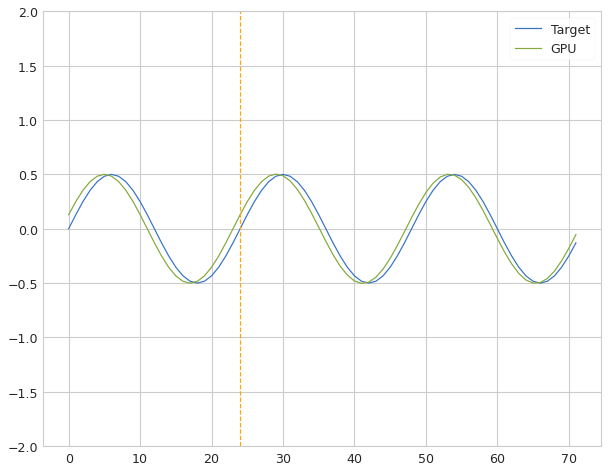

 Iter=17 a=0.924 sr=0.889 amp=0.320  ri=0.025 rr=4.308 loss=0.074019


Iter: 17 #### Diagnostic 0.074   Time 5.43  Best 0.074 NRMSE 0.074 CD 0.022
Iter: 18 #### Diagnostic 0.092   Time 4.31  Best 0.074 NRMSE 0.092 CD 0.034
Iter: 19 #### Diagnostic 0.091   Time 2.92  Best 0.074 NRMSE 0.091 CD 0.033
Iter: 20 #### Diagnostic 0.085   Time 2.02  Best 0.074 NRMSE 0.085 CD 0.029
Iter: 21 #### Diagnostic 0.092   Time 2.06  Best 0.074 NRMSE 0.092 CD 0.034
Iter: 22 #### Diagnostic 0.092   Time 2.68  Best 0.074 NRMSE 0.092 CD 0.034
Iter: 23 #### Diagnostic 0.093   Time 2.39  Best 0.074 NRMSE 0.093 CD 0.034
Iter: 24 #### Diagnostic 0.094   Time 3.76  Best 0.074 NRMSE 0.094 CD 0.035
Iter: 25 #### Diagnostic 0.093   Time 4.38  Best 0.074 NRMSE 0.093 CD 0.034
Iter: 26 #### Diagnostic 0.093   Time 3.85  Best 0.074 NRMSE 0.093 CD 0.034
Iter: 27 #### Diagnostic 0.092   Time 2.30  Best 0.074 NRMSE 0.092 CD 0.034
Iter: 28 #### Diagnostic 0.092   Time 2.46  Best 0.074 NRMSE 0.092 CD 0.034
Iter: 29 #### Dia

Iter: 21 #### Diagnostic 0.093   Time 2.61  Best 1000.000 NRMSE 0.093 CD 0.035


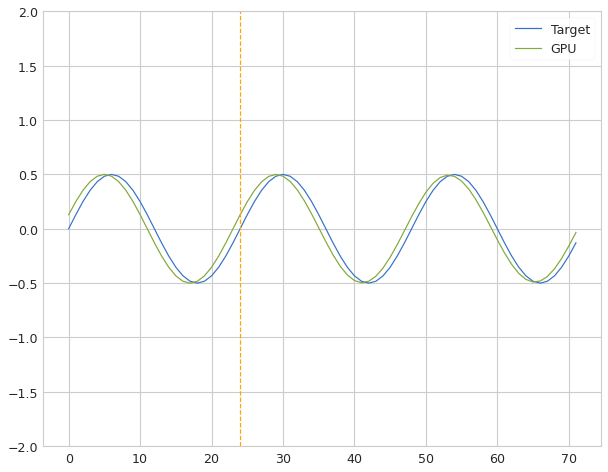

 Iter=22 a=0.715 sr=0.107 amp=0.159  ri=0.672 rr=2.005 loss=0.079975


Iter: 22 #### Diagnostic 0.080   Time 3.33  Best 0.080 NRMSE 0.080 CD 0.026
Iter: 23 #### Diagnostic 0.093   Time 4.27  Best 0.080 NRMSE 0.093 CD 0.034
Iter: 24 #### Diagnostic 0.092   Time 2.98  Best 0.080 NRMSE 0.092 CD 0.033
Iter: 25 #### Diagnostic 0.093   Time 3.73  Best 0.080 NRMSE 0.093 CD 0.034
Iter: 26 #### Diagnostic 0.092   Time 2.88  Best 0.080 NRMSE 0.092 CD 0.024
Iter: 27 #### Diagnostic 0.093   Time 2.58  Best 0.080 NRMSE 0.093 CD 0.034
Iter: 28 #### Diagnostic 0.110   Time 1.79  Best 0.080 NRMSE 0.110 CD 0.049
Iter: 29 #### Diagnostic 0.092   Time 2.16  Best 0.080 NRMSE 0.092 CD 0.034
Iter: 30 #### Diagnostic 0.093   Time 3.38  Best 0.080 NRMSE 0.093 CD 0.034
Iter: 31 #### Diagnostic 0.093   Time 2.58  Best 0.080 NRMSE 0.093 CD 0.034
Iter: 32 #### Diagnostic 1.966   Time 2.91  Best 0.080 NRMSE 1.966 CD 1.961
Iter: 33 #### Diagnostic 0.092   Time 2.88  Best 0.080 NRMSE 0.092 CD 0.034
Iter: 34 #### Dia

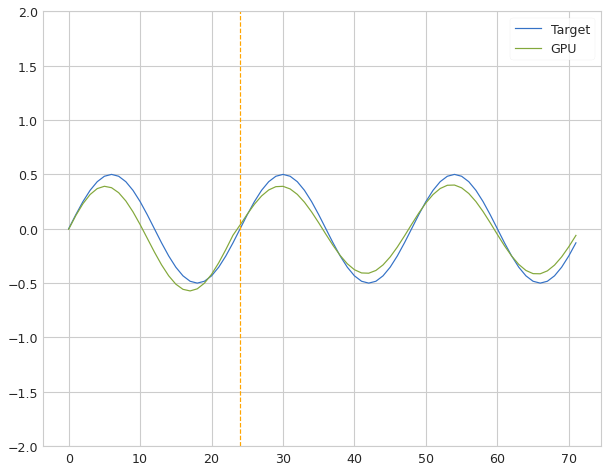

 Iter=73 a=0.213 sr=1.070 amp=0.925  ri=0.834 rr=1.647 loss=0.075892


Iter: 73 #### Diagnostic 0.076   Time 4.34  Best 0.076 NRMSE 0.076 CD 0.007
Iter: 74 #### Diagnostic 0.093   Time 4.32  Best 0.076 NRMSE 0.093 CD 0.034
Iter: 75 #### Diagnostic 0.092   Time 4.10  Best 0.076 NRMSE 0.092 CD 0.034
Iter: 76 #### Diagnostic 0.092   Time 2.34  Best 0.076 NRMSE 0.092 CD 0.034
Iter: 77 #### Diagnostic 0.093   Time 2.40  Best 0.076 NRMSE 0.093 CD 0.034
Iter: 78 #### Diagnostic 0.093   Time 2.21  Best 0.076 NRMSE 0.093 CD 0.034
Iter: 79 #### Diagnostic 0.137   Time 1.91  Best 0.076 NRMSE 0.137 CD 0.053
Iter: 80 #### Diagnostic 0.092   Time 2.47  Best 0.076 NRMSE 0.092 CD 0.034
Iter: 81 #### Diagnostic 0.084   Time 3.04  Best 0.076 NRMSE 0.084 CD 0.026
Iter: 82 #### Diagnostic 3.197   Time 2.96  Best 0.076 NRMSE 3.197 CD 1.865
Iter: 83 #### Diagnostic 0.092   Time 2.13  Best 0.076 NRMSE 0.092 CD 0.034
Iter: 84 #### Diagnostic 0.091   Time 1.40  Best 0.076 NRMSE 0.091 CD 0.033
Iter: 85 #### Dia

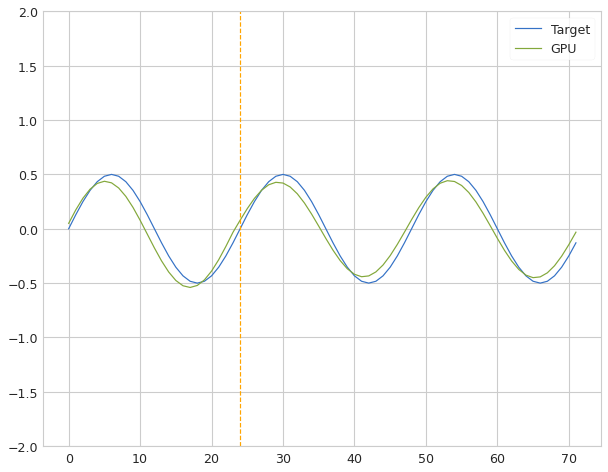

 Iter=36 a=0.440 sr=1.025 amp=0.969  ri=0.720 rr=2.051 loss=0.077059


Iter: 36 #### Diagnostic 0.077   Time 3.64  Best 0.077 NRMSE 0.077 CD 0.019
Iter: 37 #### Diagnostic 0.092   Time 3.10  Best 0.077 NRMSE 0.092 CD 0.034
Iter: 38 #### Diagnostic 0.092   Time 2.12  Best 0.077 NRMSE 0.092 CD 0.034
Iter: 39 #### Diagnostic 0.097   Time 3.06  Best 0.077 NRMSE 0.097 CD 0.038
Iter: 40 #### Diagnostic 0.092   Time 3.18  Best 0.077 NRMSE 0.092 CD 0.034
Iter: 41 #### Diagnostic 0.093   Time 3.11  Best 0.077 NRMSE 0.093 CD 0.034
Iter: 42 #### Diagnostic 0.093   Time 2.99  Best 0.077 NRMSE 0.093 CD 0.034
Iter: 43 #### Diagnostic 0.371   Time 1.68  Best 0.077 NRMSE 0.371 CD 1.137
Iter: 44 #### Diagnostic 0.092   Time 2.94  Best 0.077 NRMSE 0.092 CD 0.034
Iter: 45 #### Diagnostic 0.092   Time 2.51  Best 0.077 NRMSE 0.092 CD 0.034
Iter: 46 #### Diagnostic 0.089   Time 1.74  Best 0.077 NRMSE 0.089 CD 0.032
Iter: 47 #### Diagnostic 0.092   Time 2.90  Best 0.077 NRMSE 0.092 CD 0.034
Iter: 48 #### Dia

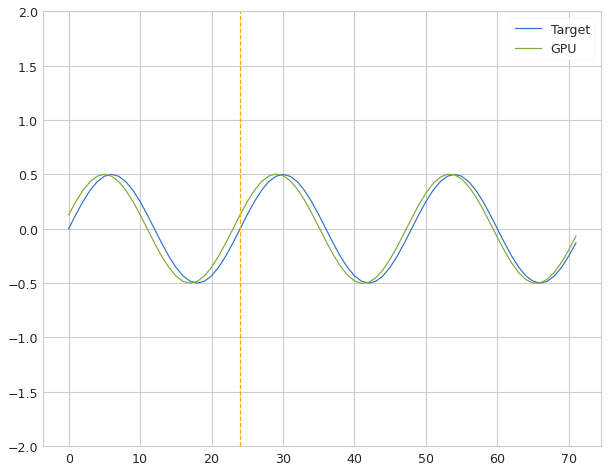

 Iter=54 a=0.823 sr=0.029 amp=0.188  ri=0.675 rr=4.542 loss=0.069553


Iter: 54 #### Diagnostic 0.070   Time 3.21  Best 0.070 NRMSE 0.070 CD 0.019
Iter: 55 #### Diagnostic 0.093   Time 3.40  Best 0.070 NRMSE 0.093 CD 0.035
Iter: 56 #### Diagnostic 0.091   Time 3.65  Best 0.070 NRMSE 0.091 CD 0.033
Iter: 57 #### Diagnostic 2.030   Time 3.40  Best 0.070 NRMSE 2.030 CD 1.895
Iter: 58 #### Diagnostic 0.093   Time 1.93  Best 0.070 NRMSE 0.093 CD 0.035
Iter: 59 #### Diagnostic 0.091   Time 2.41  Best 0.070 NRMSE 0.091 CD 0.033
Iter: 60 #### Diagnostic 0.093   Time 2.16  Best 0.070 NRMSE 0.093 CD 0.035
Iter: 61 #### Diagnostic 0.092   Time 1.52  Best 0.070 NRMSE 0.092 CD 0.034
Iter: 62 #### Diagnostic 0.092   Time 2.00  Best 0.070 NRMSE 0.092 CD 0.034
Iter: 63 #### Diagnostic 0.093   Time 2.87  Best 0.070 NRMSE 0.093 CD 0.034
Iter: 64 #### Diagnostic 0.103   Time 3.44  Best 0.070 NRMSE 0.103 CD 0.017
Iter: 65 #### Diagnostic 0.093   Time 2.78  Best 0.070 NRMSE 0.093 CD 0.035
Iter: 66 #### Dia

Iter: 57 #### Diagnostic 0.092   Time 2.53  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 58 #### Diagnostic 0.092   Time 3.07  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 59 #### Diagnostic 0.092   Time 2.75  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 60 #### Diagnostic 0.084   Time 2.38  Best 1000.000 NRMSE 0.084 CD 0.028
Iter: 61 #### Diagnostic 0.190   Time 2.45  Best 1000.000 NRMSE 0.190 CD 0.063
Iter: 62 #### Diagnostic 0.090   Time 2.87  Best 1000.000 NRMSE 0.090 CD 0.032
Iter: 63 #### Diagnostic 0.093   Time 2.77  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 64 #### Diagnostic 0.093   Time 3.01  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 65 #### Diagnostic 0.093   Time 3.05  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 66 #### Diagnostic 0.092   Time 3.10  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 67 #### Diagnostic 0.114   Time 2.50  Best 1000.000 NRMSE 0.114 CD 0.033
Iter: 68 #### Diagnostic 0.096   Time 2.23  Best 1000.000 NRMSE 0.096 CD 0.034
Iter: 69 #### Diagnostic 0.092   Time 2.26  Best 100

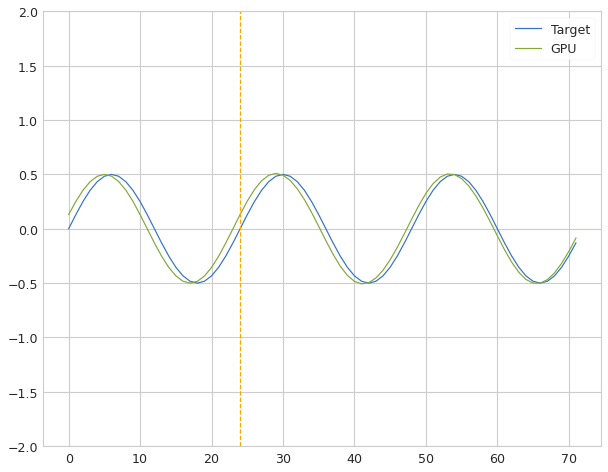

 Iter=30 a=0.979 sr=0.619 amp=0.086  ri=0.840 rr=0.572 loss=0.066650


Iter: 30 #### Diagnostic 0.067   Time 2.73  Best 0.067 NRMSE 0.067 CD 0.017
Iter: 31 #### Diagnostic 0.093   Time 2.88  Best 0.067 NRMSE 0.093 CD 0.034
Iter: 32 #### Diagnostic 0.092   Time 3.22  Best 0.067 NRMSE 0.092 CD 0.034
Iter: 33 #### Diagnostic 0.092   Time 2.97  Best 0.067 NRMSE 0.092 CD 0.034
Iter: 34 #### Diagnostic 0.093   Time 2.98  Best 0.067 NRMSE 0.093 CD 0.035
Iter: 35 #### Diagnostic 0.093   Time 2.42  Best 0.067 NRMSE 0.093 CD 0.034
Iter: 36 #### Diagnostic 0.092   Time 2.22  Best 0.067 NRMSE 0.092 CD 0.034
Iter: 37 #### Diagnostic 0.093   Time 2.35  Best 0.067 NRMSE 0.093 CD 0.034
Iter: 38 #### Diagnostic 0.092   Time 2.38  Best 0.067 NRMSE 0.092 CD 0.034
Iter: 39 #### Diagnostic 0.092   Time 1.50  Best 0.067 NRMSE 0.092 CD 0.034
Iter: 40 #### Diagnostic 0.092   Time 1.70  Best 0.067 NRMSE 0.092 CD 0.034
Iter: 41 #### Diagnostic 0.094   Time 1.57  Best 0.067 NRMSE 0.094 CD 0.035
Iter: 42 #### Dia

Iter: 26 #### Diagnostic 0.093   Time 3.20  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 27 #### Diagnostic 0.092   Time 2.56  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 28 #### Diagnostic 0.092   Time 1.88  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 29 #### Diagnostic 0.370   Time 2.99  Best 1000.000 NRMSE 0.370 CD 1.150
Iter: 30 #### Diagnostic 0.175   Time 3.00  Best 1000.000 NRMSE 0.175 CD 0.000
Iter: 31 #### Diagnostic 0.093   Time 2.53  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 32 #### Diagnostic 8.068   Time 5.01  Best 1000.000 NRMSE 8.068 CD 1.009
Iter: 33 #### Diagnostic 0.094   Time 3.06  Best 1000.000 NRMSE 0.094 CD 0.035
Iter: 34 #### Diagnostic 0.093   Time 1.23  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 35 #### Diagnostic 0.092   Time 1.94  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 36 #### Diagnostic 0.093   Time 2.39  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 37 #### Diagnostic 0.096   Time 2.56  Best 1000.000 NRMSE 0.096 CD 0.037
Iter: 38 #### Diagnostic 0.092   Time 2.10  Best 100

Iter: 28 #### Diagnostic 0.087   Time 1.53  Best 1000.000 NRMSE 0.087 CD 0.030
Iter: 29 #### Diagnostic 0.092   Time 2.98  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 30 #### Diagnostic 0.093   Time 3.32  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 31 #### Diagnostic 0.092   Time 2.93  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 32 #### Diagnostic 3.995   Time 2.49  Best 1000.000 NRMSE 3.995 CD 1.188
Iter: 33 #### Diagnostic 0.093   Time 2.01  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 34 #### Diagnostic 0.092   Time 2.08  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 35 #### Diagnostic 0.123   Time 1.60  Best 1000.000 NRMSE 0.123 CD 0.054
Iter: 36 #### Diagnostic 0.093   Time 2.16  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 37 #### Diagnostic 0.098   Time 3.55  Best 1000.000 NRMSE 0.098 CD 0.037
Iter: 38 #### Diagnostic 0.092   Time 2.95  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 39 #### Diagnostic 0.093   Time 2.26  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 40 #### Diagnostic 0.096   Time 2.05  Best 100

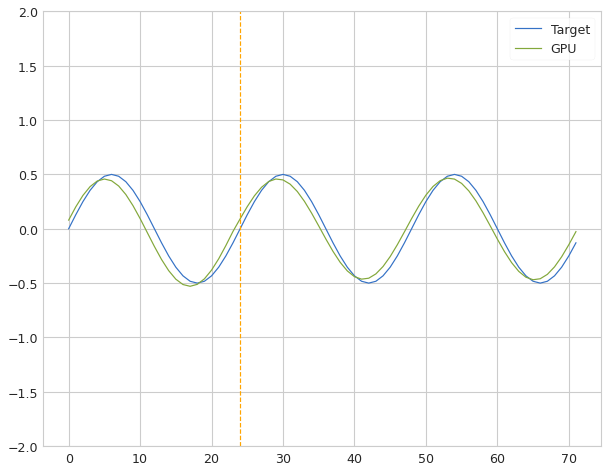

 Iter=73 a=0.213 sr=1.070 amp=0.925  ri=0.834 rr=1.647 loss=0.073436


Iter: 73 #### Diagnostic 0.073   Time 3.94  Best 0.073 NRMSE 0.073 CD 0.021
Iter: 74 #### Diagnostic 0.093   Time 3.38  Best 0.073 NRMSE 0.093 CD 0.035
Iter: 75 #### Diagnostic 0.093   Time 3.80  Best 0.073 NRMSE 0.093 CD 0.034
Iter: 76 #### Diagnostic 0.091   Time 2.40  Best 0.073 NRMSE 0.091 CD 0.033
Iter: 77 #### Diagnostic 0.093   Time 2.37  Best 0.073 NRMSE 0.093 CD 0.034
Iter: 78 #### Diagnostic 0.093   Time 2.00  Best 0.073 NRMSE 0.093 CD 0.035
Iter: 79 #### Diagnostic 0.119   Time 1.84  Best 0.073 NRMSE 0.119 CD 0.056
Iter: 80 #### Diagnostic 0.092   Time 3.45  Best 0.073 NRMSE 0.092 CD 0.034
Iter: 81 #### Diagnostic 0.152   Time 4.16  Best 0.073 NRMSE 0.152 CD 0.066
Iter: 82 #### Diagnostic 6.324   Time 3.68  Best 0.073 NRMSE 6.324 CD 1.059
Iter: 83 #### Diagnostic 0.092   Time 2.49  Best 0.073 NRMSE 0.092 CD 0.034
Iter: 84 #### Diagnostic 0.092   Time 2.04  Best 0.073 NRMSE 0.092 CD 0.034
Iter: 85 #### Dia

Iter: 75 #### Diagnostic 0.093   Time 2.32  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 76 #### Diagnostic 0.091   Time 3.40  Best 1000.000 NRMSE 0.091 CD 0.033
Iter: 77 #### Diagnostic 0.093   Time 3.62  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 78 #### Diagnostic 0.092   Time 2.72  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 79 #### Diagnostic 0.092   Time 3.23  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 80 #### Diagnostic 0.092   Time 2.84  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 81 #### Diagnostic 0.094   Time 1.91  Best 1000.000 NRMSE 0.094 CD 0.035
Iter: 82 #### Diagnostic 0.215   Time 2.63  Best 1000.000 NRMSE 0.215 CD 0.056
Iter: 83 #### Diagnostic 0.093   Time 3.88  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 84 #### Diagnostic 0.093   Time 3.00  Best 1000.000 NRMSE 0.093 CD 0.034


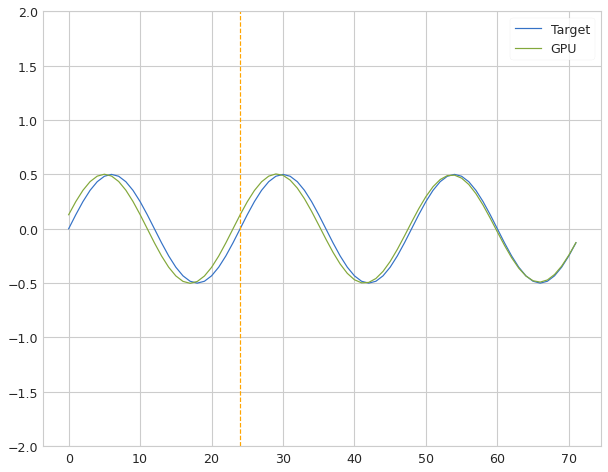

 Iter=85 a=0.889 sr=0.187 amp=0.095  ri=0.949 rr=1.347 loss=0.052923


Iter: 85 #### Diagnostic 0.053   Time 3.56  Best 0.053 NRMSE 0.053 CD 0.011
Iter: 86 #### Diagnostic 0.092   Time 3.14  Best 0.053 NRMSE 0.092 CD 0.034
Iter: 87 #### Diagnostic 0.092   Time 2.69  Best 0.053 NRMSE 0.092 CD 0.034
Iter: 88 #### Diagnostic 0.106   Time 2.19  Best 0.053 NRMSE 0.106 CD 0.045
Iter: 89 #### Diagnostic 0.093   Time 3.35  Best 0.053 NRMSE 0.093 CD 0.035
Iter: 90 #### Diagnostic 0.092   Time 3.50  Best 0.053 NRMSE 0.092 CD 0.034
Iter: 91 #### Diagnostic 0.091   Time 3.37  Best 0.053 NRMSE 0.091 CD 0.033
Iter: 92 #### Diagnostic 0.092   Time 4.00  Best 0.053 NRMSE 0.092 CD 0.034
Iter: 93 #### Diagnostic 0.092   Time 2.00  Best 0.053 NRMSE 0.092 CD 0.034
Iter: 94 #### Diagnostic 0.092   Time 2.62  Best 0.053 NRMSE 0.092 CD 0.034
Iter: 95 #### Diagnostic 0.093   Time 2.25  Best 0.053 NRMSE 0.093 CD 0.035
Iter: 96 #### Diagnostic 0.092   Time 2.57  Best 0.053 NRMSE 0.092 CD 0.034
Iter: 97 #### Dia

Iter: 87 #### Diagnostic 0.092   Time 2.56  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 88 #### Diagnostic 0.093   Time 1.56  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 89 #### Diagnostic 0.093   Time 2.15  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 90 #### Diagnostic 0.092   Time 2.36  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 91 #### Diagnostic 0.092   Time 2.68  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 92 #### Diagnostic 0.095   Time 3.62  Best 1000.000 NRMSE 0.095 CD 0.036
Iter: 93 #### Diagnostic 0.082   Time 4.30  Best 1000.000 NRMSE 0.082 CD 0.026
Iter: 94 #### Diagnostic 0.094   Time 1.28  Best 1000.000 NRMSE 0.094 CD 0.035
Iter: 95 #### Diagnostic 0.092   Time 2.07  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 96 #### Diagnostic 0.089   Time 2.71  Best 1000.000 NRMSE 0.089 CD 0.032
Iter: 97 #### Diagnostic 0.097   Time 2.55  Best 1000.000 NRMSE 0.097 CD 0.036
Iter: 98 #### Diagnostic 0.092   Time 2.32  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 99 #### Diagnostic 0.093   Time 2.74  Best 100

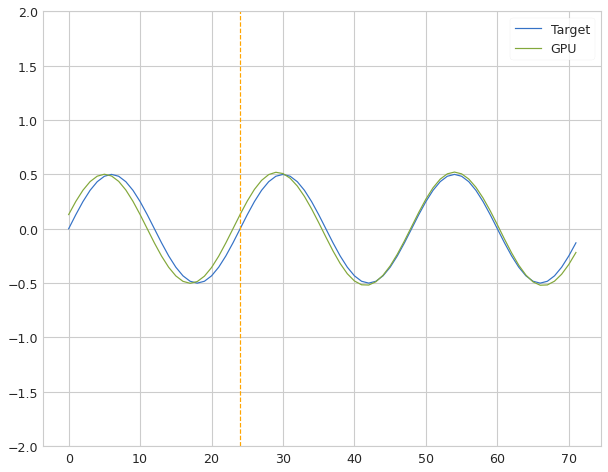

 Iter=30 a=0.979 sr=0.619 amp=0.086  ri=0.840 rr=0.572 loss=0.052548


Iter: 30 #### Diagnostic 0.053   Time 4.61  Best 0.053 NRMSE 0.053 CD 0.009
Iter: 31 #### Diagnostic 0.093   Time 2.67  Best 0.053 NRMSE 0.093 CD 0.034
Iter: 32 #### Diagnostic 0.092   Time 2.02  Best 0.053 NRMSE 0.092 CD 0.034
Iter: 33 #### Diagnostic 0.092   Time 2.21  Best 0.053 NRMSE 0.092 CD 0.034
Iter: 34 #### Diagnostic 0.094   Time 1.67  Best 0.053 NRMSE 0.094 CD 0.035
Iter: 35 #### Diagnostic 0.093   Time 2.89  Best 0.053 NRMSE 0.093 CD 0.034
Iter: 36 #### Diagnostic 0.092   Time 4.22  Best 0.053 NRMSE 0.092 CD 0.034
Iter: 37 #### Diagnostic 0.092   Time 2.80  Best 0.053 NRMSE 0.092 CD 0.034
Iter: 38 #### Diagnostic 0.092   Time 1.84  Best 0.053 NRMSE 0.092 CD 0.034
Iter: 39 #### Diagnostic 0.092   Time 2.44  Best 0.053 NRMSE 0.092 CD 0.034
Iter: 40 #### Diagnostic 0.093   Time 2.62  Best 0.053 NRMSE 0.093 CD 0.034
Iter: 41 #### Diagnostic 0.092   Time 1.85  Best 0.053 NRMSE 0.092 CD 0.033
Iter: 42 #### Dia

Iter: 26 #### Diagnostic 0.093   Time 1.67  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 27 #### Diagnostic 0.092   Time 2.21  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 28 #### Diagnostic 0.092   Time 2.84  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 29 #### Diagnostic 0.372   Time 1.51  Best 1000.000 NRMSE 0.372 CD 1.044
Iter: 30 #### Diagnostic 0.093   Time 2.16  Best 1000.000 NRMSE 0.093 CD 0.021
Iter: 31 #### Diagnostic 0.093   Time 3.37  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 32 #### Diagnostic 25.894   Time 3.36  Best 1000.000 NRMSE 25.894 CD 0.997
Iter: 33 #### Diagnostic 0.098   Time 2.92  Best 1000.000 NRMSE 0.098 CD 0.038
Iter: 34 #### Diagnostic 0.093   Time 1.47  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 35 #### Diagnostic 0.092   Time 1.76  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 36 #### Diagnostic 0.090   Time 2.74  Best 1000.000 NRMSE 0.090 CD 0.032
Iter: 37 #### Diagnostic 0.089   Time 2.14  Best 1000.000 NRMSE 0.089 CD 0.032
Iter: 38 #### Diagnostic 0.092   Time 2.49  Best 1

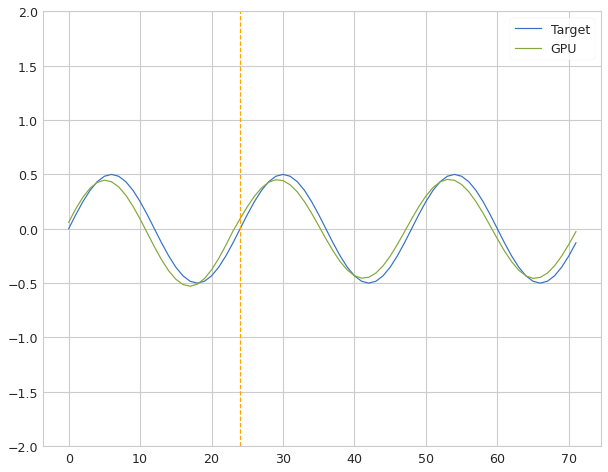

 Iter=56 a=0.143 sr=0.832 amp=0.984  ri=0.947 rr=0.372 loss=0.074988


Iter: 56 #### Diagnostic 0.075   Time 4.28  Best 0.075 NRMSE 0.075 CD 0.020
Iter: 57 #### Diagnostic 0.092   Time 1.87  Best 0.075 NRMSE 0.092 CD 0.033
Iter: 58 #### Diagnostic 0.094   Time 1.81  Best 0.075 NRMSE 0.094 CD 0.035
Iter: 59 #### Diagnostic 0.093   Time 2.73  Best 0.075 NRMSE 0.093 CD 0.034
Iter: 60 #### Diagnostic 0.092   Time 2.35  Best 0.075 NRMSE 0.092 CD 0.034
Iter: 61 #### Diagnostic 0.093   Time 1.95  Best 0.075 NRMSE 0.093 CD 0.035
Iter: 62 #### Diagnostic 0.084   Time 3.36  Best 0.075 NRMSE 0.084 CD 0.028
Iter: 63 #### Diagnostic 0.092   Time 2.40  Best 0.075 NRMSE 0.092 CD 0.034
Iter: 64 #### Diagnostic 0.092   Time 2.17  Best 0.075 NRMSE 0.092 CD 0.034
Iter: 65 #### Diagnostic 0.092   Time 2.30  Best 0.075 NRMSE 0.092 CD 0.034
Iter: 66 #### Diagnostic 0.093   Time 2.34  Best 0.075 NRMSE 0.093 CD 0.034
Iter: 67 #### Diagnostic 0.093   Time 2.38  Best 0.075 NRMSE 0.093 CD 0.035
Iter: 68 #### Dia

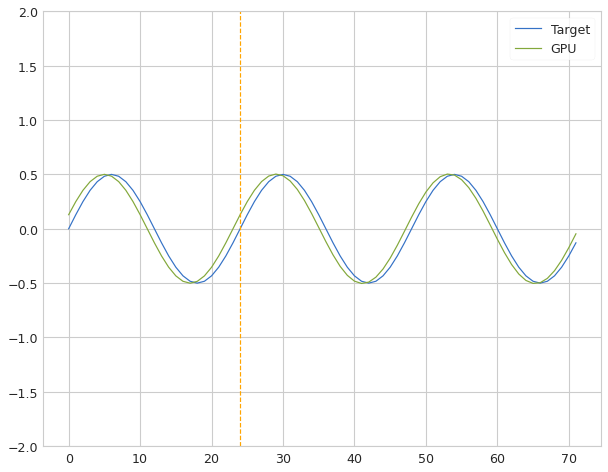

 Iter=28 a=0.837 sr=0.173 amp=0.262  ri=0.585 rr=3.430 loss=0.076696


Iter: 28 #### Diagnostic 0.077   Time 3.14  Best 0.077 NRMSE 0.077 CD 0.023
Iter: 29 #### Diagnostic 0.092   Time 2.86  Best 0.077 NRMSE 0.092 CD 0.034
Iter: 30 #### Diagnostic 0.093   Time 3.73  Best 0.077 NRMSE 0.093 CD 0.035
Iter: 31 #### Diagnostic 0.093   Time 2.62  Best 0.077 NRMSE 0.093 CD 0.034
Iter: 32 #### Diagnostic 1.473   Time 3.02  Best 0.077 NRMSE 1.473 CD 0.051
Iter: 33 #### Diagnostic 0.093   Time 2.71  Best 0.077 NRMSE 0.093 CD 0.034
Iter: 34 #### Diagnostic 0.092   Time 3.59  Best 0.077 NRMSE 0.092 CD 0.034


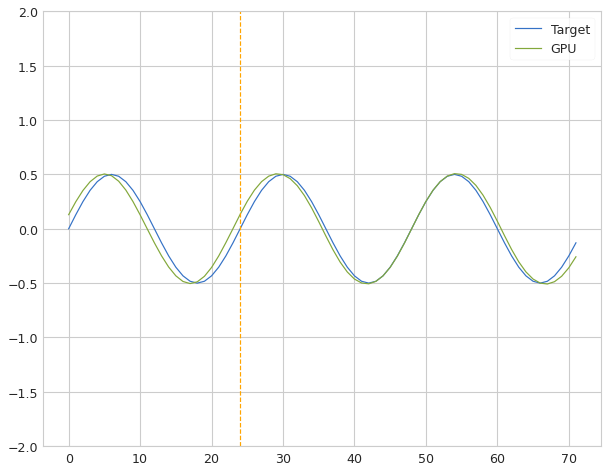

 Iter=35 a=0.982 sr=0.862 amp=0.092  ri=0.394 rr=3.226 loss=0.055315


Iter: 35 #### Diagnostic 0.055   Time 4.49  Best 0.055 NRMSE 0.055 CD 0.011
Iter: 36 #### Diagnostic 0.093   Time 2.41  Best 0.055 NRMSE 0.093 CD 0.035
Iter: 37 #### Diagnostic 0.080   Time 1.81  Best 0.055 NRMSE 0.080 CD 0.025
Iter: 38 #### Diagnostic 0.093   Time 1.44  Best 0.055 NRMSE 0.093 CD 0.034
Iter: 39 #### Diagnostic 0.092   Time 1.95  Best 0.055 NRMSE 0.092 CD 0.034
Iter: 40 #### Diagnostic 0.093   Time 2.05  Best 0.055 NRMSE 0.093 CD 0.034
Iter: 41 #### Diagnostic 0.093   Time 2.11  Best 0.055 NRMSE 0.093 CD 0.034
Iter: 42 #### Diagnostic 0.095   Time 3.34  Best 0.055 NRMSE 0.095 CD 0.036
Iter: 43 #### Diagnostic 0.094   Time 3.23  Best 0.055 NRMSE 0.094 CD 0.035
Iter: 44 #### Diagnostic 0.094   Time 3.11  Best 0.055 NRMSE 0.094 CD 0.035
Iter: 45 #### Diagnostic 0.095   Time 2.24  Best 0.055 NRMSE 0.095 CD 0.036
Iter: 46 #### Diagnostic 0.092   Time 1.15  Best 0.055 NRMSE 0.092 CD 0.034
Iter: 47 #### Dia

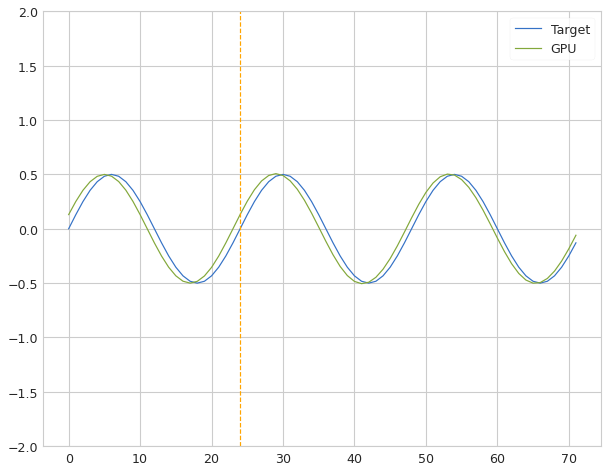

 Iter=15 a=0.926 sr=0.334 amp=0.177  ri=0.990 rr=3.464 loss=0.073995


Iter: 15 #### Diagnostic 0.074   Time 3.74  Best 0.074 NRMSE 0.074 CD 0.022
Iter: 16 #### Diagnostic 0.096   Time 1.65  Best 0.074 NRMSE 0.096 CD 0.037
Iter: 17 #### Diagnostic 0.093   Time 2.97  Best 0.074 NRMSE 0.093 CD 0.034
Iter: 18 #### Diagnostic 0.094   Time 4.25  Best 0.074 NRMSE 0.094 CD 0.035
Iter: 19 #### Diagnostic 0.093   Time 3.28  Best 0.074 NRMSE 0.093 CD 0.034
Iter: 20 #### Diagnostic 0.092   Time 2.19  Best 0.074 NRMSE 0.092 CD 0.034
Iter: 21 #### Diagnostic 0.092   Time 2.34  Best 0.074 NRMSE 0.092 CD 0.034
Iter: 22 #### Diagnostic 0.093   Time 2.26  Best 0.074 NRMSE 0.093 CD 0.034
Iter: 23 #### Diagnostic 0.092   Time 3.18  Best 0.074 NRMSE 0.092 CD 0.034
Iter: 24 #### Diagnostic 0.093   Time 2.55  Best 0.074 NRMSE 0.093 CD 0.035
Iter: 25 #### Diagnostic 0.094   Time 3.40  Best 0.074 NRMSE 0.094 CD 0.035
Iter: 26 #### Diagnostic 0.093   Time 3.78  Best 0.074 NRMSE 0.093 CD 0.034
Iter: 27 #### Dia

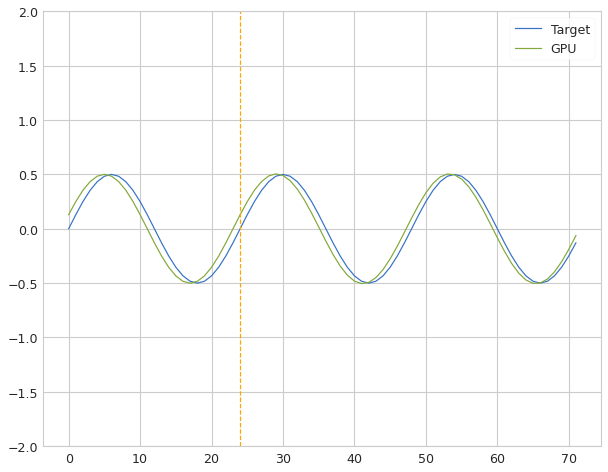

 Iter=72 a=0.889 sr=0.100 amp=0.221  ri=0.851 rr=4.421 loss=0.071455


Iter: 72 #### Diagnostic 0.071   Time 3.14  Best 0.071 NRMSE 0.071 CD 0.020
Iter: 73 #### Diagnostic 0.092   Time 3.88  Best 0.071 NRMSE 0.092 CD 0.034
Iter: 74 #### Diagnostic 0.092   Time 4.18  Best 0.071 NRMSE 0.092 CD 0.034
Iter: 75 #### Diagnostic 0.094   Time 3.13  Best 0.071 NRMSE 0.094 CD 0.035
Iter: 76 #### Diagnostic 0.091   Time 2.18  Best 0.071 NRMSE 0.091 CD 0.033
Iter: 77 #### Diagnostic 0.093   Time 1.88  Best 0.071 NRMSE 0.093 CD 0.035
Iter: 78 #### Diagnostic 0.092   Time 1.58  Best 0.071 NRMSE 0.092 CD 0.034
Iter: 79 #### Diagnostic 0.092   Time 2.33  Best 0.071 NRMSE 0.092 CD 0.034
Iter: 80 #### Diagnostic 0.092   Time 2.36  Best 0.071 NRMSE 0.092 CD 0.034
Iter: 81 #### Diagnostic 0.094   Time 3.49  Best 0.071 NRMSE 0.094 CD 0.035
Iter: 82 #### Diagnostic 0.198   Time 2.60  Best 0.071 NRMSE 0.198 CD 0.004
Iter: 83 #### Diagnostic 0.093   Time 1.63  Best 0.071 NRMSE 0.093 CD 0.035
Iter: 84 #### Dia

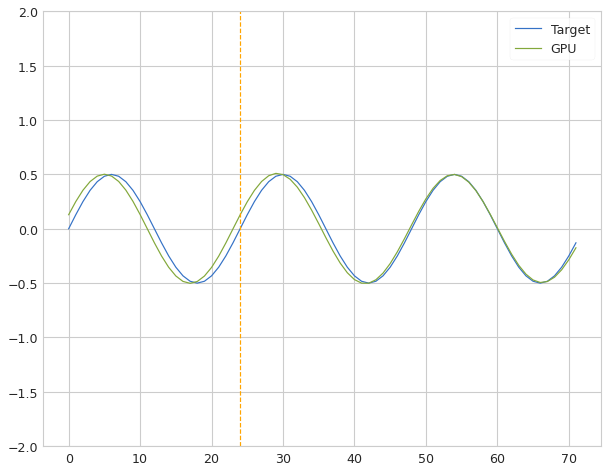

 Iter=37 a=0.953 sr=0.070 amp=0.298  ri=0.653 rr=4.602 loss=0.047132


Iter: 37 #### Diagnostic 0.047   Time 4.54  Best 0.047 NRMSE 0.047 CD 0.009
Iter: 38 #### Diagnostic 0.393   Time 2.44  Best 0.047 NRMSE 0.393 CD 0.059
Iter: 39 #### Diagnostic 0.093   Time 3.41  Best 0.047 NRMSE 0.093 CD 0.034
Iter: 40 #### Diagnostic 0.092   Time 2.32  Best 0.047 NRMSE 0.092 CD 0.034
Iter: 41 #### Diagnostic 0.092   Time 2.08  Best 0.047 NRMSE 0.092 CD 0.034
Iter: 42 #### Diagnostic 0.093   Time 3.66  Best 0.047 NRMSE 0.093 CD 0.035
Iter: 43 #### Diagnostic 0.093   Time 3.42  Best 0.047 NRMSE 0.093 CD 0.034
Iter: 44 #### Diagnostic 0.092   Time 2.38  Best 0.047 NRMSE 0.092 CD 0.033
Iter: 45 #### Diagnostic 0.089   Time 2.19  Best 0.047 NRMSE 0.089 CD 0.031
Iter: 46 #### Diagnostic 0.093   Time 2.21  Best 0.047 NRMSE 0.093 CD 0.034
Iter: 47 #### Diagnostic 0.091   Time 2.44  Best 0.047 NRMSE 0.091 CD 0.033
Iter: 48 #### Diagnostic 0.092   Time 1.84  Best 0.047 NRMSE 0.092 CD 0.034
Iter: 49 #### Dia

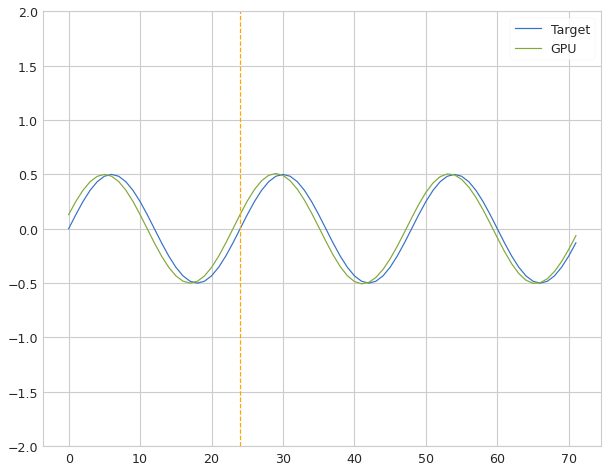

 Iter=30 a=0.979 sr=0.619 amp=0.086  ri=0.840 rr=0.572 loss=0.073349


Iter: 30 #### Diagnostic 0.073   Time 3.59  Best 0.073 NRMSE 0.073 CD 0.021
Iter: 31 #### Diagnostic 0.093   Time 3.43  Best 0.073 NRMSE 0.093 CD 0.034
Iter: 32 #### Diagnostic 0.092   Time 2.85  Best 0.073 NRMSE 0.092 CD 0.034
Iter: 33 #### Diagnostic 0.093   Time 2.60  Best 0.073 NRMSE 0.093 CD 0.035
Iter: 34 #### Diagnostic 0.090   Time 2.51  Best 0.073 NRMSE 0.090 CD 0.033
Iter: 35 #### Diagnostic 0.093   Time 1.83  Best 0.073 NRMSE 0.093 CD 0.035
Iter: 36 #### Diagnostic 0.092   Time 1.15  Best 0.073 NRMSE 0.092 CD 0.034
Iter: 37 #### Diagnostic 0.092   Time 1.76  Best 0.073 NRMSE 0.092 CD 0.034
Iter: 38 #### Diagnostic 0.092   Time 3.85  Best 0.073 NRMSE 0.092 CD 0.034
Iter: 39 #### Diagnostic 0.092   Time 4.86  Best 0.073 NRMSE 0.092 CD 0.034
Iter: 40 #### Diagnostic 0.093   Time 4.52  Best 0.073 NRMSE 0.093 CD 0.034
Iter: 41 #### Diagnostic 0.087   Time 2.68  Best 0.073 NRMSE 0.087 CD 0.030
Iter: 42 #### Dia

Iter: 26 #### Diagnostic 0.092   Time 2.59  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 27 #### Diagnostic 0.092   Time 3.50  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 28 #### Diagnostic 0.092   Time 3.06  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 29 #### Diagnostic 0.371   Time 2.34  Best 1000.000 NRMSE 0.371 CD 1.225
Iter: 30 #### Diagnostic 0.089   Time 1.96  Best 1000.000 NRMSE 0.089 CD 0.032
Iter: 31 #### Diagnostic 0.093   Time 2.35  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 32 #### Diagnostic 2.629   Time 2.04  Best 1000.000 NRMSE 2.629 CD 1.004
Iter: 33 #### Diagnostic 0.094   Time 1.31  Best 1000.000 NRMSE 0.094 CD 0.035
Iter: 34 #### Diagnostic 0.093   Time 2.00  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 35 #### Diagnostic 0.092   Time 3.90  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 36 #### Diagnostic 0.094   Time 3.19  Best 1000.000 NRMSE 0.094 CD 0.035
Iter: 37 #### Diagnostic 0.089   Time 2.37  Best 1000.000 NRMSE 0.089 CD 0.031
Iter: 38 #### Diagnostic 0.092   Time 1.82  Best 100

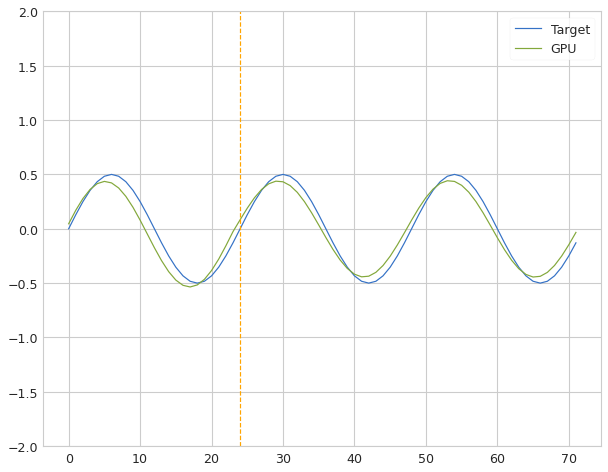

 Iter=56 a=0.143 sr=0.832 amp=0.984  ri=0.947 rr=0.372 loss=0.073154


Iter: 56 #### Diagnostic 0.073   Time 3.02  Best 0.073 NRMSE 0.073 CD 0.017
Iter: 57 #### Diagnostic 0.092   Time 1.61  Best 0.073 NRMSE 0.092 CD 0.034
Iter: 58 #### Diagnostic 0.094   Time 2.40  Best 0.073 NRMSE 0.094 CD 0.035
Iter: 59 #### Diagnostic 0.093   Time 1.51  Best 0.073 NRMSE 0.093 CD 0.035
Iter: 60 #### Diagnostic 0.092   Time 3.84  Best 0.073 NRMSE 0.092 CD 0.034
Iter: 61 #### Diagnostic 0.093   Time 4.24  Best 0.073 NRMSE 0.093 CD 0.034
Iter: 62 #### Diagnostic 0.084   Time 3.53  Best 0.073 NRMSE 0.084 CD 0.028
Iter: 63 #### Diagnostic 0.092   Time 2.33  Best 0.073 NRMSE 0.092 CD 0.034
Iter: 64 #### Diagnostic 0.092   Time 1.51  Best 0.073 NRMSE 0.092 CD 0.034
Iter: 65 #### Diagnostic 0.092   Time 2.18  Best 0.073 NRMSE 0.092 CD 0.034
Iter: 66 #### Diagnostic 0.093   Time 2.91  Best 0.073 NRMSE 0.093 CD 0.034
Iter: 67 #### Diagnostic 0.094   Time 1.40  Best 0.073 NRMSE 0.094 CD 0.035
Iter: 68 #### Dia

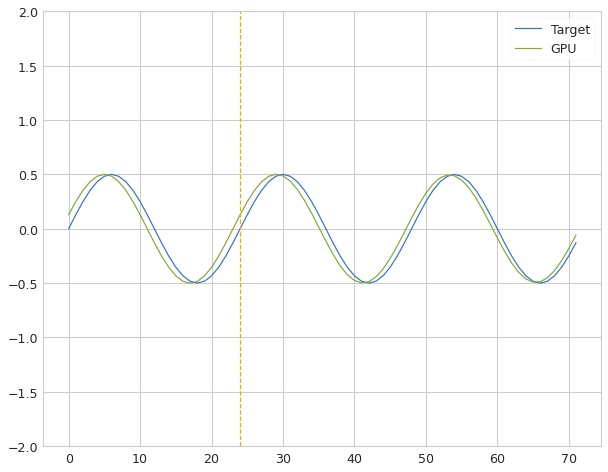

 Iter=28 a=0.837 sr=0.173 amp=0.262  ri=0.585 rr=3.430 loss=0.072060


Iter: 28 #### Diagnostic 0.072   Time 3.00  Best 0.072 NRMSE 0.072 CD 0.021
Iter: 29 #### Diagnostic 0.093   Time 3.62  Best 0.072 NRMSE 0.093 CD 0.035
Iter: 30 #### Diagnostic 0.093   Time 3.04  Best 0.072 NRMSE 0.093 CD 0.034
Iter: 31 #### Diagnostic 0.092   Time 2.54  Best 0.072 NRMSE 0.092 CD 0.034
Iter: 32 #### Diagnostic 3.102   Time 2.64  Best 0.072 NRMSE 3.102 CD 0.616
Iter: 33 #### Diagnostic 0.093   Time 3.26  Best 0.072 NRMSE 0.093 CD 0.034
Iter: 34 #### Diagnostic 0.092   Time 2.94  Best 0.072 NRMSE 0.092 CD 0.034
Iter: 35 #### Diagnostic 0.104   Time 2.31  Best 0.072 NRMSE 0.104 CD 0.039
Iter: 36 #### Diagnostic 0.093   Time 1.44  Best 0.072 NRMSE 0.093 CD 0.035
Iter: 37 #### Diagnostic 0.084   Time 1.79  Best 0.072 NRMSE 0.084 CD 0.028
Iter: 38 #### Diagnostic 0.093   Time 1.64  Best 0.072 NRMSE 0.093 CD 0.034
Iter: 39 #### Diagnostic 0.093   Time 2.68  Best 0.072 NRMSE 0.093 CD 0.035
Iter: 40 #### Dia

Iter: 32 #### Diagnostic 0.092   Time 3.26  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 33 #### Diagnostic 0.093   Time 2.42  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 34 #### Diagnostic 0.093   Time 2.72  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 35 #### Diagnostic 0.093   Time 2.76  Best 1000.000 NRMSE 0.093 CD 0.034


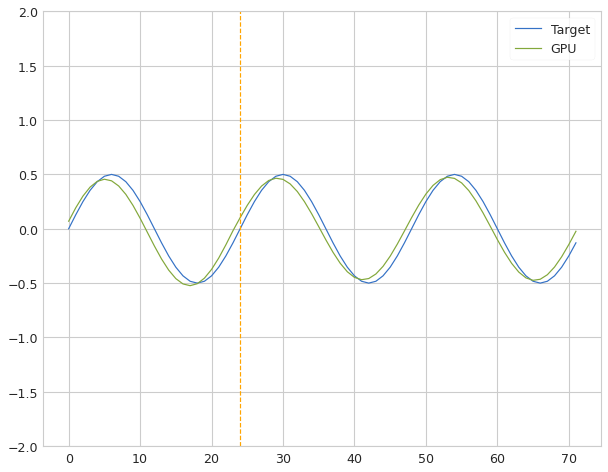

 Iter=36 a=0.440 sr=1.025 amp=0.969  ri=0.720 rr=2.051 loss=0.076753


Iter: 36 #### Diagnostic 0.077   Time 4.52  Best 0.077 NRMSE 0.077 CD 0.023
Iter: 37 #### Diagnostic 0.092   Time 1.68  Best 0.077 NRMSE 0.092 CD 0.034
Iter: 38 #### Diagnostic 0.092   Time 2.10  Best 0.077 NRMSE 0.092 CD 0.034
Iter: 39 #### Diagnostic 0.094   Time 2.01  Best 0.077 NRMSE 0.094 CD 0.035
Iter: 40 #### Diagnostic 0.092   Time 2.36  Best 0.077 NRMSE 0.092 CD 0.034
Iter: 41 #### Diagnostic 0.093   Time 2.37  Best 0.077 NRMSE 0.093 CD 0.034
Iter: 42 #### Diagnostic 0.092   Time 4.16  Best 0.077 NRMSE 0.092 CD 0.034
Iter: 43 #### Diagnostic 0.371   Time 3.00  Best 0.077 NRMSE 0.371 CD 1.146
Iter: 44 #### Diagnostic 0.092   Time 4.82  Best 0.077 NRMSE 0.092 CD 0.034
Iter: 45 #### Diagnostic 0.094   Time 2.52  Best 0.077 NRMSE 0.094 CD 0.036
Iter: 46 #### Diagnostic 0.092   Time 2.65  Best 0.077 NRMSE 0.092 CD 0.034
Iter: 47 #### Diagnostic 0.092   Time 2.24  Best 0.077 NRMSE 0.092 CD 0.034
Iter: 48 #### Dia

Iter: 40 #### Diagnostic 0.092   Time 3.07  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 41 #### Diagnostic 0.095   Time 6.09  Best 1000.000 NRMSE 0.095 CD 0.036
Iter: 42 #### Diagnostic 0.093   Time 4.17  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 43 #### Diagnostic 0.093   Time 2.73  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 44 #### Diagnostic 0.094   Time 2.76  Best 1000.000 NRMSE 0.094 CD 0.035
Iter: 45 #### Diagnostic 0.137   Time 2.99  Best 1000.000 NRMSE 0.137 CD 0.038
Iter: 46 #### Diagnostic 0.093   Time 2.44  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 47 #### Diagnostic 0.092   Time 3.02  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 48 #### Diagnostic 0.092   Time 3.80  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 49 #### Diagnostic 0.092   Time 4.44  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 50 #### Diagnostic 0.092   Time 2.97  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 51 #### Diagnostic 0.092   Time 2.39  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 52 #### Diagnostic 0.111   Time 2.08  Best 100

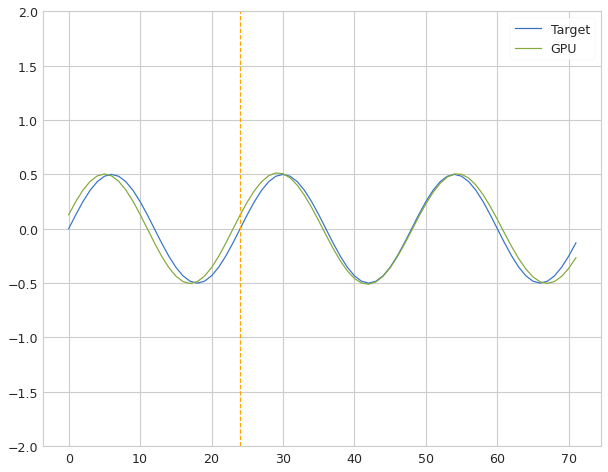

 Iter=67 a=0.901 sr=1.168 amp=0.195  ri=0.016 rr=2.257 loss=0.057951


Iter: 67 #### Diagnostic 0.058   Time 4.28  Best 0.058 NRMSE 0.058 CD 0.012
Iter: 68 #### Diagnostic 0.116   Time 2.50  Best 0.058 NRMSE 0.116 CD 0.035
Iter: 69 #### Diagnostic 0.094   Time 3.23  Best 0.058 NRMSE 0.094 CD 0.035
Iter: 70 #### Diagnostic 0.088   Time 2.54  Best 0.058 NRMSE 0.088 CD 0.031
Iter: 71 #### Diagnostic 0.092   Time 2.66  Best 0.058 NRMSE 0.092 CD 0.034
Iter: 72 #### Diagnostic 0.093   Time 1.88  Best 0.058 NRMSE 0.093 CD 0.034
Iter: 73 #### Diagnostic 0.099   Time 2.13  Best 0.058 NRMSE 0.099 CD 0.037
Iter: 74 #### Diagnostic 0.095   Time 1.62  Best 0.058 NRMSE 0.095 CD 0.036
Iter: 75 #### Diagnostic 0.097   Time 2.68  Best 0.058 NRMSE 0.097 CD 0.038
Iter: 76 #### Diagnostic 0.093   Time 2.03  Best 0.058 NRMSE 0.093 CD 0.034
Iter: 77 #### Diagnostic 0.092   Time 2.97  Best 0.058 NRMSE 0.092 CD 0.034
Iter: 78 #### Diagnostic 0.092   Time 3.07  Best 0.058 NRMSE 0.092 CD 0.034
Iter: 79 #### Dia

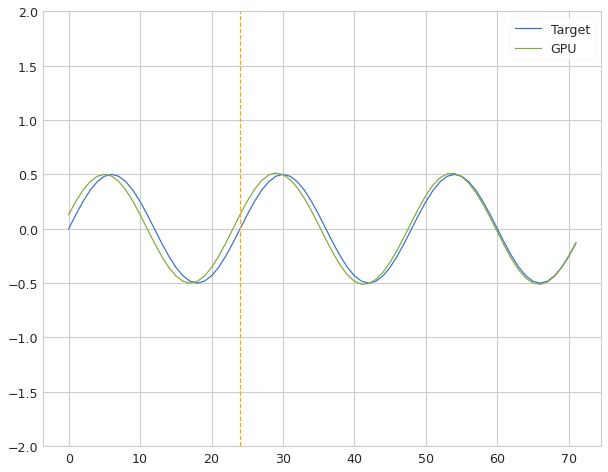

 Iter=30 a=0.979 sr=0.619 amp=0.086  ri=0.840 rr=0.572 loss=0.055868


Iter: 30 #### Diagnostic 0.056   Time 4.21  Best 0.056 NRMSE 0.056 CD 0.011
Iter: 31 #### Diagnostic 0.093   Time 1.80  Best 0.056 NRMSE 0.093 CD 0.034
Iter: 32 #### Diagnostic 0.093   Time 2.49  Best 0.056 NRMSE 0.093 CD 0.034
Iter: 33 #### Diagnostic 0.093   Time 1.37  Best 0.056 NRMSE 0.093 CD 0.034
Iter: 34 #### Diagnostic 0.095   Time 1.80  Best 0.056 NRMSE 0.095 CD 0.036
Iter: 35 #### Diagnostic 0.093   Time 2.58  Best 0.056 NRMSE 0.093 CD 0.035
Iter: 36 #### Diagnostic 0.092   Time 1.00  Best 0.056 NRMSE 0.092 CD 0.034
Iter: 37 #### Diagnostic 0.092   Time 1.17  Best 0.056 NRMSE 0.092 CD 0.034
Iter: 38 #### Diagnostic 0.092   Time 3.29  Best 0.056 NRMSE 0.092 CD 0.034
Iter: 39 #### Diagnostic 0.092   Time 2.58  Best 0.056 NRMSE 0.092 CD 0.034
Iter: 40 #### Diagnostic 0.092   Time 2.67  Best 0.056 NRMSE 0.092 CD 0.034
Iter: 41 #### Diagnostic 0.093   Time 3.07  Best 0.056 NRMSE 0.093 CD 0.034
Iter: 42 #### Dia

Iter: 26 #### Diagnostic 0.093   Time 1.92  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 27 #### Diagnostic 0.092   Time 1.59  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 28 #### Diagnostic 0.092   Time 2.97  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 29 #### Diagnostic 0.371   Time 2.84  Best 1000.000 NRMSE 0.371 CD 1.239
Iter: 30 #### Diagnostic 0.134   Time 3.44  Best 1000.000 NRMSE 0.134 CD 0.006
Iter: 31 #### Diagnostic 0.093   Time 2.59  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 32 #### Diagnostic 1.952   Time 2.24  Best 1000.000 NRMSE 1.952 CD 1.025
Iter: 33 #### Diagnostic 0.102   Time 2.20  Best 1000.000 NRMSE 0.102 CD 0.042
Iter: 34 #### Diagnostic 0.093   Time 2.07  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 35 #### Diagnostic 0.092   Time 2.38  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 36 #### Diagnostic 0.094   Time 2.28  Best 1000.000 NRMSE 0.094 CD 0.035
Iter: 37 #### Diagnostic 0.102   Time 3.73  Best 1000.000 NRMSE 0.102 CD 0.042
Iter: 38 #### Diagnostic 0.092   Time 2.87  Best 100

Iter: 28 #### Diagnostic 0.094   Time 1.34  Best 1000.000 NRMSE 0.094 CD 0.035
Iter: 29 #### Diagnostic 0.092   Time 1.73  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 30 #### Diagnostic 0.093   Time 2.32  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 31 #### Diagnostic 0.092   Time 2.56  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 32 #### Diagnostic 9.859   Time 2.38  Best 1000.000 NRMSE 9.859 CD 1.099
Iter: 33 #### Diagnostic 0.093   Time 2.71  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 34 #### Diagnostic 0.092   Time 3.30  Best 1000.000 NRMSE 0.092 CD 0.034


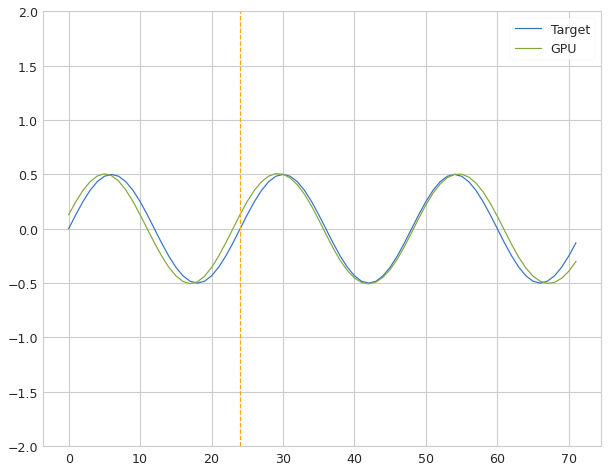

 Iter=35 a=0.982 sr=0.862 amp=0.092  ri=0.394 rr=3.226 loss=0.067209


Iter: 35 #### Diagnostic 0.067   Time 4.51  Best 0.067 NRMSE 0.067 CD 0.016
Iter: 36 #### Diagnostic 0.093   Time 1.67  Best 0.067 NRMSE 0.093 CD 0.035
Iter: 37 #### Diagnostic 0.090   Time 1.59  Best 0.067 NRMSE 0.090 CD 0.033
Iter: 38 #### Diagnostic 0.092   Time 1.69  Best 0.067 NRMSE 0.092 CD 0.034
Iter: 39 #### Diagnostic 0.092   Time 2.48  Best 0.067 NRMSE 0.092 CD 0.034
Iter: 40 #### Diagnostic 0.091   Time 2.63  Best 0.067 NRMSE 0.091 CD 0.033
Iter: 41 #### Diagnostic 0.093   Time 2.57  Best 0.067 NRMSE 0.093 CD 0.034
Iter: 42 #### Diagnostic 0.095   Time 2.76  Best 0.067 NRMSE 0.095 CD 0.036
Iter: 43 #### Diagnostic 0.094   Time 2.79  Best 0.067 NRMSE 0.094 CD 0.035
Iter: 44 #### Diagnostic 0.090   Time 2.46  Best 0.067 NRMSE 0.090 CD 0.033
Iter: 45 #### Diagnostic 0.086   Time 2.49  Best 0.067 NRMSE 0.086 CD 0.030
Iter: 46 #### Diagnostic 0.092   Time 1.87  Best 0.067 NRMSE 0.092 CD 0.034
Iter: 47 #### Dia

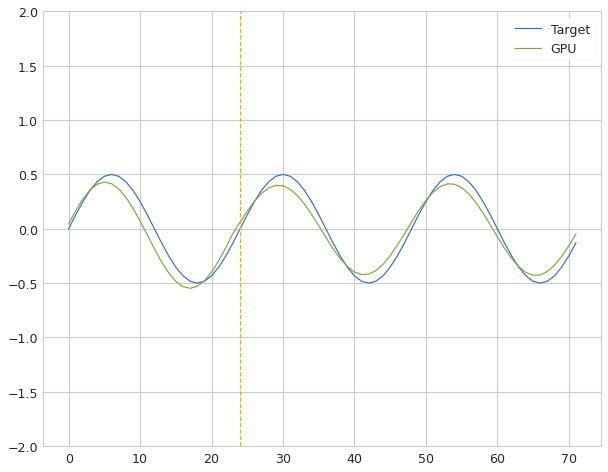

 Iter=36 a=0.440 sr=1.025 amp=0.969  ri=0.720 rr=2.051 loss=0.079671


Iter: 36 #### Diagnostic 0.080   Time 3.58  Best 0.080 NRMSE 0.080 CD 0.014
Iter: 37 #### Diagnostic 0.092   Time 2.49  Best 0.080 NRMSE 0.092 CD 0.034
Iter: 38 #### Diagnostic 0.092   Time 2.27  Best 0.080 NRMSE 0.092 CD 0.034
Iter: 39 #### Diagnostic 0.093   Time 1.47  Best 0.080 NRMSE 0.093 CD 0.035
Iter: 40 #### Diagnostic 0.092   Time 1.91  Best 0.080 NRMSE 0.092 CD 0.034
Iter: 41 #### Diagnostic 0.092   Time 3.30  Best 0.080 NRMSE 0.092 CD 0.034
Iter: 42 #### Diagnostic 0.093   Time 2.56  Best 0.080 NRMSE 0.093 CD 0.034
Iter: 43 #### Diagnostic 0.376   Time 1.81  Best 0.080 NRMSE 0.376 CD 1.067
Iter: 44 #### Diagnostic 0.092   Time 1.19  Best 0.080 NRMSE 0.092 CD 0.034
Iter: 45 #### Diagnostic 0.097   Time 1.68  Best 0.080 NRMSE 0.097 CD 0.038
Iter: 46 #### Diagnostic 0.093   Time 2.12  Best 0.080 NRMSE 0.093 CD 0.034
Iter: 47 #### Diagnostic 0.092   Time 1.59  Best 0.080 NRMSE 0.092 CD 0.034
Iter: 48 #### Dia

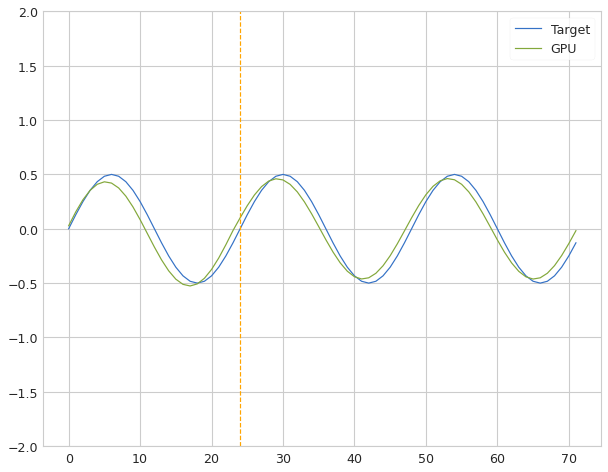

 Iter=28 a=0.182 sr=0.884 amp=0.772  ri=0.695 rr=1.763 loss=0.079624


Iter: 28 #### Diagnostic 0.080   Time 3.40  Best 0.080 NRMSE 0.080 CD 0.024
Iter: 29 #### Diagnostic 0.099   Time 2.35  Best 0.080 NRMSE 0.099 CD 0.039
Iter: 30 #### Diagnostic 0.094   Time 1.58  Best 0.080 NRMSE 0.094 CD 0.035
Iter: 31 #### Diagnostic 0.090   Time 1.13  Best 0.080 NRMSE 0.090 CD 0.033
Iter: 32 #### Diagnostic 0.092   Time 2.03  Best 0.080 NRMSE 0.092 CD 0.034
Iter: 33 #### Diagnostic 0.093   Time 2.62  Best 0.080 NRMSE 0.093 CD 0.034
Iter: 34 #### Diagnostic 0.094   Time 2.22  Best 0.080 NRMSE 0.094 CD 0.034
Iter: 35 #### Diagnostic 0.093   Time 1.56  Best 0.080 NRMSE 0.093 CD 0.034
Iter: 36 #### Diagnostic 1.800   Time 2.63  Best 0.080 NRMSE 1.800 CD 1.807


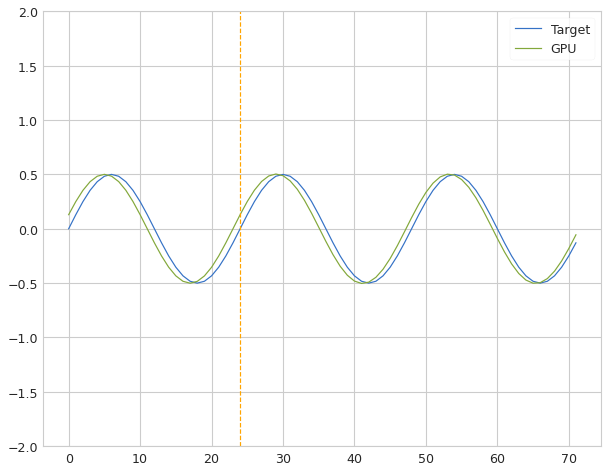

 Iter=37 a=0.953 sr=0.070 amp=0.298  ri=0.653 rr=4.602 loss=0.074001


Iter: 37 #### Diagnostic 0.074   Time 4.89  Best 0.074 NRMSE 0.074 CD 0.022
Iter: 38 #### Diagnostic 1.319   Time 4.40  Best 0.074 NRMSE 1.319 CD 0.025
Iter: 39 #### Diagnostic 0.092   Time 2.29  Best 0.074 NRMSE 0.092 CD 0.034
Iter: 40 #### Diagnostic 0.092   Time 1.57  Best 0.074 NRMSE 0.092 CD 0.034
Iter: 41 #### Diagnostic 0.094   Time 2.12  Best 0.074 NRMSE 0.094 CD 0.035
Iter: 42 #### Diagnostic 0.093   Time 2.19  Best 0.074 NRMSE 0.093 CD 0.035
Iter: 43 #### Diagnostic 0.093   Time 3.17  Best 0.074 NRMSE 0.093 CD 0.034
Iter: 44 #### Diagnostic 0.093   Time 2.94  Best 0.074 NRMSE 0.093 CD 0.035
Iter: 45 #### Diagnostic 0.088   Time 2.70  Best 0.074 NRMSE 0.088 CD 0.029
Iter: 46 #### Diagnostic 0.093   Time 2.83  Best 0.074 NRMSE 0.093 CD 0.035
Iter: 47 #### Diagnostic 0.094   Time 3.16  Best 0.074 NRMSE 0.094 CD 0.035
Iter: 48 #### Diagnostic 0.092   Time 2.50  Best 0.074 NRMSE 0.092 CD 0.034
Iter: 49 #### Dia

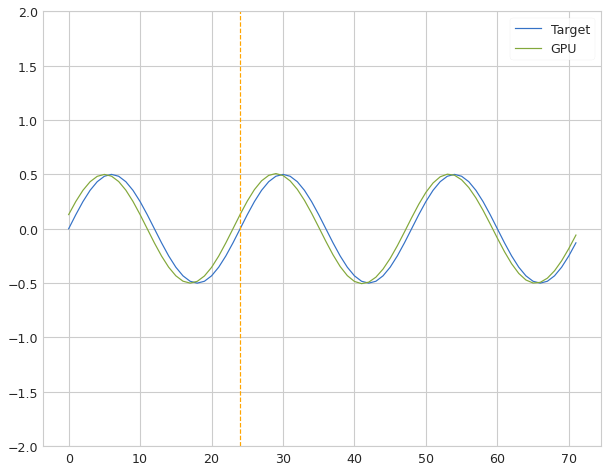

 Iter=30 a=0.979 sr=0.619 amp=0.086  ri=0.840 rr=0.572 loss=0.074690


Iter: 30 #### Diagnostic 0.075   Time 3.01  Best 0.075 NRMSE 0.075 CD 0.022
Iter: 31 #### Diagnostic 0.093   Time 2.16  Best 0.075 NRMSE 0.093 CD 0.034
Iter: 32 #### Diagnostic 0.092   Time 2.23  Best 0.075 NRMSE 0.092 CD 0.034
Iter: 33 #### Diagnostic 0.092   Time 1.89  Best 0.075 NRMSE 0.092 CD 0.034
Iter: 34 #### Diagnostic 0.092   Time 1.98  Best 0.075 NRMSE 0.092 CD 0.034
Iter: 35 #### Diagnostic 0.093   Time 2.42  Best 0.075 NRMSE 0.093 CD 0.035
Iter: 36 #### Diagnostic 0.092   Time 1.70  Best 0.075 NRMSE 0.092 CD 0.034
Iter: 37 #### Diagnostic 0.092   Time 1.30  Best 0.075 NRMSE 0.092 CD 0.034
Iter: 38 #### Diagnostic 0.092   Time 1.69  Best 0.075 NRMSE 0.092 CD 0.034
Iter: 39 #### Diagnostic 0.092   Time 2.24  Best 0.075 NRMSE 0.092 CD 0.034
Iter: 40 #### Diagnostic 0.092   Time 2.23  Best 0.075 NRMSE 0.092 CD 0.034
Iter: 41 #### Diagnostic 0.094   Time 1.89  Best 0.075 NRMSE 0.094 CD 0.035
Iter: 42 #### Dia

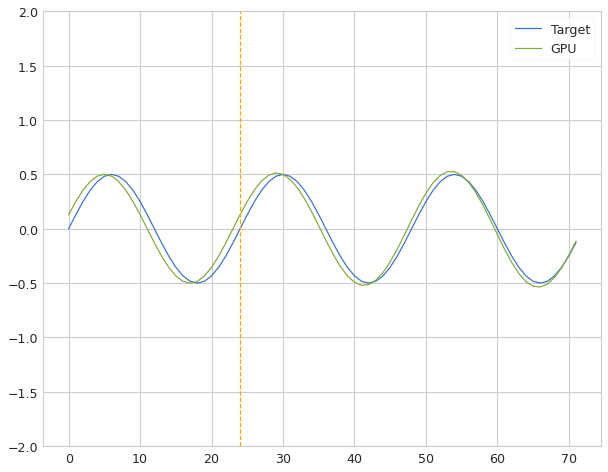

 Iter=65 a=0.943 sr=0.335 amp=0.079  ri=0.790 rr=0.476 loss=0.063429


Iter: 65 #### Diagnostic 0.063   Time 2.37  Best 0.063 NRMSE 0.063 CD 0.013
Iter: 66 #### Diagnostic 0.092   Time 2.37  Best 0.063 NRMSE 0.092 CD 0.034
Iter: 67 #### Diagnostic 0.092   Time 2.05  Best 0.063 NRMSE 0.092 CD 0.034
Iter: 68 #### Diagnostic 0.091   Time 1.32  Best 0.063 NRMSE 0.091 CD 0.033
Iter: 69 #### Diagnostic 0.093   Time 1.03  Best 0.063 NRMSE 0.093 CD 0.034
Iter: 70 #### Diagnostic 0.091   Time 1.34  Best 0.063 NRMSE 0.091 CD 0.034
Iter: 71 #### Diagnostic 0.092   Time 1.53  Best 0.063 NRMSE 0.092 CD 0.034
Iter: 72 #### Diagnostic 0.092   Time 1.93  Best 0.063 NRMSE 0.092 CD 0.034
Iter: 73 #### Diagnostic 0.093   Time 2.03  Best 0.063 NRMSE 0.093 CD 0.035
Iter: 74 #### Diagnostic 0.092   Time 2.48  Best 0.063 NRMSE 0.092 CD 0.034
Iter: 75 #### Diagnostic 2.508   Time 2.40  Best 0.063 NRMSE 2.508 CD 0.073
Iter: 76 #### Diagnostic 0.093   Time 1.54  Best 0.063 NRMSE 0.093 CD 0.035
Iter: 77 #### Dia

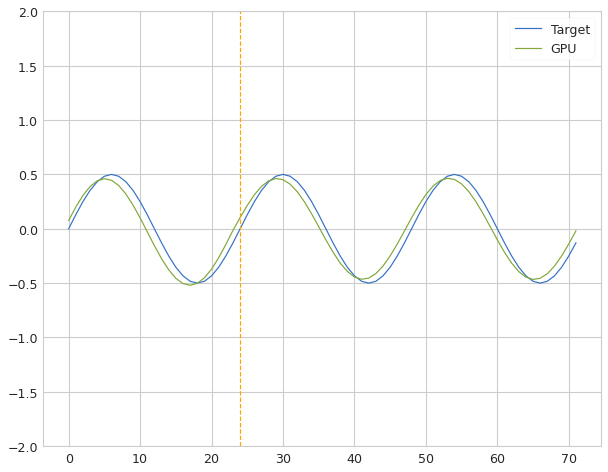

 Iter=56 a=0.143 sr=0.832 amp=0.984  ri=0.947 rr=0.372 loss=0.078942


Iter: 56 #### Diagnostic 0.079   Time 2.86  Best 0.079 NRMSE 0.079 CD 0.024
Iter: 57 #### Diagnostic 0.096   Time 2.81  Best 0.079 NRMSE 0.096 CD 0.037
Iter: 58 #### Diagnostic 0.094   Time 2.37  Best 0.079 NRMSE 0.094 CD 0.035
Iter: 59 #### Diagnostic 0.093   Time 2.31  Best 0.079 NRMSE 0.093 CD 0.034
Iter: 60 #### Diagnostic 0.092   Time 2.21  Best 0.079 NRMSE 0.092 CD 0.034
Iter: 61 #### Diagnostic 0.093   Time 1.22  Best 0.079 NRMSE 0.093 CD 0.035
Iter: 62 #### Diagnostic 0.095   Time 2.24  Best 0.079 NRMSE 0.095 CD 0.036
Iter: 63 #### Diagnostic 0.092   Time 0.79  Best 0.079 NRMSE 0.092 CD 0.034
Iter: 64 #### Diagnostic 0.092   Time 1.58  Best 0.079 NRMSE 0.092 CD 0.034
Iter: 65 #### Diagnostic 0.092   Time 1.74  Best 0.079 NRMSE 0.092 CD 0.034
Iter: 66 #### Diagnostic 0.093   Time 1.98  Best 0.079 NRMSE 0.093 CD 0.034
Iter: 67 #### Diagnostic 0.093   Time 1.64  Best 0.079 NRMSE 0.093 CD 0.035
Iter: 68 #### Dia

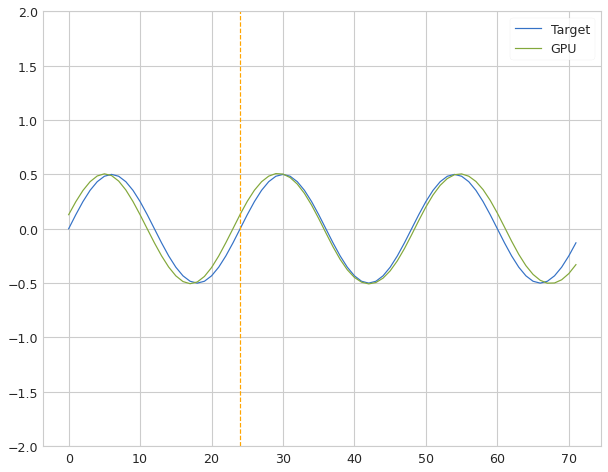

 Iter=35 a=0.982 sr=0.862 amp=0.092  ri=0.394 rr=3.226 loss=0.077874


Iter: 35 #### Diagnostic 0.078   Time 2.39  Best 0.078 NRMSE 0.078 CD 0.022
Iter: 36 #### Diagnostic 0.093   Time 2.46  Best 0.078 NRMSE 0.093 CD 0.035
Iter: 37 #### Diagnostic 0.087   Time 1.45  Best 0.078 NRMSE 0.087 CD 0.031
Iter: 38 #### Diagnostic 0.092   Time 1.94  Best 0.078 NRMSE 0.092 CD 0.034
Iter: 39 #### Diagnostic 0.092   Time 2.40  Best 0.078 NRMSE 0.092 CD 0.034
Iter: 40 #### Diagnostic 0.090   Time 2.35  Best 0.078 NRMSE 0.090 CD 0.032
Iter: 41 #### Diagnostic 0.093   Time 2.49  Best 0.078 NRMSE 0.093 CD 0.034
Iter: 42 #### Diagnostic 0.092   Time 2.24  Best 0.078 NRMSE 0.092 CD 0.034
Iter: 43 #### Diagnostic 0.094   Time 1.80  Best 0.078 NRMSE 0.094 CD 0.035
Iter: 44 #### Diagnostic 0.107   Time 2.29  Best 0.078 NRMSE 0.107 CD 0.047
Iter: 45 #### Diagnostic 0.094   Time 2.22  Best 0.078 NRMSE 0.094 CD 0.035
Iter: 46 #### Diagnostic 0.092   Time 1.83  Best 0.078 NRMSE 0.092 CD 0.034
Iter: 47 #### Dia

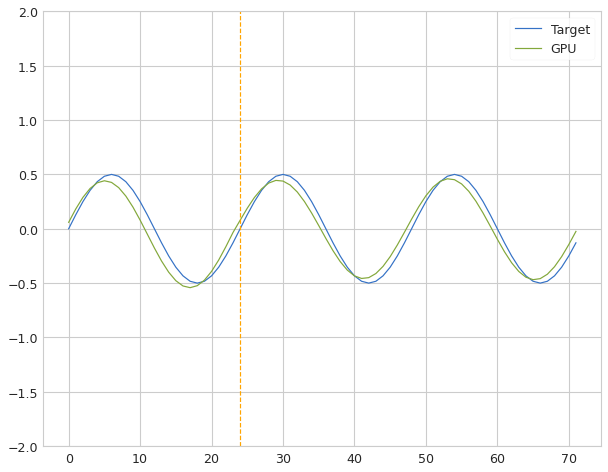

 Iter=73 a=0.213 sr=1.070 amp=0.925  ri=0.834 rr=1.647 loss=0.073035


Iter: 73 #### Diagnostic 0.073   Time 4.23  Best 0.073 NRMSE 0.073 CD 0.019
Iter: 74 #### Diagnostic 0.094   Time 2.06  Best 0.073 NRMSE 0.094 CD 0.035
Iter: 75 #### Diagnostic 0.093   Time 1.86  Best 0.073 NRMSE 0.093 CD 0.035
Iter: 76 #### Diagnostic 0.092   Time 2.56  Best 0.073 NRMSE 0.092 CD 0.034
Iter: 77 #### Diagnostic 0.093   Time 3.01  Best 0.073 NRMSE 0.093 CD 0.034
Iter: 78 #### Diagnostic 0.093   Time 2.20  Best 0.073 NRMSE 0.093 CD 0.034
Iter: 79 #### Diagnostic 0.171   Time 2.17  Best 0.073 NRMSE 0.171 CD 0.050
Iter: 80 #### Diagnostic 0.092   Time 1.96  Best 0.073 NRMSE 0.092 CD 0.034
Iter: 81 #### Diagnostic 0.087   Time 2.23  Best 0.073 NRMSE 0.087 CD 0.018
Iter: 82 #### Diagnostic 2.884   Time 2.23  Best 0.073 NRMSE 2.884 CD 0.265
Iter: 83 #### Diagnostic 0.092   Time 2.05  Best 0.073 NRMSE 0.092 CD 0.034
Iter: 84 #### Diagnostic 0.093   Time 1.32  Best 0.073 NRMSE 0.093 CD 0.035
Iter: 85 #### Dia

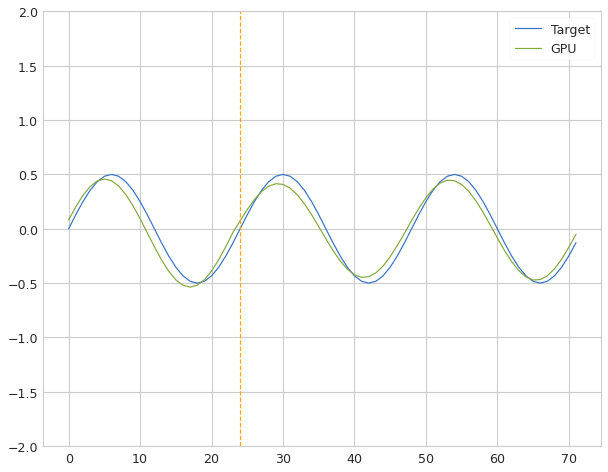

 Iter=64 a=0.608 sr=1.147 amp=0.883  ri=0.626 rr=3.353 loss=0.072365


Iter: 64 #### Diagnostic 0.072   Time 2.10  Best 0.072 NRMSE 0.072 CD 0.017
Iter: 65 #### Diagnostic 0.094   Time 2.41  Best 0.072 NRMSE 0.094 CD 0.035
Iter: 66 #### Diagnostic 5.258   Time 2.62  Best 0.072 NRMSE 5.258 CD 0.272
Iter: 67 #### Diagnostic 0.092   Time 2.00  Best 0.072 NRMSE 0.092 CD 0.034
Iter: 68 #### Diagnostic 0.093   Time 1.83  Best 0.072 NRMSE 0.093 CD 0.034
Iter: 69 #### Diagnostic 0.090   Time 2.06  Best 0.072 NRMSE 0.090 CD 0.032
Iter: 70 #### Diagnostic 0.095   Time 2.50  Best 0.072 NRMSE 0.095 CD 0.037
Iter: 71 #### Diagnostic 0.109   Time 2.59  Best 0.072 NRMSE 0.109 CD 0.048
Iter: 72 #### Diagnostic 0.085   Time 2.43  Best 0.072 NRMSE 0.085 CD 0.029
Iter: 73 #### Diagnostic 0.092   Time 2.06  Best 0.072 NRMSE 0.092 CD 0.034
Iter: 74 #### Diagnostic 0.092   Time 1.94  Best 0.072 NRMSE 0.092 CD 0.034
Iter: 75 #### Diagnostic 0.093   Time 1.77  Best 0.072 NRMSE 0.093 CD 0.034
Iter: 76 #### Dia

Iter: 66 #### Diagnostic 0.092   Time 2.08  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 67 #### Diagnostic 0.114   Time 1.87  Best 1000.000 NRMSE 0.114 CD 0.043
Iter: 68 #### Diagnostic 0.178   Time 1.08  Best 1000.000 NRMSE 0.178 CD 0.088
Iter: 69 #### Diagnostic 0.093   Time 1.15  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 70 #### Diagnostic 0.089   Time 1.07  Best 1000.000 NRMSE 0.089 CD 0.031
Iter: 71 #### Diagnostic 0.092   Time 2.03  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 72 #### Diagnostic 0.094   Time 1.95  Best 1000.000 NRMSE 0.094 CD 0.035
Iter: 73 #### Diagnostic 0.165   Time 2.08  Best 1000.000 NRMSE 0.165 CD 0.016
Iter: 74 #### Diagnostic 0.092   Time 2.42  Best 1000.000 NRMSE 0.092 CD 0.033
Iter: 75 #### Diagnostic 0.094   Time 2.34  Best 1000.000 NRMSE 0.094 CD 0.035
Iter: 76 #### Diagnostic 0.093   Time 1.56  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 77 #### Diagnostic 0.092   Time 2.15  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 78 #### Diagnostic 0.092   Time 2.15  Best 100

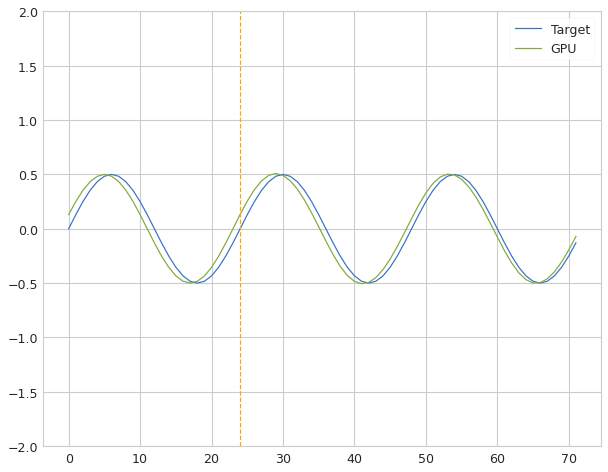

 Iter=30 a=0.979 sr=0.619 amp=0.086  ri=0.840 rr=0.572 loss=0.070695


Iter: 30 #### Diagnostic 0.071   Time 2.82  Best 0.071 NRMSE 0.071 CD 0.020
Iter: 31 #### Diagnostic 0.093   Time 2.94  Best 0.071 NRMSE 0.093 CD 0.034
Iter: 32 #### Diagnostic 0.092   Time 1.83  Best 0.071 NRMSE 0.092 CD 0.034
Iter: 33 #### Diagnostic 0.093   Time 1.77  Best 0.071 NRMSE 0.093 CD 0.034
Iter: 34 #### Diagnostic 0.088   Time 1.45  Best 0.071 NRMSE 0.088 CD 0.031
Iter: 35 #### Diagnostic 0.093   Time 2.02  Best 0.071 NRMSE 0.093 CD 0.034
Iter: 36 #### Diagnostic 0.092   Time 2.41  Best 0.071 NRMSE 0.092 CD 0.034
Iter: 37 #### Diagnostic 0.092   Time 2.51  Best 0.071 NRMSE 0.092 CD 0.034
Iter: 38 #### Diagnostic 0.092   Time 2.37  Best 0.071 NRMSE 0.092 CD 0.034
Iter: 39 #### Diagnostic 0.092   Time 2.45  Best 0.071 NRMSE 0.092 CD 0.034
Iter: 40 #### Diagnostic 0.093   Time 2.41  Best 0.071 NRMSE 0.093 CD 0.034
Iter: 41 #### Diagnostic 0.098   Time 2.08  Best 0.071 NRMSE 0.098 CD 0.038
Iter: 42 #### Dia

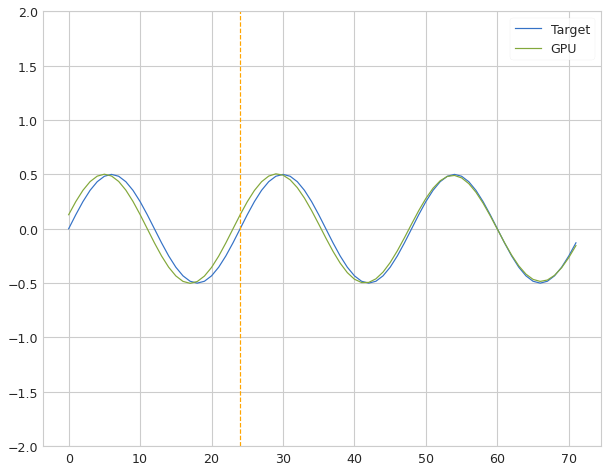

 Iter=65 a=0.943 sr=0.335 amp=0.079  ri=0.790 rr=0.476 loss=0.048198


Iter: 65 #### Diagnostic 0.048   Time 3.13  Best 0.048 NRMSE 0.048 CD 0.009
Iter: 66 #### Diagnostic 0.093   Time 2.57  Best 0.048 NRMSE 0.093 CD 0.035
Iter: 67 #### Diagnostic 0.093   Time 2.31  Best 0.048 NRMSE 0.093 CD 0.034
Iter: 68 #### Diagnostic 0.092   Time 2.64  Best 0.048 NRMSE 0.092 CD 0.034
Iter: 69 #### Diagnostic 0.093   Time 2.40  Best 0.048 NRMSE 0.093 CD 0.034
Iter: 70 #### Diagnostic 0.091   Time 2.43  Best 0.048 NRMSE 0.091 CD 0.034
Iter: 71 #### Diagnostic 0.092   Time 1.95  Best 0.048 NRMSE 0.092 CD 0.034
Iter: 72 #### Diagnostic 0.093   Time 1.52  Best 0.048 NRMSE 0.093 CD 0.035
Iter: 73 #### Diagnostic 0.093   Time 3.23  Best 0.048 NRMSE 0.093 CD 0.035
Iter: 74 #### Diagnostic 0.092   Time 2.93  Best 0.048 NRMSE 0.092 CD 0.034
Iter: 75 #### Diagnostic 1.222   Time 3.19  Best 0.048 NRMSE 1.222 CD 1.952
Iter: 76 #### Diagnostic 0.093   Time 2.00  Best 0.048 NRMSE 0.093 CD 0.035
Iter: 77 #### Dia

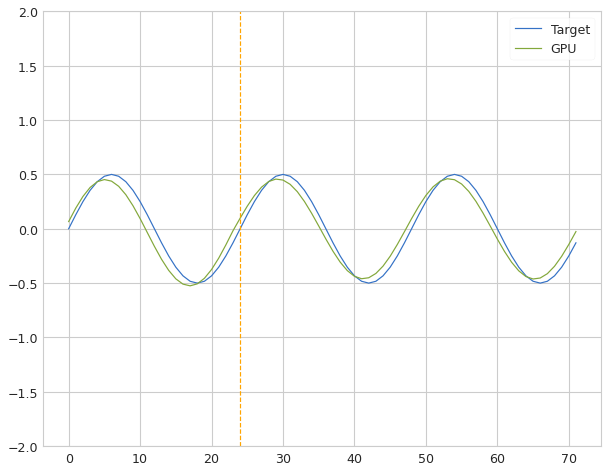

 Iter=56 a=0.143 sr=0.832 amp=0.984  ri=0.947 rr=0.372 loss=0.075129


Iter: 56 #### Diagnostic 0.075   Time 2.20  Best 0.075 NRMSE 0.075 CD 0.021
Iter: 57 #### Diagnostic 0.096   Time 2.73  Best 0.075 NRMSE 0.096 CD 0.037
Iter: 58 #### Diagnostic 0.094   Time 1.94  Best 0.075 NRMSE 0.094 CD 0.035
Iter: 59 #### Diagnostic 0.093   Time 2.33  Best 0.075 NRMSE 0.093 CD 0.034
Iter: 60 #### Diagnostic 0.092   Time 1.46  Best 0.075 NRMSE 0.092 CD 0.034
Iter: 61 #### Diagnostic 0.093   Time 2.48  Best 0.075 NRMSE 0.093 CD 0.035
Iter: 62 #### Diagnostic 0.091   Time 1.65  Best 0.075 NRMSE 0.091 CD 0.033
Iter: 63 #### Diagnostic 0.092   Time 2.98  Best 0.075 NRMSE 0.092 CD 0.034
Iter: 64 #### Diagnostic 0.092   Time 2.87  Best 0.075 NRMSE 0.092 CD 0.034
Iter: 65 #### Diagnostic 0.093   Time 2.55  Best 0.075 NRMSE 0.093 CD 0.034
Iter: 66 #### Diagnostic 0.092   Time 2.13  Best 0.075 NRMSE 0.092 CD 0.034
Iter: 67 #### Diagnostic 0.094   Time 1.71  Best 0.075 NRMSE 0.094 CD 0.035
Iter: 68 #### Dia

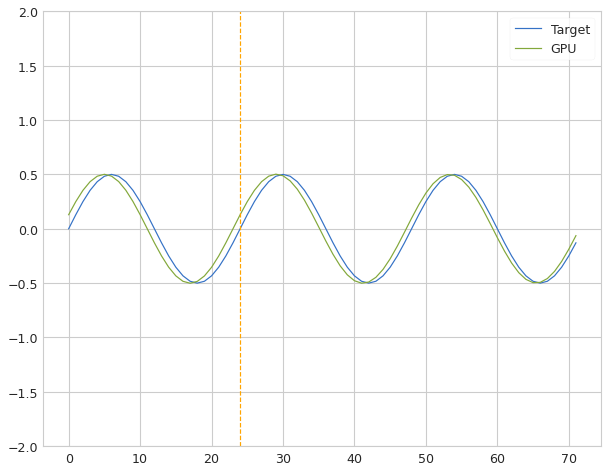

 Iter=28 a=0.837 sr=0.173 amp=0.262  ri=0.585 rr=3.430 loss=0.070902


Iter: 28 #### Diagnostic 0.071   Time 3.31  Best 0.071 NRMSE 0.071 CD 0.020
Iter: 29 #### Diagnostic 0.092   Time 0.99  Best 0.071 NRMSE 0.092 CD 0.034
Iter: 30 #### Diagnostic 0.093   Time 1.21  Best 0.071 NRMSE 0.093 CD 0.035
Iter: 31 #### Diagnostic 0.091   Time 1.44  Best 0.071 NRMSE 0.091 CD 0.033
Iter: 32 #### Diagnostic 2.530   Time 2.09  Best 0.071 NRMSE 2.530 CD 0.304
Iter: 33 #### Diagnostic 0.092   Time 2.00  Best 0.071 NRMSE 0.092 CD 0.034
Iter: 34 #### Diagnostic 0.092   Time 1.53  Best 0.071 NRMSE 0.092 CD 0.034


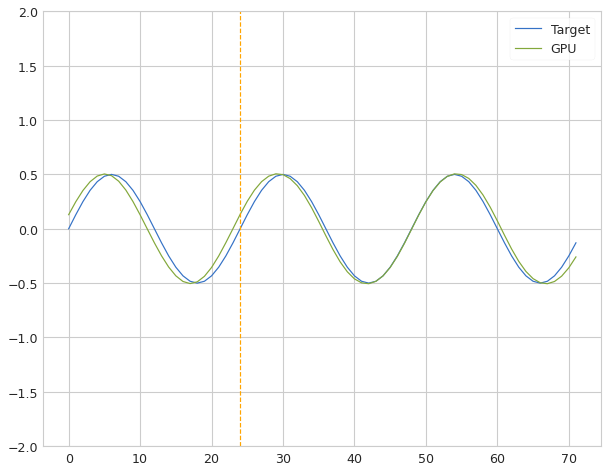

 Iter=35 a=0.982 sr=0.862 amp=0.092  ri=0.394 rr=3.226 loss=0.055493


Iter: 35 #### Diagnostic 0.055   Time 2.21  Best 0.055 NRMSE 0.055 CD 0.011
Iter: 36 #### Diagnostic 0.093   Time 1.96  Best 0.055 NRMSE 0.093 CD 0.035
Iter: 37 #### Diagnostic 0.096   Time 2.91  Best 0.055 NRMSE 0.096 CD 0.036
Iter: 38 #### Diagnostic 0.092   Time 2.95  Best 0.055 NRMSE 0.092 CD 0.034
Iter: 39 #### Diagnostic 0.093   Time 2.72  Best 0.055 NRMSE 0.093 CD 0.034
Iter: 40 #### Diagnostic 0.092   Time 2.23  Best 0.055 NRMSE 0.092 CD 0.033
Iter: 41 #### Diagnostic 0.092   Time 1.51  Best 0.055 NRMSE 0.092 CD 0.034
Iter: 42 #### Diagnostic 0.094   Time 2.34  Best 0.055 NRMSE 0.094 CD 0.035
Iter: 43 #### Diagnostic 0.094   Time 1.64  Best 0.055 NRMSE 0.094 CD 0.035
Iter: 44 #### Diagnostic 0.096   Time 2.22  Best 0.055 NRMSE 0.096 CD 0.037
Iter: 45 #### Diagnostic 0.097   Time 2.02  Best 0.055 NRMSE 0.097 CD 0.038
Iter: 46 #### Diagnostic 0.092   Time 2.30  Best 0.055 NRMSE 0.092 CD 0.034
Iter: 47 #### Dia

Iter: 39 #### Diagnostic 0.093   Time 1.93  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 40 #### Diagnostic 0.092   Time 3.20  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 41 #### Diagnostic 0.092   Time 2.98  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 42 #### Diagnostic 0.093   Time 2.42  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 43 #### Diagnostic 0.371   Time 2.81  Best 1000.000 NRMSE 0.371 CD 1.122
Iter: 44 #### Diagnostic 0.092   Time 2.09  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 45 #### Diagnostic 0.090   Time 1.96  Best 1000.000 NRMSE 0.090 CD 0.032
Iter: 46 #### Diagnostic 0.089   Time 1.92  Best 1000.000 NRMSE 0.089 CD 0.031
Iter: 47 #### Diagnostic 0.092   Time 2.70  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 48 #### Diagnostic 0.149   Time 1.87  Best 1000.000 NRMSE 0.149 CD 0.002
Iter: 49 #### Diagnostic 0.093   Time 2.19  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 50 #### Diagnostic 0.129   Time 2.49  Best 1000.000 NRMSE 0.129 CD 0.045
Iter: 51 #### Diagnostic 0.093   Time 2.17  Best 100

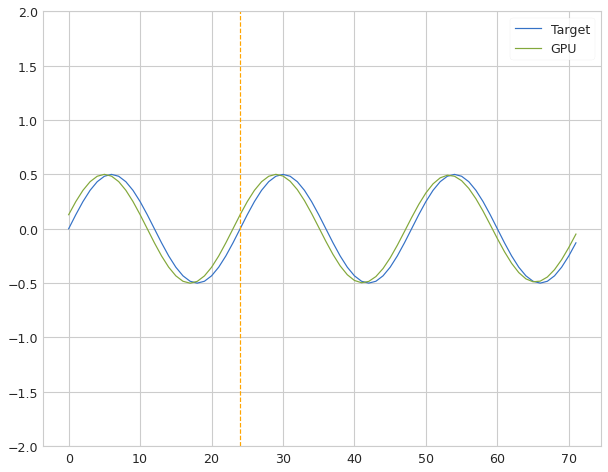

 Iter=37 a=0.953 sr=0.070 amp=0.298  ri=0.653 rr=4.602 loss=0.075157


Iter: 37 #### Diagnostic 0.075   Time 3.49  Best 0.075 NRMSE 0.075 CD 0.023
Iter: 38 #### Diagnostic 3.797   Time 1.68  Best 0.075 NRMSE 3.797 CD 1.786
Iter: 39 #### Diagnostic 0.092   Time 2.11  Best 0.075 NRMSE 0.092 CD 0.034
Iter: 40 #### Diagnostic 0.092   Time 2.08  Best 0.075 NRMSE 0.092 CD 0.034
Iter: 41 #### Diagnostic 0.096   Time 1.94  Best 0.075 NRMSE 0.096 CD 0.037
Iter: 42 #### Diagnostic 0.093   Time 1.98  Best 0.075 NRMSE 0.093 CD 0.035
Iter: 43 #### Diagnostic 0.093   Time 1.75  Best 0.075 NRMSE 0.093 CD 0.034
Iter: 44 #### Diagnostic 0.092   Time 1.89  Best 0.075 NRMSE 0.092 CD 0.034
Iter: 45 #### Diagnostic 0.092   Time 2.34  Best 0.075 NRMSE 0.092 CD 0.034
Iter: 46 #### Diagnostic 0.092   Time 2.94  Best 0.075 NRMSE 0.092 CD 0.034
Iter: 47 #### Diagnostic 0.091   Time 2.22  Best 0.075 NRMSE 0.091 CD 0.033
Iter: 48 #### Diagnostic 0.092   Time 1.62  Best 0.075 NRMSE 0.092 CD 0.034
Iter: 49 #### Dia

Iter: 40 #### Diagnostic 0.092   Time 2.06  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 41 #### Diagnostic 0.092   Time 2.13  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 42 #### Diagnostic 0.093   Time 1.88  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 43 #### Diagnostic 0.340   Time 1.99  Best 1000.000 NRMSE 0.340 CD 0.684
Iter: 44 #### Diagnostic 0.093   Time 2.61  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 45 #### Diagnostic 0.092   Time 2.06  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 46 #### Diagnostic 0.116   Time 2.41  Best 1000.000 NRMSE 0.116 CD 0.033
Iter: 47 #### Diagnostic 0.096   Time 1.60  Best 1000.000 NRMSE 0.096 CD 0.037
Iter: 48 #### Diagnostic 0.093   Time 1.90  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 49 #### Diagnostic 0.092   Time 1.77  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 50 #### Diagnostic 0.092   Time 2.13  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 51 #### Diagnostic 8.367   Time 1.70  Best 1000.000 NRMSE 8.367 CD 0.050
Iter: 52 #### Diagnostic 1.787   Time 2.96  Best 100

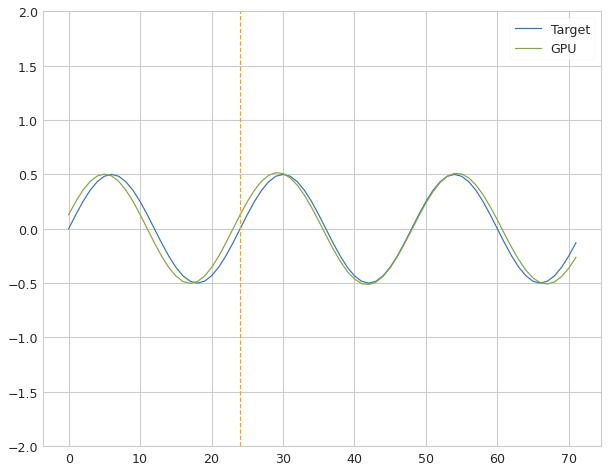

 Iter=65 a=0.943 sr=0.335 amp=0.079  ri=0.790 rr=0.476 loss=0.057504


Iter: 65 #### Diagnostic 0.058   Time 2.22  Best 0.058 NRMSE 0.058 CD 0.012
Iter: 66 #### Diagnostic 0.092   Time 1.51  Best 0.058 NRMSE 0.092 CD 0.034
Iter: 67 #### Diagnostic 0.092   Time 1.32  Best 0.058 NRMSE 0.092 CD 0.034
Iter: 68 #### Diagnostic 0.092   Time 1.16  Best 0.058 NRMSE 0.092 CD 0.034
Iter: 69 #### Diagnostic 0.093   Time 1.85  Best 0.058 NRMSE 0.093 CD 0.034
Iter: 70 #### Diagnostic 0.092   Time 2.48  Best 0.058 NRMSE 0.092 CD 0.034
Iter: 71 #### Diagnostic 0.092   Time 2.83  Best 0.058 NRMSE 0.092 CD 0.034
Iter: 72 #### Diagnostic 0.092   Time 2.44  Best 0.058 NRMSE 0.092 CD 0.034
Iter: 73 #### Diagnostic 0.093   Time 2.08  Best 0.058 NRMSE 0.093 CD 0.035
Iter: 74 #### Diagnostic 0.092   Time 1.27  Best 0.058 NRMSE 0.092 CD 0.034
Iter: 75 #### Diagnostic 0.863   Time 1.22  Best 0.058 NRMSE 0.863 CD 0.148
Iter: 76 #### Diagnostic 0.093   Time 2.21  Best 0.058 NRMSE 0.093 CD 0.035
Iter: 77 #### Dia

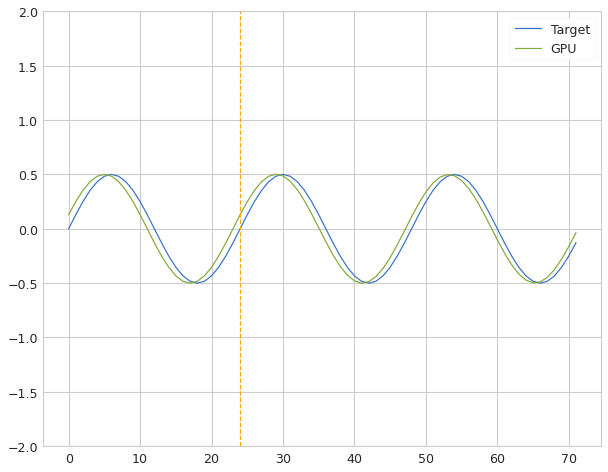

 Iter=17 a=0.924 sr=0.889 amp=0.320  ri=0.025 rr=4.308 loss=0.079458


Iter: 17 #### Diagnostic 0.079   Time 3.96  Best 0.079 NRMSE 0.079 CD 0.025
Iter: 18 #### Diagnostic 0.093   Time 2.55  Best 0.079 NRMSE 0.093 CD 0.034
Iter: 19 #### Diagnostic 0.090   Time 2.26  Best 0.079 NRMSE 0.090 CD 0.033
Iter: 20 #### Diagnostic 0.096   Time 1.54  Best 0.079 NRMSE 0.096 CD 0.036
Iter: 21 #### Diagnostic 0.092   Time 1.86  Best 0.079 NRMSE 0.092 CD 0.034
Iter: 22 #### Diagnostic 0.092   Time 2.22  Best 0.079 NRMSE 0.092 CD 0.034
Iter: 23 #### Diagnostic 0.092   Time 1.74  Best 0.079 NRMSE 0.092 CD 0.034
Iter: 24 #### Diagnostic 0.094   Time 2.28  Best 0.079 NRMSE 0.094 CD 0.035
Iter: 25 #### Diagnostic 0.093   Time 2.19  Best 0.079 NRMSE 0.093 CD 0.034
Iter: 26 #### Diagnostic 0.093   Time 2.54  Best 0.079 NRMSE 0.093 CD 0.034
Iter: 27 #### Diagnostic 0.092   Time 2.90  Best 0.079 NRMSE 0.092 CD 0.034
Iter: 28 #### Diagnostic 0.092   Time 2.40  Best 0.079 NRMSE 0.092 CD 0.034
Iter: 29 #### Dia

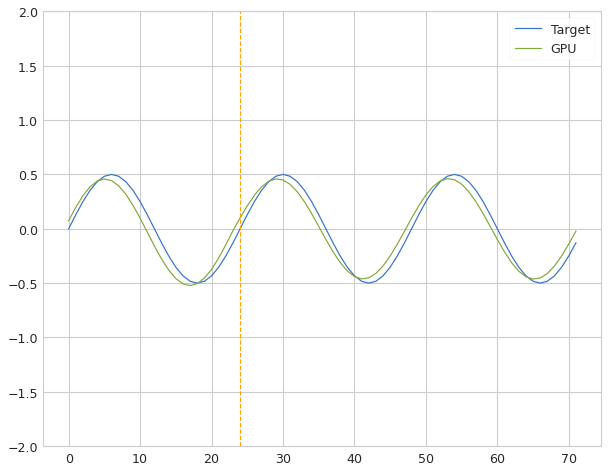

 Iter=56 a=0.143 sr=0.832 amp=0.984  ri=0.947 rr=0.372 loss=0.077621


Iter: 56 #### Diagnostic 0.078   Time 2.44  Best 0.078 NRMSE 0.078 CD 0.023
Iter: 57 #### Diagnostic 0.097   Time 2.35  Best 0.078 NRMSE 0.097 CD 0.037
Iter: 58 #### Diagnostic 0.093   Time 2.04  Best 0.078 NRMSE 0.093 CD 0.035
Iter: 59 #### Diagnostic 0.093   Time 2.09  Best 0.078 NRMSE 0.093 CD 0.034
Iter: 60 #### Diagnostic 0.092   Time 1.98  Best 0.078 NRMSE 0.092 CD 0.034
Iter: 61 #### Diagnostic 0.093   Time 2.14  Best 0.078 NRMSE 0.093 CD 0.034
Iter: 62 #### Diagnostic 0.105   Time 2.10  Best 0.078 NRMSE 0.105 CD 0.045
Iter: 63 #### Diagnostic 0.092   Time 2.09  Best 0.078 NRMSE 0.092 CD 0.034
Iter: 64 #### Diagnostic 0.093   Time 1.61  Best 0.078 NRMSE 0.093 CD 0.034
Iter: 65 #### Diagnostic 0.092   Time 2.44  Best 0.078 NRMSE 0.092 CD 0.034
Iter: 66 #### Diagnostic 0.093   Time 1.70  Best 0.078 NRMSE 0.093 CD 0.035
Iter: 67 #### Diagnostic 0.094   Time 2.15  Best 0.078 NRMSE 0.094 CD 0.035
Iter: 68 #### Dia

Iter: 59 #### Diagnostic 0.092   Time 2.18  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 60 #### Diagnostic 0.092   Time 2.20  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 61 #### Diagnostic 0.093   Time 1.63  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 62 #### Diagnostic 0.093   Time 0.97  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 63 #### Diagnostic 0.093   Time 2.07  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 64 #### Diagnostic 0.095   Time 1.84  Best 1000.000 NRMSE 0.095 CD 0.036
Iter: 65 #### Diagnostic 0.092   Time 1.79  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 66 #### Diagnostic 0.092   Time 1.92  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 67 #### Diagnostic 0.093   Time 1.91  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 68 #### Diagnostic 0.092   Time 2.77  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 69 #### Diagnostic 0.092   Time 1.71  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 70 #### Diagnostic 0.092   Time 1.88  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 71 #### Diagnostic 0.092   Time 1.89  Best 100

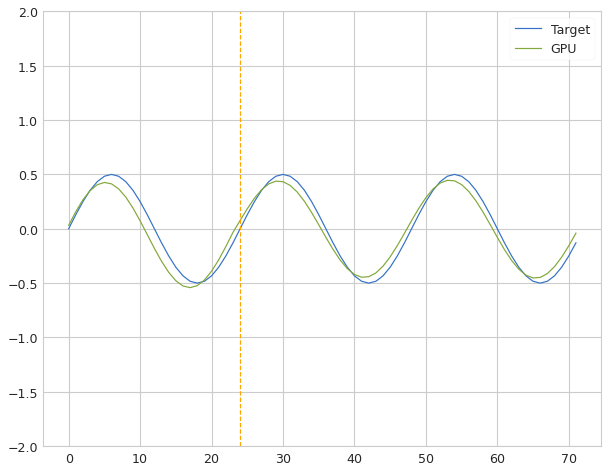

 Iter=73 a=0.213 sr=1.070 amp=0.925  ri=0.834 rr=1.647 loss=0.068853


Iter: 73 #### Diagnostic 0.069   Time 1.76  Best 0.069 NRMSE 0.069 CD 0.015
Iter: 74 #### Diagnostic 0.093   Time 1.54  Best 0.069 NRMSE 0.093 CD 0.035
Iter: 75 #### Diagnostic 0.093   Time 1.82  Best 0.069 NRMSE 0.093 CD 0.034
Iter: 76 #### Diagnostic 0.093   Time 1.72  Best 0.069 NRMSE 0.093 CD 0.035
Iter: 77 #### Diagnostic 0.093   Time 1.46  Best 0.069 NRMSE 0.093 CD 0.034
Iter: 78 #### Diagnostic 0.092   Time 2.58  Best 0.069 NRMSE 0.092 CD 0.034
Iter: 79 #### Diagnostic 0.569   Time 2.56  Best 0.069 NRMSE 0.569 CD 0.072
Iter: 80 #### Diagnostic 0.092   Time 2.76  Best 0.069 NRMSE 0.092 CD 0.034
Iter: 81 #### Diagnostic 0.098   Time 2.59  Best 0.069 NRMSE 0.098 CD 0.003
Iter: 82 #### Diagnostic 2.733   Time 1.85  Best 0.069 NRMSE 2.733 CD 0.182
Iter: 83 #### Diagnostic 0.092   Time 1.33  Best 0.069 NRMSE 0.092 CD 0.034
Iter: 84 #### Diagnostic 0.092   Time 1.50  Best 0.069 NRMSE 0.092 CD 0.034
Iter: 85 #### Dia

Iter: 75 #### Diagnostic 0.093   Time 2.21  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 76 #### Diagnostic 0.090   Time 2.75  Best 1000.000 NRMSE 0.090 CD 0.033
Iter: 77 #### Diagnostic 0.093   Time 2.82  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 78 #### Diagnostic 0.092   Time 2.05  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 79 #### Diagnostic 0.092   Time 1.86  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 80 #### Diagnostic 0.092   Time 1.46  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 81 #### Diagnostic 0.094   Time 2.00  Best 1000.000 NRMSE 0.094 CD 0.035
Iter: 82 #### Diagnostic 0.161   Time 2.06  Best 1000.000 NRMSE 0.161 CD 0.001
Iter: 83 #### Diagnostic 0.093   Time 2.42  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 84 #### Diagnostic 0.093   Time 2.19  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 85 #### Diagnostic 0.106   Time 1.84  Best 1000.000 NRMSE 0.106 CD 0.044
Iter: 86 #### Diagnostic 0.092   Time 1.18  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 87 #### Diagnostic 0.092   Time 2.05  Best 100

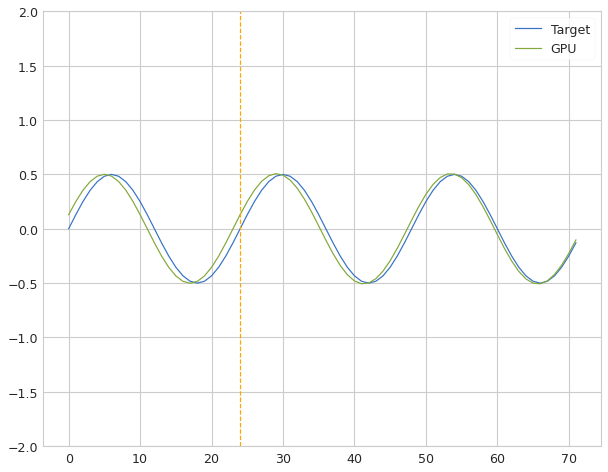

 Iter=37 a=0.953 sr=0.070 amp=0.298  ri=0.653 rr=4.602 loss=0.060869


Iter: 37 #### Diagnostic 0.061   Time 2.90  Best 0.061 NRMSE 0.061 CD 0.014
Iter: 38 #### Diagnostic 0.678   Time 1.86  Best 0.061 NRMSE 0.678 CD 0.049
Iter: 39 #### Diagnostic 0.093   Time 1.84  Best 0.061 NRMSE 0.093 CD 0.035
Iter: 40 #### Diagnostic 0.092   Time 1.64  Best 0.061 NRMSE 0.092 CD 0.034
Iter: 41 #### Diagnostic 0.092   Time 1.85  Best 0.061 NRMSE 0.092 CD 0.034
Iter: 42 #### Diagnostic 0.093   Time 2.40  Best 0.061 NRMSE 0.093 CD 0.035
Iter: 43 #### Diagnostic 0.093   Time 2.31  Best 0.061 NRMSE 0.093 CD 0.034
Iter: 44 #### Diagnostic 0.094   Time 1.87  Best 0.061 NRMSE 0.094 CD 0.035
Iter: 45 #### Diagnostic 0.091   Time 1.86  Best 0.061 NRMSE 0.091 CD 0.034
Iter: 46 #### Diagnostic 0.092   Time 2.03  Best 0.061 NRMSE 0.092 CD 0.034
Iter: 47 #### Diagnostic 0.093   Time 2.43  Best 0.061 NRMSE 0.093 CD 0.035
Iter: 48 #### Diagnostic 0.092   Time 2.15  Best 0.061 NRMSE 0.092 CD 0.034
Iter: 49 #### Dia

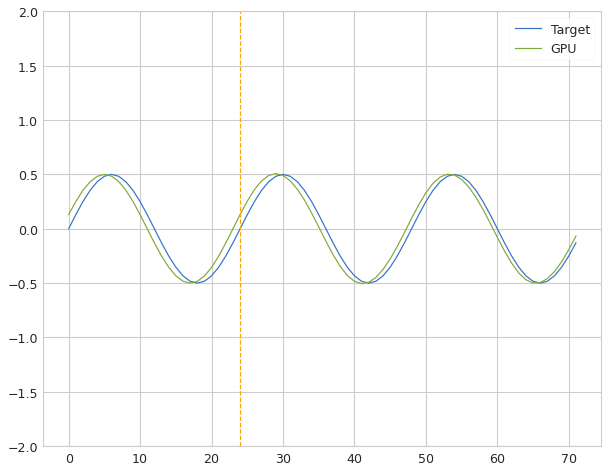

 Iter=30 a=0.979 sr=0.619 amp=0.086  ri=0.840 rr=0.572 loss=0.071604


Iter: 30 #### Diagnostic 0.072   Time 1.76  Best 0.072 NRMSE 0.072 CD 0.020
Iter: 31 #### Diagnostic 0.093   Time 2.82  Best 0.072 NRMSE 0.093 CD 0.034
Iter: 32 #### Diagnostic 0.092   Time 2.31  Best 0.072 NRMSE 0.092 CD 0.034
Iter: 33 #### Diagnostic 0.092   Time 2.46  Best 0.072 NRMSE 0.092 CD 0.034
Iter: 34 #### Diagnostic 0.093   Time 2.32  Best 0.072 NRMSE 0.093 CD 0.034
Iter: 35 #### Diagnostic 0.093   Time 1.53  Best 0.072 NRMSE 0.093 CD 0.035
Iter: 36 #### Diagnostic 0.092   Time 0.96  Best 0.072 NRMSE 0.092 CD 0.034
Iter: 37 #### Diagnostic 0.093   Time 1.95  Best 0.072 NRMSE 0.093 CD 0.034
Iter: 38 #### Diagnostic 0.092   Time 1.40  Best 0.072 NRMSE 0.092 CD 0.034
Iter: 39 #### Diagnostic 0.092   Time 1.69  Best 0.072 NRMSE 0.092 CD 0.034
Iter: 40 #### Diagnostic 0.092   Time 1.48  Best 0.072 NRMSE 0.092 CD 0.034
Iter: 41 #### Diagnostic 0.095   Time 1.46  Best 0.072 NRMSE 0.095 CD 0.036
Iter: 42 #### Dia

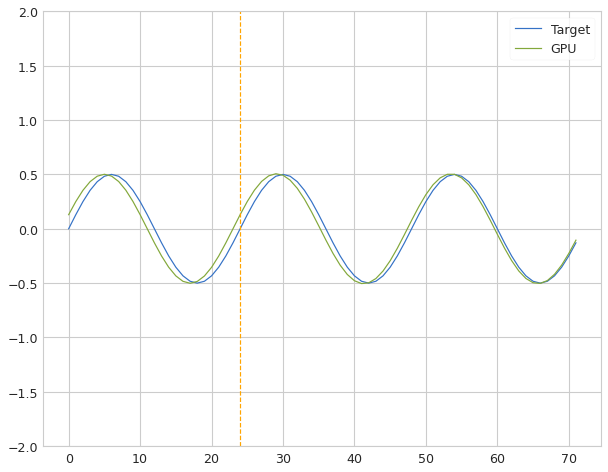

 Iter=65 a=0.943 sr=0.335 amp=0.079  ri=0.790 rr=0.476 loss=0.060006


Iter: 65 #### Diagnostic 0.060   Time 2.60  Best 0.060 NRMSE 0.060 CD 0.014
Iter: 66 #### Diagnostic 0.093   Time 3.37  Best 0.060 NRMSE 0.093 CD 0.035
Iter: 67 #### Diagnostic 0.093   Time 2.42  Best 0.060 NRMSE 0.093 CD 0.034
Iter: 68 #### Diagnostic 0.091   Time 2.33  Best 0.060 NRMSE 0.091 CD 0.034
Iter: 69 #### Diagnostic 0.093   Time 2.16  Best 0.060 NRMSE 0.093 CD 0.034
Iter: 70 #### Diagnostic 0.093   Time 1.76  Best 0.060 NRMSE 0.093 CD 0.035
Iter: 71 #### Diagnostic 0.092   Time 1.97  Best 0.060 NRMSE 0.092 CD 0.034
Iter: 72 #### Diagnostic 0.092   Time 2.43  Best 0.060 NRMSE 0.092 CD 0.034
Iter: 73 #### Diagnostic 0.093   Time 1.80  Best 0.060 NRMSE 0.093 CD 0.035
Iter: 74 #### Diagnostic 0.092   Time 0.75  Best 0.060 NRMSE 0.092 CD 0.034
Iter: 75 #### Diagnostic 2.728   Time 0.76  Best 0.060 NRMSE 2.728 CD 0.066
Iter: 76 #### Diagnostic 0.093   Time 0.61  Best 0.060 NRMSE 0.093 CD 0.035
Iter: 77 #### Dia

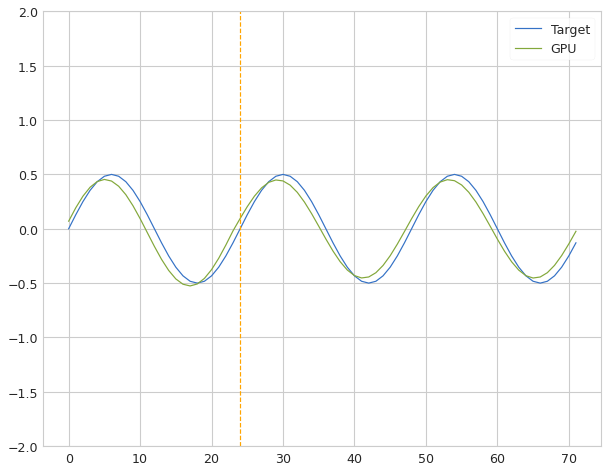

 Iter=56 a=0.143 sr=0.832 amp=0.984  ri=0.947 rr=0.372 loss=0.077787


Iter: 56 #### Diagnostic 0.078   Time 2.86  Best 0.078 NRMSE 0.078 CD 0.022
Iter: 57 #### Diagnostic 0.093   Time 1.24  Best 0.078 NRMSE 0.093 CD 0.035
Iter: 58 #### Diagnostic 0.094   Time 2.21  Best 0.078 NRMSE 0.094 CD 0.035
Iter: 59 #### Diagnostic 0.093   Time 2.01  Best 0.078 NRMSE 0.093 CD 0.034
Iter: 60 #### Diagnostic 0.093   Time 0.93  Best 0.078 NRMSE 0.093 CD 0.034
Iter: 61 #### Diagnostic 0.093   Time 2.29  Best 0.078 NRMSE 0.093 CD 0.035
Iter: 62 #### Diagnostic 0.096   Time 2.39  Best 0.078 NRMSE 0.096 CD 0.037
Iter: 63 #### Diagnostic 0.092   Time 2.05  Best 0.078 NRMSE 0.092 CD 0.034
Iter: 64 #### Diagnostic 0.092   Time 1.83  Best 0.078 NRMSE 0.092 CD 0.034
Iter: 65 #### Diagnostic 0.092   Time 2.14  Best 0.078 NRMSE 0.092 CD 0.034
Iter: 66 #### Diagnostic 0.092   Time 1.41  Best 0.078 NRMSE 0.092 CD 0.034
Iter: 67 #### Diagnostic 0.094   Time 1.76  Best 0.078 NRMSE 0.094 CD 0.035
Iter: 68 #### Dia

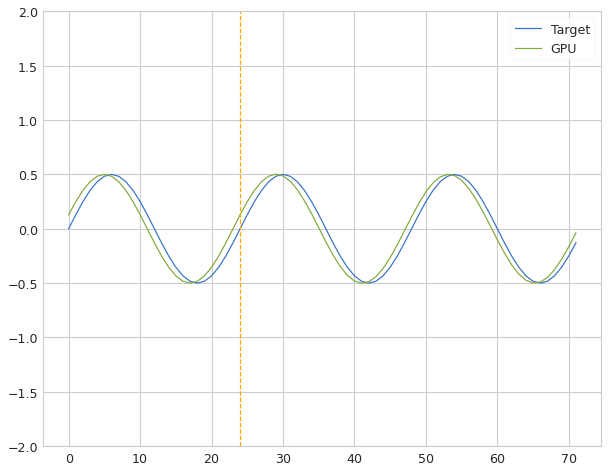

 Iter=28 a=0.837 sr=0.173 amp=0.262  ri=0.585 rr=3.430 loss=0.079335


Iter: 28 #### Diagnostic 0.079   Time 2.39  Best 0.079 NRMSE 0.079 CD 0.025
Iter: 29 #### Diagnostic 0.093   Time 1.46  Best 0.079 NRMSE 0.093 CD 0.035
Iter: 30 #### Diagnostic 0.093   Time 1.82  Best 0.079 NRMSE 0.093 CD 0.034
Iter: 31 #### Diagnostic 0.091   Time 1.91  Best 0.079 NRMSE 0.091 CD 0.033
Iter: 32 #### Diagnostic 0.517   Time 2.18  Best 0.079 NRMSE 0.517 CD 1.661
Iter: 33 #### Diagnostic 0.093   Time 1.66  Best 0.079 NRMSE 0.093 CD 0.034
Iter: 34 #### Diagnostic 0.092   Time 2.08  Best 0.079 NRMSE 0.092 CD 0.034


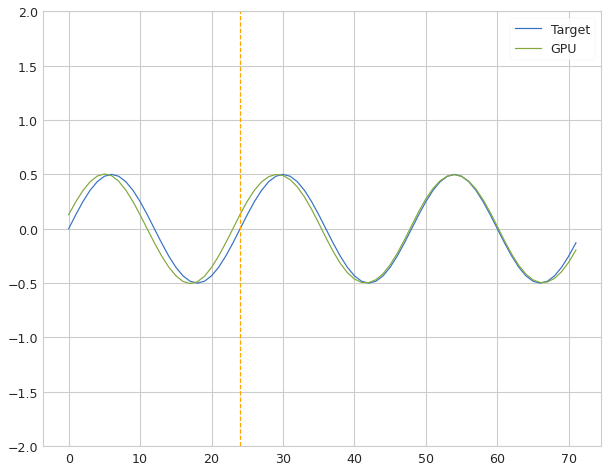

 Iter=35 a=0.982 sr=0.862 amp=0.092  ri=0.394 rr=3.226 loss=0.047599


Iter: 35 #### Diagnostic 0.048   Time 2.48  Best 0.048 NRMSE 0.048 CD 0.009
Iter: 36 #### Diagnostic 0.093   Time 1.63  Best 0.048 NRMSE 0.093 CD 0.035
Iter: 37 #### Diagnostic 0.080   Time 1.94  Best 0.048 NRMSE 0.080 CD 0.025
Iter: 38 #### Diagnostic 0.092   Time 1.59  Best 0.048 NRMSE 0.092 CD 0.034
Iter: 39 #### Diagnostic 0.093   Time 1.31  Best 0.048 NRMSE 0.093 CD 0.034
Iter: 40 #### Diagnostic 0.093   Time 2.13  Best 0.048 NRMSE 0.093 CD 0.034
Iter: 41 #### Diagnostic 0.092   Time 1.97  Best 0.048 NRMSE 0.092 CD 0.034
Iter: 42 #### Diagnostic 0.099   Time 2.12  Best 0.048 NRMSE 0.099 CD 0.039
Iter: 43 #### Diagnostic 0.094   Time 2.21  Best 0.048 NRMSE 0.094 CD 0.035
Iter: 44 #### Diagnostic 0.086   Time 1.71  Best 0.048 NRMSE 0.086 CD 0.030
Iter: 45 #### Diagnostic 0.089   Time 1.72  Best 0.048 NRMSE 0.089 CD 0.032
Iter: 46 #### Diagnostic 0.092   Time 1.90  Best 0.048 NRMSE 0.092 CD 0.034
Iter: 47 #### Dia

Iter: 39 #### Diagnostic 0.080   Time 1.27  Best 1000.000 NRMSE 0.080 CD 0.026
Iter: 40 #### Diagnostic 0.092   Time 1.44  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 41 #### Diagnostic 0.092   Time 1.50  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 42 #### Diagnostic 0.093   Time 1.52  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 43 #### Diagnostic 0.370   Time 1.76  Best 1000.000 NRMSE 0.370 CD 1.148
Iter: 44 #### Diagnostic 0.093   Time 1.78  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 45 #### Diagnostic 0.087   Time 2.16  Best 1000.000 NRMSE 0.087 CD 0.030
Iter: 46 #### Diagnostic 0.096   Time 2.35  Best 1000.000 NRMSE 0.096 CD 0.037
Iter: 47 #### Diagnostic 0.092   Time 2.48  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 48 #### Diagnostic 0.092   Time 2.15  Best 1000.000 NRMSE 0.092 CD 0.021
Iter: 49 #### Diagnostic 0.093   Time 2.86  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 50 #### Diagnostic 0.102   Time 1.41  Best 1000.000 NRMSE 0.102 CD 0.038
Iter: 51 #### Diagnostic 0.092   Time 1.68  Best 100

Iter: 41 #### Diagnostic 0.090   Time 2.04  Best 1000.000 NRMSE 0.090 CD 0.032
Iter: 42 #### Diagnostic 0.093   Time 1.56  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 43 #### Diagnostic 0.093   Time 1.72  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 44 #### Diagnostic 0.093   Time 1.69  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 45 #### Diagnostic 0.116   Time 2.19  Best 1000.000 NRMSE 0.116 CD 0.039
Iter: 46 #### Diagnostic 0.093   Time 1.60  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 47 #### Diagnostic 0.093   Time 2.51  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 48 #### Diagnostic 0.092   Time 2.27  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 49 #### Diagnostic 0.092   Time 2.44  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 50 #### Diagnostic 0.092   Time 1.83  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 51 #### Diagnostic 0.092   Time 1.74  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 52 #### Diagnostic 0.089   Time 2.10  Best 1000.000 NRMSE 0.089 CD 0.032
Iter: 53 #### Diagnostic 0.092   Time 2.28  Best 100

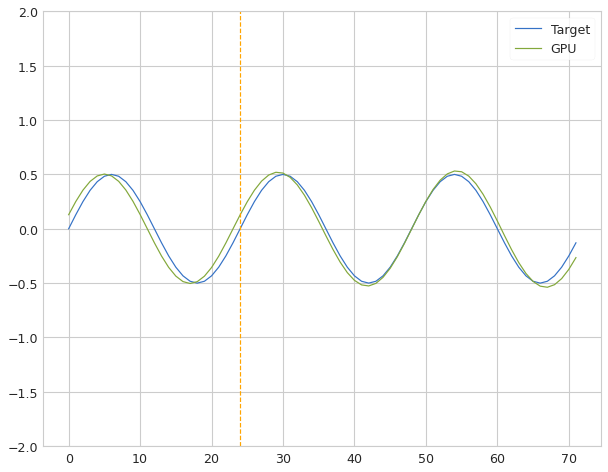

 Iter=67 a=0.901 sr=1.168 amp=0.195  ri=0.016 rr=2.257 loss=0.059789


Iter: 67 #### Diagnostic 0.060   Time 2.71  Best 0.060 NRMSE 0.060 CD 0.010
Iter: 68 #### Diagnostic 0.134   Time 1.52  Best 0.060 NRMSE 0.134 CD 0.030
Iter: 69 #### Diagnostic 0.096   Time 1.30  Best 0.060 NRMSE 0.096 CD 0.036
Iter: 70 #### Diagnostic 0.092   Time 1.94  Best 0.060 NRMSE 0.092 CD 0.034
Iter: 71 #### Diagnostic 0.093   Time 1.96  Best 0.060 NRMSE 0.093 CD 0.035
Iter: 72 #### Diagnostic 0.095   Time 1.74  Best 0.060 NRMSE 0.095 CD 0.036
Iter: 73 #### Diagnostic 0.090   Time 2.22  Best 0.060 NRMSE 0.090 CD 0.032
Iter: 74 #### Diagnostic 0.094   Time 2.00  Best 0.060 NRMSE 0.094 CD 0.035
Iter: 75 #### Diagnostic 0.092   Time 2.77  Best 0.060 NRMSE 0.092 CD 0.034
Iter: 76 #### Diagnostic 0.093   Time 2.56  Best 0.060 NRMSE 0.093 CD 0.034
Iter: 77 #### Diagnostic 0.092   Time 2.57  Best 0.060 NRMSE 0.092 CD 0.034
Iter: 78 #### Diagnostic 0.094   Time 1.84  Best 0.060 NRMSE 0.094 CD 0.035
Iter: 79 #### Dia

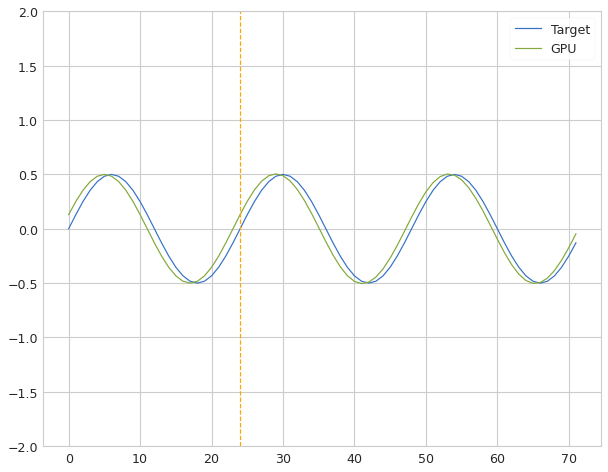

 Iter=23 a=0.917 sr=0.451 amp=0.216  ri=0.727 rr=0.181 loss=0.077602


Iter: 23 #### Diagnostic 0.078   Time 2.42  Best 0.078 NRMSE 0.078 CD 0.024
Iter: 24 #### Diagnostic 0.094   Time 2.09  Best 0.078 NRMSE 0.094 CD 0.035
Iter: 25 #### Diagnostic 0.092   Time 1.38  Best 0.078 NRMSE 0.092 CD 0.034
Iter: 26 #### Diagnostic 0.093   Time 1.74  Best 0.078 NRMSE 0.093 CD 0.034
Iter: 27 #### Diagnostic 0.093   Time 1.44  Best 0.078 NRMSE 0.093 CD 0.035
Iter: 28 #### Diagnostic 0.092   Time 2.45  Best 0.078 NRMSE 0.092 CD 0.034
Iter: 29 #### Diagnostic 0.094   Time 1.90  Best 0.078 NRMSE 0.094 CD 0.035


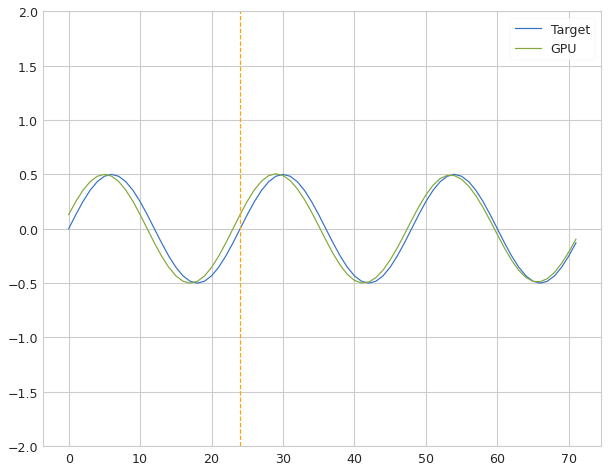

 Iter=30 a=0.979 sr=0.619 amp=0.086  ri=0.840 rr=0.572 loss=0.062151


Iter: 30 #### Diagnostic 0.062   Time 3.45  Best 0.062 NRMSE 0.062 CD 0.015
Iter: 31 #### Diagnostic 0.093   Time 2.56  Best 0.062 NRMSE 0.093 CD 0.034
Iter: 32 #### Diagnostic 0.093   Time 2.14  Best 0.062 NRMSE 0.093 CD 0.034
Iter: 33 #### Diagnostic 0.092   Time 1.93  Best 0.062 NRMSE 0.092 CD 0.034
Iter: 34 #### Diagnostic 0.095   Time 1.85  Best 0.062 NRMSE 0.095 CD 0.036
Iter: 35 #### Diagnostic 0.093   Time 1.18  Best 0.062 NRMSE 0.093 CD 0.035
Iter: 36 #### Diagnostic 0.092   Time 0.62  Best 0.062 NRMSE 0.092 CD 0.034
Iter: 37 #### Diagnostic 0.092   Time 0.96  Best 0.062 NRMSE 0.092 CD 0.034
Iter: 38 #### Diagnostic 0.092   Time 1.75  Best 0.062 NRMSE 0.092 CD 0.034
Iter: 39 #### Diagnostic 0.092   Time 2.49  Best 0.062 NRMSE 0.092 CD 0.034
Iter: 40 #### Diagnostic 0.092   Time 2.14  Best 0.062 NRMSE 0.092 CD 0.034
Iter: 41 #### Diagnostic 0.093   Time 2.18  Best 0.062 NRMSE 0.093 CD 0.034
Iter: 42 #### Dia

Iter: 26 #### Diagnostic 0.093   Time 1.87  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 27 #### Diagnostic 0.092   Time 1.95  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 28 #### Diagnostic 0.092   Time 1.85  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 29 #### Diagnostic 0.400   Time 1.04  Best 1000.000 NRMSE 0.400 CD 1.279
Iter: 30 #### Diagnostic 0.094   Time 0.52  Best 1000.000 NRMSE 0.094 CD 0.035
Iter: 31 #### Diagnostic 0.093   Time 0.48  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 32 #### Diagnostic 1.293   Time 0.54  Best 1000.000 NRMSE 1.293 CD 0.999
Iter: 33 #### Diagnostic 0.094   Time 0.84  Best 1000.000 NRMSE 0.094 CD 0.035
Iter: 34 #### Diagnostic 0.093   Time 1.22  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 35 #### Diagnostic 0.092   Time 1.55  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 36 #### Diagnostic 0.091   Time 1.90  Best 1000.000 NRMSE 0.091 CD 0.033
Iter: 37 #### Diagnostic 0.091   Time 1.68  Best 1000.000 NRMSE 0.091 CD 0.033
Iter: 38 #### Diagnostic 0.092   Time 1.65  Best 100

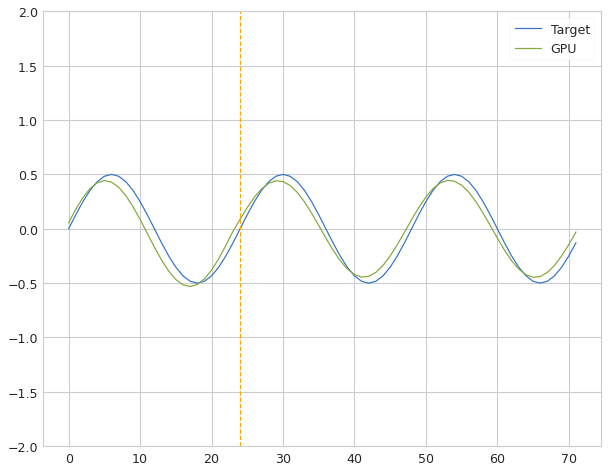

 Iter=56 a=0.143 sr=0.832 amp=0.984  ri=0.947 rr=0.372 loss=0.074741


Iter: 56 #### Diagnostic 0.075   Time 2.38  Best 0.075 NRMSE 0.075 CD 0.018
Iter: 57 #### Diagnostic 0.091   Time 1.37  Best 0.075 NRMSE 0.091 CD 0.033
Iter: 58 #### Diagnostic 0.094   Time 0.85  Best 0.075 NRMSE 0.094 CD 0.035
Iter: 59 #### Diagnostic 0.093   Time 1.15  Best 0.075 NRMSE 0.093 CD 0.034
Iter: 60 #### Diagnostic 0.092   Time 1.56  Best 0.075 NRMSE 0.092 CD 0.034
Iter: 61 #### Diagnostic 0.093   Time 1.70  Best 0.075 NRMSE 0.093 CD 0.035
Iter: 62 #### Diagnostic 0.091   Time 1.64  Best 0.075 NRMSE 0.091 CD 0.033
Iter: 63 #### Diagnostic 0.092   Time 1.57  Best 0.075 NRMSE 0.092 CD 0.034
Iter: 64 #### Diagnostic 0.092   Time 1.80  Best 0.075 NRMSE 0.092 CD 0.034
Iter: 65 #### Diagnostic 0.092   Time 2.24  Best 0.075 NRMSE 0.092 CD 0.034
Iter: 66 #### Diagnostic 0.092   Time 1.87  Best 0.075 NRMSE 0.092 CD 0.034
Iter: 67 #### Diagnostic 0.093   Time 1.85  Best 0.075 NRMSE 0.093 CD 0.035
Iter: 68 #### Dia

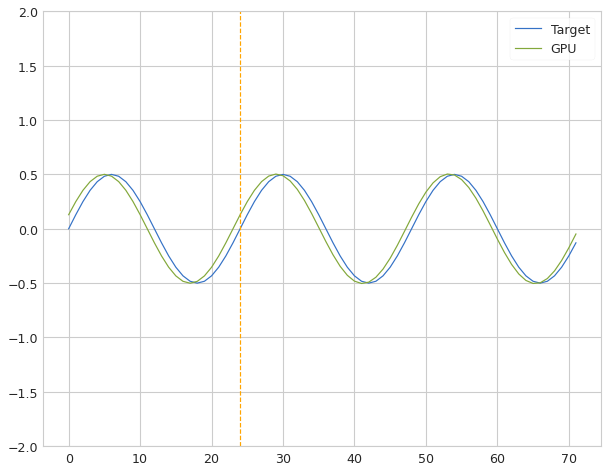

 Iter=22 a=0.715 sr=0.107 amp=0.159  ri=0.672 rr=2.005 loss=0.076052


Iter: 22 #### Diagnostic 0.076   Time 1.87  Best 0.076 NRMSE 0.076 CD 0.023
Iter: 23 #### Diagnostic 0.093   Time 1.84  Best 0.076 NRMSE 0.093 CD 0.034
Iter: 24 #### Diagnostic 0.091   Time 1.81  Best 0.076 NRMSE 0.091 CD 0.033
Iter: 25 #### Diagnostic 0.093   Time 1.92  Best 0.076 NRMSE 0.093 CD 0.034
Iter: 26 #### Diagnostic 0.089   Time 1.82  Best 0.076 NRMSE 0.089 CD 0.032
Iter: 27 #### Diagnostic 0.092   Time 1.12  Best 0.076 NRMSE 0.092 CD 0.034
Iter: 28 #### Diagnostic 0.083   Time 0.97  Best 0.076 NRMSE 0.083 CD 0.028
Iter: 29 #### Diagnostic 0.091   Time 0.86  Best 0.076 NRMSE 0.091 CD 0.033
Iter: 30 #### Diagnostic 0.093   Time 1.49  Best 0.076 NRMSE 0.093 CD 0.034
Iter: 31 #### Diagnostic 0.092   Time 2.15  Best 0.076 NRMSE 0.092 CD 0.034
Iter: 32 #### Diagnostic 7.627   Time 2.28  Best 0.076 NRMSE 7.627 CD 1.042
Iter: 33 #### Diagnostic 0.093   Time 1.77  Best 0.076 NRMSE 0.093 CD 0.034
Iter: 34 #### Dia

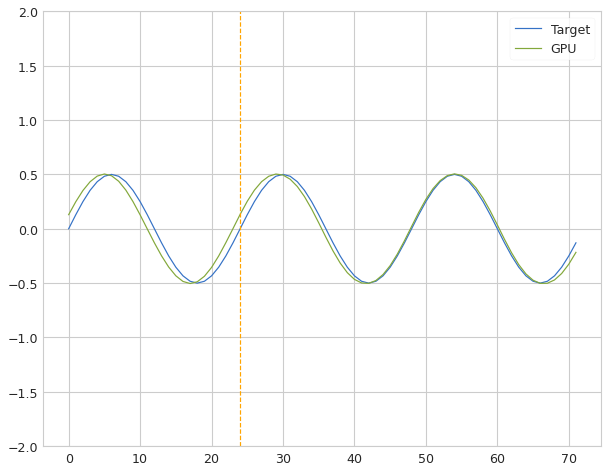

 Iter=35 a=0.982 sr=0.862 amp=0.092  ri=0.394 rr=3.226 loss=0.049486


Iter: 35 #### Diagnostic 0.049   Time 3.12  Best 0.049 NRMSE 0.049 CD 0.009
Iter: 36 #### Diagnostic 0.093   Time 1.75  Best 0.049 NRMSE 0.093 CD 0.035
Iter: 37 #### Diagnostic 0.086   Time 2.06  Best 0.049 NRMSE 0.086 CD 0.030
Iter: 38 #### Diagnostic 0.093   Time 1.93  Best 0.049 NRMSE 0.093 CD 0.034
Iter: 39 #### Diagnostic 0.092   Time 1.44  Best 0.049 NRMSE 0.092 CD 0.034
Iter: 40 #### Diagnostic 0.092   Time 1.52  Best 0.049 NRMSE 0.092 CD 0.034
Iter: 41 #### Diagnostic 0.093   Time 1.59  Best 0.049 NRMSE 0.093 CD 0.034
Iter: 42 #### Diagnostic 0.089   Time 1.63  Best 0.049 NRMSE 0.089 CD 0.032
Iter: 43 #### Diagnostic 0.094   Time 1.72  Best 0.049 NRMSE 0.094 CD 0.035
Iter: 44 #### Diagnostic 0.086   Time 1.48  Best 0.049 NRMSE 0.086 CD 0.029
Iter: 45 #### Diagnostic 0.095   Time 1.33  Best 0.049 NRMSE 0.095 CD 0.036
Iter: 46 #### Diagnostic 0.092   Time 1.50  Best 0.049 NRMSE 0.092 CD 0.034
Iter: 47 #### Dia

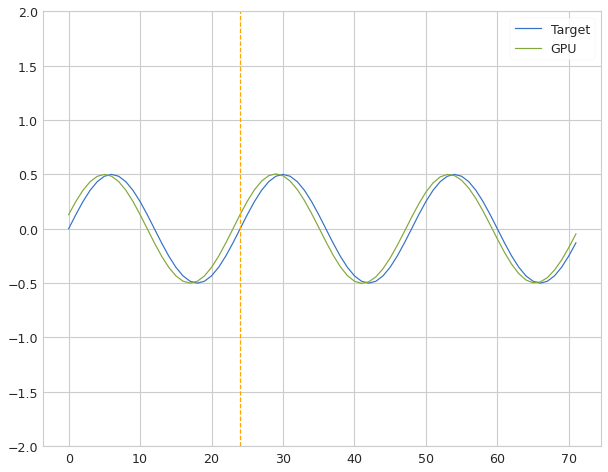

 Iter=15 a=0.926 sr=0.334 amp=0.177  ri=0.990 rr=3.464 loss=0.077208


Iter: 15 #### Diagnostic 0.077   Time 2.62  Best 0.077 NRMSE 0.077 CD 0.024
Iter: 16 #### Diagnostic 0.096   Time 1.81  Best 0.077 NRMSE 0.096 CD 0.037
Iter: 17 #### Diagnostic 0.093   Time 1.67  Best 0.077 NRMSE 0.093 CD 0.034
Iter: 18 #### Diagnostic 0.094   Time 1.38  Best 0.077 NRMSE 0.094 CD 0.035
Iter: 19 #### Diagnostic 0.094   Time 1.47  Best 0.077 NRMSE 0.094 CD 0.035
Iter: 20 #### Diagnostic 0.092   Time 1.57  Best 0.077 NRMSE 0.092 CD 0.034
Iter: 21 #### Diagnostic 0.092   Time 1.88  Best 0.077 NRMSE 0.092 CD 0.034
Iter: 22 #### Diagnostic 0.093   Time 2.00  Best 0.077 NRMSE 0.093 CD 0.034
Iter: 23 #### Diagnostic 0.092   Time 2.06  Best 0.077 NRMSE 0.092 CD 0.034
Iter: 24 #### Diagnostic 0.093   Time 1.95  Best 0.077 NRMSE 0.093 CD 0.034
Iter: 25 #### Diagnostic 0.088   Time 1.60  Best 0.077 NRMSE 0.088 CD 0.031
Iter: 26 #### Diagnostic 0.094   Time 1.83  Best 0.077 NRMSE 0.094 CD 0.035
Iter: 27 #### Dia

Iter: 19 #### Diagnostic 0.090   Time 1.28  Best 1000.000 NRMSE 0.090 CD 0.033
Iter: 20 #### Diagnostic 0.092   Time 1.38  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 21 #### Diagnostic 0.092   Time 1.38  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 22 #### Diagnostic 0.093   Time 1.91  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 23 #### Diagnostic 0.095   Time 1.88  Best 1000.000 NRMSE 0.095 CD 0.035
Iter: 24 #### Diagnostic 0.092   Time 1.73  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 25 #### Diagnostic 0.091   Time 1.27  Best 1000.000 NRMSE 0.091 CD 0.033
Iter: 26 #### Diagnostic 0.092   Time 1.47  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 27 #### Diagnostic 0.092   Time 1.37  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 28 #### Diagnostic 0.088   Time 2.04  Best 1000.000 NRMSE 0.088 CD 0.031
Iter: 29 #### Diagnostic 0.099   Time 1.75  Best 1000.000 NRMSE 0.099 CD 0.039
Iter: 30 #### Diagnostic 0.092   Time 1.90  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 31 #### Diagnostic 0.091   Time 1.94  Best 100

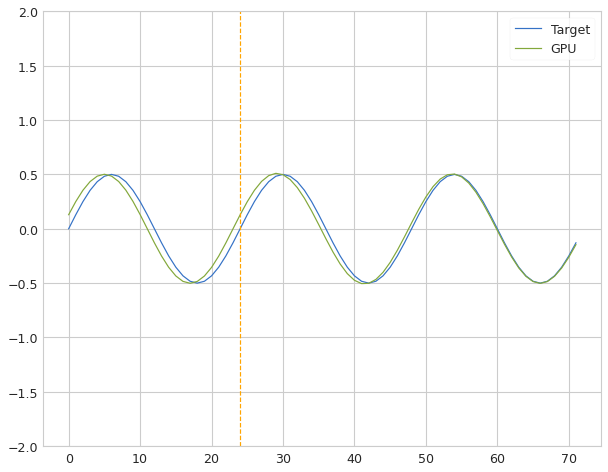

 Iter=37 a=0.953 sr=0.070 amp=0.298  ri=0.653 rr=4.602 loss=0.050871


Iter: 37 #### Diagnostic 0.051   Time 3.03  Best 0.051 NRMSE 0.051 CD 0.010
Iter: 38 #### Diagnostic 2.737   Time 1.80  Best 0.051 NRMSE 2.737 CD 1.958
Iter: 39 #### Diagnostic 0.092   Time 1.71  Best 0.051 NRMSE 0.092 CD 0.034
Iter: 40 #### Diagnostic 0.093   Time 1.76  Best 0.051 NRMSE 0.093 CD 0.034
Iter: 41 #### Diagnostic 0.096   Time 1.36  Best 0.051 NRMSE 0.096 CD 0.036
Iter: 42 #### Diagnostic 0.093   Time 1.82  Best 0.051 NRMSE 0.093 CD 0.035
Iter: 43 #### Diagnostic 0.092   Time 1.31  Best 0.051 NRMSE 0.092 CD 0.034
Iter: 44 #### Diagnostic 0.092   Time 1.05  Best 0.051 NRMSE 0.092 CD 0.034
Iter: 45 #### Diagnostic 0.094   Time 0.85  Best 0.051 NRMSE 0.094 CD 0.036
Iter: 46 #### Diagnostic 0.092   Time 1.15  Best 0.051 NRMSE 0.092 CD 0.034
Iter: 47 #### Diagnostic 0.094   Time 1.56  Best 0.051 NRMSE 0.094 CD 0.035
Iter: 48 #### Diagnostic 0.092   Time 1.65  Best 0.051 NRMSE 0.092 CD 0.034
Iter: 49 #### Dia

Iter: 40 #### Diagnostic 0.092   Time 1.46  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 41 #### Diagnostic 0.089   Time 1.76  Best 1000.000 NRMSE 0.089 CD 0.031
Iter: 42 #### Diagnostic 0.092   Time 1.36  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 43 #### Diagnostic 0.658   Time 1.55  Best 1000.000 NRMSE 0.658 CD 1.819
Iter: 44 #### Diagnostic 0.093   Time 1.48  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 45 #### Diagnostic 0.092   Time 1.79  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 46 #### Diagnostic 0.726   Time 2.89  Best 1000.000 NRMSE 0.726 CD 0.068
Iter: 47 #### Diagnostic 0.096   Time 2.57  Best 1000.000 NRMSE 0.096 CD 0.037
Iter: 48 #### Diagnostic 0.093   Time 2.24  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 49 #### Diagnostic 0.092   Time 2.06  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 50 #### Diagnostic 0.092   Time 1.68  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 51 #### Diagnostic 12.437   Time 1.50  Best 1000.000 NRMSE 12.437 CD 1.964
Iter: 52 #### Diagnostic 49.334   Time 1.62  Best 

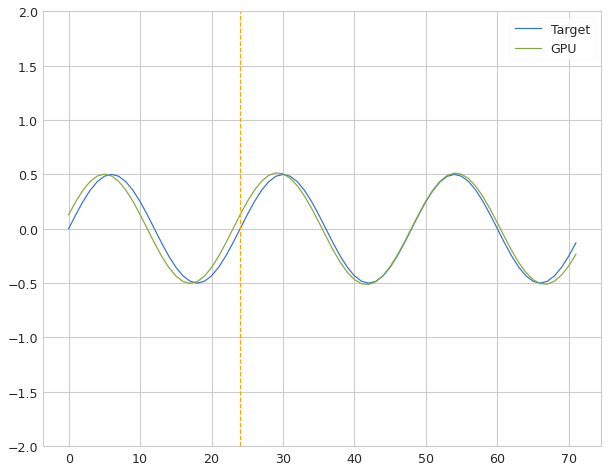

 Iter=65 a=0.943 sr=0.335 amp=0.079  ri=0.790 rr=0.476 loss=0.051858


Iter: 65 #### Diagnostic 0.052   Time 2.34  Best 0.052 NRMSE 0.052 CD 0.009
Iter: 66 #### Diagnostic 0.093   Time 1.60  Best 0.052 NRMSE 0.093 CD 0.034
Iter: 67 #### Diagnostic 0.093   Time 1.72  Best 0.052 NRMSE 0.093 CD 0.034
Iter: 68 #### Diagnostic 0.090   Time 1.61  Best 0.052 NRMSE 0.090 CD 0.033
Iter: 69 #### Diagnostic 0.093   Time 1.21  Best 0.052 NRMSE 0.093 CD 0.034
Iter: 70 #### Diagnostic 0.091   Time 1.11  Best 0.052 NRMSE 0.091 CD 0.034
Iter: 71 #### Diagnostic 0.092   Time 0.80  Best 0.052 NRMSE 0.092 CD 0.034
Iter: 72 #### Diagnostic 0.092   Time 1.14  Best 0.052 NRMSE 0.092 CD 0.034
Iter: 73 #### Diagnostic 0.093   Time 3.00  Best 0.052 NRMSE 0.093 CD 0.035
Iter: 74 #### Diagnostic 0.092   Time 2.98  Best 0.052 NRMSE 0.092 CD 0.034
Iter: 75 #### Diagnostic 0.813   Time 2.25  Best 0.052 NRMSE 0.813 CD 1.808
Iter: 76 #### Diagnostic 0.093   Time 1.59  Best 0.052 NRMSE 0.093 CD 0.035
Iter: 77 #### Dia

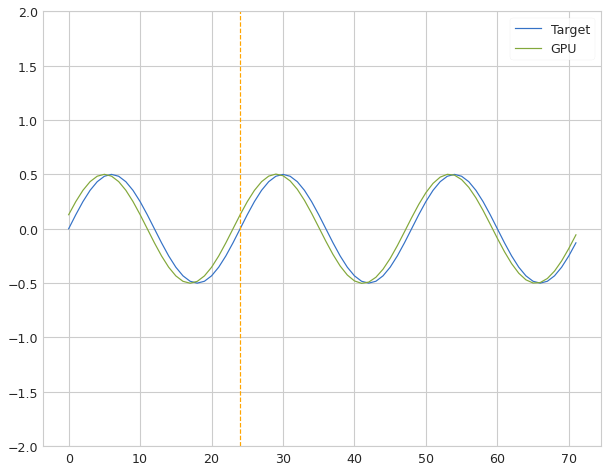

 Iter=17 a=0.924 sr=0.889 amp=0.320  ri=0.025 rr=4.308 loss=0.073265


Iter: 17 #### Diagnostic 0.073   Time 3.14  Best 0.073 NRMSE 0.073 CD 0.021
Iter: 18 #### Diagnostic 0.092   Time 1.63  Best 0.073 NRMSE 0.092 CD 0.034
Iter: 19 #### Diagnostic 0.092   Time 1.74  Best 0.073 NRMSE 0.092 CD 0.034
Iter: 20 #### Diagnostic 0.092   Time 1.94  Best 0.073 NRMSE 0.092 CD 0.034
Iter: 21 #### Diagnostic 0.092   Time 1.96  Best 0.073 NRMSE 0.092 CD 0.034
Iter: 22 #### Diagnostic 0.093   Time 1.96  Best 0.073 NRMSE 0.093 CD 0.035
Iter: 23 #### Diagnostic 0.093   Time 1.67  Best 0.073 NRMSE 0.093 CD 0.034
Iter: 24 #### Diagnostic 0.095   Time 1.79  Best 0.073 NRMSE 0.095 CD 0.036
Iter: 25 #### Diagnostic 0.093   Time 1.95  Best 0.073 NRMSE 0.093 CD 0.034
Iter: 26 #### Diagnostic 0.093   Time 1.20  Best 0.073 NRMSE 0.093 CD 0.034
Iter: 27 #### Diagnostic 0.092   Time 1.64  Best 0.073 NRMSE 0.092 CD 0.034
Iter: 28 #### Diagnostic 0.092   Time 2.32  Best 0.073 NRMSE 0.092 CD 0.034
Iter: 29 #### Dia

Iter: 21 #### Diagnostic 0.092   Time 1.83  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 22 #### Diagnostic 0.090   Time 1.62  Best 1000.000 NRMSE 0.090 CD 0.032
Iter: 23 #### Diagnostic 0.093   Time 1.53  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 24 #### Diagnostic 0.092   Time 1.43  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 25 #### Diagnostic 0.093   Time 0.72  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 26 #### Diagnostic 0.095   Time 0.96  Best 1000.000 NRMSE 0.095 CD 0.023
Iter: 27 #### Diagnostic 0.092   Time 0.94  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 28 #### Diagnostic 0.112   Time 1.73  Best 1000.000 NRMSE 0.112 CD 0.051
Iter: 29 #### Diagnostic 0.092   Time 1.57  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 30 #### Diagnostic 0.093   Time 1.51  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 31 #### Diagnostic 0.093   Time 0.74  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 32 #### Diagnostic 88.767   Time 0.81  Best 1000.000 NRMSE 88.767 CD 0.749
Iter: 33 #### Diagnostic 0.092   Time 0.81  Best 1

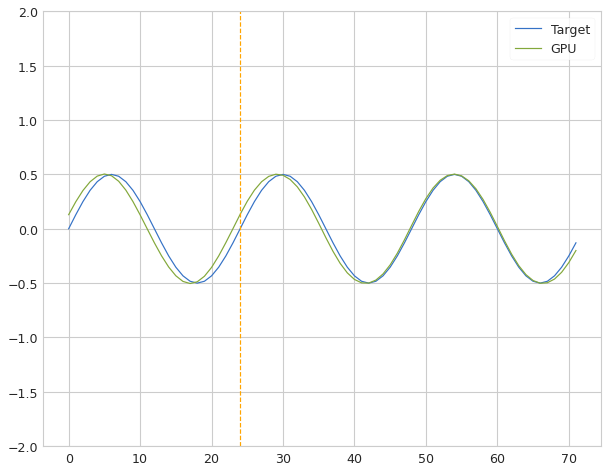

 Iter=35 a=0.982 sr=0.862 amp=0.092  ri=0.394 rr=3.226 loss=0.048548


Iter: 35 #### Diagnostic 0.049   Time 2.60  Best 0.049 NRMSE 0.049 CD 0.009
Iter: 36 #### Diagnostic 0.093   Time 1.82  Best 0.049 NRMSE 0.093 CD 0.035
Iter: 37 #### Diagnostic 0.090   Time 2.30  Best 0.049 NRMSE 0.090 CD 0.033
Iter: 38 #### Diagnostic 0.093   Time 1.51  Best 0.049 NRMSE 0.093 CD 0.034
Iter: 39 #### Diagnostic 0.092   Time 1.37  Best 0.049 NRMSE 0.092 CD 0.034
Iter: 40 #### Diagnostic 0.091   Time 1.85  Best 0.049 NRMSE 0.091 CD 0.033
Iter: 41 #### Diagnostic 0.092   Time 1.43  Best 0.049 NRMSE 0.092 CD 0.034
Iter: 42 #### Diagnostic 0.091   Time 1.63  Best 0.049 NRMSE 0.091 CD 0.033
Iter: 43 #### Diagnostic 0.094   Time 1.49  Best 0.049 NRMSE 0.094 CD 0.035
Iter: 44 #### Diagnostic 0.098   Time 1.81  Best 0.049 NRMSE 0.098 CD 0.038
Iter: 45 #### Diagnostic 0.086   Time 2.34  Best 0.049 NRMSE 0.086 CD 0.029
Iter: 46 #### Diagnostic 0.092   Time 1.87  Best 0.049 NRMSE 0.092 CD 0.034
Iter: 47 #### Dia

Iter: 39 #### Diagnostic 0.090   Time 1.83  Best 1000.000 NRMSE 0.090 CD 0.032
Iter: 40 #### Diagnostic 0.092   Time 2.32  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 41 #### Diagnostic 0.093   Time 2.10  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 42 #### Diagnostic 0.093   Time 1.37  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 43 #### Diagnostic 3.674   Time 1.91  Best 1000.000 NRMSE 3.674 CD 1.069
Iter: 44 #### Diagnostic 0.092   Time 1.76  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 45 #### Diagnostic 0.092   Time 1.38  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 46 #### Diagnostic 0.094   Time 1.49  Best 1000.000 NRMSE 0.094 CD 0.035
Iter: 47 #### Diagnostic 0.092   Time 1.69  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 48 #### Diagnostic 0.154   Time 1.65  Best 1000.000 NRMSE 0.154 CD 0.002
Iter: 49 #### Diagnostic 0.093   Time 1.69  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 50 #### Diagnostic 0.103   Time 1.71  Best 1000.000 NRMSE 0.103 CD 0.039
Iter: 51 #### Diagnostic 0.095   Time 1.13  Best 100

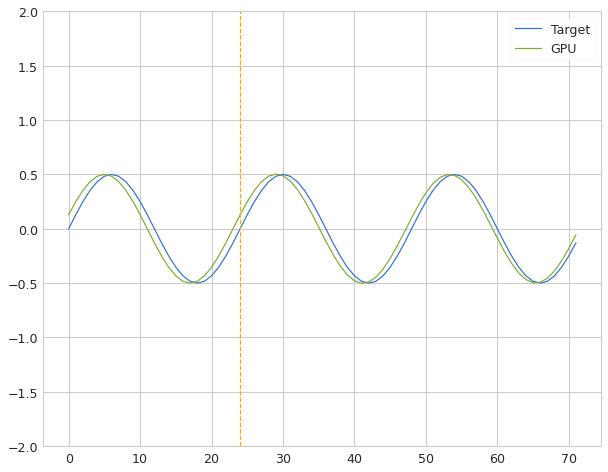

 Iter=85 a=0.889 sr=0.187 amp=0.095  ri=0.949 rr=1.347 loss=0.073087


Iter: 85 #### Diagnostic 0.073   Time 2.47  Best 0.073 NRMSE 0.073 CD 0.021
Iter: 86 #### Diagnostic 0.092   Time 1.75  Best 0.073 NRMSE 0.092 CD 0.034
Iter: 87 #### Diagnostic 0.092   Time 1.84  Best 0.073 NRMSE 0.092 CD 0.034
Iter: 88 #### Diagnostic 0.096   Time 1.59  Best 0.073 NRMSE 0.096 CD 0.037
Iter: 89 #### Diagnostic 0.093   Time 1.51  Best 0.073 NRMSE 0.093 CD 0.035
Iter: 90 #### Diagnostic 0.093   Time 1.40  Best 0.073 NRMSE 0.093 CD 0.034
Iter: 91 #### Diagnostic 0.091   Time 1.37  Best 0.073 NRMSE 0.091 CD 0.034
Iter: 92 #### Diagnostic 0.092   Time 0.82  Best 0.073 NRMSE 0.092 CD 0.034
Iter: 93 #### Diagnostic 0.092   Time 0.54  Best 0.073 NRMSE 0.092 CD 0.034
Iter: 94 #### Diagnostic 0.092   Time 0.66  Best 0.073 NRMSE 0.092 CD 0.034
Iter: 95 #### Diagnostic 0.092   Time 1.01  Best 0.073 NRMSE 0.092 CD 0.034
Iter: 96 #### Diagnostic 0.092   Time 2.35  Best 0.073 NRMSE 0.092 CD 0.034
Iter: 97 #### Dia

Iter: 87 #### Diagnostic 0.096   Time 1.57  Best 1000.000 NRMSE 0.096 CD 0.037
Iter: 88 #### Diagnostic 0.093   Time 1.61  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 89 #### Diagnostic 0.092   Time 1.23  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 90 #### Diagnostic 0.092   Time 0.88  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 91 #### Diagnostic 0.093   Time 0.84  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 92 #### Diagnostic 0.095   Time 1.81  Best 1000.000 NRMSE 0.095 CD 0.036
Iter: 93 #### Diagnostic 0.094   Time 1.79  Best 1000.000 NRMSE 0.094 CD 0.035
Iter: 94 #### Diagnostic 0.093   Time 1.62  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 95 #### Diagnostic 0.092   Time 1.25  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 96 #### Diagnostic 0.091   Time 1.06  Best 1000.000 NRMSE 0.091 CD 0.033
Iter: 97 #### Diagnostic 0.092   Time 1.07  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 98 #### Diagnostic 0.093   Time 1.87  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 99 #### Diagnostic 0.093   Time 2.18  Best 100

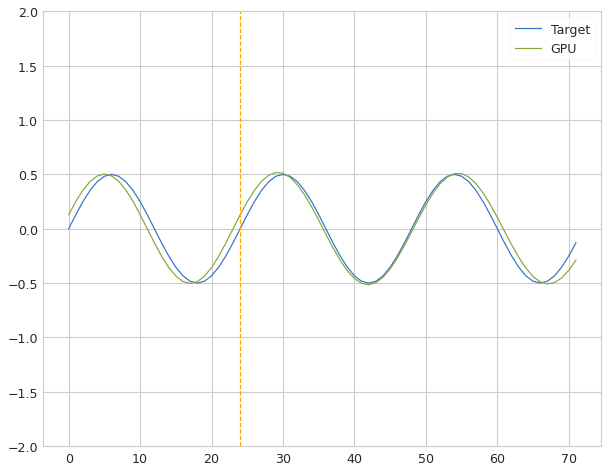

 Iter=65 a=0.943 sr=0.335 amp=0.079  ri=0.790 rr=0.476 loss=0.064646


Iter: 65 #### Diagnostic 0.065   Time 3.12  Best 0.065 NRMSE 0.065 CD 0.015
Iter: 66 #### Diagnostic 0.091   Time 1.63  Best 0.065 NRMSE 0.091 CD 0.033
Iter: 67 #### Diagnostic 0.093   Time 1.55  Best 0.065 NRMSE 0.093 CD 0.035
Iter: 68 #### Diagnostic 0.092   Time 1.56  Best 0.065 NRMSE 0.092 CD 0.034
Iter: 69 #### Diagnostic 0.093   Time 1.37  Best 0.065 NRMSE 0.093 CD 0.034
Iter: 70 #### Diagnostic 0.093   Time 1.68  Best 0.065 NRMSE 0.093 CD 0.035
Iter: 71 #### Diagnostic 0.092   Time 1.75  Best 0.065 NRMSE 0.092 CD 0.034
Iter: 72 #### Diagnostic 0.093   Time 1.89  Best 0.065 NRMSE 0.093 CD 0.034
Iter: 73 #### Diagnostic 0.093   Time 0.96  Best 0.065 NRMSE 0.093 CD 0.035
Iter: 74 #### Diagnostic 0.092   Time 1.38  Best 0.065 NRMSE 0.092 CD 0.034
Iter: 75 #### Diagnostic 0.797   Time 2.21  Best 0.065 NRMSE 0.797 CD 0.047
Iter: 76 #### Diagnostic 0.093   Time 2.04  Best 0.065 NRMSE 0.093 CD 0.035
Iter: 77 #### Dia

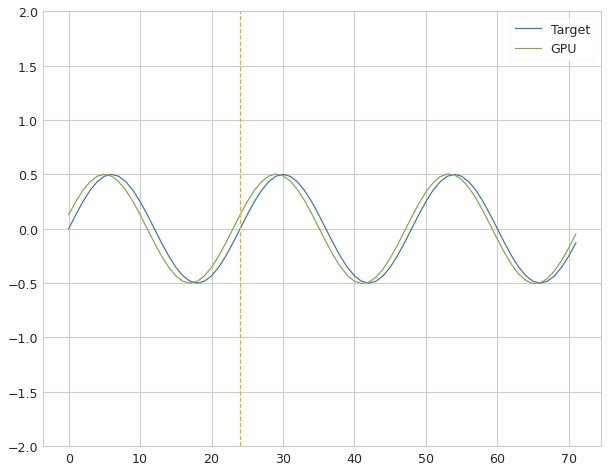

 Iter=17 a=0.924 sr=0.889 amp=0.320  ri=0.025 rr=4.308 loss=0.076424


Iter: 17 #### Diagnostic 0.076   Time 3.30  Best 0.076 NRMSE 0.076 CD 0.023
Iter: 18 #### Diagnostic 0.092   Time 1.46  Best 0.076 NRMSE 0.092 CD 0.034
Iter: 19 #### Diagnostic 0.096   Time 1.39  Best 0.076 NRMSE 0.096 CD 0.037
Iter: 20 #### Diagnostic 0.082   Time 1.12  Best 0.076 NRMSE 0.082 CD 0.027
Iter: 21 #### Diagnostic 0.092   Time 1.13  Best 0.076 NRMSE 0.092 CD 0.034
Iter: 22 #### Diagnostic 0.093   Time 0.72  Best 0.076 NRMSE 0.093 CD 0.034
Iter: 23 #### Diagnostic 0.092   Time 0.69  Best 0.076 NRMSE 0.092 CD 0.034
Iter: 24 #### Diagnostic 0.093   Time 0.70  Best 0.076 NRMSE 0.093 CD 0.034
Iter: 25 #### Diagnostic 0.093   Time 0.71  Best 0.076 NRMSE 0.093 CD 0.034
Iter: 26 #### Diagnostic 0.093   Time 1.57  Best 0.076 NRMSE 0.093 CD 0.035
Iter: 27 #### Diagnostic 0.092   Time 2.04  Best 0.076 NRMSE 0.092 CD 0.034
Iter: 28 #### Diagnostic 0.092   Time 2.34  Best 0.076 NRMSE 0.092 CD 0.034
Iter: 29 #### Dia

Iter: 21 #### Diagnostic 0.093   Time 1.36  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 22 #### Diagnostic 0.109   Time 1.60  Best 1000.000 NRMSE 0.109 CD 0.048
Iter: 23 #### Diagnostic 0.093   Time 1.71  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 24 #### Diagnostic 0.092   Time 2.11  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 25 #### Diagnostic 0.093   Time 2.40  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 26 #### Diagnostic 0.100   Time 1.78  Best 1000.000 NRMSE 0.100 CD 0.038
Iter: 27 #### Diagnostic 0.092   Time 2.25  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 28 #### Diagnostic 0.082   Time 1.99  Best 1000.000 NRMSE 0.082 CD 0.027
Iter: 29 #### Diagnostic 0.092   Time 2.02  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 30 #### Diagnostic 0.093   Time 1.52  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 31 #### Diagnostic 0.093   Time 1.76  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 32 #### Diagnostic 2.004   Time 2.00  Best 1000.000 NRMSE 2.004 CD 1.945
Iter: 33 #### Diagnostic 0.092   Time 1.73  Best 100

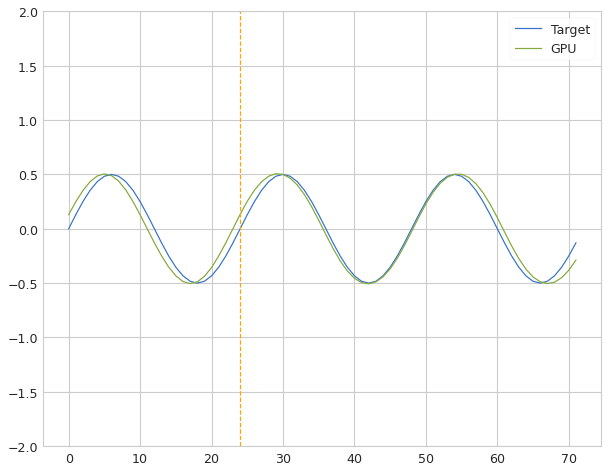

 Iter=35 a=0.982 sr=0.862 amp=0.092  ri=0.394 rr=3.226 loss=0.063187


Iter: 35 #### Diagnostic 0.063   Time 3.15  Best 0.063 NRMSE 0.063 CD 0.014
Iter: 36 #### Diagnostic 0.093   Time 3.69  Best 0.063 NRMSE 0.093 CD 0.035
Iter: 37 #### Diagnostic 0.088   Time 2.82  Best 0.063 NRMSE 0.088 CD 0.031
Iter: 38 #### Diagnostic 0.092   Time 2.23  Best 0.063 NRMSE 0.092 CD 0.034
Iter: 39 #### Diagnostic 0.092   Time 2.47  Best 0.063 NRMSE 0.092 CD 0.034
Iter: 40 #### Diagnostic 0.092   Time 1.14  Best 0.063 NRMSE 0.092 CD 0.034
Iter: 41 #### Diagnostic 0.092   Time 1.30  Best 0.063 NRMSE 0.092 CD 0.034
Iter: 42 #### Diagnostic 0.087   Time 1.32  Best 0.063 NRMSE 0.087 CD 0.030
Iter: 43 #### Diagnostic 0.094   Time 2.25  Best 0.063 NRMSE 0.094 CD 0.035
Iter: 44 #### Diagnostic 0.084   Time 1.92  Best 0.063 NRMSE 0.084 CD 0.028
Iter: 45 #### Diagnostic 0.096   Time 1.95  Best 0.063 NRMSE 0.096 CD 0.037
Iter: 46 #### Diagnostic 0.092   Time 2.39  Best 0.063 NRMSE 0.092 CD 0.034
Iter: 47 #### Dia

Iter: 39 #### Diagnostic 0.090   Time 1.26  Best 1000.000 NRMSE 0.090 CD 0.032
Iter: 40 #### Diagnostic 0.092   Time 1.85  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 41 #### Diagnostic 0.092   Time 1.89  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 42 #### Diagnostic 0.093   Time 2.40  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 43 #### Diagnostic 0.370   Time 2.19  Best 1000.000 NRMSE 0.370 CD 1.173
Iter: 44 #### Diagnostic 0.092   Time 2.21  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 45 #### Diagnostic 0.089   Time 1.70  Best 1000.000 NRMSE 0.089 CD 0.032
Iter: 46 #### Diagnostic 0.095   Time 1.31  Best 1000.000 NRMSE 0.095 CD 0.036
Iter: 47 #### Diagnostic 0.092   Time 0.86  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 48 #### Diagnostic 0.129   Time 0.87  Best 1000.000 NRMSE 0.129 CD 0.044
Iter: 49 #### Diagnostic 0.093   Time 1.31  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 50 #### Diagnostic 0.088   Time 1.87  Best 1000.000 NRMSE 0.088 CD 0.031
Iter: 51 #### Diagnostic 0.093   Time 2.09  Best 100

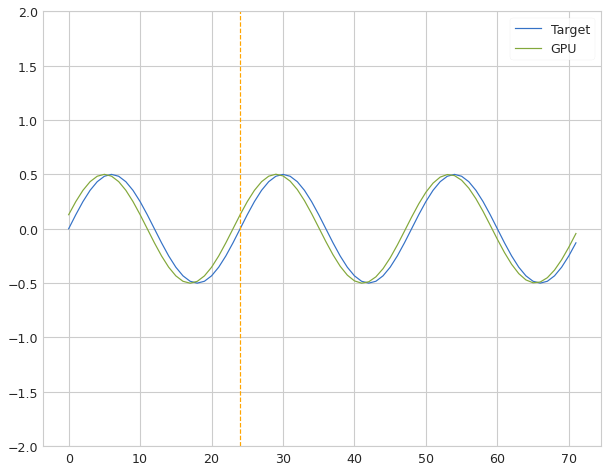

 Iter=85 a=0.889 sr=0.187 amp=0.095  ri=0.949 rr=1.347 loss=0.077154


Iter: 85 #### Diagnostic 0.077   Time 3.45  Best 0.077 NRMSE 0.077 CD 0.024
Iter: 86 #### Diagnostic 0.093   Time 2.07  Best 0.077 NRMSE 0.093 CD 0.034
Iter: 87 #### Diagnostic 0.092   Time 1.71  Best 0.077 NRMSE 0.092 CD 0.034
Iter: 88 #### Diagnostic 0.081   Time 1.82  Best 0.077 NRMSE 0.081 CD 0.026
Iter: 89 #### Diagnostic 0.093   Time 1.28  Best 0.077 NRMSE 0.093 CD 0.035
Iter: 90 #### Diagnostic 0.092   Time 1.38  Best 0.077 NRMSE 0.092 CD 0.034
Iter: 91 #### Diagnostic 0.091   Time 1.29  Best 0.077 NRMSE 0.091 CD 0.034
Iter: 92 #### Diagnostic 0.092   Time 0.91  Best 0.077 NRMSE 0.092 CD 0.034
Iter: 93 #### Diagnostic 0.092   Time 2.03  Best 0.077 NRMSE 0.092 CD 0.034
Iter: 94 #### Diagnostic 0.092   Time 3.24  Best 0.077 NRMSE 0.092 CD 0.034
Iter: 95 #### Diagnostic 0.093   Time 1.77  Best 0.077 NRMSE 0.093 CD 0.034
Iter: 96 #### Diagnostic 0.092   Time 1.44  Best 0.077 NRMSE 0.092 CD 0.034
Iter: 97 #### Dia

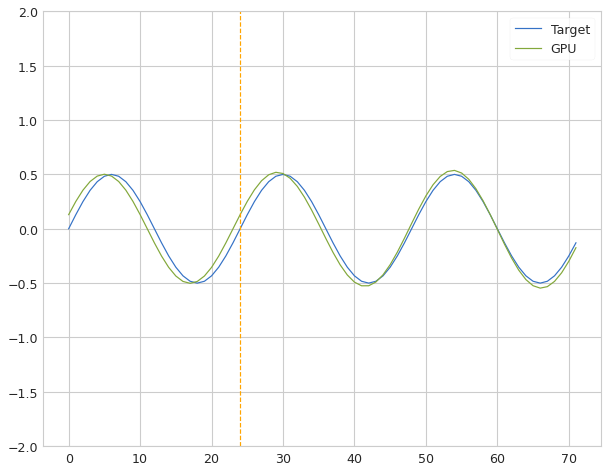

 Iter=37 a=0.953 sr=0.070 amp=0.298  ri=0.653 rr=4.602 loss=0.055845


Iter: 37 #### Diagnostic 0.056   Time 3.32  Best 0.056 NRMSE 0.056 CD 0.009
Iter: 38 #### Diagnostic 0.307   Time 2.57  Best 0.056 NRMSE 0.307 CD 0.059
Iter: 39 #### Diagnostic 0.093   Time 2.12  Best 0.056 NRMSE 0.093 CD 0.034
Iter: 40 #### Diagnostic 0.092   Time 2.08  Best 0.056 NRMSE 0.092 CD 0.034
Iter: 41 #### Diagnostic 0.099   Time 1.73  Best 0.056 NRMSE 0.099 CD 0.039
Iter: 42 #### Diagnostic 0.093   Time 1.87  Best 0.056 NRMSE 0.093 CD 0.035
Iter: 43 #### Diagnostic 0.093   Time 1.01  Best 0.056 NRMSE 0.093 CD 0.034
Iter: 44 #### Diagnostic 0.093   Time 1.62  Best 0.056 NRMSE 0.093 CD 0.034
Iter: 45 #### Diagnostic 0.098   Time 1.74  Best 0.056 NRMSE 0.098 CD 0.028
Iter: 46 #### Diagnostic 0.093   Time 2.88  Best 0.056 NRMSE 0.093 CD 0.034
Iter: 47 #### Diagnostic 0.093   Time 2.23  Best 0.056 NRMSE 0.093 CD 0.034
Iter: 48 #### Diagnostic 0.092   Time 2.15  Best 0.056 NRMSE 0.092 CD 0.034
Iter: 49 #### Dia

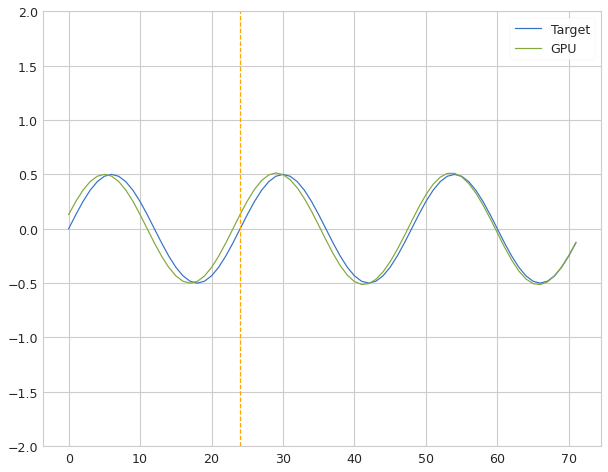

 Iter=30 a=0.979 sr=0.619 amp=0.086  ri=0.840 rr=0.572 loss=0.058503


Iter: 30 #### Diagnostic 0.059   Time 1.59  Best 0.059 NRMSE 0.059 CD 0.012
Iter: 31 #### Diagnostic 0.093   Time 1.48  Best 0.059 NRMSE 0.093 CD 0.034
Iter: 32 #### Diagnostic 0.093   Time 0.90  Best 0.059 NRMSE 0.093 CD 0.034
Iter: 33 #### Diagnostic 0.092   Time 2.68  Best 0.059 NRMSE 0.092 CD 0.034
Iter: 34 #### Diagnostic 0.092   Time 2.39  Best 0.059 NRMSE 0.092 CD 0.034
Iter: 35 #### Diagnostic 0.093   Time 2.15  Best 0.059 NRMSE 0.093 CD 0.034
Iter: 36 #### Diagnostic 0.092   Time 1.72  Best 0.059 NRMSE 0.092 CD 0.034
Iter: 37 #### Diagnostic 0.093   Time 1.34  Best 0.059 NRMSE 0.093 CD 0.034
Iter: 38 #### Diagnostic 0.092   Time 1.58  Best 0.059 NRMSE 0.092 CD 0.034
Iter: 39 #### Diagnostic 0.092   Time 0.76  Best 0.059 NRMSE 0.092 CD 0.034
Iter: 40 #### Diagnostic 0.093   Time 1.28  Best 0.059 NRMSE 0.093 CD 0.034
Iter: 41 #### Diagnostic 0.089   Time 1.62  Best 0.059 NRMSE 0.089 CD 0.031
Iter: 42 #### Dia

Iter: 26 #### Diagnostic 0.093   Time 1.82  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 27 #### Diagnostic 0.092   Time 1.98  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 28 #### Diagnostic 0.092   Time 1.65  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 29 #### Diagnostic 0.378   Time 1.31  Best 1000.000 NRMSE 0.378 CD 1.380
Iter: 30 #### Diagnostic 0.087   Time 0.89  Best 1000.000 NRMSE 0.087 CD 0.030
Iter: 31 #### Diagnostic 0.093   Time 1.57  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 32 #### Diagnostic 3.253   Time 2.65  Best 1000.000 NRMSE 3.253 CD 1.004


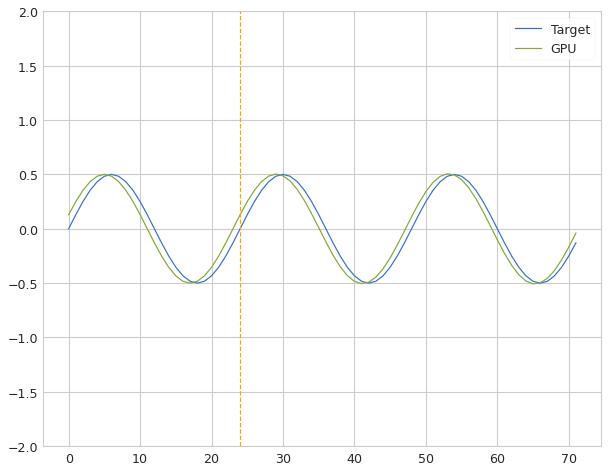

 Iter=33 a=0.979 sr=0.727 amp=0.796  ri=0.653 rr=0.937 loss=0.079344


Iter: 33 #### Diagnostic 0.079   Time 3.14  Best 0.079 NRMSE 0.079 CD 0.025
Iter: 34 #### Diagnostic 0.093   Time 1.85  Best 0.079 NRMSE 0.093 CD 0.034
Iter: 35 #### Diagnostic 0.092   Time 1.79  Best 0.079 NRMSE 0.092 CD 0.034
Iter: 36 #### Diagnostic 0.093   Time 1.48  Best 0.079 NRMSE 0.093 CD 0.035
Iter: 37 #### Diagnostic 0.091   Time 1.00  Best 0.079 NRMSE 0.091 CD 0.033
Iter: 38 #### Diagnostic 0.092   Time 2.05  Best 0.079 NRMSE 0.092 CD 0.034
Iter: 39 #### Diagnostic 0.093   Time 1.40  Best 0.079 NRMSE 0.093 CD 0.035
Iter: 40 #### Diagnostic 0.092   Time 1.34  Best 0.079 NRMSE 0.092 CD 0.034
Iter: 41 #### Diagnostic 0.093   Time 2.21  Best 0.079 NRMSE 0.093 CD 0.034
Iter: 42 #### Diagnostic 0.098   Time 2.35  Best 0.079 NRMSE 0.098 CD 0.039
Iter: 43 #### Diagnostic 0.092   Time 2.29  Best 0.079 NRMSE 0.092 CD 0.034
Iter: 44 #### Diagnostic 0.093   Time 1.72  Best 0.079 NRMSE 0.093 CD 0.034
Iter: 45 #### Dia

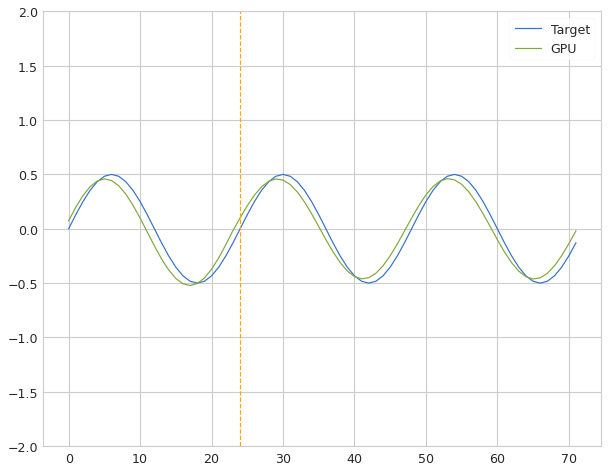

 Iter=56 a=0.143 sr=0.832 amp=0.984  ri=0.947 rr=0.372 loss=0.078706


Iter: 56 #### Diagnostic 0.079   Time 3.45  Best 0.079 NRMSE 0.079 CD 0.024
Iter: 57 #### Diagnostic 0.093   Time 2.05  Best 0.079 NRMSE 0.093 CD 0.035
Iter: 58 #### Diagnostic 0.094   Time 1.38  Best 0.079 NRMSE 0.094 CD 0.035
Iter: 59 #### Diagnostic 0.093   Time 1.52  Best 0.079 NRMSE 0.093 CD 0.035
Iter: 60 #### Diagnostic 0.093   Time 1.58  Best 0.079 NRMSE 0.093 CD 0.034
Iter: 61 #### Diagnostic 0.093   Time 1.77  Best 0.079 NRMSE 0.093 CD 0.035
Iter: 62 #### Diagnostic 0.090   Time 1.70  Best 0.079 NRMSE 0.090 CD 0.032
Iter: 63 #### Diagnostic 0.092   Time 1.64  Best 0.079 NRMSE 0.092 CD 0.034
Iter: 64 #### Diagnostic 0.092   Time 2.07  Best 0.079 NRMSE 0.092 CD 0.034
Iter: 65 #### Diagnostic 0.092   Time 1.60  Best 0.079 NRMSE 0.092 CD 0.034
Iter: 66 #### Diagnostic 0.094   Time 2.53  Best 0.079 NRMSE 0.094 CD 0.035
Iter: 67 #### Diagnostic 0.094   Time 2.45  Best 0.079 NRMSE 0.094 CD 0.035
Iter: 68 #### Dia

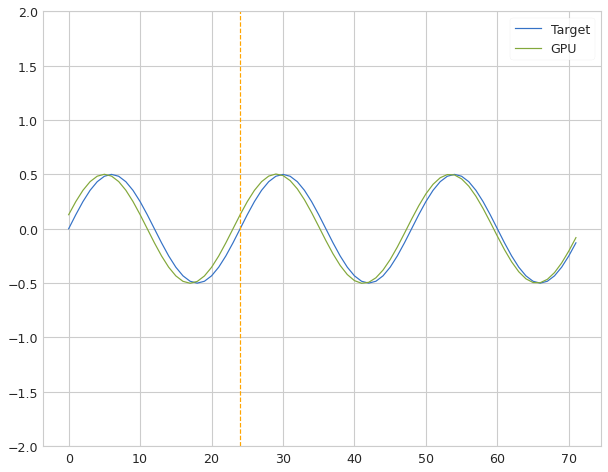

 Iter=28 a=0.837 sr=0.173 amp=0.262  ri=0.585 rr=3.430 loss=0.065488


Iter: 28 #### Diagnostic 0.065   Time 2.29  Best 0.065 NRMSE 0.065 CD 0.017
Iter: 29 #### Diagnostic 0.092   Time 1.33  Best 0.065 NRMSE 0.092 CD 0.034
Iter: 30 #### Diagnostic 0.093   Time 2.12  Best 0.065 NRMSE 0.093 CD 0.034
Iter: 31 #### Diagnostic 0.093   Time 2.23  Best 0.065 NRMSE 0.093 CD 0.035
Iter: 32 #### Diagnostic 6.070   Time 1.95  Best 0.065 NRMSE 6.070 CD 0.844
Iter: 33 #### Diagnostic 0.093   Time 1.76  Best 0.065 NRMSE 0.093 CD 0.034
Iter: 34 #### Diagnostic 0.092   Time 2.51  Best 0.065 NRMSE 0.092 CD 0.034
Iter: 35 #### Diagnostic 0.088   Time 2.88  Best 0.065 NRMSE 0.088 CD 0.027
Iter: 36 #### Diagnostic 0.093   Time 3.17  Best 0.065 NRMSE 0.093 CD 0.035
Iter: 37 #### Diagnostic 0.090   Time 2.21  Best 0.065 NRMSE 0.090 CD 0.033
Iter: 38 #### Diagnostic 0.091   Time 1.69  Best 0.065 NRMSE 0.091 CD 0.034
Iter: 39 #### Diagnostic 0.092   Time 1.68  Best 0.065 NRMSE 0.092 CD 0.034
Iter: 40 #### Dia

Iter: 32 #### Diagnostic 0.092   Time 2.85  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 33 #### Diagnostic 0.093   Time 2.82  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 34 #### Diagnostic 0.093   Time 2.15  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 35 #### Diagnostic 0.093   Time 2.13  Best 1000.000 NRMSE 0.093 CD 0.034


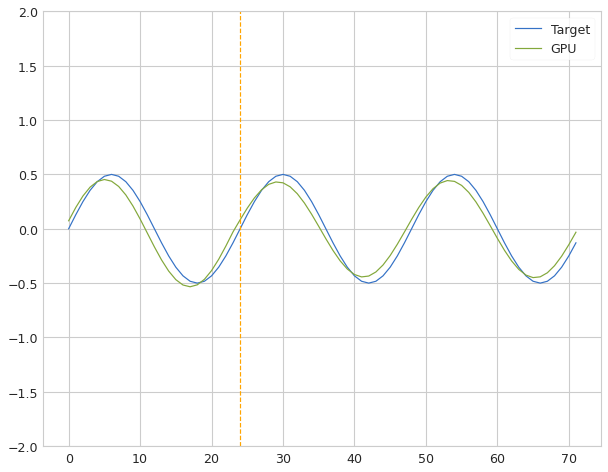

 Iter=36 a=0.440 sr=1.025 amp=0.969  ri=0.720 rr=2.051 loss=0.077391


Iter: 36 #### Diagnostic 0.077   Time 1.59  Best 0.077 NRMSE 0.077 CD 0.020
Iter: 37 #### Diagnostic 0.092   Time 1.39  Best 0.077 NRMSE 0.092 CD 0.034
Iter: 38 #### Diagnostic 0.092   Time 1.93  Best 0.077 NRMSE 0.092 CD 0.034
Iter: 39 #### Diagnostic 0.104   Time 1.69  Best 0.077 NRMSE 0.104 CD 0.043
Iter: 40 #### Diagnostic 0.092   Time 1.80  Best 0.077 NRMSE 0.092 CD 0.034
Iter: 41 #### Diagnostic 0.092   Time 2.35  Best 0.077 NRMSE 0.092 CD 0.034
Iter: 42 #### Diagnostic 0.093   Time 2.50  Best 0.077 NRMSE 0.093 CD 0.034
Iter: 43 #### Diagnostic 2.999   Time 2.50  Best 0.077 NRMSE 2.999 CD 1.054
Iter: 44 #### Diagnostic 0.092   Time 2.66  Best 0.077 NRMSE 0.092 CD 0.034
Iter: 45 #### Diagnostic 0.098   Time 2.46  Best 0.077 NRMSE 0.098 CD 0.038
Iter: 46 #### Diagnostic 0.096   Time 2.13  Best 0.077 NRMSE 0.096 CD 0.037
Iter: 47 #### Diagnostic 0.092   Time 1.71  Best 0.077 NRMSE 0.092 CD 0.034
Iter: 48 #### Dia

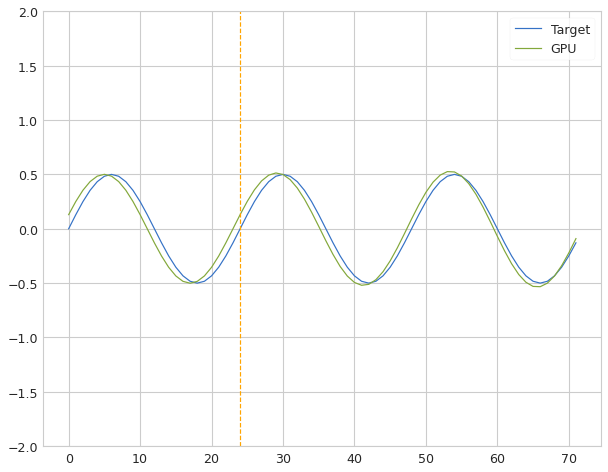

 Iter=37 a=0.953 sr=0.070 amp=0.298  ri=0.653 rr=4.602 loss=0.068125


Iter: 37 #### Diagnostic 0.068   Time 2.48  Best 0.068 NRMSE 0.068 CD 0.016
Iter: 38 #### Diagnostic 1.142   Time 2.13  Best 0.068 NRMSE 1.142 CD 1.851
Iter: 39 #### Diagnostic 0.093   Time 2.50  Best 0.068 NRMSE 0.093 CD 0.034
Iter: 40 #### Diagnostic 0.092   Time 1.89  Best 0.068 NRMSE 0.092 CD 0.034
Iter: 41 #### Diagnostic 0.087   Time 1.15  Best 0.068 NRMSE 0.087 CD 0.030
Iter: 42 #### Diagnostic 0.093   Time 0.78  Best 0.068 NRMSE 0.093 CD 0.035
Iter: 43 #### Diagnostic 0.093   Time 1.60  Best 0.068 NRMSE 0.093 CD 0.034
Iter: 44 #### Diagnostic 0.092   Time 1.12  Best 0.068 NRMSE 0.092 CD 0.034
Iter: 45 #### Diagnostic 0.101   Time 2.15  Best 0.068 NRMSE 0.101 CD 0.036
Iter: 46 #### Diagnostic 0.092   Time 2.19  Best 0.068 NRMSE 0.092 CD 0.034
Iter: 47 #### Diagnostic 0.093   Time 2.27  Best 0.068 NRMSE 0.093 CD 0.035
Iter: 48 #### Diagnostic 0.092   Time 1.86  Best 0.068 NRMSE 0.092 CD 0.034
Iter: 49 #### Dia

Iter: 40 #### Diagnostic 0.092   Time 1.52  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 41 #### Diagnostic 0.092   Time 0.76  Best 1000.000 NRMSE 0.092 CD 0.033
Iter: 42 #### Diagnostic 0.093   Time 1.17  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 43 #### Diagnostic 0.182   Time 1.47  Best 1000.000 NRMSE 0.182 CD 0.134
Iter: 44 #### Diagnostic 0.092   Time 1.03  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 45 #### Diagnostic 0.092   Time 1.59  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 46 #### Diagnostic 1.693   Time 1.46  Best 1000.000 NRMSE 1.693 CD 1.895
Iter: 47 #### Diagnostic 0.096   Time 2.25  Best 1000.000 NRMSE 0.096 CD 0.037
Iter: 48 #### Diagnostic 0.093   Time 2.76  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 49 #### Diagnostic 0.092   Time 2.57  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 50 #### Diagnostic 0.092   Time 2.40  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 51 #### Diagnostic 28.639   Time 1.64  Best 1000.000 NRMSE 28.639 CD 1.911
Iter: 52 #### Diagnostic 11.607   Time 1.66  Best 

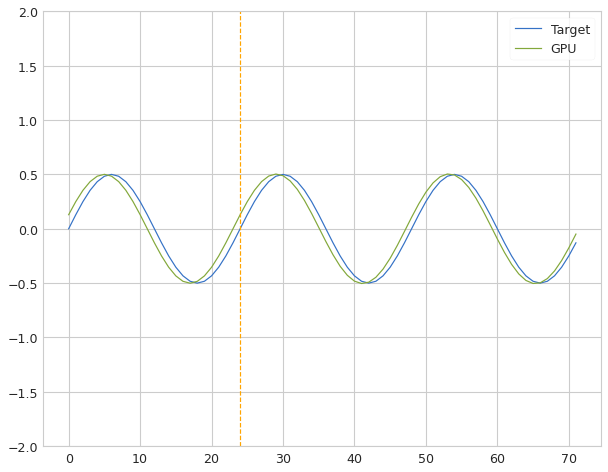

 Iter=17 a=0.924 sr=0.889 amp=0.320  ri=0.025 rr=4.308 loss=0.075799


Iter: 17 #### Diagnostic 0.076   Time 2.52  Best 0.076 NRMSE 0.076 CD 0.023
Iter: 18 #### Diagnostic 0.092   Time 2.15  Best 0.076 NRMSE 0.092 CD 0.034
Iter: 19 #### Diagnostic 0.090   Time 1.99  Best 0.076 NRMSE 0.090 CD 0.032
Iter: 20 #### Diagnostic 0.090   Time 1.57  Best 0.076 NRMSE 0.090 CD 0.033
Iter: 21 #### Diagnostic 0.092   Time 1.91  Best 0.076 NRMSE 0.092 CD 0.034
Iter: 22 #### Diagnostic 0.093   Time 1.18  Best 0.076 NRMSE 0.093 CD 0.035
Iter: 23 #### Diagnostic 0.093   Time 1.58  Best 0.076 NRMSE 0.093 CD 0.034
Iter: 24 #### Diagnostic 0.094   Time 0.92  Best 0.076 NRMSE 0.094 CD 0.035
Iter: 25 #### Diagnostic 0.093   Time 1.45  Best 0.076 NRMSE 0.093 CD 0.034
Iter: 26 #### Diagnostic 0.093   Time 1.97  Best 0.076 NRMSE 0.093 CD 0.034
Iter: 27 #### Diagnostic 0.092   Time 1.65  Best 0.076 NRMSE 0.092 CD 0.034
Iter: 28 #### Diagnostic 0.092   Time 1.15  Best 0.076 NRMSE 0.092 CD 0.034
Iter: 29 #### Dia

Iter: 21 #### Diagnostic 0.093   Time 1.79  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 22 #### Diagnostic 0.095   Time 1.15  Best 1000.000 NRMSE 0.095 CD 0.036
Iter: 23 #### Diagnostic 0.093   Time 0.65  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 24 #### Diagnostic 0.091   Time 0.75  Best 1000.000 NRMSE 0.091 CD 0.033
Iter: 25 #### Diagnostic 0.093   Time 1.11  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 26 #### Diagnostic 0.101   Time 1.76  Best 1000.000 NRMSE 0.101 CD 0.037
Iter: 27 #### Diagnostic 0.092   Time 1.93  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 28 #### Diagnostic 0.123   Time 2.32  Best 1000.000 NRMSE 0.123 CD 0.061
Iter: 29 #### Diagnostic 0.092   Time 2.59  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 30 #### Diagnostic 0.093   Time 2.39  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 31 #### Diagnostic 0.092   Time 1.58  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 32 #### Diagnostic 7.950   Time 1.00  Best 1000.000 NRMSE 7.950 CD 1.023
Iter: 33 #### Diagnostic 0.093   Time 1.57  Best 100

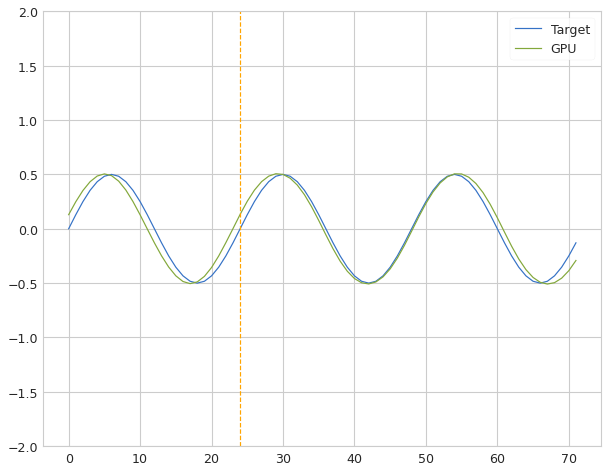

 Iter=35 a=0.982 sr=0.862 amp=0.092  ri=0.394 rr=3.226 loss=0.063689


Iter: 35 #### Diagnostic 0.064   Time 2.18  Best 0.064 NRMSE 0.064 CD 0.014
Iter: 36 #### Diagnostic 0.093   Time 2.44  Best 0.064 NRMSE 0.093 CD 0.035
Iter: 37 #### Diagnostic 0.094   Time 2.39  Best 0.064 NRMSE 0.094 CD 0.035
Iter: 38 #### Diagnostic 0.093   Time 2.26  Best 0.064 NRMSE 0.093 CD 0.034
Iter: 39 #### Diagnostic 0.093   Time 1.95  Best 0.064 NRMSE 0.093 CD 0.034
Iter: 40 #### Diagnostic 0.097   Time 1.54  Best 0.064 NRMSE 0.097 CD 0.037
Iter: 41 #### Diagnostic 0.092   Time 1.23  Best 0.064 NRMSE 0.092 CD 0.034
Iter: 42 #### Diagnostic 0.084   Time 1.21  Best 0.064 NRMSE 0.084 CD 0.028
Iter: 43 #### Diagnostic 0.094   Time 1.31  Best 0.064 NRMSE 0.094 CD 0.035
Iter: 44 #### Diagnostic 0.070   Time 1.85  Best 0.064 NRMSE 0.070 CD 0.020
Iter: 45 #### Diagnostic 0.107   Time 2.12  Best 0.064 NRMSE 0.107 CD 0.046
Iter: 46 #### Diagnostic 0.092   Time 1.40  Best 0.064 NRMSE 0.092 CD 0.034
Iter: 47 #### Dia

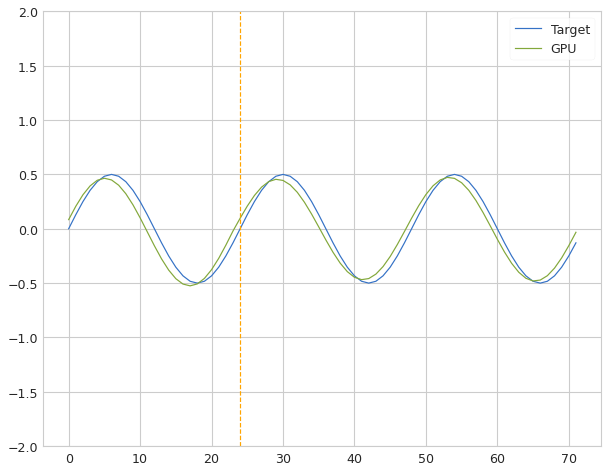

 Iter=36 a=0.440 sr=1.025 amp=0.969  ri=0.720 rr=2.051 loss=0.074622


Iter: 36 #### Diagnostic 0.075   Time 3.85  Best 0.075 NRMSE 0.075 CD 0.022
Iter: 37 #### Diagnostic 0.093   Time 1.81  Best 0.075 NRMSE 0.093 CD 0.034
Iter: 38 #### Diagnostic 0.092   Time 1.45  Best 0.075 NRMSE 0.092 CD 0.034
Iter: 39 #### Diagnostic 0.108   Time 1.73  Best 0.075 NRMSE 0.108 CD 0.047
Iter: 40 #### Diagnostic 0.092   Time 2.40  Best 0.075 NRMSE 0.092 CD 0.034
Iter: 41 #### Diagnostic 0.093   Time 2.09  Best 0.075 NRMSE 0.093 CD 0.034
Iter: 42 #### Diagnostic 0.093   Time 1.72  Best 0.075 NRMSE 0.093 CD 0.034
Iter: 43 #### Diagnostic 0.375   Time 1.89  Best 0.075 NRMSE 0.375 CD 1.080
Iter: 44 #### Diagnostic 0.092   Time 1.06  Best 0.075 NRMSE 0.092 CD 0.034
Iter: 45 #### Diagnostic 0.087   Time 1.02  Best 0.075 NRMSE 0.087 CD 0.030
Iter: 46 #### Diagnostic 0.093   Time 1.52  Best 0.075 NRMSE 0.093 CD 0.034
Iter: 47 #### Diagnostic 0.092   Time 1.15  Best 0.075 NRMSE 0.092 CD 0.034
Iter: 48 #### Dia

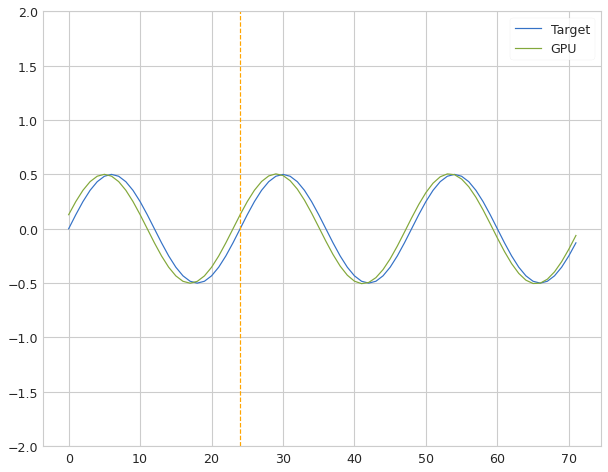

 Iter=72 a=0.889 sr=0.100 amp=0.221  ri=0.851 rr=4.421 loss=0.072044


Iter: 72 #### Diagnostic 0.072   Time 2.95  Best 0.072 NRMSE 0.072 CD 0.020
Iter: 73 #### Diagnostic 0.092   Time 3.31  Best 0.072 NRMSE 0.092 CD 0.034
Iter: 74 #### Diagnostic 0.092   Time 2.45  Best 0.072 NRMSE 0.092 CD 0.034
Iter: 75 #### Diagnostic 0.094   Time 1.83  Best 0.072 NRMSE 0.094 CD 0.035
Iter: 76 #### Diagnostic 0.093   Time 1.44  Best 0.072 NRMSE 0.093 CD 0.035
Iter: 77 #### Diagnostic 0.093   Time 1.26  Best 0.072 NRMSE 0.093 CD 0.035
Iter: 78 #### Diagnostic 0.092   Time 1.45  Best 0.072 NRMSE 0.092 CD 0.034
Iter: 79 #### Diagnostic 0.093   Time 2.00  Best 0.072 NRMSE 0.093 CD 0.035
Iter: 80 #### Diagnostic 0.092   Time 2.02  Best 0.072 NRMSE 0.092 CD 0.034
Iter: 81 #### Diagnostic 0.104   Time 1.42  Best 0.072 NRMSE 0.104 CD 0.043
Iter: 82 #### Diagnostic 0.098   Time 1.03  Best 0.072 NRMSE 0.098 CD 0.037
Iter: 83 #### Diagnostic 0.093   Time 1.22  Best 0.072 NRMSE 0.093 CD 0.034
Iter: 84 #### Dia

Iter: 74 #### Diagnostic 0.096   Time 2.11  Best 1000.000 NRMSE 0.096 CD 0.037
Iter: 75 #### Diagnostic 0.092   Time 1.75  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 76 #### Diagnostic 0.093   Time 1.24  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 77 #### Diagnostic 0.092   Time 1.31  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 78 #### Diagnostic 0.091   Time 1.10  Best 1000.000 NRMSE 0.091 CD 0.033
Iter: 79 #### Diagnostic 0.093   Time 2.63  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 80 #### Diagnostic 0.105   Time 2.90  Best 1000.000 NRMSE 0.105 CD 0.044
Iter: 81 #### Diagnostic 0.092   Time 2.46  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 82 #### Diagnostic 0.093   Time 1.47  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 83 #### Diagnostic 0.093   Time 1.68  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 84 #### Diagnostic 0.091   Time 2.47  Best 1000.000 NRMSE 0.091 CD 0.033
Iter: 85 #### Diagnostic 0.505   Time 2.59  Best 1000.000 NRMSE 0.505 CD 0.068
Iter: 86 #### Diagnostic 0.101   Time 1.85  Best 100

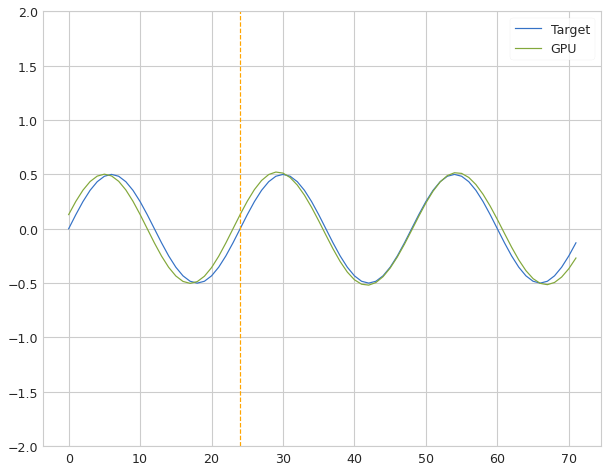

 Iter=30 a=0.979 sr=0.619 amp=0.086  ri=0.840 rr=0.572 loss=0.060123


Iter: 30 #### Diagnostic 0.060   Time 3.29  Best 0.060 NRMSE 0.060 CD 0.012
Iter: 31 #### Diagnostic 0.093   Time 2.68  Best 0.060 NRMSE 0.093 CD 0.034
Iter: 32 #### Diagnostic 0.093   Time 2.46  Best 0.060 NRMSE 0.093 CD 0.034
Iter: 33 #### Diagnostic 0.092   Time 2.08  Best 0.060 NRMSE 0.092 CD 0.034
Iter: 34 #### Diagnostic 0.094   Time 1.84  Best 0.060 NRMSE 0.094 CD 0.036
Iter: 35 #### Diagnostic 0.093   Time 1.07  Best 0.060 NRMSE 0.093 CD 0.035
Iter: 36 #### Diagnostic 0.092   Time 1.45  Best 0.060 NRMSE 0.092 CD 0.034
Iter: 37 #### Diagnostic 0.093   Time 0.91  Best 0.060 NRMSE 0.093 CD 0.035
Iter: 38 #### Diagnostic 0.092   Time 1.43  Best 0.060 NRMSE 0.092 CD 0.034
Iter: 39 #### Diagnostic 0.092   Time 1.27  Best 0.060 NRMSE 0.092 CD 0.034
Iter: 40 #### Diagnostic 0.093   Time 1.66  Best 0.060 NRMSE 0.093 CD 0.034
Iter: 41 #### Diagnostic 0.093   Time 1.96  Best 0.060 NRMSE 0.093 CD 0.034
Iter: 42 #### Dia

Iter: 26 #### Diagnostic 0.093   Time 1.38  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 27 #### Diagnostic 0.092   Time 0.95  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 28 #### Diagnostic 0.092   Time 0.42  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 29 #### Diagnostic 0.372   Time 0.87  Best 1000.000 NRMSE 0.372 CD 1.042
Iter: 30 #### Diagnostic 0.096   Time 0.90  Best 1000.000 NRMSE 0.096 CD 0.019
Iter: 31 #### Diagnostic 0.093   Time 2.10  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 32 #### Diagnostic 9.207   Time 1.84  Best 1000.000 NRMSE 9.207 CD 0.998
Iter: 33 #### Diagnostic 0.093   Time 1.81  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 34 #### Diagnostic 0.093   Time 1.34  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 35 #### Diagnostic 0.092   Time 1.23  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 36 #### Diagnostic 0.095   Time 1.38  Best 1000.000 NRMSE 0.095 CD 0.036
Iter: 37 #### Diagnostic 0.092   Time 2.18  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 38 #### Diagnostic 0.092   Time 2.27  Best 100

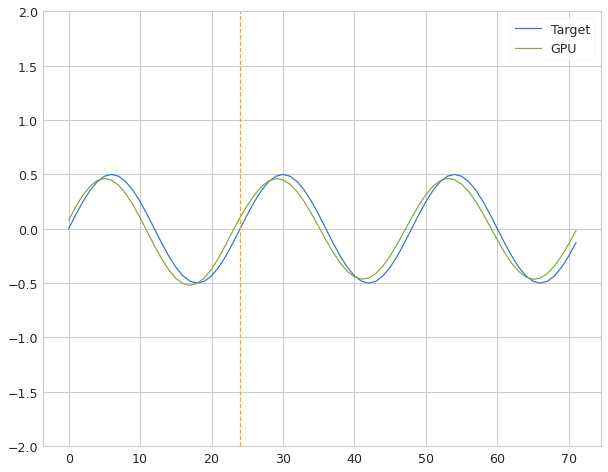

 Iter=56 a=0.143 sr=0.832 amp=0.984  ri=0.947 rr=0.372 loss=0.079404


Iter: 56 #### Diagnostic 0.079   Time 1.54  Best 0.079 NRMSE 0.079 CD 0.024
Iter: 57 #### Diagnostic 0.092   Time 1.71  Best 0.079 NRMSE 0.092 CD 0.034
Iter: 58 #### Diagnostic 0.094   Time 1.90  Best 0.079 NRMSE 0.094 CD 0.035
Iter: 59 #### Diagnostic 0.093   Time 1.76  Best 0.079 NRMSE 0.093 CD 0.035
Iter: 60 #### Diagnostic 0.093   Time 1.78  Best 0.079 NRMSE 0.093 CD 0.034
Iter: 61 #### Diagnostic 0.093   Time 2.05  Best 0.079 NRMSE 0.093 CD 0.034
Iter: 62 #### Diagnostic 0.096   Time 2.12  Best 0.079 NRMSE 0.096 CD 0.037
Iter: 63 #### Diagnostic 0.092   Time 2.48  Best 0.079 NRMSE 0.092 CD 0.034
Iter: 64 #### Diagnostic 0.092   Time 1.88  Best 0.079 NRMSE 0.092 CD 0.034
Iter: 65 #### Diagnostic 0.093   Time 1.56  Best 0.079 NRMSE 0.093 CD 0.034
Iter: 66 #### Diagnostic 0.092   Time 1.21  Best 0.079 NRMSE 0.092 CD 0.034
Iter: 67 #### Diagnostic 0.093   Time 1.30  Best 0.079 NRMSE 0.093 CD 0.035
Iter: 68 #### Dia

Iter: 59 #### Diagnostic 0.090   Time 2.16  Best 1000.000 NRMSE 0.090 CD 0.033
Iter: 60 #### Diagnostic 0.092   Time 2.70  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 61 #### Diagnostic 0.093   Time 2.36  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 62 #### Diagnostic 0.093   Time 1.97  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 63 #### Diagnostic 0.092   Time 2.04  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 64 #### Diagnostic 0.093   Time 0.89  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 65 #### Diagnostic 0.092   Time 1.20  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 66 #### Diagnostic 0.094   Time 0.99  Best 1000.000 NRMSE 0.094 CD 0.034
Iter: 67 #### Diagnostic 0.093   Time 0.89  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 68 #### Diagnostic 0.092   Time 1.44  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 69 #### Diagnostic 0.092   Time 1.45  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 70 #### Diagnostic 0.092   Time 1.55  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 71 #### Diagnostic 0.092   Time 1.01  Best 100

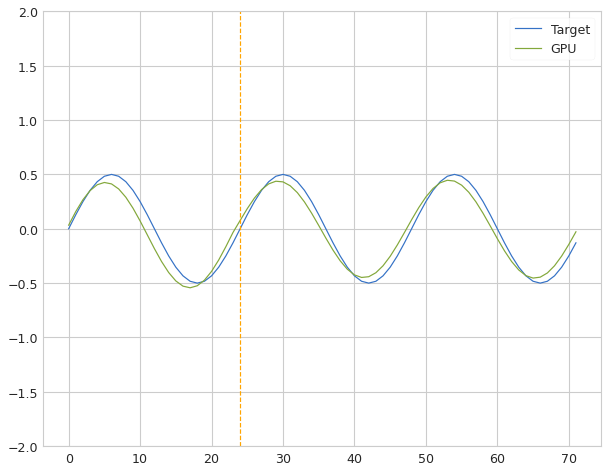

 Iter=73 a=0.213 sr=1.070 amp=0.925  ri=0.834 rr=1.647 loss=0.074361


Iter: 73 #### Diagnostic 0.074   Time 1.09  Best 0.074 NRMSE 0.074 CD 0.018
Iter: 74 #### Diagnostic 0.094   Time 2.52  Best 0.074 NRMSE 0.094 CD 0.035
Iter: 75 #### Diagnostic 0.093   Time 2.79  Best 0.074 NRMSE 0.093 CD 0.034
Iter: 76 #### Diagnostic 0.093   Time 2.62  Best 0.074 NRMSE 0.093 CD 0.034
Iter: 77 #### Diagnostic 0.093   Time 2.38  Best 0.074 NRMSE 0.093 CD 0.034
Iter: 78 #### Diagnostic 0.093   Time 1.05  Best 0.074 NRMSE 0.093 CD 0.035
Iter: 79 #### Diagnostic 0.149   Time 1.23  Best 0.074 NRMSE 0.149 CD 0.056
Iter: 80 #### Diagnostic 0.092   Time 0.83  Best 0.074 NRMSE 0.092 CD 0.034
Iter: 81 #### Diagnostic 0.144   Time 0.91  Best 0.074 NRMSE 0.144 CD 0.055
Iter: 82 #### Diagnostic 1.971   Time 1.25  Best 0.074 NRMSE 1.971 CD 1.949
Iter: 83 #### Diagnostic 0.092   Time 1.49  Best 0.074 NRMSE 0.092 CD 0.034
Iter: 84 #### Diagnostic 0.092   Time 1.35  Best 0.074 NRMSE 0.092 CD 0.034
Iter: 85 #### Dia

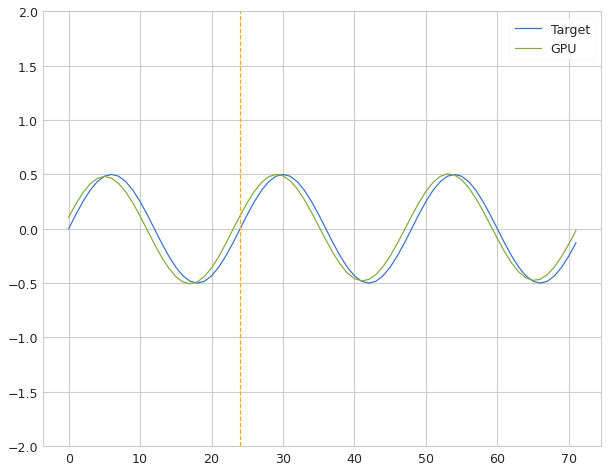

 Iter=64 a=0.608 sr=1.147 amp=0.883  ri=0.626 rr=3.353 loss=0.078168


Iter: 64 #### Diagnostic 0.078   Time 2.57  Best 0.078 NRMSE 0.078 CD 0.025
Iter: 65 #### Diagnostic 0.094   Time 1.47  Best 0.078 NRMSE 0.094 CD 0.035
Iter: 66 #### Diagnostic 2.353   Time 1.01  Best 0.078 NRMSE 2.353 CD 0.027
Iter: 67 #### Diagnostic 0.092   Time 1.02  Best 0.078 NRMSE 0.092 CD 0.034
Iter: 68 #### Diagnostic 0.093   Time 1.23  Best 0.078 NRMSE 0.093 CD 0.034
Iter: 69 #### Diagnostic 0.090   Time 1.87  Best 0.078 NRMSE 0.090 CD 0.033
Iter: 70 #### Diagnostic 0.097   Time 1.67  Best 0.078 NRMSE 0.097 CD 0.038
Iter: 71 #### Diagnostic 0.179   Time 1.70  Best 0.078 NRMSE 0.179 CD 0.061
Iter: 72 #### Diagnostic 0.084   Time 1.37  Best 0.078 NRMSE 0.084 CD 0.028
Iter: 73 #### Diagnostic 0.092   Time 1.77  Best 0.078 NRMSE 0.092 CD 0.034
Iter: 74 #### Diagnostic 0.093   Time 1.69  Best 0.078 NRMSE 0.093 CD 0.034
Iter: 75 #### Diagnostic 0.093   Time 1.43  Best 0.078 NRMSE 0.093 CD 0.035
Iter: 76 #### Dia

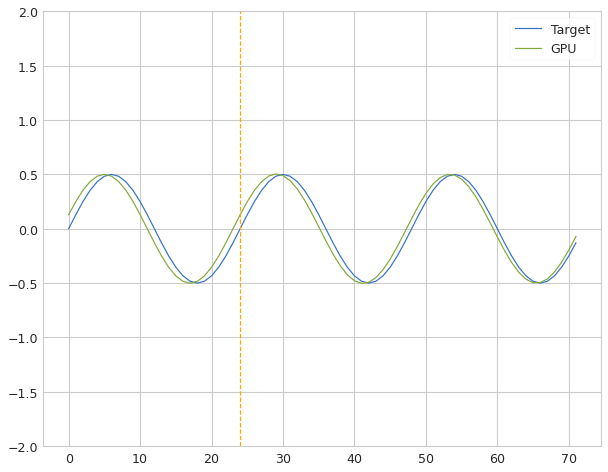

 Iter=85 a=0.889 sr=0.187 amp=0.095  ri=0.949 rr=1.347 loss=0.068460


Iter: 85 #### Diagnostic 0.068   Time 2.49  Best 0.068 NRMSE 0.068 CD 0.019
Iter: 86 #### Diagnostic 0.092   Time 1.41  Best 0.068 NRMSE 0.092 CD 0.034
Iter: 87 #### Diagnostic 0.092   Time 1.95  Best 0.068 NRMSE 0.092 CD 0.034
Iter: 88 #### Diagnostic 0.079   Time 1.45  Best 0.068 NRMSE 0.079 CD 0.025
Iter: 89 #### Diagnostic 0.093   Time 1.01  Best 0.068 NRMSE 0.093 CD 0.035
Iter: 90 #### Diagnostic 0.092   Time 1.78  Best 0.068 NRMSE 0.092 CD 0.034
Iter: 91 #### Diagnostic 0.092   Time 2.33  Best 0.068 NRMSE 0.092 CD 0.034
Iter: 92 #### Diagnostic 0.092   Time 2.04  Best 0.068 NRMSE 0.092 CD 0.034
Iter: 93 #### Diagnostic 0.092   Time 1.94  Best 0.068 NRMSE 0.092 CD 0.034
Iter: 94 #### Diagnostic 0.092   Time 1.75  Best 0.068 NRMSE 0.092 CD 0.034
Iter: 95 #### Diagnostic 0.093   Time 1.05  Best 0.068 NRMSE 0.093 CD 0.034
Iter: 96 #### Diagnostic 0.092   Time 1.27  Best 0.068 NRMSE 0.092 CD 0.034
Iter: 97 #### Dia

Iter: 87 #### Diagnostic 0.092   Time 0.55  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 88 #### Diagnostic 0.094   Time 1.08  Best 1000.000 NRMSE 0.094 CD 0.035
Iter: 89 #### Diagnostic 0.092   Time 1.43  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 90 #### Diagnostic 0.092   Time 1.86  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 91 #### Diagnostic 0.092   Time 2.34  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 92 #### Diagnostic 0.095   Time 2.37  Best 1000.000 NRMSE 0.095 CD 0.036
Iter: 93 #### Diagnostic 0.088   Time 2.21  Best 1000.000 NRMSE 0.088 CD 0.031
Iter: 94 #### Diagnostic 0.095   Time 1.55  Best 1000.000 NRMSE 0.095 CD 0.035
Iter: 95 #### Diagnostic 0.092   Time 1.43  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 96 #### Diagnostic 0.097   Time 1.09  Best 1000.000 NRMSE 0.097 CD 0.038
Iter: 97 #### Diagnostic 0.091   Time 0.96  Best 1000.000 NRMSE 0.091 CD 0.034
Iter: 98 #### Diagnostic 0.091   Time 1.12  Best 1000.000 NRMSE 0.091 CD 0.033
Iter: 99 #### Diagnostic 0.093   Time 1.41  Best 100

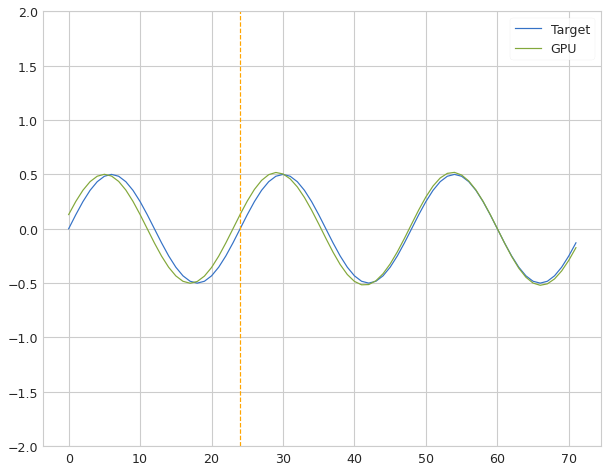

 Iter=30 a=0.979 sr=0.619 amp=0.086  ri=0.840 rr=0.572 loss=0.052205


Iter: 30 #### Diagnostic 0.052   Time 3.52  Best 0.052 NRMSE 0.052 CD 0.009
Iter: 31 #### Diagnostic 0.093   Time 1.43  Best 0.052 NRMSE 0.093 CD 0.034
Iter: 32 #### Diagnostic 0.092   Time 1.14  Best 0.052 NRMSE 0.092 CD 0.034
Iter: 33 #### Diagnostic 0.092   Time 1.34  Best 0.052 NRMSE 0.092 CD 0.034
Iter: 34 #### Diagnostic 0.089   Time 1.75  Best 0.052 NRMSE 0.089 CD 0.032
Iter: 35 #### Diagnostic 0.093   Time 1.09  Best 0.052 NRMSE 0.093 CD 0.035
Iter: 36 #### Diagnostic 0.092   Time 1.02  Best 0.052 NRMSE 0.092 CD 0.034
Iter: 37 #### Diagnostic 0.093   Time 1.11  Best 0.052 NRMSE 0.093 CD 0.035
Iter: 38 #### Diagnostic 0.092   Time 1.14  Best 0.052 NRMSE 0.092 CD 0.034
Iter: 39 #### Diagnostic 0.092   Time 1.10  Best 0.052 NRMSE 0.092 CD 0.034
Iter: 40 #### Diagnostic 0.093   Time 1.64  Best 0.052 NRMSE 0.093 CD 0.034
Iter: 41 #### Diagnostic 0.097   Time 1.62  Best 0.052 NRMSE 0.097 CD 0.037
Iter: 42 #### Dia

Iter: 26 #### Diagnostic 0.093   Time 1.14  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 27 #### Diagnostic 0.092   Time 0.98  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 28 #### Diagnostic 0.092   Time 1.83  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 29 #### Diagnostic 0.373   Time 2.64  Best 1000.000 NRMSE 0.373 CD 1.033
Iter: 30 #### Diagnostic 0.144   Time 2.54  Best 1000.000 NRMSE 0.144 CD 0.004
Iter: 31 #### Diagnostic 0.093   Time 1.60  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 32 #### Diagnostic 3.503   Time 1.55  Best 1000.000 NRMSE 3.503 CD 0.985
Iter: 33 #### Diagnostic 0.099   Time 1.45  Best 1000.000 NRMSE 0.099 CD 0.039
Iter: 34 #### Diagnostic 0.093   Time 0.76  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 35 #### Diagnostic 0.092   Time 1.22  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 36 #### Diagnostic 0.100   Time 1.46  Best 1000.000 NRMSE 0.100 CD 0.040
Iter: 37 #### Diagnostic 0.095   Time 0.71  Best 1000.000 NRMSE 0.095 CD 0.036
Iter: 38 #### Diagnostic 0.093   Time 0.89  Best 100

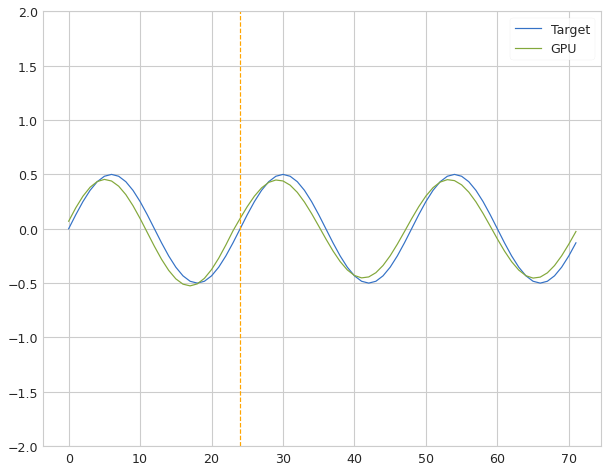

 Iter=56 a=0.143 sr=0.832 amp=0.984  ri=0.947 rr=0.372 loss=0.077074


Iter: 56 #### Diagnostic 0.077   Time 1.93  Best 0.077 NRMSE 0.077 CD 0.021
Iter: 57 #### Diagnostic 0.099   Time 1.21  Best 0.077 NRMSE 0.099 CD 0.039
Iter: 58 #### Diagnostic 0.093   Time 0.90  Best 0.077 NRMSE 0.093 CD 0.035
Iter: 59 #### Diagnostic 0.093   Time 0.92  Best 0.077 NRMSE 0.093 CD 0.035
Iter: 60 #### Diagnostic 0.092   Time 1.23  Best 0.077 NRMSE 0.092 CD 0.034
Iter: 61 #### Diagnostic 0.093   Time 0.85  Best 0.077 NRMSE 0.093 CD 0.034
Iter: 62 #### Diagnostic 0.085   Time 1.91  Best 0.077 NRMSE 0.085 CD 0.029
Iter: 63 #### Diagnostic 0.092   Time 1.75  Best 0.077 NRMSE 0.092 CD 0.034
Iter: 64 #### Diagnostic 0.092   Time 1.25  Best 0.077 NRMSE 0.092 CD 0.034
Iter: 65 #### Diagnostic 0.092   Time 1.26  Best 0.077 NRMSE 0.092 CD 0.034
Iter: 66 #### Diagnostic 0.094   Time 0.48  Best 0.077 NRMSE 0.094 CD 0.035
Iter: 67 #### Diagnostic 0.094   Time 1.07  Best 0.077 NRMSE 0.094 CD 0.035
Iter: 68 #### Dia

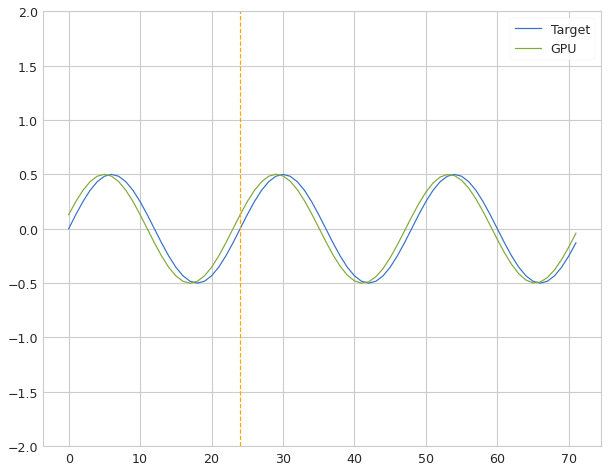

 Iter=22 a=0.715 sr=0.107 amp=0.159  ri=0.672 rr=2.005 loss=0.078007


Iter: 22 #### Diagnostic 0.078   Time 3.11  Best 0.078 NRMSE 0.078 CD 0.024
Iter: 23 #### Diagnostic 0.093   Time 1.34  Best 0.078 NRMSE 0.093 CD 0.034
Iter: 24 #### Diagnostic 0.092   Time 1.80  Best 0.078 NRMSE 0.092 CD 0.034
Iter: 25 #### Diagnostic 0.093   Time 1.15  Best 0.078 NRMSE 0.093 CD 0.034
Iter: 26 #### Diagnostic 0.090   Time 1.11  Best 0.078 NRMSE 0.090 CD 0.024
Iter: 27 #### Diagnostic 0.092   Time 1.22  Best 0.078 NRMSE 0.092 CD 0.034
Iter: 28 #### Diagnostic 0.092   Time 1.39  Best 0.078 NRMSE 0.092 CD 0.035
Iter: 29 #### Diagnostic 0.092   Time 1.40  Best 0.078 NRMSE 0.092 CD 0.034
Iter: 30 #### Diagnostic 0.093   Time 1.32  Best 0.078 NRMSE 0.093 CD 0.034
Iter: 31 #### Diagnostic 0.092   Time 1.48  Best 0.078 NRMSE 0.092 CD 0.034
Iter: 32 #### Diagnostic 2.373   Time 1.51  Best 0.078 NRMSE 2.373 CD 1.933
Iter: 33 #### Diagnostic 0.092   Time 1.92  Best 0.078 NRMSE 0.092 CD 0.034
Iter: 34 #### Dia

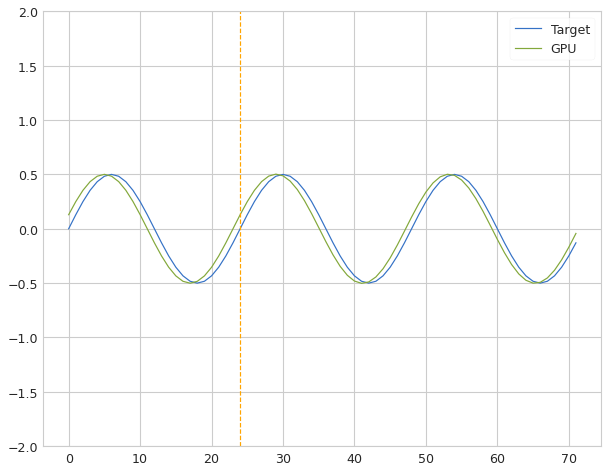

 Iter=42 a=0.748 sr=0.128 amp=0.469  ri=0.608 rr=1.853 loss=0.077563


Iter: 42 #### Diagnostic 0.078   Time 1.53  Best 0.078 NRMSE 0.078 CD 0.024
Iter: 43 #### Diagnostic 0.094   Time 1.26  Best 0.078 NRMSE 0.094 CD 0.035
Iter: 44 #### Diagnostic 0.096   Time 1.10  Best 0.078 NRMSE 0.096 CD 0.037
Iter: 45 #### Diagnostic 0.097   Time 1.16  Best 0.078 NRMSE 0.097 CD 0.038
Iter: 46 #### Diagnostic 0.092   Time 1.55  Best 0.078 NRMSE 0.092 CD 0.034
Iter: 47 #### Diagnostic 0.094   Time 2.15  Best 0.078 NRMSE 0.094 CD 0.035
Iter: 48 #### Diagnostic 0.095   Time 2.00  Best 0.078 NRMSE 0.095 CD 0.036
Iter: 49 #### Diagnostic 0.370   Time 2.67  Best 0.078 NRMSE 0.370 CD 1.165
Iter: 50 #### Diagnostic 0.093   Time 1.35  Best 0.078 NRMSE 0.093 CD 0.034
Iter: 51 #### Diagnostic 0.093   Time 1.55  Best 0.078 NRMSE 0.093 CD 0.034
Iter: 52 #### Diagnostic 0.092   Time 1.87  Best 0.078 NRMSE 0.092 CD 0.034
Iter: 53 #### Diagnostic 0.082   Time 1.43  Best 0.078 NRMSE 0.082 CD 0.026
Iter: 54 #### Dia

Iter: 45 #### Diagnostic 0.100   Time 1.85  Best 1000.000 NRMSE 0.100 CD 0.040
Iter: 46 #### Diagnostic 0.096   Time 1.55  Best 1000.000 NRMSE 0.096 CD 0.037
Iter: 47 #### Diagnostic 0.092   Time 2.81  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 48 #### Diagnostic 0.171   Time 2.18  Best 1000.000 NRMSE 0.171 CD 0.050
Iter: 49 #### Diagnostic 0.093   Time 1.78  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 50 #### Diagnostic 0.087   Time 1.90  Best 1000.000 NRMSE 0.087 CD 0.029
Iter: 51 #### Diagnostic 0.093   Time 1.35  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 52 #### Diagnostic 0.092   Time 1.10  Best 1000.000 NRMSE 0.092 CD 0.027
Iter: 53 #### Diagnostic 0.094   Time 0.87  Best 1000.000 NRMSE 0.094 CD 0.035
Iter: 54 #### Diagnostic 0.123   Time 0.97  Best 1000.000 NRMSE 0.123 CD 0.061
Iter: 55 #### Diagnostic 0.093   Time 1.62  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 56 #### Diagnostic 0.089   Time 2.25  Best 1000.000 NRMSE 0.089 CD 0.032
Iter: 57 #### Diagnostic 1.036   Time 2.22  Best 100

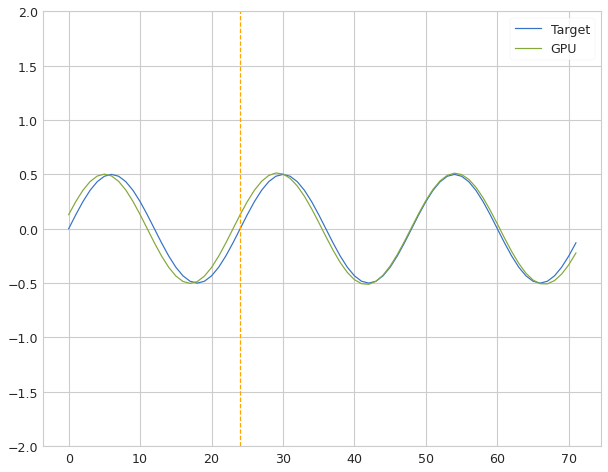

 Iter=37 a=0.953 sr=0.070 amp=0.298  ri=0.653 rr=4.602 loss=0.049989


Iter: 37 #### Diagnostic 0.050   Time 2.78  Best 0.050 NRMSE 0.050 CD 0.009
Iter: 38 #### Diagnostic 2.775   Time 2.57  Best 0.050 NRMSE 2.775 CD 1.954
Iter: 39 #### Diagnostic 0.091   Time 1.74  Best 0.050 NRMSE 0.091 CD 0.033
Iter: 40 #### Diagnostic 0.092   Time 2.30  Best 0.050 NRMSE 0.092 CD 0.034
Iter: 41 #### Diagnostic 0.089   Time 2.64  Best 0.050 NRMSE 0.089 CD 0.031
Iter: 42 #### Diagnostic 0.093   Time 2.62  Best 0.050 NRMSE 0.093 CD 0.035
Iter: 43 #### Diagnostic 0.092   Time 2.32  Best 0.050 NRMSE 0.092 CD 0.034
Iter: 44 #### Diagnostic 0.093   Time 1.08  Best 0.050 NRMSE 0.093 CD 0.035
Iter: 45 #### Diagnostic 0.103   Time 1.57  Best 0.050 NRMSE 0.103 CD 0.029
Iter: 46 #### Diagnostic 0.092   Time 1.45  Best 0.050 NRMSE 0.092 CD 0.034
Iter: 47 #### Diagnostic 0.093   Time 1.55  Best 0.050 NRMSE 0.093 CD 0.034
Iter: 48 #### Diagnostic 0.092   Time 1.42  Best 0.050 NRMSE 0.092 CD 0.034
Iter: 49 #### Dia

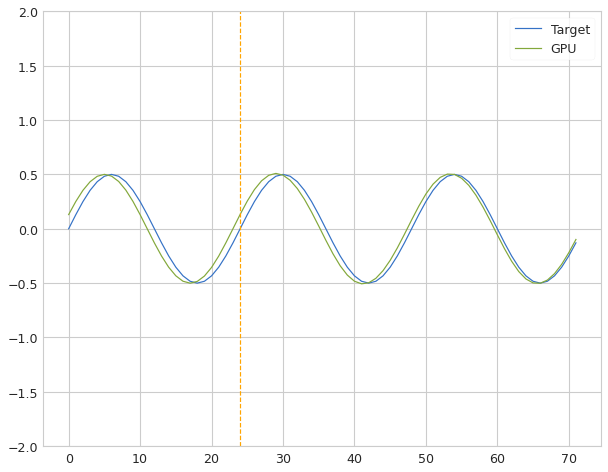

 Iter=30 a=0.979 sr=0.619 amp=0.086  ri=0.840 rr=0.572 loss=0.063228


Iter: 30 #### Diagnostic 0.063   Time 2.08  Best 0.063 NRMSE 0.063 CD 0.015
Iter: 31 #### Diagnostic 0.093   Time 1.36  Best 0.063 NRMSE 0.093 CD 0.034
Iter: 32 #### Diagnostic 0.092   Time 0.63  Best 0.063 NRMSE 0.092 CD 0.034
Iter: 33 #### Diagnostic 0.092   Time 0.51  Best 0.063 NRMSE 0.092 CD 0.034
Iter: 34 #### Diagnostic 0.087   Time 1.06  Best 0.063 NRMSE 0.087 CD 0.030
Iter: 35 #### Diagnostic 0.093   Time 1.52  Best 0.063 NRMSE 0.093 CD 0.035
Iter: 36 #### Diagnostic 0.092   Time 1.08  Best 0.063 NRMSE 0.092 CD 0.034
Iter: 37 #### Diagnostic 0.092   Time 1.79  Best 0.063 NRMSE 0.092 CD 0.034
Iter: 38 #### Diagnostic 0.092   Time 2.08  Best 0.063 NRMSE 0.092 CD 0.034
Iter: 39 #### Diagnostic 0.092   Time 2.21  Best 0.063 NRMSE 0.092 CD 0.034
Iter: 40 #### Diagnostic 0.093   Time 1.58  Best 0.063 NRMSE 0.093 CD 0.034
Iter: 41 #### Diagnostic 0.098   Time 2.09  Best 0.063 NRMSE 0.098 CD 0.038
Iter: 42 #### Dia

Iter: 26 #### Diagnostic 0.093   Time 1.95  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 27 #### Diagnostic 0.092   Time 1.72  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 28 #### Diagnostic 0.092   Time 1.54  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 29 #### Diagnostic 0.375   Time 1.58  Best 1000.000 NRMSE 0.375 CD 1.017
Iter: 30 #### Diagnostic 0.096   Time 2.17  Best 1000.000 NRMSE 0.096 CD 0.036
Iter: 31 #### Diagnostic 0.093   Time 1.59  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 32 #### Diagnostic 7.079   Time 1.55  Best 1000.000 NRMSE 7.079 CD 0.987
Iter: 33 #### Diagnostic 0.088   Time 1.71  Best 1000.000 NRMSE 0.088 CD 0.031
Iter: 34 #### Diagnostic 0.093   Time 2.04  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 35 #### Diagnostic 0.092   Time 2.09  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 36 #### Diagnostic 0.093   Time 1.58  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 37 #### Diagnostic 0.096   Time 1.74  Best 1000.000 NRMSE 0.096 CD 0.037
Iter: 38 #### Diagnostic 0.092   Time 1.79  Best 100

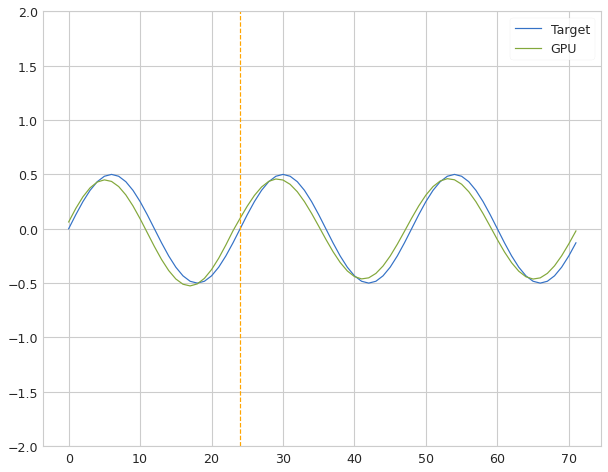

 Iter=56 a=0.143 sr=0.832 amp=0.984  ri=0.947 rr=0.372 loss=0.077434


Iter: 56 #### Diagnostic 0.077   Time 2.12  Best 0.077 NRMSE 0.077 CD 0.023
Iter: 57 #### Diagnostic 0.096   Time 2.14  Best 0.077 NRMSE 0.096 CD 0.037
Iter: 58 #### Diagnostic 0.093   Time 1.88  Best 0.077 NRMSE 0.093 CD 0.034
Iter: 59 #### Diagnostic 0.093   Time 1.78  Best 0.077 NRMSE 0.093 CD 0.035
Iter: 60 #### Diagnostic 0.092   Time 1.61  Best 0.077 NRMSE 0.092 CD 0.034
Iter: 61 #### Diagnostic 0.093   Time 1.48  Best 0.077 NRMSE 0.093 CD 0.034
Iter: 62 #### Diagnostic 0.104   Time 1.47  Best 0.077 NRMSE 0.104 CD 0.043
Iter: 63 #### Diagnostic 0.092   Time 0.82  Best 0.077 NRMSE 0.092 CD 0.034
Iter: 64 #### Diagnostic 0.092   Time 0.78  Best 0.077 NRMSE 0.092 CD 0.034
Iter: 65 #### Diagnostic 0.093   Time 0.96  Best 0.077 NRMSE 0.093 CD 0.034
Iter: 66 #### Diagnostic 0.092   Time 0.78  Best 0.077 NRMSE 0.092 CD 0.034
Iter: 67 #### Diagnostic 0.093   Time 0.84  Best 0.077 NRMSE 0.093 CD 0.035
Iter: 68 #### Dia

Iter: 59 #### Diagnostic 0.089   Time 1.40  Best 1000.000 NRMSE 0.089 CD 0.032
Iter: 60 #### Diagnostic 0.092   Time 1.74  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 61 #### Diagnostic 0.093   Time 1.25  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 62 #### Diagnostic 0.093   Time 1.08  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 63 #### Diagnostic 0.092   Time 1.11  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 64 #### Diagnostic 0.092   Time 0.50  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 65 #### Diagnostic 0.092   Time 1.23  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 66 #### Diagnostic 0.093   Time 1.22  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 67 #### Diagnostic 0.093   Time 1.30  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 68 #### Diagnostic 0.093   Time 1.43  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 69 #### Diagnostic 0.092   Time 2.18  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 70 #### Diagnostic 0.092   Time 1.75  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 71 #### Diagnostic 0.092   Time 1.47  Best 100

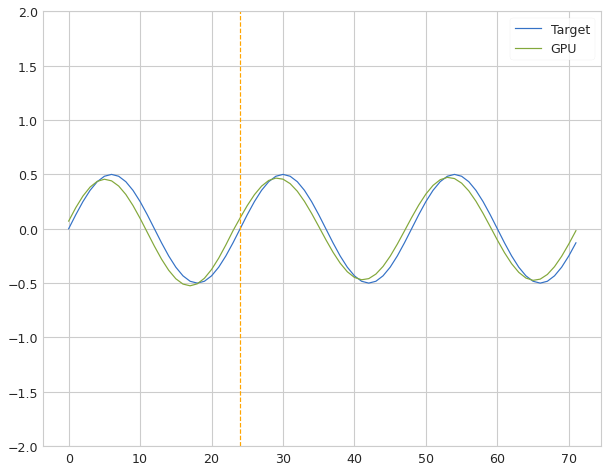

 Iter=73 a=0.213 sr=1.070 amp=0.925  ri=0.834 rr=1.647 loss=0.077515


Iter: 73 #### Diagnostic 0.078   Time 2.89  Best 0.078 NRMSE 0.078 CD 0.024
Iter: 74 #### Diagnostic 0.093   Time 0.76  Best 0.078 NRMSE 0.093 CD 0.035
Iter: 75 #### Diagnostic 0.092   Time 0.79  Best 0.078 NRMSE 0.092 CD 0.034
Iter: 76 #### Diagnostic 0.092   Time 1.08  Best 0.078 NRMSE 0.092 CD 0.034
Iter: 77 #### Diagnostic 0.093   Time 0.55  Best 0.078 NRMSE 0.093 CD 0.034
Iter: 78 #### Diagnostic 0.092   Time 1.16  Best 0.078 NRMSE 0.092 CD 0.034
Iter: 79 #### Diagnostic 0.235   Time 1.03  Best 0.078 NRMSE 0.235 CD 0.062
Iter: 80 #### Diagnostic 0.092   Time 0.56  Best 0.078 NRMSE 0.092 CD 0.034
Iter: 81 #### Diagnostic 0.394   Time 0.84  Best 0.078 NRMSE 0.394 CD 1.043
Iter: 82 #### Diagnostic 12.444   Time 1.27  Best 0.078 NRMSE 12.444 CD 0.987
Iter: 83 #### Diagnostic 0.092   Time 1.39  Best 0.078 NRMSE 0.092 CD 0.034
Iter: 84 #### Diagnostic 0.094   Time 0.98  Best 0.078 NRMSE 0.094 CD 0.035
Iter: 85 #### D

Iter: 75 #### Diagnostic 0.093   Time 0.92  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 76 #### Diagnostic 0.095   Time 0.96  Best 1000.000 NRMSE 0.095 CD 0.036
Iter: 77 #### Diagnostic 0.093   Time 1.11  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 78 #### Diagnostic 0.092   Time 1.72  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 79 #### Diagnostic 0.093   Time 1.53  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 80 #### Diagnostic 0.092   Time 1.49  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 81 #### Diagnostic 0.094   Time 1.85  Best 1000.000 NRMSE 0.094 CD 0.035
Iter: 82 #### Diagnostic 0.169   Time 1.44  Best 1000.000 NRMSE 0.169 CD 0.055
Iter: 83 #### Diagnostic 0.093   Time 1.51  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 84 #### Diagnostic 0.093   Time 1.27  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 85 #### Diagnostic 0.111   Time 1.69  Best 1000.000 NRMSE 0.111 CD 0.049
Iter: 86 #### Diagnostic 0.092   Time 1.30  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 87 #### Diagnostic 0.092   Time 1.58  Best 100

Iter: 77 #### Diagnostic 0.092   Time 1.88  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 78 #### Diagnostic 0.094   Time 0.80  Best 1000.000 NRMSE 0.094 CD 0.035
Iter: 79 #### Diagnostic 0.093   Time 1.63  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 80 #### Diagnostic 0.094   Time 1.86  Best 1000.000 NRMSE 0.094 CD 0.036
Iter: 81 #### Diagnostic 0.092   Time 1.31  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 82 #### Diagnostic 0.093   Time 1.78  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 83 #### Diagnostic 0.092   Time 1.48  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 84 #### Diagnostic 0.094   Time 1.58  Best 1000.000 NRMSE 0.094 CD 0.035
Iter: 85 #### Diagnostic 1.864   Time 1.75  Best 1000.000 NRMSE 1.864 CD 1.864
Iter: 86 #### Diagnostic 0.089   Time 0.97  Best 1000.000 NRMSE 0.089 CD 0.031
Iter: 87 #### Diagnostic 0.094   Time 1.56  Best 1000.000 NRMSE 0.094 CD 0.035
Iter: 88 #### Diagnostic 0.094   Time 1.16  Best 1000.000 NRMSE 0.094 CD 0.035
Iter: 89 #### Diagnostic 0.092   Time 0.84  Best 100

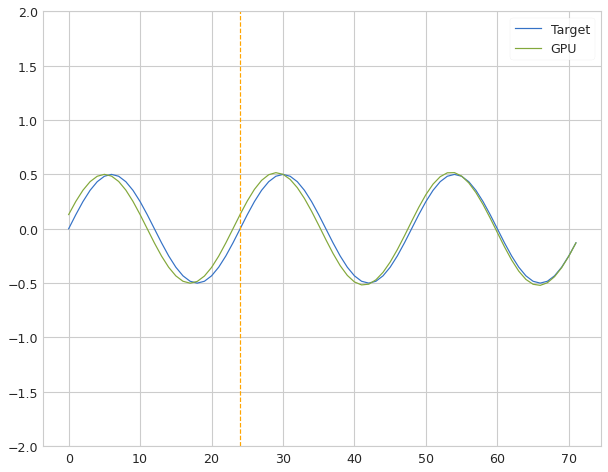

 Iter=30 a=0.979 sr=0.619 amp=0.086  ri=0.840 rr=0.572 loss=0.058589


Iter: 30 #### Diagnostic 0.059   Time 1.79  Best 0.059 NRMSE 0.059 CD 0.012
Iter: 31 #### Diagnostic 0.093   Time 1.74  Best 0.059 NRMSE 0.093 CD 0.034
Iter: 32 #### Diagnostic 0.093   Time 1.62  Best 0.059 NRMSE 0.093 CD 0.034
Iter: 33 #### Diagnostic 0.092   Time 1.80  Best 0.059 NRMSE 0.092 CD 0.034
Iter: 34 #### Diagnostic 0.098   Time 1.42  Best 0.059 NRMSE 0.098 CD 0.038
Iter: 35 #### Diagnostic 0.093   Time 1.43  Best 0.059 NRMSE 0.093 CD 0.034
Iter: 36 #### Diagnostic 0.092   Time 1.71  Best 0.059 NRMSE 0.092 CD 0.034
Iter: 37 #### Diagnostic 0.092   Time 1.17  Best 0.059 NRMSE 0.092 CD 0.034
Iter: 38 #### Diagnostic 0.092   Time 0.96  Best 0.059 NRMSE 0.092 CD 0.034
Iter: 39 #### Diagnostic 0.092   Time 1.67  Best 0.059 NRMSE 0.092 CD 0.034
Iter: 40 #### Diagnostic 0.093   Time 1.93  Best 0.059 NRMSE 0.093 CD 0.034
Iter: 41 #### Diagnostic 0.091   Time 1.85  Best 0.059 NRMSE 0.091 CD 0.033
Iter: 42 #### Dia

Iter: 26 #### Diagnostic 0.092   Time 1.91  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 27 #### Diagnostic 0.092   Time 1.48  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 28 #### Diagnostic 0.092   Time 1.39  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 29 #### Diagnostic 0.386   Time 1.21  Best 1000.000 NRMSE 0.386 CD 0.968
Iter: 30 #### Diagnostic 0.095   Time 1.30  Best 1000.000 NRMSE 0.095 CD 0.020
Iter: 31 #### Diagnostic 0.093   Time 1.33  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 32 #### Diagnostic 1.002   Time 0.87  Best 1000.000 NRMSE 1.002 CD 1.022
Iter: 33 #### Diagnostic 0.095   Time 1.45  Best 1000.000 NRMSE 0.095 CD 0.037
Iter: 34 #### Diagnostic 0.093   Time 0.68  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 35 #### Diagnostic 0.092   Time 0.43  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 36 #### Diagnostic 0.096   Time 0.48  Best 1000.000 NRMSE 0.096 CD 0.037
Iter: 37 #### Diagnostic 0.091   Time 0.42  Best 1000.000 NRMSE 0.091 CD 0.033
Iter: 38 #### Diagnostic 0.093   Time 0.41  Best 100

Iter: 28 #### Diagnostic 0.102   Time 1.52  Best 1000.000 NRMSE 0.102 CD 0.042
Iter: 29 #### Diagnostic 0.093   Time 1.75  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 30 #### Diagnostic 0.093   Time 1.49  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 31 #### Diagnostic 0.093   Time 1.36  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 32 #### Diagnostic 2.320   Time 1.34  Best 1000.000 NRMSE 2.320 CD 1.918
Iter: 33 #### Diagnostic 0.093   Time 0.99  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 34 #### Diagnostic 0.092   Time 0.79  Best 1000.000 NRMSE 0.092 CD 0.034


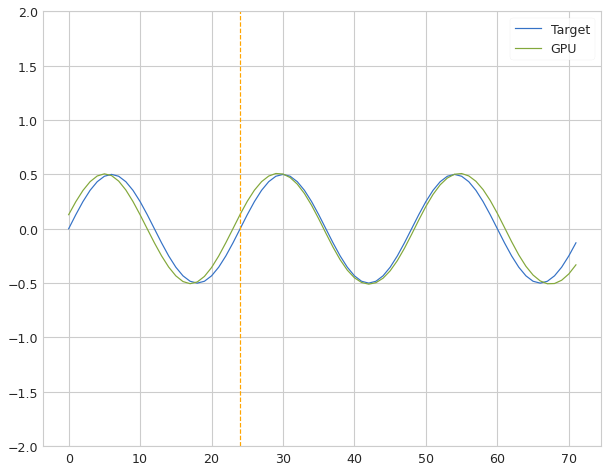

 Iter=35 a=0.982 sr=0.862 amp=0.092  ri=0.394 rr=3.226 loss=0.077521


Iter: 35 #### Diagnostic 0.078   Time 2.45  Best 0.078 NRMSE 0.078 CD 0.021
Iter: 36 #### Diagnostic 0.093   Time 1.36  Best 0.078 NRMSE 0.093 CD 0.035
Iter: 37 #### Diagnostic 0.090   Time 0.99  Best 0.078 NRMSE 0.090 CD 0.033
Iter: 38 #### Diagnostic 0.092   Time 1.41  Best 0.078 NRMSE 0.092 CD 0.034
Iter: 39 #### Diagnostic 0.092   Time 1.09  Best 0.078 NRMSE 0.092 CD 0.034
Iter: 40 #### Diagnostic 0.095   Time 1.26  Best 0.078 NRMSE 0.095 CD 0.036
Iter: 41 #### Diagnostic 0.093   Time 1.69  Best 0.078 NRMSE 0.093 CD 0.034
Iter: 42 #### Diagnostic 0.079   Time 1.98  Best 0.078 NRMSE 0.079 CD 0.025
Iter: 43 #### Diagnostic 0.094   Time 1.81  Best 0.078 NRMSE 0.094 CD 0.035
Iter: 44 #### Diagnostic 0.093   Time 1.72  Best 0.078 NRMSE 0.093 CD 0.035
Iter: 45 #### Diagnostic 0.092   Time 0.90  Best 0.078 NRMSE 0.092 CD 0.034
Iter: 46 #### Diagnostic 0.092   Time 2.39  Best 0.078 NRMSE 0.092 CD 0.034
Iter: 47 #### Dia

Iter: 39 #### Diagnostic 0.099   Time 1.49  Best 1000.000 NRMSE 0.099 CD 0.039
Iter: 40 #### Diagnostic 0.092   Time 1.12  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 41 #### Diagnostic 0.093   Time 1.09  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 42 #### Diagnostic 0.093   Time 1.09  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 43 #### Diagnostic 0.369   Time 1.54  Best 1000.000 NRMSE 0.369 CD 1.252
Iter: 44 #### Diagnostic 0.092   Time 1.35  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 45 #### Diagnostic 0.098   Time 1.16  Best 1000.000 NRMSE 0.098 CD 0.039
Iter: 46 #### Diagnostic 0.097   Time 1.26  Best 1000.000 NRMSE 0.097 CD 0.038
Iter: 47 #### Diagnostic 0.092   Time 1.23  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 48 #### Diagnostic 0.089   Time 1.82  Best 1000.000 NRMSE 0.089 CD 0.023
Iter: 49 #### Diagnostic 0.093   Time 1.62  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 50 #### Diagnostic 0.096   Time 1.41  Best 1000.000 NRMSE 0.096 CD 0.037
Iter: 51 #### Diagnostic 0.093   Time 0.97  Best 100

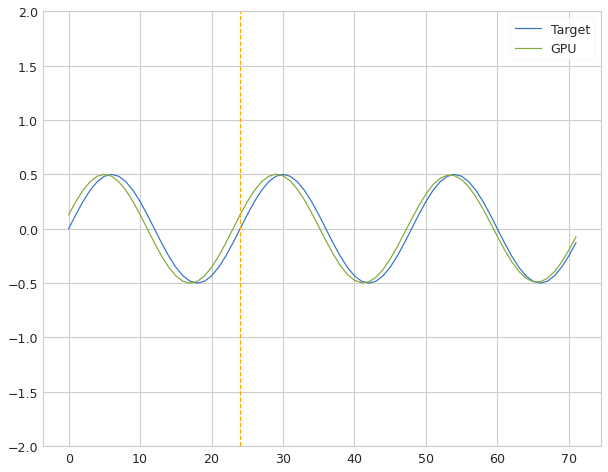

 Iter=85 a=0.889 sr=0.187 amp=0.095  ri=0.949 rr=1.347 loss=0.066582


Iter: 85 #### Diagnostic 0.067   Time 1.49  Best 0.067 NRMSE 0.067 CD 0.018
Iter: 86 #### Diagnostic 0.092   Time 1.06  Best 0.067 NRMSE 0.092 CD 0.034
Iter: 87 #### Diagnostic 0.092   Time 1.52  Best 0.067 NRMSE 0.092 CD 0.034
Iter: 88 #### Diagnostic 0.111   Time 1.23  Best 0.067 NRMSE 0.111 CD 0.049
Iter: 89 #### Diagnostic 0.093   Time 1.32  Best 0.067 NRMSE 0.093 CD 0.035
Iter: 90 #### Diagnostic 0.092   Time 1.03  Best 0.067 NRMSE 0.092 CD 0.034
Iter: 91 #### Diagnostic 0.091   Time 0.94  Best 0.067 NRMSE 0.091 CD 0.033
Iter: 92 #### Diagnostic 0.092   Time 1.17  Best 0.067 NRMSE 0.092 CD 0.034
Iter: 93 #### Diagnostic 0.092   Time 1.85  Best 0.067 NRMSE 0.092 CD 0.034
Iter: 94 #### Diagnostic 0.092   Time 2.22  Best 0.067 NRMSE 0.092 CD 0.034
Iter: 95 #### Diagnostic 0.092   Time 1.76  Best 0.067 NRMSE 0.092 CD 0.034
Iter: 96 #### Diagnostic 0.092   Time 1.74  Best 0.067 NRMSE 0.092 CD 0.034
Iter: 97 #### Dia

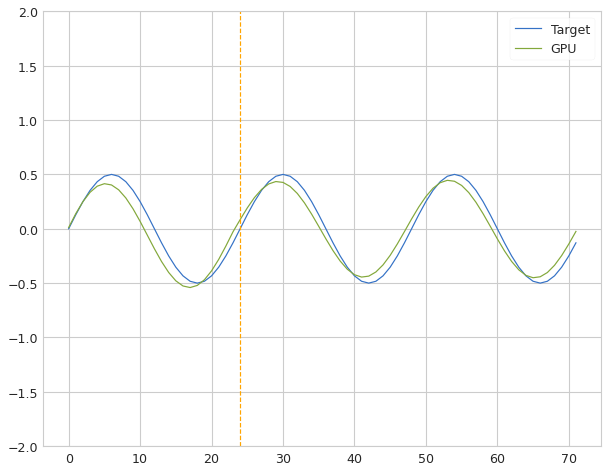

 Iter=14 a=0.348 sr=1.189 amp=0.747  ri=0.875 rr=4.658 loss=0.078911


Iter: 14 #### Diagnostic 0.079   Time 1.96  Best 0.079 NRMSE 0.079 CD 0.021
Iter: 15 #### Diagnostic 0.092   Time 1.29  Best 0.079 NRMSE 0.092 CD 0.034
Iter: 16 #### Diagnostic 0.214   Time 1.48  Best 0.079 NRMSE 0.214 CD 0.076
Iter: 17 #### Diagnostic 0.092   Time 1.19  Best 0.079 NRMSE 0.092 CD 0.034
Iter: 18 #### Diagnostic 0.093   Time 1.62  Best 0.079 NRMSE 0.093 CD 0.035
Iter: 19 #### Diagnostic 0.091   Time 1.66  Best 0.079 NRMSE 0.091 CD 0.034
Iter: 20 #### Diagnostic 0.092   Time 1.44  Best 0.079 NRMSE 0.092 CD 0.034
Iter: 21 #### Diagnostic 0.092   Time 1.39  Best 0.079 NRMSE 0.092 CD 0.034
Iter: 22 #### Diagnostic 0.093   Time 1.46  Best 0.079 NRMSE 0.093 CD 0.034
Iter: 23 #### Diagnostic 0.092   Time 0.93  Best 0.079 NRMSE 0.092 CD 0.034
Iter: 24 #### Diagnostic 0.094   Time 1.34  Best 0.079 NRMSE 0.094 CD 0.035
Iter: 25 #### Diagnostic 0.093   Time 1.48  Best 0.079 NRMSE 0.093 CD 0.035
Iter: 26 #### Dia

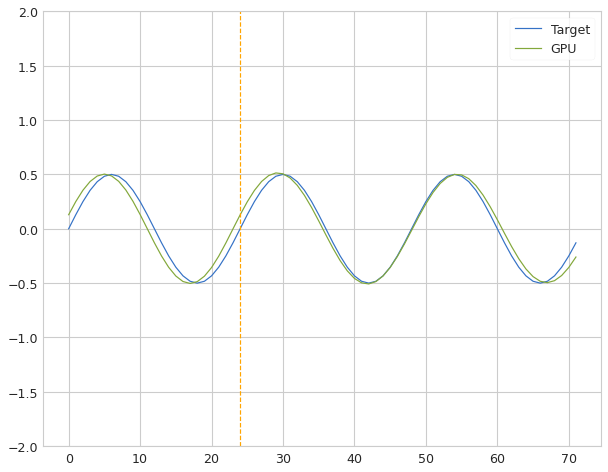

 Iter=37 a=0.953 sr=0.070 amp=0.298  ri=0.653 rr=4.602 loss=0.056857


Iter: 37 #### Diagnostic 0.057   Time 2.10  Best 0.057 NRMSE 0.057 CD 0.012
Iter: 38 #### Diagnostic 0.454   Time 0.83  Best 0.057 NRMSE 0.454 CD 1.445
Iter: 39 #### Diagnostic 0.092   Time 1.56  Best 0.057 NRMSE 0.092 CD 0.034
Iter: 40 #### Diagnostic 0.092   Time 1.28  Best 0.057 NRMSE 0.092 CD 0.034
Iter: 41 #### Diagnostic 0.087   Time 1.46  Best 0.057 NRMSE 0.087 CD 0.030
Iter: 42 #### Diagnostic 0.093   Time 1.43  Best 0.057 NRMSE 0.093 CD 0.035
Iter: 43 #### Diagnostic 0.093   Time 0.54  Best 0.057 NRMSE 0.093 CD 0.034
Iter: 44 #### Diagnostic 0.092   Time 0.50  Best 0.057 NRMSE 0.092 CD 0.034
Iter: 45 #### Diagnostic 0.094   Time 0.87  Best 0.057 NRMSE 0.094 CD 0.035
Iter: 46 #### Diagnostic 0.092   Time 1.44  Best 0.057 NRMSE 0.092 CD 0.034
Iter: 47 #### Diagnostic 0.094   Time 1.94  Best 0.057 NRMSE 0.094 CD 0.035
Iter: 48 #### Diagnostic 0.092   Time 1.95  Best 0.057 NRMSE 0.092 CD 0.034
Iter: 49 #### Dia

Iter: 40 #### Diagnostic 0.092   Time 1.21  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 41 #### Diagnostic 0.099   Time 1.07  Best 1000.000 NRMSE 0.099 CD 0.039
Iter: 42 #### Diagnostic 0.092   Time 0.88  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 43 #### Diagnostic 0.442   Time 1.06  Best 1000.000 NRMSE 0.442 CD 0.066
Iter: 44 #### Diagnostic 0.093   Time 1.46  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 45 #### Diagnostic 0.092   Time 1.20  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 46 #### Diagnostic 1.263   Time 1.14  Best 1000.000 NRMSE 1.263 CD 1.842
Iter: 47 #### Diagnostic 0.096   Time 1.18  Best 1000.000 NRMSE 0.096 CD 0.037
Iter: 48 #### Diagnostic 0.093   Time 1.40  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 49 #### Diagnostic 0.092   Time 1.88  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 50 #### Diagnostic 0.093   Time 1.94  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 51 #### Diagnostic 0.274   Time 1.54  Best 1000.000 NRMSE 0.274 CD 0.039
Iter: 52 #### Diagnostic 16.868   Time 1.99  Best 10

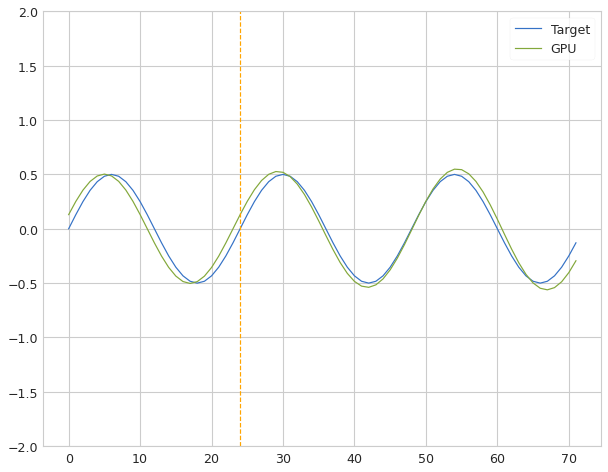

 Iter=65 a=0.943 sr=0.335 amp=0.079  ri=0.790 rr=0.476 loss=0.070108


Iter: 65 #### Diagnostic 0.070   Time 2.94  Best 0.070 NRMSE 0.070 CD 0.012
Iter: 66 #### Diagnostic 0.093   Time 1.58  Best 0.070 NRMSE 0.093 CD 0.034
Iter: 67 #### Diagnostic 0.093   Time 1.51  Best 0.070 NRMSE 0.093 CD 0.035
Iter: 68 #### Diagnostic 0.090   Time 1.83  Best 0.070 NRMSE 0.090 CD 0.033
Iter: 69 #### Diagnostic 0.093   Time 1.26  Best 0.070 NRMSE 0.093 CD 0.034
Iter: 70 #### Diagnostic 0.091   Time 1.40  Best 0.070 NRMSE 0.091 CD 0.034
Iter: 71 #### Diagnostic 0.092   Time 1.42  Best 0.070 NRMSE 0.092 CD 0.034
Iter: 72 #### Diagnostic 0.092   Time 1.37  Best 0.070 NRMSE 0.092 CD 0.034
Iter: 73 #### Diagnostic 0.093   Time 1.24  Best 0.070 NRMSE 0.093 CD 0.035
Iter: 74 #### Diagnostic 0.092   Time 1.58  Best 0.070 NRMSE 0.092 CD 0.034
Iter: 75 #### Diagnostic 0.208   Time 1.11  Best 0.070 NRMSE 0.208 CD 0.191
Iter: 76 #### Diagnostic 0.093   Time 1.41  Best 0.070 NRMSE 0.093 CD 0.035
Iter: 77 #### Dia

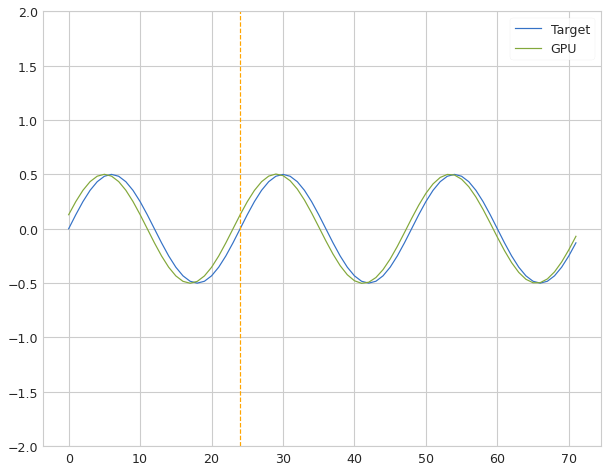

 Iter=17 a=0.924 sr=0.889 amp=0.320  ri=0.025 rr=4.308 loss=0.068978


Iter: 17 #### Diagnostic 0.069   Time 3.07  Best 0.069 NRMSE 0.069 CD 0.019
Iter: 18 #### Diagnostic 0.092   Time 1.13  Best 0.069 NRMSE 0.092 CD 0.034
Iter: 19 #### Diagnostic 0.090   Time 1.36  Best 0.069 NRMSE 0.090 CD 0.033
Iter: 20 #### Diagnostic 0.086   Time 1.46  Best 0.069 NRMSE 0.086 CD 0.030
Iter: 21 #### Diagnostic 0.092   Time 1.50  Best 0.069 NRMSE 0.092 CD 0.034
Iter: 22 #### Diagnostic 0.092   Time 1.78  Best 0.069 NRMSE 0.092 CD 0.034
Iter: 23 #### Diagnostic 0.092   Time 1.50  Best 0.069 NRMSE 0.092 CD 0.034
Iter: 24 #### Diagnostic 0.095   Time 1.65  Best 0.069 NRMSE 0.095 CD 0.036
Iter: 25 #### Diagnostic 0.093   Time 1.06  Best 0.069 NRMSE 0.093 CD 0.034
Iter: 26 #### Diagnostic 0.093   Time 1.02  Best 0.069 NRMSE 0.093 CD 0.034
Iter: 27 #### Diagnostic 0.092   Time 1.06  Best 0.069 NRMSE 0.092 CD 0.034
Iter: 28 #### Diagnostic 0.092   Time 1.07  Best 0.069 NRMSE 0.092 CD 0.034
Iter: 29 #### Dia

Iter: 21 #### Diagnostic 0.095   Time 1.59  Best 1000.000 NRMSE 0.095 CD 0.036
Iter: 22 #### Diagnostic 0.095   Time 1.45  Best 1000.000 NRMSE 0.095 CD 0.036
Iter: 23 #### Diagnostic 0.093   Time 1.36  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 24 #### Diagnostic 0.092   Time 1.24  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 25 #### Diagnostic 0.093   Time 1.48  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 26 #### Diagnostic 0.097   Time 0.96  Best 1000.000 NRMSE 0.097 CD 0.036
Iter: 27 #### Diagnostic 0.093   Time 1.40  Best 1000.000 NRMSE 0.093 CD 0.034


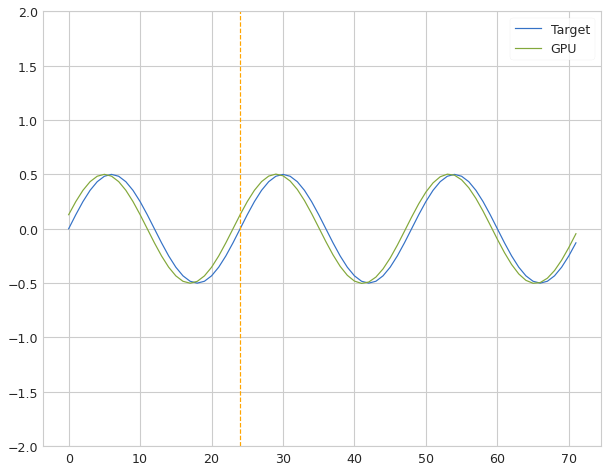

 Iter=28 a=0.837 sr=0.173 amp=0.262  ri=0.585 rr=3.430 loss=0.076903


Iter: 28 #### Diagnostic 0.077   Time 2.54  Best 0.077 NRMSE 0.077 CD 0.023
Iter: 29 #### Diagnostic 0.091   Time 1.94  Best 0.077 NRMSE 0.091 CD 0.033
Iter: 30 #### Diagnostic 0.092   Time 0.98  Best 0.077 NRMSE 0.092 CD 0.034
Iter: 31 #### Diagnostic 0.092   Time 1.65  Best 0.077 NRMSE 0.092 CD 0.034
Iter: 32 #### Diagnostic 2.411   Time 1.46  Best 0.077 NRMSE 2.411 CD 0.356
Iter: 33 #### Diagnostic 0.092   Time 1.30  Best 0.077 NRMSE 0.092 CD 0.034
Iter: 34 #### Diagnostic 0.092   Time 1.27  Best 0.077 NRMSE 0.092 CD 0.034
Iter: 35 #### Diagnostic 0.081   Time 1.19  Best 0.077 NRMSE 0.081 CD 0.023
Iter: 36 #### Diagnostic 0.093   Time 1.36  Best 0.077 NRMSE 0.093 CD 0.035
Iter: 37 #### Diagnostic 0.090   Time 1.29  Best 0.077 NRMSE 0.090 CD 0.033
Iter: 38 #### Diagnostic 0.091   Time 1.77  Best 0.077 NRMSE 0.091 CD 0.033
Iter: 39 #### Diagnostic 0.093   Time 1.56  Best 0.077 NRMSE 0.093 CD 0.035
Iter: 40 #### Dia

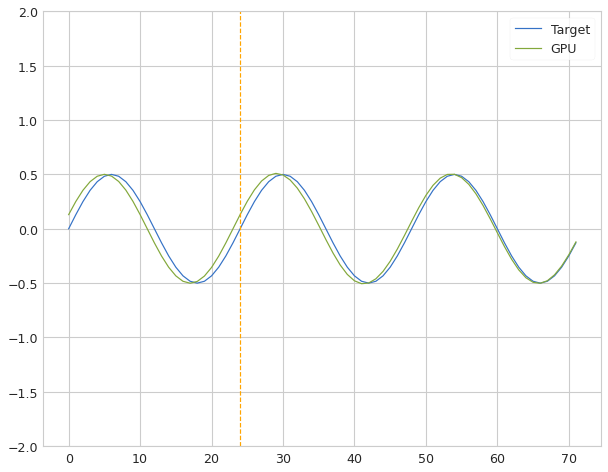

 Iter=15 a=0.926 sr=0.334 amp=0.177  ri=0.990 rr=3.464 loss=0.056853


Iter: 15 #### Diagnostic 0.057   Time 1.51  Best 0.057 NRMSE 0.057 CD 0.012
Iter: 16 #### Diagnostic 0.097   Time 1.55  Best 0.057 NRMSE 0.097 CD 0.038
Iter: 17 #### Diagnostic 0.093   Time 1.69  Best 0.057 NRMSE 0.093 CD 0.034
Iter: 18 #### Diagnostic 0.094   Time 1.48  Best 0.057 NRMSE 0.094 CD 0.035
Iter: 19 #### Diagnostic 0.092   Time 1.63  Best 0.057 NRMSE 0.092 CD 0.034
Iter: 20 #### Diagnostic 0.092   Time 1.81  Best 0.057 NRMSE 0.092 CD 0.034
Iter: 21 #### Diagnostic 0.092   Time 1.32  Best 0.057 NRMSE 0.092 CD 0.034
Iter: 22 #### Diagnostic 0.093   Time 1.36  Best 0.057 NRMSE 0.093 CD 0.034
Iter: 23 #### Diagnostic 0.092   Time 1.37  Best 0.057 NRMSE 0.092 CD 0.034
Iter: 24 #### Diagnostic 0.093   Time 1.10  Best 0.057 NRMSE 0.093 CD 0.035
Iter: 25 #### Diagnostic 0.092   Time 0.92  Best 0.057 NRMSE 0.092 CD 0.034
Iter: 26 #### Diagnostic 0.094   Time 1.05  Best 0.057 NRMSE 0.094 CD 0.035
Iter: 27 #### Dia

Iter: 19 #### Diagnostic 0.093   Time 1.26  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 20 #### Diagnostic 0.093   Time 0.76  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 21 #### Diagnostic 0.092   Time 1.26  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 22 #### Diagnostic 0.092   Time 1.02  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 23 #### Diagnostic 0.093   Time 1.53  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 24 #### Diagnostic 0.093   Time 1.95  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 25 #### Diagnostic 0.092   Time 1.20  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 26 #### Diagnostic 0.094   Time 1.08  Best 1000.000 NRMSE 0.094 CD 0.035
Iter: 27 #### Diagnostic 0.092   Time 1.46  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 28 #### Diagnostic 0.087   Time 1.08  Best 1000.000 NRMSE 0.087 CD 0.030
Iter: 29 #### Diagnostic 0.099   Time 1.38  Best 1000.000 NRMSE 0.099 CD 0.040
Iter: 30 #### Diagnostic 0.094   Time 2.00  Best 1000.000 NRMSE 0.094 CD 0.035
Iter: 31 #### Diagnostic 0.092   Time 2.45  Best 100

Iter: 21 #### Diagnostic 0.093   Time 1.91  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 22 #### Diagnostic 0.094   Time 1.24  Best 1000.000 NRMSE 0.094 CD 0.035
Iter: 23 #### Diagnostic 0.112   Time 0.59  Best 1000.000 NRMSE 0.112 CD 0.050
Iter: 24 #### Diagnostic 0.094   Time 1.48  Best 1000.000 NRMSE 0.094 CD 0.035
Iter: 25 #### Diagnostic 0.092   Time 0.92  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 26 #### Diagnostic 0.092   Time 0.68  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 27 #### Diagnostic 0.093   Time 1.53  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 28 #### Diagnostic 0.092   Time 1.81  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 29 #### Diagnostic 0.091   Time 1.28  Best 1000.000 NRMSE 0.091 CD 0.033
Iter: 30 #### Diagnostic 0.110   Time 1.43  Best 1000.000 NRMSE 0.110 CD 0.049
Iter: 31 #### Diagnostic 0.093   Time 2.72  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 32 #### Diagnostic 0.093   Time 2.36  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 33 #### Diagnostic 0.092   Time 1.77  Best 100

Iter: 16 #### Diagnostic 0.093   Time 1.02  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 17 #### Diagnostic 0.106   Time 1.08  Best 1000.000 NRMSE 0.106 CD 0.045
Iter: 18 #### Diagnostic 0.092   Time 1.42  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 19 #### Diagnostic 0.090   Time 0.95  Best 1000.000 NRMSE 0.090 CD 0.032
Iter: 20 #### Diagnostic 0.092   Time 1.15  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 21 #### Diagnostic 0.092   Time 1.16  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 22 #### Diagnostic 0.092   Time 1.27  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 23 #### Diagnostic 0.092   Time 0.85  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 24 #### Diagnostic 0.095   Time 1.01  Best 1000.000 NRMSE 0.095 CD 0.036
Iter: 25 #### Diagnostic 0.093   Time 0.83  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 26 #### Diagnostic 0.092   Time 1.05  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 27 #### Diagnostic 0.092   Time 0.92  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 28 #### Diagnostic 0.092   Time 1.44  Best 100

Iter: 18 #### Diagnostic 0.092   Time 1.28  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 19 #### Diagnostic 0.335   Time 1.20  Best 1000.000 NRMSE 0.335 CD 0.654
Iter: 20 #### Diagnostic 0.092   Time 1.25  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 21 #### Diagnostic 0.095   Time 0.97  Best 1000.000 NRMSE 0.095 CD 0.036
Iter: 22 #### Diagnostic 0.095   Time 1.11  Best 1000.000 NRMSE 0.095 CD 0.037
Iter: 23 #### Diagnostic 0.093   Time 0.68  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 24 #### Diagnostic 0.091   Time 0.40  Best 1000.000 NRMSE 0.091 CD 0.033
Iter: 25 #### Diagnostic 0.093   Time 0.86  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 26 #### Diagnostic 0.089   Time 0.54  Best 1000.000 NRMSE 0.089 CD 0.031
Iter: 27 #### Diagnostic 0.092   Time 1.08  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 28 #### Diagnostic 0.101   Time 0.80  Best 1000.000 NRMSE 0.101 CD 0.041
Iter: 29 #### Diagnostic 0.093   Time 1.09  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 30 #### Diagnostic 0.093   Time 0.72  Best 100

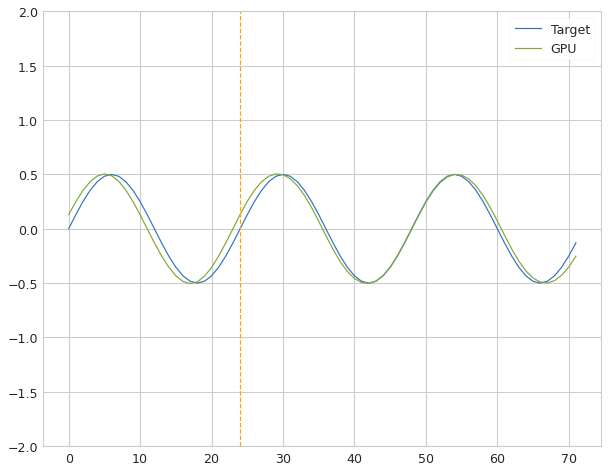

 Iter=35 a=0.982 sr=0.862 amp=0.092  ri=0.394 rr=3.226 loss=0.054004


Iter: 35 #### Diagnostic 0.054   Time 1.87  Best 0.054 NRMSE 0.054 CD 0.011
Iter: 36 #### Diagnostic 0.093   Time 1.73  Best 0.054 NRMSE 0.093 CD 0.035
Iter: 37 #### Diagnostic 0.100   Time 1.29  Best 0.054 NRMSE 0.100 CD 0.038
Iter: 38 #### Diagnostic 0.092   Time 1.40  Best 0.054 NRMSE 0.092 CD 0.034
Iter: 39 #### Diagnostic 0.093   Time 0.85  Best 0.054 NRMSE 0.093 CD 0.034
Iter: 40 #### Diagnostic 0.092   Time 1.55  Best 0.054 NRMSE 0.092 CD 0.034
Iter: 41 #### Diagnostic 0.092   Time 0.69  Best 0.054 NRMSE 0.092 CD 0.034
Iter: 42 #### Diagnostic 0.092   Time 0.94  Best 0.054 NRMSE 0.092 CD 0.034
Iter: 43 #### Diagnostic 0.095   Time 0.99  Best 0.054 NRMSE 0.095 CD 0.036
Iter: 44 #### Diagnostic 0.088   Time 1.44  Best 0.054 NRMSE 0.088 CD 0.031
Iter: 45 #### Diagnostic 0.092   Time 1.03  Best 0.054 NRMSE 0.092 CD 0.034
Iter: 46 #### Diagnostic 0.092   Time 0.90  Best 0.054 NRMSE 0.092 CD 0.034
Iter: 47 #### Dia

Iter: 39 #### Diagnostic 0.095   Time 0.53  Best 1000.000 NRMSE 0.095 CD 0.036
Iter: 40 #### Diagnostic 0.092   Time 1.14  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 41 #### Diagnostic 0.093   Time 1.15  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 42 #### Diagnostic 0.093   Time 0.65  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 43 #### Diagnostic 0.373   Time 0.95  Best 1000.000 NRMSE 0.373 CD 1.100
Iter: 44 #### Diagnostic 0.092   Time 0.81  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 45 #### Diagnostic 0.104   Time 1.17  Best 1000.000 NRMSE 0.104 CD 0.044
Iter: 46 #### Diagnostic 0.090   Time 1.26  Best 1000.000 NRMSE 0.090 CD 0.032
Iter: 47 #### Diagnostic 0.092   Time 1.10  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 48 #### Diagnostic 0.112   Time 1.05  Best 1000.000 NRMSE 0.112 CD 0.040
Iter: 49 #### Diagnostic 0.093   Time 1.22  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 50 #### Diagnostic 0.088   Time 1.44  Best 1000.000 NRMSE 0.088 CD 0.031
Iter: 51 #### Diagnostic 0.093   Time 1.23  Best 100

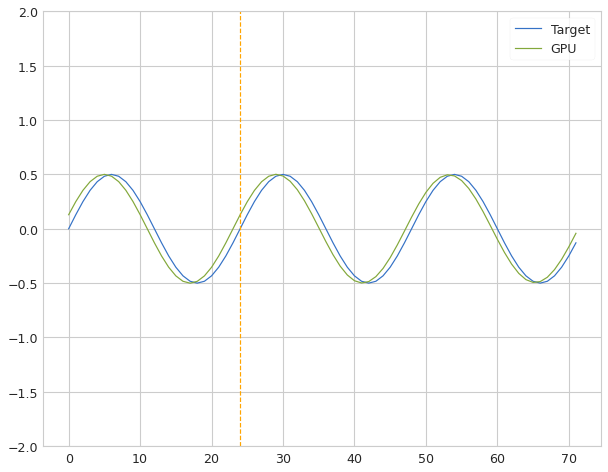

 Iter=81 a=0.958 sr=0.662 amp=0.714  ri=0.761 rr=1.584 loss=0.077588


Iter: 81 #### Diagnostic 0.078   Time 1.18  Best 0.078 NRMSE 0.078 CD 0.024
Iter: 82 #### Diagnostic 0.321   Time 1.18  Best 0.078 NRMSE 0.321 CD 0.537
Iter: 83 #### Diagnostic 0.093   Time 1.08  Best 0.078 NRMSE 0.093 CD 0.034
Iter: 84 #### Diagnostic 0.092   Time 0.92  Best 0.078 NRMSE 0.092 CD 0.034
Iter: 85 #### Diagnostic 0.091   Time 1.00  Best 0.078 NRMSE 0.091 CD 0.033
Iter: 86 #### Diagnostic 0.093   Time 1.66  Best 0.078 NRMSE 0.093 CD 0.034
Iter: 87 #### Diagnostic 0.092   Time 1.62  Best 0.078 NRMSE 0.092 CD 0.034
Iter: 88 #### Diagnostic 0.135   Time 1.30  Best 0.078 NRMSE 0.135 CD 0.074
Iter: 89 #### Diagnostic 0.092   Time 1.12  Best 0.078 NRMSE 0.092 CD 0.034
Iter: 90 #### Diagnostic 0.092   Time 1.10  Best 0.078 NRMSE 0.092 CD 0.034
Iter: 91 #### Diagnostic 0.091   Time 1.13  Best 0.078 NRMSE 0.091 CD 0.034
Iter: 92 #### Diagnostic 0.092   Time 1.00  Best 0.078 NRMSE 0.092 CD 0.034
Iter: 93 #### Dia

Iter: 83 #### Diagnostic 0.093   Time 1.53  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 84 #### Diagnostic 0.093   Time 1.11  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 85 #### Diagnostic 6.856   Time 1.44  Best 1000.000 NRMSE 6.856 CD 0.666
Iter: 86 #### Diagnostic 0.093   Time 1.15  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 87 #### Diagnostic 0.094   Time 1.08  Best 1000.000 NRMSE 0.094 CD 0.035
Iter: 88 #### Diagnostic 0.093   Time 0.97  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 89 #### Diagnostic 0.092   Time 1.35  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 90 #### Diagnostic 0.092   Time 1.37  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 91 #### Diagnostic 0.092   Time 1.73  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 92 #### Diagnostic 0.095   Time 1.92  Best 1000.000 NRMSE 0.095 CD 0.036
Iter: 93 #### Diagnostic 0.101   Time 1.48  Best 1000.000 NRMSE 0.101 CD 0.041
Iter: 94 #### Diagnostic 0.136   Time 1.64  Best 1000.000 NRMSE 0.136 CD 0.076
Iter: 95 #### Diagnostic 0.092   Time 1.29  Best 100

Iter: 85 #### Diagnostic 0.092   Time 0.45  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 86 #### Diagnostic 2.453   Time 0.60  Best 1000.000 NRMSE 2.453 CD 0.093
Iter: 87 #### Diagnostic 0.093   Time 0.75  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 88 #### Diagnostic 0.093   Time 0.73  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 89 #### Diagnostic 0.093   Time 1.05  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 90 #### Diagnostic 0.093   Time 1.61  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 91 #### Diagnostic 0.092   Time 1.49  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 92 #### Diagnostic 2.834   Time 1.41  Best 1000.000 NRMSE 2.834 CD 0.043
Iter: 93 #### Diagnostic 0.093   Time 1.40  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 94 #### Diagnostic 0.087   Time 1.88  Best 1000.000 NRMSE 0.087 CD 0.031
Iter: 95 #### Diagnostic 1000.000   Time 1.28  Best 1000.000 NRMSE 48203911719550246912.000 CD 1.000
Iter: 96 #### Diagnostic 0.093   Time 1.43  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 97 #### Diagnostic 0.092

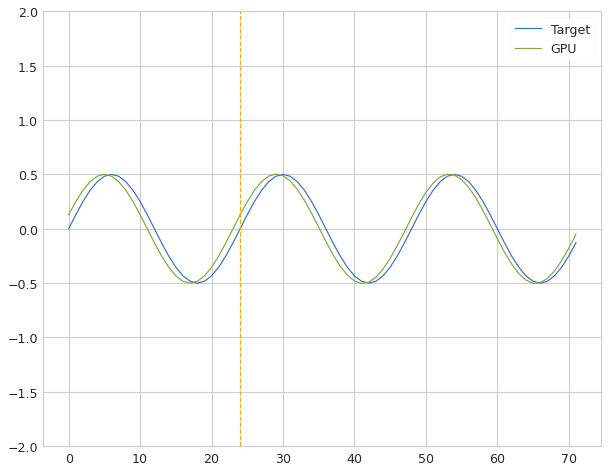

 Iter=17 a=0.924 sr=0.889 amp=0.320  ri=0.025 rr=4.308 loss=0.074708


Iter: 17 #### Diagnostic 0.075   Time 1.53  Best 0.075 NRMSE 0.075 CD 0.022
Iter: 18 #### Diagnostic 0.092   Time 0.97  Best 0.075 NRMSE 0.092 CD 0.034
Iter: 19 #### Diagnostic 0.094   Time 1.03  Best 0.075 NRMSE 0.094 CD 0.036
Iter: 20 #### Diagnostic 0.089   Time 2.49  Best 0.075 NRMSE 0.089 CD 0.032
Iter: 21 #### Diagnostic 0.092   Time 2.52  Best 0.075 NRMSE 0.092 CD 0.034
Iter: 22 #### Diagnostic 0.093   Time 1.78  Best 0.075 NRMSE 0.093 CD 0.034
Iter: 23 #### Diagnostic 0.092   Time 1.48  Best 0.075 NRMSE 0.092 CD 0.034
Iter: 24 #### Diagnostic 0.095   Time 1.55  Best 0.075 NRMSE 0.095 CD 0.036
Iter: 25 #### Diagnostic 0.093   Time 1.39  Best 0.075 NRMSE 0.093 CD 0.034
Iter: 26 #### Diagnostic 0.092   Time 0.94  Best 0.075 NRMSE 0.092 CD 0.034
Iter: 27 #### Diagnostic 0.092   Time 0.50  Best 0.075 NRMSE 0.092 CD 0.034
Iter: 28 #### Diagnostic 0.092   Time 0.66  Best 0.075 NRMSE 0.092 CD 0.034
Iter: 29 #### Dia

Iter: 21 #### Diagnostic 0.093   Time 1.05  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 22 #### Diagnostic 0.095   Time 0.90  Best 1000.000 NRMSE 0.095 CD 0.036
Iter: 23 #### Diagnostic 0.093   Time 0.81  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 24 #### Diagnostic 0.092   Time 1.35  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 25 #### Diagnostic 0.093   Time 1.15  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 26 #### Diagnostic 0.089   Time 1.36  Best 1000.000 NRMSE 0.089 CD 0.025
Iter: 27 #### Diagnostic 0.092   Time 1.14  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 28 #### Diagnostic 0.089   Time 1.47  Best 1000.000 NRMSE 0.089 CD 0.032
Iter: 29 #### Diagnostic 0.091   Time 0.62  Best 1000.000 NRMSE 0.091 CD 0.033
Iter: 30 #### Diagnostic 0.093   Time 1.28  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 31 #### Diagnostic 0.093   Time 1.29  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 32 #### Diagnostic 79.679   Time 1.47  Best 1000.000 NRMSE 79.679 CD 1.246
Iter: 33 #### Diagnostic 0.093   Time 1.10  Best 1

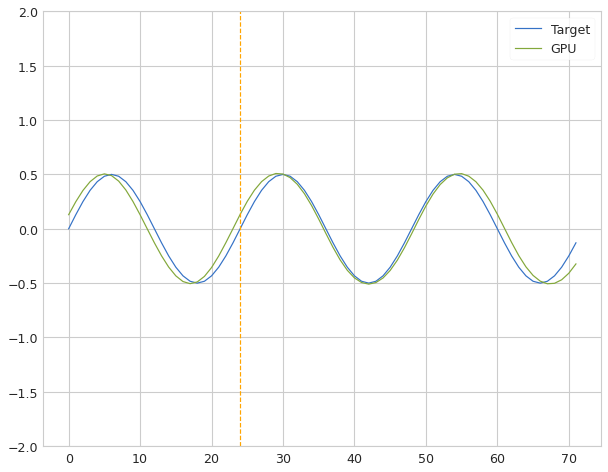

 Iter=35 a=0.982 sr=0.862 amp=0.092  ri=0.394 rr=3.226 loss=0.074577


Iter: 35 #### Diagnostic 0.075   Time 1.83  Best 0.075 NRMSE 0.075 CD 0.020
Iter: 36 #### Diagnostic 0.093   Time 1.67  Best 0.075 NRMSE 0.093 CD 0.035
Iter: 37 #### Diagnostic 0.086   Time 1.34  Best 0.075 NRMSE 0.086 CD 0.030
Iter: 38 #### Diagnostic 0.093   Time 1.08  Best 0.075 NRMSE 0.093 CD 0.034
Iter: 39 #### Diagnostic 0.092   Time 1.41  Best 0.075 NRMSE 0.092 CD 0.034
Iter: 40 #### Diagnostic 0.095   Time 1.13  Best 0.075 NRMSE 0.095 CD 0.036
Iter: 41 #### Diagnostic 0.093   Time 1.10  Best 0.075 NRMSE 0.093 CD 0.034
Iter: 42 #### Diagnostic 0.100   Time 1.75  Best 0.075 NRMSE 0.100 CD 0.040
Iter: 43 #### Diagnostic 0.094   Time 1.46  Best 0.075 NRMSE 0.094 CD 0.035
Iter: 44 #### Diagnostic 0.087   Time 1.13  Best 0.075 NRMSE 0.087 CD 0.030
Iter: 45 #### Diagnostic 0.090   Time 1.49  Best 0.075 NRMSE 0.090 CD 0.032
Iter: 46 #### Diagnostic 0.092   Time 1.57  Best 0.075 NRMSE 0.092 CD 0.034
Iter: 47 #### Dia

Iter: 39 #### Diagnostic 0.093   Time 1.16  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 40 #### Diagnostic 0.092   Time 0.82  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 41 #### Diagnostic 0.092   Time 1.10  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 42 #### Diagnostic 0.093   Time 0.60  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 43 #### Diagnostic 0.369   Time 1.25  Best 1000.000 NRMSE 0.369 CD 1.216
Iter: 44 #### Diagnostic 0.093   Time 1.18  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 45 #### Diagnostic 0.086   Time 1.45  Best 1000.000 NRMSE 0.086 CD 0.029
Iter: 46 #### Diagnostic 0.093   Time 1.69  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 47 #### Diagnostic 0.092   Time 1.73  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 48 #### Diagnostic 0.086   Time 1.87  Best 1000.000 NRMSE 0.086 CD 0.029
Iter: 49 #### Diagnostic 0.093   Time 1.55  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 50 #### Diagnostic 0.090   Time 1.22  Best 1000.000 NRMSE 0.090 CD 0.033
Iter: 51 #### Diagnostic 0.093   Time 1.24  Best 100

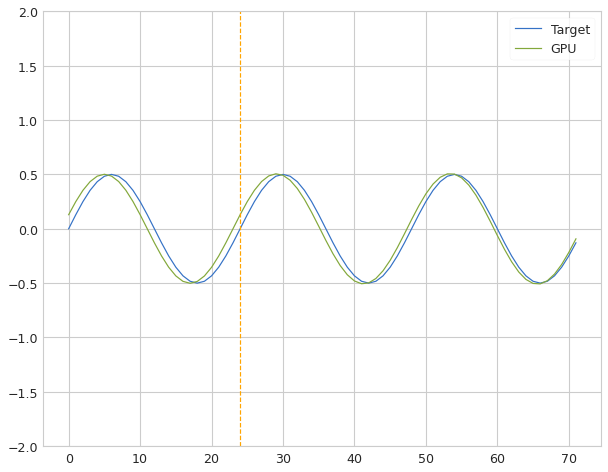

 Iter=54 a=0.823 sr=0.029 amp=0.188  ri=0.675 rr=4.542 loss=0.063358


Iter: 54 #### Diagnostic 0.063   Time 1.87  Best 0.063 NRMSE 0.063 CD 0.015
Iter: 55 #### Diagnostic 0.093   Time 1.21  Best 0.063 NRMSE 0.093 CD 0.035
Iter: 56 #### Diagnostic 0.092   Time 1.32  Best 0.063 NRMSE 0.092 CD 0.034
Iter: 57 #### Diagnostic 1.139   Time 1.00  Best 0.063 NRMSE 1.139 CD 0.062
Iter: 58 #### Diagnostic 0.092   Time 1.19  Best 0.063 NRMSE 0.092 CD 0.034
Iter: 59 #### Diagnostic 0.094   Time 1.44  Best 0.063 NRMSE 0.094 CD 0.035
Iter: 60 #### Diagnostic 0.093   Time 1.24  Best 0.063 NRMSE 0.093 CD 0.035
Iter: 61 #### Diagnostic 0.092   Time 1.19  Best 0.063 NRMSE 0.092 CD 0.034
Iter: 62 #### Diagnostic 0.092   Time 1.57  Best 0.063 NRMSE 0.092 CD 0.034
Iter: 63 #### Diagnostic 0.093   Time 1.45  Best 0.063 NRMSE 0.093 CD 0.034
Iter: 64 #### Diagnostic 0.080   Time 1.31  Best 0.063 NRMSE 0.080 CD 0.025
Iter: 65 #### Diagnostic 0.094   Time 1.97  Best 0.063 NRMSE 0.094 CD 0.035
Iter: 66 #### Dia

Iter: 57 #### Diagnostic 0.092   Time 1.37  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 58 #### Diagnostic 0.092   Time 1.39  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 59 #### Diagnostic 0.092   Time 1.16  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 60 #### Diagnostic 0.105   Time 1.18  Best 1000.000 NRMSE 0.105 CD 0.038
Iter: 61 #### Diagnostic 0.330   Time 2.18  Best 1000.000 NRMSE 0.330 CD 0.063
Iter: 62 #### Diagnostic 0.090   Time 0.96  Best 1000.000 NRMSE 0.090 CD 0.033
Iter: 63 #### Diagnostic 0.088   Time 1.44  Best 1000.000 NRMSE 0.088 CD 0.031
Iter: 64 #### Diagnostic 0.093   Time 1.55  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 65 #### Diagnostic 0.093   Time 1.20  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 66 #### Diagnostic 0.092   Time 0.74  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 67 #### Diagnostic 0.336   Time 0.51  Best 1000.000 NRMSE 0.336 CD 0.346
Iter: 68 #### Diagnostic 0.092   Time 0.68  Best 1000.000 NRMSE 0.092 CD 0.035
Iter: 69 #### Diagnostic 0.093   Time 0.59  Best 100

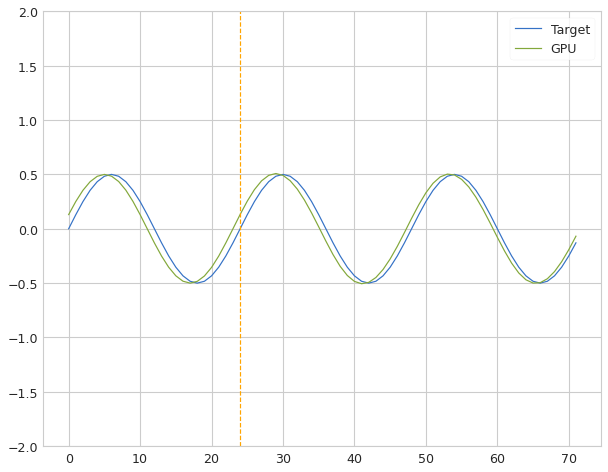

 Iter=30 a=0.979 sr=0.619 amp=0.086  ri=0.840 rr=0.572 loss=0.071497


Iter: 30 #### Diagnostic 0.071   Time 2.30  Best 0.071 NRMSE 0.071 CD 0.020
Iter: 31 #### Diagnostic 0.093   Time 1.56  Best 0.071 NRMSE 0.093 CD 0.034
Iter: 32 #### Diagnostic 0.092   Time 1.24  Best 0.071 NRMSE 0.092 CD 0.034
Iter: 33 #### Diagnostic 0.093   Time 1.09  Best 0.071 NRMSE 0.093 CD 0.034
Iter: 34 #### Diagnostic 0.087   Time 1.03  Best 0.071 NRMSE 0.087 CD 0.031
Iter: 35 #### Diagnostic 0.093   Time 0.92  Best 0.071 NRMSE 0.093 CD 0.034
Iter: 36 #### Diagnostic 0.092   Time 1.21  Best 0.071 NRMSE 0.092 CD 0.034
Iter: 37 #### Diagnostic 0.092   Time 1.36  Best 0.071 NRMSE 0.092 CD 0.033
Iter: 38 #### Diagnostic 0.092   Time 1.86  Best 0.071 NRMSE 0.092 CD 0.034
Iter: 39 #### Diagnostic 0.092   Time 2.20  Best 0.071 NRMSE 0.092 CD 0.034
Iter: 40 #### Diagnostic 0.092   Time 2.15  Best 0.071 NRMSE 0.092 CD 0.034
Iter: 41 #### Diagnostic 0.093   Time 1.37  Best 0.071 NRMSE 0.093 CD 0.035
Iter: 42 #### Dia

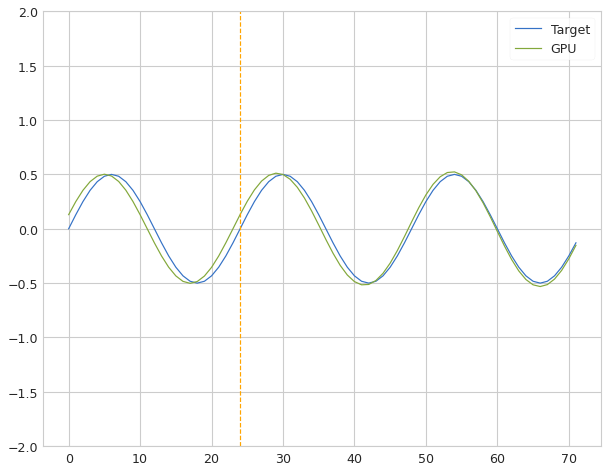

 Iter=65 a=0.943 sr=0.335 amp=0.079  ri=0.790 rr=0.476 loss=0.056577


Iter: 65 #### Diagnostic 0.057   Time 2.85  Best 0.057 NRMSE 0.057 CD 0.010
Iter: 66 #### Diagnostic 0.092   Time 1.85  Best 0.057 NRMSE 0.092 CD 0.034
Iter: 67 #### Diagnostic 0.092   Time 1.44  Best 0.057 NRMSE 0.092 CD 0.034
Iter: 68 #### Diagnostic 0.090   Time 1.15  Best 0.057 NRMSE 0.090 CD 0.033
Iter: 69 #### Diagnostic 0.093   Time 1.76  Best 0.057 NRMSE 0.093 CD 0.034
Iter: 70 #### Diagnostic 0.092   Time 0.96  Best 0.057 NRMSE 0.092 CD 0.034
Iter: 71 #### Diagnostic 0.092   Time 1.06  Best 0.057 NRMSE 0.092 CD 0.034
Iter: 72 #### Diagnostic 0.092   Time 1.51  Best 0.057 NRMSE 0.092 CD 0.034
Iter: 73 #### Diagnostic 0.093   Time 0.64  Best 0.057 NRMSE 0.093 CD 0.035
Iter: 74 #### Diagnostic 0.092   Time 1.33  Best 0.057 NRMSE 0.092 CD 0.034
Iter: 75 #### Diagnostic 0.235   Time 1.13  Best 0.057 NRMSE 0.235 CD 0.202
Iter: 76 #### Diagnostic 0.093   Time 1.19  Best 0.057 NRMSE 0.093 CD 0.035
Iter: 77 #### Dia

Iter: 60 #### Diagnostic 0.092   Time 1.69  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 61 #### Diagnostic 0.093   Time 1.29  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 62 #### Diagnostic 0.088   Time 1.03  Best 1000.000 NRMSE 0.088 CD 0.031
Iter: 63 #### Diagnostic 0.092   Time 0.80  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 64 #### Diagnostic 0.092   Time 0.87  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 65 #### Diagnostic 0.092   Time 1.41  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 66 #### Diagnostic 0.092   Time 1.05  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 67 #### Diagnostic 0.094   Time 1.00  Best 1000.000 NRMSE 0.094 CD 0.035
Iter: 68 #### Diagnostic 0.092   Time 0.87  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 69 #### Diagnostic 0.092   Time 1.14  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 70 #### Diagnostic 0.093   Time 0.73  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 71 #### Diagnostic 0.093   Time 0.79  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 72 #### Diagnostic 0.091   Time 0.68  Best 100

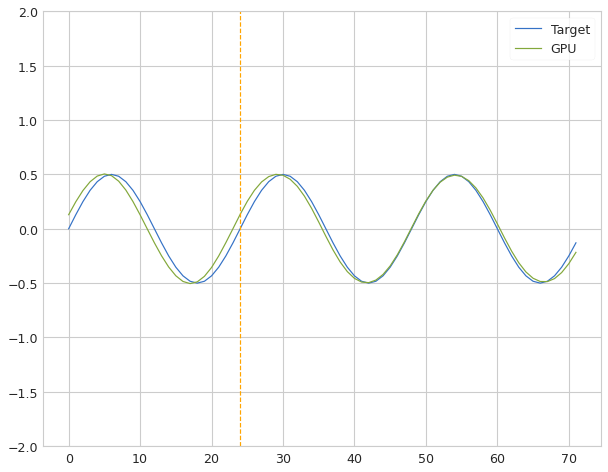

 Iter=35 a=0.982 sr=0.862 amp=0.092  ri=0.394 rr=3.226 loss=0.047955


Iter: 35 #### Diagnostic 0.048   Time 2.28  Best 0.048 NRMSE 0.048 CD 0.009
Iter: 36 #### Diagnostic 0.093   Time 1.79  Best 0.048 NRMSE 0.093 CD 0.035
Iter: 37 #### Diagnostic 0.088   Time 1.10  Best 0.048 NRMSE 0.088 CD 0.032
Iter: 38 #### Diagnostic 0.092   Time 0.97  Best 0.048 NRMSE 0.092 CD 0.034
Iter: 39 #### Diagnostic 0.093   Time 1.52  Best 0.048 NRMSE 0.093 CD 0.034
Iter: 40 #### Diagnostic 0.096   Time 1.25  Best 0.048 NRMSE 0.096 CD 0.037
Iter: 41 #### Diagnostic 0.093   Time 0.54  Best 0.048 NRMSE 0.093 CD 0.034
Iter: 42 #### Diagnostic 0.099   Time 0.63  Best 0.048 NRMSE 0.099 CD 0.039
Iter: 43 #### Diagnostic 0.094   Time 0.93  Best 0.048 NRMSE 0.094 CD 0.035
Iter: 44 #### Diagnostic 0.085   Time 0.98  Best 0.048 NRMSE 0.085 CD 0.029
Iter: 45 #### Diagnostic 0.091   Time 1.24  Best 0.048 NRMSE 0.091 CD 0.033
Iter: 46 #### Diagnostic 0.092   Time 1.73  Best 0.048 NRMSE 0.092 CD 0.034
Iter: 47 #### Dia

Iter: 39 #### Diagnostic 0.080   Time 1.20  Best 1000.000 NRMSE 0.080 CD 0.026
Iter: 40 #### Diagnostic 0.092   Time 0.99  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 41 #### Diagnostic 0.092   Time 1.17  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 42 #### Diagnostic 0.093   Time 1.32  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 43 #### Diagnostic 0.370   Time 1.67  Best 1000.000 NRMSE 0.370 CD 1.189
Iter: 44 #### Diagnostic 0.093   Time 1.07  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 45 #### Diagnostic 0.090   Time 0.81  Best 1000.000 NRMSE 0.090 CD 0.032
Iter: 46 #### Diagnostic 0.097   Time 0.61  Best 1000.000 NRMSE 0.097 CD 0.037
Iter: 47 #### Diagnostic 0.092   Time 0.92  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 48 #### Diagnostic 0.155   Time 1.64  Best 1000.000 NRMSE 0.155 CD 0.001
Iter: 49 #### Diagnostic 0.093   Time 1.60  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 50 #### Diagnostic 0.107   Time 1.96  Best 1000.000 NRMSE 0.107 CD 0.039
Iter: 51 #### Diagnostic 0.093   Time 1.95  Best 100

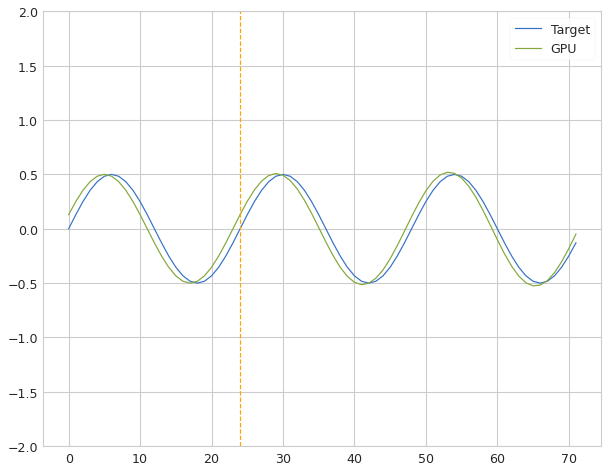

 Iter=37 a=0.953 sr=0.070 amp=0.298  ri=0.653 rr=4.602 loss=0.079149


Iter: 37 #### Diagnostic 0.079   Time 1.79  Best 0.079 NRMSE 0.079 CD 0.023
Iter: 38 #### Diagnostic 0.186   Time 1.09  Best 0.079 NRMSE 0.186 CD 0.001
Iter: 39 #### Diagnostic 0.092   Time 1.41  Best 0.079 NRMSE 0.092 CD 0.034
Iter: 40 #### Diagnostic 0.092   Time 1.66  Best 0.079 NRMSE 0.092 CD 0.034
Iter: 41 #### Diagnostic 0.091   Time 1.52  Best 0.079 NRMSE 0.091 CD 0.033
Iter: 42 #### Diagnostic 0.093   Time 1.87  Best 0.079 NRMSE 0.093 CD 0.035
Iter: 43 #### Diagnostic 0.092   Time 1.97  Best 0.079 NRMSE 0.092 CD 0.034
Iter: 44 #### Diagnostic 0.094   Time 1.98  Best 0.079 NRMSE 0.094 CD 0.035
Iter: 45 #### Diagnostic 0.118   Time 2.67  Best 0.079 NRMSE 0.118 CD 0.035
Iter: 46 #### Diagnostic 0.092   Time 1.46  Best 0.079 NRMSE 0.092 CD 0.034
Iter: 47 #### Diagnostic 0.092   Time 1.22  Best 0.079 NRMSE 0.092 CD 0.034
Iter: 48 #### Diagnostic 0.092   Time 1.55  Best 0.079 NRMSE 0.092 CD 0.034
Iter: 49 #### Dia

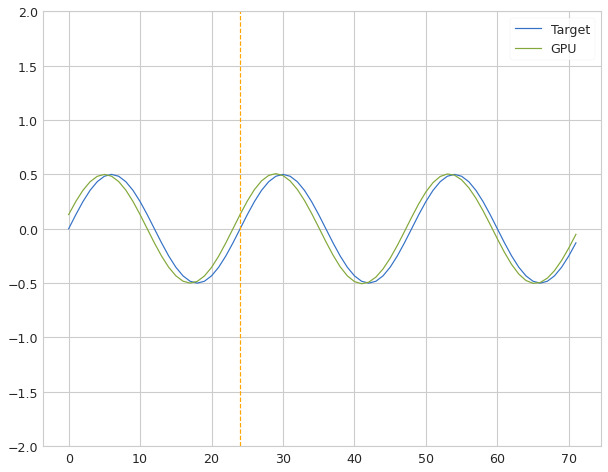

 Iter=86 a=0.945 sr=1.039 amp=0.126  ri=0.886 rr=3.615 loss=0.077120


Iter: 86 #### Diagnostic 0.077   Time 1.97  Best 0.077 NRMSE 0.077 CD 0.023
Iter: 87 #### Diagnostic 0.096   Time 1.61  Best 0.077 NRMSE 0.096 CD 0.036
Iter: 88 #### Diagnostic 0.093   Time 1.41  Best 0.077 NRMSE 0.093 CD 0.035
Iter: 89 #### Diagnostic 0.091   Time 1.79  Best 0.077 NRMSE 0.091 CD 0.033
Iter: 90 #### Diagnostic 0.092   Time 2.06  Best 0.077 NRMSE 0.092 CD 0.034
Iter: 91 #### Diagnostic 0.093   Time 1.84  Best 0.077 NRMSE 0.093 CD 0.034
Iter: 92 #### Diagnostic 0.095   Time 1.36  Best 0.077 NRMSE 0.095 CD 0.036
Iter: 93 #### Diagnostic 0.102   Time 1.63  Best 0.077 NRMSE 0.102 CD 0.041
Iter: 94 #### Diagnostic 0.095   Time 1.38  Best 0.077 NRMSE 0.095 CD 0.035
Iter: 95 #### Diagnostic 0.092   Time 1.28  Best 0.077 NRMSE 0.092 CD 0.034
Iter: 96 #### Diagnostic 0.092   Time 1.43  Best 0.077 NRMSE 0.092 CD 0.034
Iter: 97 #### Diagnostic 0.092   Time 0.91  Best 0.077 NRMSE 0.092 CD 0.034
Iter: 98 #### Dia

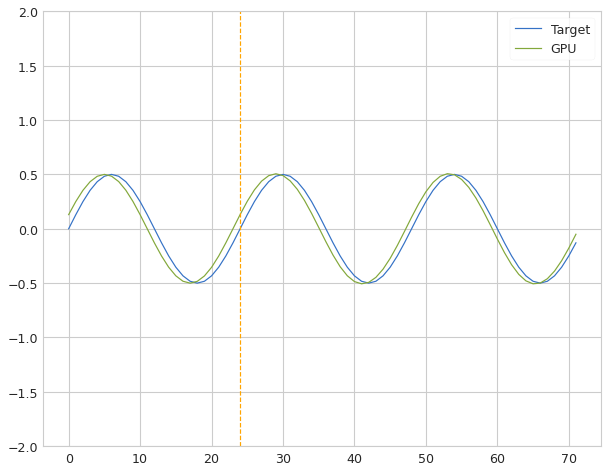

 Iter=23 a=0.917 sr=0.451 amp=0.216  ri=0.727 rr=0.181 loss=0.076911


Iter: 23 #### Diagnostic 0.077   Time 1.32  Best 0.077 NRMSE 0.077 CD 0.023
Iter: 24 #### Diagnostic 0.093   Time 1.53  Best 0.077 NRMSE 0.093 CD 0.035
Iter: 25 #### Diagnostic 0.092   Time 1.04  Best 0.077 NRMSE 0.092 CD 0.034
Iter: 26 #### Diagnostic 0.093   Time 1.26  Best 0.077 NRMSE 0.093 CD 0.035
Iter: 27 #### Diagnostic 0.093   Time 1.50  Best 0.077 NRMSE 0.093 CD 0.034
Iter: 28 #### Diagnostic 0.092   Time 1.16  Best 0.077 NRMSE 0.092 CD 0.034
Iter: 29 #### Diagnostic 0.090   Time 1.42  Best 0.077 NRMSE 0.090 CD 0.032
Iter: 30 #### Diagnostic 0.112   Time 1.69  Best 0.077 NRMSE 0.112 CD 0.050
Iter: 31 #### Diagnostic 0.093   Time 1.96  Best 0.077 NRMSE 0.093 CD 0.034
Iter: 32 #### Diagnostic 0.092   Time 2.22  Best 0.077 NRMSE 0.092 CD 0.034
Iter: 33 #### Diagnostic 0.093   Time 1.10  Best 0.077 NRMSE 0.093 CD 0.034
Iter: 34 #### Diagnostic 0.096   Time 1.17  Best 0.077 NRMSE 0.096 CD 0.037
Iter: 35 #### Dia

Iter: 20 #### Diagnostic 0.097   Time 1.16  Best 1000.000 NRMSE 0.097 CD 0.037
Iter: 21 #### Diagnostic 0.092   Time 0.87  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 22 #### Diagnostic 0.093   Time 1.16  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 23 #### Diagnostic 0.093   Time 1.75  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 24 #### Diagnostic 0.095   Time 2.64  Best 1000.000 NRMSE 0.095 CD 0.036
Iter: 25 #### Diagnostic 0.093   Time 1.74  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 26 #### Diagnostic 0.092   Time 1.94  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 27 #### Diagnostic 0.092   Time 1.86  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 28 #### Diagnostic 0.092   Time 1.34  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 29 #### Diagnostic 0.372   Time 1.27  Best 1000.000 NRMSE 0.372 CD 1.054
Iter: 30 #### Diagnostic 0.086   Time 0.91  Best 1000.000 NRMSE 0.086 CD 0.027
Iter: 31 #### Diagnostic 0.093   Time 0.80  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 32 #### Diagnostic 11.108   Time 1.08  Best 10

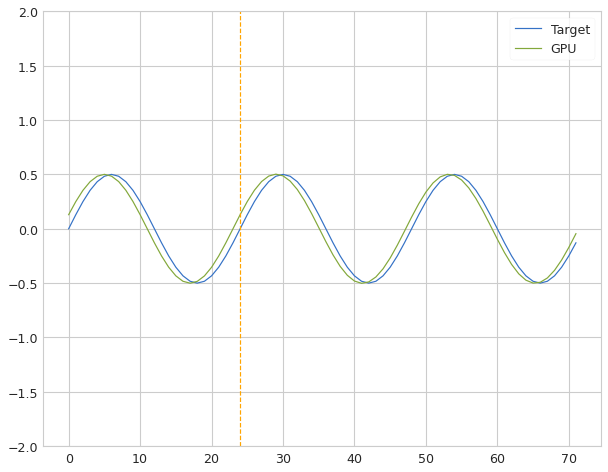

 Iter=62 a=0.833 sr=0.451 amp=0.266  ri=0.564 rr=1.296 loss=0.077106


Iter: 62 #### Diagnostic 0.077   Time 1.76  Best 0.077 NRMSE 0.077 CD 0.024
Iter: 63 #### Diagnostic 0.092   Time 1.43  Best 0.077 NRMSE 0.092 CD 0.034
Iter: 64 #### Diagnostic 0.092   Time 0.95  Best 0.077 NRMSE 0.092 CD 0.034
Iter: 65 #### Diagnostic 0.092   Time 0.55  Best 0.077 NRMSE 0.092 CD 0.034
Iter: 66 #### Diagnostic 0.093   Time 0.99  Best 0.077 NRMSE 0.093 CD 0.034
Iter: 67 #### Diagnostic 0.093   Time 1.12  Best 0.077 NRMSE 0.093 CD 0.035
Iter: 68 #### Diagnostic 0.092   Time 1.42  Best 0.077 NRMSE 0.092 CD 0.034
Iter: 69 #### Diagnostic 0.092   Time 1.43  Best 0.077 NRMSE 0.092 CD 0.034
Iter: 70 #### Diagnostic 0.093   Time 2.23  Best 0.077 NRMSE 0.093 CD 0.034
Iter: 71 #### Diagnostic 0.093   Time 1.74  Best 0.077 NRMSE 0.093 CD 0.034
Iter: 72 #### Diagnostic 0.092   Time 1.60  Best 0.077 NRMSE 0.092 CD 0.034
Iter: 73 #### Diagnostic 0.093   Time 1.77  Best 0.077 NRMSE 0.093 CD 0.034
Iter: 74 #### Dia

Iter: 65 #### Diagnostic 0.092   Time 1.21  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 66 #### Diagnostic 0.092   Time 1.67  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 67 #### Diagnostic 0.093   Time 1.73  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 68 #### Diagnostic 0.092   Time 1.53  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 69 #### Diagnostic 0.092   Time 0.86  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 70 #### Diagnostic 0.092   Time 0.90  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 71 #### Diagnostic 0.092   Time 0.59  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 72 #### Diagnostic 0.094   Time 0.40  Best 1000.000 NRMSE 0.094 CD 0.035
Iter: 73 #### Diagnostic 0.153   Time 0.55  Best 1000.000 NRMSE 0.153 CD 0.010
Iter: 74 #### Diagnostic 0.093   Time 0.88  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 75 #### Diagnostic 0.092   Time 1.22  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 76 #### Diagnostic 0.091   Time 0.92  Best 1000.000 NRMSE 0.091 CD 0.033
Iter: 77 #### Diagnostic 0.093   Time 0.74  Best 100

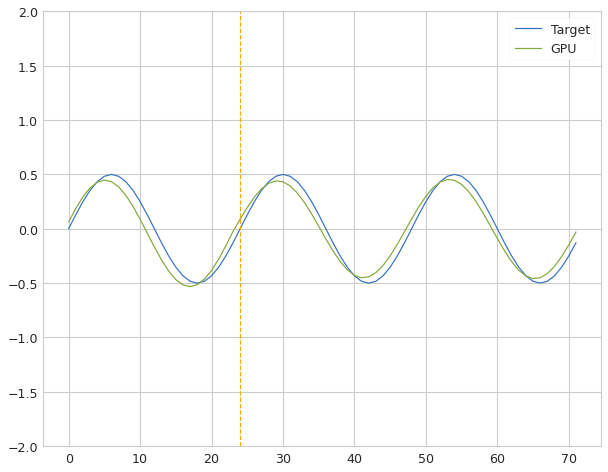

 Iter=36 a=0.440 sr=1.025 amp=0.969  ri=0.720 rr=2.051 loss=0.075497


Iter: 36 #### Diagnostic 0.075   Time 1.48  Best 0.075 NRMSE 0.075 CD 0.020
Iter: 37 #### Diagnostic 0.091   Time 1.22  Best 0.075 NRMSE 0.091 CD 0.034
Iter: 38 #### Diagnostic 0.092   Time 1.26  Best 0.075 NRMSE 0.092 CD 0.034
Iter: 39 #### Diagnostic 0.090   Time 1.13  Best 0.075 NRMSE 0.090 CD 0.032
Iter: 40 #### Diagnostic 0.092   Time 1.28  Best 0.075 NRMSE 0.092 CD 0.034
Iter: 41 #### Diagnostic 0.092   Time 2.02  Best 0.075 NRMSE 0.092 CD 0.034
Iter: 42 #### Diagnostic 0.093   Time 1.41  Best 0.075 NRMSE 0.093 CD 0.034
Iter: 43 #### Diagnostic 0.370   Time 1.22  Best 0.075 NRMSE 0.370 CD 1.164
Iter: 44 #### Diagnostic 0.093   Time 0.90  Best 0.075 NRMSE 0.093 CD 0.035
Iter: 45 #### Diagnostic 0.106   Time 1.08  Best 0.075 NRMSE 0.106 CD 0.045
Iter: 46 #### Diagnostic 0.097   Time 1.29  Best 0.075 NRMSE 0.097 CD 0.038
Iter: 47 #### Diagnostic 0.092   Time 1.28  Best 0.075 NRMSE 0.092 CD 0.034
Iter: 48 #### Dia

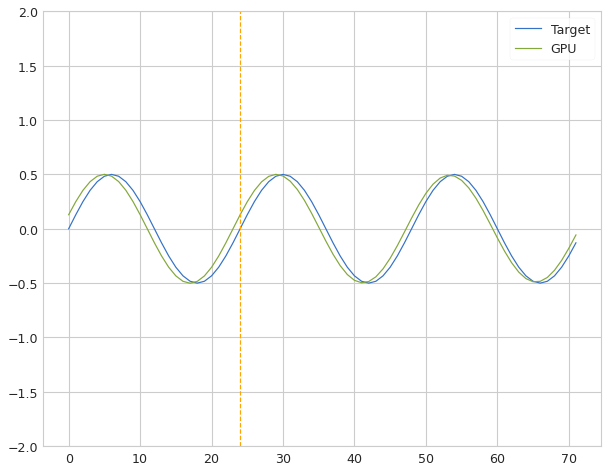

 Iter=54 a=0.823 sr=0.029 amp=0.188  ri=0.675 rr=4.542 loss=0.072199


Iter: 54 #### Diagnostic 0.072   Time 2.28  Best 0.072 NRMSE 0.072 CD 0.021
Iter: 55 #### Diagnostic 0.093   Time 1.42  Best 0.072 NRMSE 0.093 CD 0.035
Iter: 56 #### Diagnostic 0.089   Time 1.23  Best 0.072 NRMSE 0.089 CD 0.032
Iter: 57 #### Diagnostic 2.881   Time 1.33  Best 0.072 NRMSE 2.881 CD 1.790
Iter: 58 #### Diagnostic 0.093   Time 1.07  Best 0.072 NRMSE 0.093 CD 0.035
Iter: 59 #### Diagnostic 0.092   Time 1.08  Best 0.072 NRMSE 0.092 CD 0.034
Iter: 60 #### Diagnostic 0.093   Time 1.18  Best 0.072 NRMSE 0.093 CD 0.035
Iter: 61 #### Diagnostic 0.092   Time 1.13  Best 0.072 NRMSE 0.092 CD 0.034
Iter: 62 #### Diagnostic 0.092   Time 1.06  Best 0.072 NRMSE 0.092 CD 0.034
Iter: 63 #### Diagnostic 0.093   Time 0.91  Best 0.072 NRMSE 0.093 CD 0.034
Iter: 64 #### Diagnostic 0.111   Time 1.20  Best 0.072 NRMSE 0.111 CD 0.038
Iter: 65 #### Diagnostic 0.094   Time 1.35  Best 0.072 NRMSE 0.094 CD 0.035
Iter: 66 #### Dia

Iter: 57 #### Diagnostic 0.092   Time 1.10  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 58 #### Diagnostic 0.092   Time 1.01  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 59 #### Diagnostic 0.092   Time 1.01  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 60 #### Diagnostic 0.115   Time 1.02  Best 1000.000 NRMSE 0.115 CD 0.042
Iter: 61 #### Diagnostic 0.139   Time 1.18  Best 1000.000 NRMSE 0.139 CD 0.017
Iter: 62 #### Diagnostic 0.095   Time 0.96  Best 1000.000 NRMSE 0.095 CD 0.036
Iter: 63 #### Diagnostic 0.089   Time 1.17  Best 1000.000 NRMSE 0.089 CD 0.032
Iter: 64 #### Diagnostic 0.094   Time 1.20  Best 1000.000 NRMSE 0.094 CD 0.035
Iter: 65 #### Diagnostic 0.093   Time 1.36  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 66 #### Diagnostic 0.092   Time 1.33  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 67 #### Diagnostic 0.174   Time 1.26  Best 1000.000 NRMSE 0.174 CD 0.094
Iter: 68 #### Diagnostic 0.091   Time 0.87  Best 1000.000 NRMSE 0.091 CD 0.033
Iter: 69 #### Diagnostic 0.091   Time 1.25  Best 100

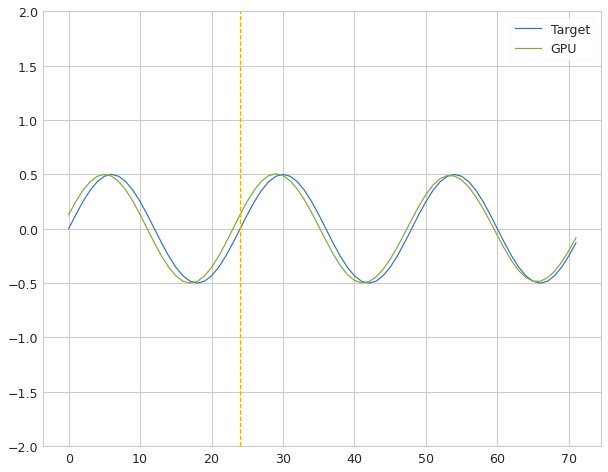

 Iter=30 a=0.979 sr=0.619 amp=0.086  ri=0.840 rr=0.572 loss=0.065610


Iter: 30 #### Diagnostic 0.066   Time 1.71  Best 0.066 NRMSE 0.066 CD 0.017
Iter: 31 #### Diagnostic 0.093   Time 1.65  Best 0.066 NRMSE 0.093 CD 0.034
Iter: 32 #### Diagnostic 0.093   Time 1.90  Best 0.066 NRMSE 0.093 CD 0.034
Iter: 33 #### Diagnostic 0.092   Time 1.69  Best 0.066 NRMSE 0.092 CD 0.034
Iter: 34 #### Diagnostic 0.096   Time 1.50  Best 0.066 NRMSE 0.096 CD 0.037
Iter: 35 #### Diagnostic 0.093   Time 1.68  Best 0.066 NRMSE 0.093 CD 0.034
Iter: 36 #### Diagnostic 0.092   Time 1.57  Best 0.066 NRMSE 0.092 CD 0.034
Iter: 37 #### Diagnostic 0.092   Time 1.41  Best 0.066 NRMSE 0.092 CD 0.034
Iter: 38 #### Diagnostic 0.092   Time 1.10  Best 0.066 NRMSE 0.092 CD 0.034
Iter: 39 #### Diagnostic 0.092   Time 0.86  Best 0.066 NRMSE 0.092 CD 0.034
Iter: 40 #### Diagnostic 0.093   Time 1.36  Best 0.066 NRMSE 0.093 CD 0.034
Iter: 41 #### Diagnostic 0.092   Time 0.97  Best 0.066 NRMSE 0.092 CD 0.034
Iter: 42 #### Dia

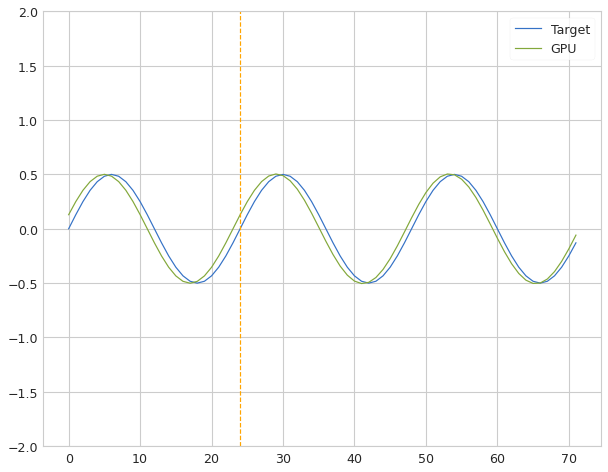

 Iter=17 a=0.924 sr=0.889 amp=0.320  ri=0.025 rr=4.308 loss=0.072731


Iter: 17 #### Diagnostic 0.073   Time 1.70  Best 0.073 NRMSE 0.073 CD 0.021
Iter: 18 #### Diagnostic 0.092   Time 0.89  Best 0.073 NRMSE 0.092 CD 0.034
Iter: 19 #### Diagnostic 0.090   Time 0.81  Best 0.073 NRMSE 0.090 CD 0.032
Iter: 20 #### Diagnostic 0.089   Time 1.06  Best 0.073 NRMSE 0.089 CD 0.032
Iter: 21 #### Diagnostic 0.092   Time 1.68  Best 0.073 NRMSE 0.092 CD 0.034
Iter: 22 #### Diagnostic 0.093   Time 1.27  Best 0.073 NRMSE 0.093 CD 0.035
Iter: 23 #### Diagnostic 0.093   Time 1.66  Best 0.073 NRMSE 0.093 CD 0.034
Iter: 24 #### Diagnostic 0.095   Time 1.59  Best 0.073 NRMSE 0.095 CD 0.035
Iter: 25 #### Diagnostic 0.093   Time 1.01  Best 0.073 NRMSE 0.093 CD 0.034
Iter: 26 #### Diagnostic 0.093   Time 0.74  Best 0.073 NRMSE 0.093 CD 0.035
Iter: 27 #### Diagnostic 0.092   Time 0.95  Best 0.073 NRMSE 0.092 CD 0.034
Iter: 28 #### Diagnostic 0.092   Time 0.92  Best 0.073 NRMSE 0.092 CD 0.034
Iter: 29 #### Dia

Iter: 21 #### Diagnostic 0.093   Time 0.93  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 22 #### Diagnostic 0.095   Time 0.82  Best 1000.000 NRMSE 0.095 CD 0.036
Iter: 23 #### Diagnostic 0.093   Time 1.35  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 24 #### Diagnostic 0.091   Time 1.35  Best 1000.000 NRMSE 0.091 CD 0.033
Iter: 25 #### Diagnostic 0.093   Time 1.24  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 26 #### Diagnostic 0.113   Time 1.34  Best 1000.000 NRMSE 0.113 CD 0.041
Iter: 27 #### Diagnostic 0.093   Time 1.12  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 28 #### Diagnostic 0.101   Time 0.94  Best 1000.000 NRMSE 0.101 CD 0.042
Iter: 29 #### Diagnostic 0.092   Time 0.91  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 30 #### Diagnostic 0.092   Time 0.72  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 31 #### Diagnostic 0.092   Time 0.79  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 32 #### Diagnostic 1.712   Time 0.80  Best 1000.000 NRMSE 1.712 CD 1.964
Iter: 33 #### Diagnostic 0.092   Time 1.04  Best 100

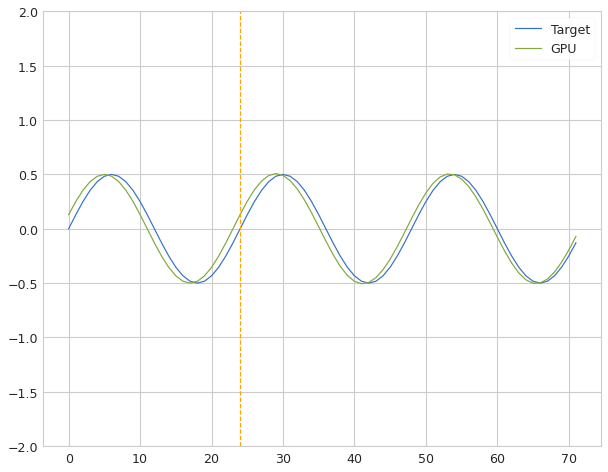

 Iter=15 a=0.926 sr=0.334 amp=0.177  ri=0.990 rr=3.464 loss=0.070376


Iter: 15 #### Diagnostic 0.070   Time 2.29  Best 0.070 NRMSE 0.070 CD 0.019
Iter: 16 #### Diagnostic 0.097   Time 1.24  Best 0.070 NRMSE 0.097 CD 0.038
Iter: 17 #### Diagnostic 0.093   Time 0.85  Best 0.070 NRMSE 0.093 CD 0.034
Iter: 18 #### Diagnostic 0.094   Time 0.35  Best 0.070 NRMSE 0.094 CD 0.035
Iter: 19 #### Diagnostic 0.094   Time 0.55  Best 0.070 NRMSE 0.094 CD 0.035
Iter: 20 #### Diagnostic 0.093   Time 1.01  Best 0.070 NRMSE 0.093 CD 0.034
Iter: 21 #### Diagnostic 0.092   Time 1.38  Best 0.070 NRMSE 0.092 CD 0.034
Iter: 22 #### Diagnostic 0.093   Time 1.43  Best 0.070 NRMSE 0.093 CD 0.034
Iter: 23 #### Diagnostic 0.092   Time 1.22  Best 0.070 NRMSE 0.092 CD 0.034
Iter: 24 #### Diagnostic 0.092   Time 1.20  Best 0.070 NRMSE 0.092 CD 0.034
Iter: 25 #### Diagnostic 0.092   Time 1.50  Best 0.070 NRMSE 0.092 CD 0.034
Iter: 26 #### Diagnostic 0.095   Time 1.58  Best 0.070 NRMSE 0.095 CD 0.036
Iter: 27 #### Dia

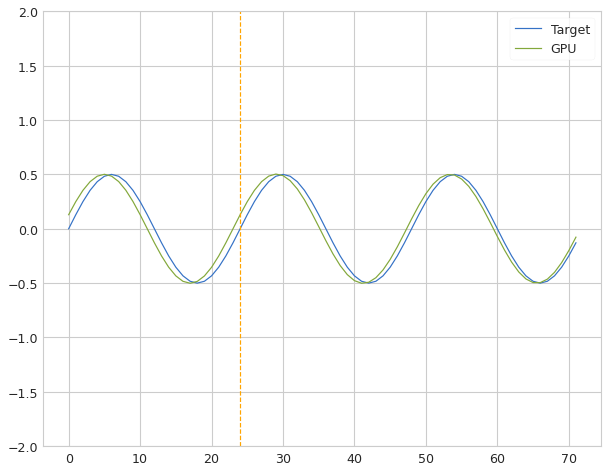

 Iter=85 a=0.889 sr=0.187 amp=0.095  ri=0.949 rr=1.347 loss=0.066705


Iter: 85 #### Diagnostic 0.067   Time 1.37  Best 0.067 NRMSE 0.067 CD 0.018
Iter: 86 #### Diagnostic 0.093   Time 1.64  Best 0.067 NRMSE 0.093 CD 0.034
Iter: 87 #### Diagnostic 0.092   Time 1.70  Best 0.067 NRMSE 0.092 CD 0.034
Iter: 88 #### Diagnostic 0.084   Time 1.86  Best 0.067 NRMSE 0.084 CD 0.028
Iter: 89 #### Diagnostic 0.093   Time 2.39  Best 0.067 NRMSE 0.093 CD 0.035
Iter: 90 #### Diagnostic 0.092   Time 1.74  Best 0.067 NRMSE 0.092 CD 0.034
Iter: 91 #### Diagnostic 0.092   Time 1.31  Best 0.067 NRMSE 0.092 CD 0.034
Iter: 92 #### Diagnostic 0.092   Time 0.79  Best 0.067 NRMSE 0.092 CD 0.034
Iter: 93 #### Diagnostic 0.092   Time 1.27  Best 0.067 NRMSE 0.092 CD 0.034
Iter: 94 #### Diagnostic 0.093   Time 0.87  Best 0.067 NRMSE 0.093 CD 0.034
Iter: 95 #### Diagnostic 0.091   Time 0.86  Best 0.067 NRMSE 0.091 CD 0.033
Iter: 96 #### Diagnostic 0.092   Time 1.06  Best 0.067 NRMSE 0.092 CD 0.034
Iter: 97 #### Dia

Iter: 87 #### Diagnostic 0.091   Time 0.87  Best 1000.000 NRMSE 0.091 CD 0.033
Iter: 88 #### Diagnostic 0.093   Time 1.37  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 89 #### Diagnostic 0.092   Time 1.46  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 90 #### Diagnostic 0.092   Time 0.98  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 91 #### Diagnostic 0.092   Time 0.92  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 92 #### Diagnostic 0.095   Time 1.20  Best 1000.000 NRMSE 0.095 CD 0.036
Iter: 93 #### Diagnostic 0.082   Time 1.14  Best 1000.000 NRMSE 0.082 CD 0.027
Iter: 94 #### Diagnostic 0.094   Time 1.63  Best 1000.000 NRMSE 0.094 CD 0.035
Iter: 95 #### Diagnostic 0.092   Time 1.32  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 96 #### Diagnostic 0.092   Time 0.77  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 97 #### Diagnostic 0.090   Time 0.88  Best 1000.000 NRMSE 0.090 CD 0.033
Iter: 98 #### Diagnostic 0.093   Time 1.34  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 99 #### Diagnostic 0.093   Time 1.61  Best 100

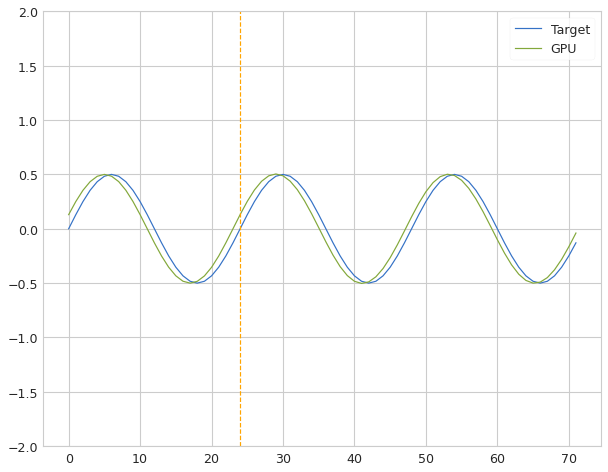

 Iter=23 a=0.917 sr=0.451 amp=0.216  ri=0.727 rr=0.181 loss=0.079686


Iter: 23 #### Diagnostic 0.080   Time 1.96  Best 0.080 NRMSE 0.080 CD 0.025
Iter: 24 #### Diagnostic 0.095   Time 0.53  Best 0.080 NRMSE 0.095 CD 0.036
Iter: 25 #### Diagnostic 0.092   Time 1.46  Best 0.080 NRMSE 0.092 CD 0.034
Iter: 26 #### Diagnostic 0.094   Time 1.00  Best 0.080 NRMSE 0.094 CD 0.035
Iter: 27 #### Diagnostic 0.093   Time 1.01  Best 0.080 NRMSE 0.093 CD 0.035
Iter: 28 #### Diagnostic 0.093   Time 0.87  Best 0.080 NRMSE 0.093 CD 0.034
Iter: 29 #### Diagnostic 0.091   Time 0.98  Best 0.080 NRMSE 0.091 CD 0.033
Iter: 30 #### Diagnostic 0.091   Time 1.35  Best 0.080 NRMSE 0.091 CD 0.030
Iter: 31 #### Diagnostic 0.093   Time 1.52  Best 0.080 NRMSE 0.093 CD 0.034
Iter: 32 #### Diagnostic 0.093   Time 1.68  Best 0.080 NRMSE 0.093 CD 0.034
Iter: 33 #### Diagnostic 0.093   Time 2.10  Best 0.080 NRMSE 0.093 CD 0.034
Iter: 34 #### Diagnostic 0.088   Time 1.57  Best 0.080 NRMSE 0.088 CD 0.031
Iter: 35 #### Dia

Iter: 20 #### Diagnostic 0.100   Time 0.84  Best 1000.000 NRMSE 0.100 CD 0.037
Iter: 21 #### Diagnostic 0.092   Time 0.75  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 22 #### Diagnostic 0.093   Time 0.65  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 23 #### Diagnostic 0.092   Time 0.83  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 24 #### Diagnostic 0.094   Time 0.90  Best 1000.000 NRMSE 0.094 CD 0.035
Iter: 25 #### Diagnostic 0.093   Time 0.67  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 26 #### Diagnostic 0.091   Time 0.41  Best 1000.000 NRMSE 0.091 CD 0.033
Iter: 27 #### Diagnostic 0.092   Time 0.93  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 28 #### Diagnostic 0.092   Time 0.72  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 29 #### Diagnostic 0.429   Time 0.75  Best 1000.000 NRMSE 0.429 CD 1.234
Iter: 30 #### Diagnostic 0.087   Time 0.89  Best 1000.000 NRMSE 0.087 CD 0.027
Iter: 31 #### Diagnostic 0.092   Time 0.88  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 32 #### Diagnostic 12.938   Time 1.26  Best 10

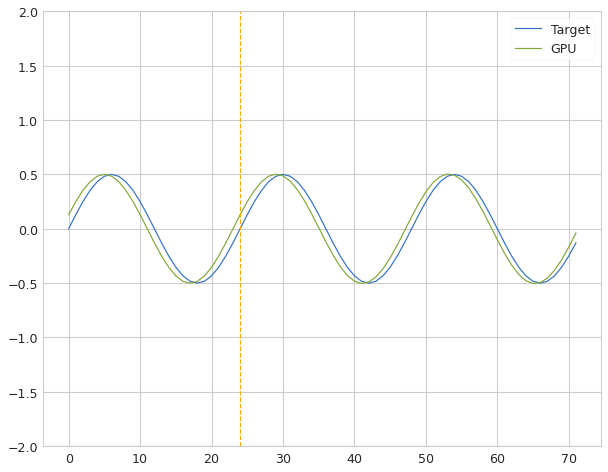

 Iter=84 a=0.591 sr=0.449 amp=0.684  ri=0.997 rr=3.632 loss=0.078900


Iter: 84 #### Diagnostic 0.079   Time 1.88  Best 0.079 NRMSE 0.079 CD 0.025
Iter: 85 #### Diagnostic 0.092   Time 1.54  Best 0.079 NRMSE 0.092 CD 0.022
Iter: 86 #### Diagnostic 0.092   Time 1.64  Best 0.079 NRMSE 0.092 CD 0.034
Iter: 87 #### Diagnostic 0.091   Time 1.65  Best 0.079 NRMSE 0.091 CD 0.033
Iter: 88 #### Diagnostic 0.092   Time 1.33  Best 0.079 NRMSE 0.092 CD 0.034
Iter: 89 #### Diagnostic 0.092   Time 1.32  Best 0.079 NRMSE 0.092 CD 0.034
Iter: 90 #### Diagnostic 0.095   Time 1.46  Best 0.079 NRMSE 0.095 CD 0.036
Iter: 91 #### Diagnostic 0.092   Time 1.58  Best 0.079 NRMSE 0.092 CD 0.034
Iter: 92 #### Diagnostic 0.093   Time 1.49  Best 0.079 NRMSE 0.093 CD 0.034
Iter: 93 #### Diagnostic 0.093   Time 1.18  Best 0.079 NRMSE 0.093 CD 0.034
Iter: 94 #### Diagnostic 0.370   Time 0.93  Best 0.079 NRMSE 0.370 CD 1.163
Iter: 95 #### Diagnostic 0.094   Time 0.90  Best 0.079 NRMSE 0.094 CD 0.035
Iter: 96 #### Dia

Iter: 86 #### Diagnostic 0.092   Time 0.88  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 87 #### Diagnostic 0.092   Time 1.04  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 88 #### Diagnostic 0.092   Time 0.51  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 89 #### Diagnostic 0.097   Time 0.48  Best 1000.000 NRMSE 0.097 CD 0.036
Iter: 90 #### Diagnostic 0.101   Time 0.39  Best 1000.000 NRMSE 0.101 CD 0.040
Iter: 91 #### Diagnostic 0.094   Time 0.37  Best 1000.000 NRMSE 0.094 CD 0.035
Iter: 92 #### Diagnostic 0.093   Time 0.46  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 93 #### Diagnostic 0.092   Time 0.83  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 94 #### Diagnostic 0.091   Time 1.05  Best 1000.000 NRMSE 0.091 CD 0.033
Iter: 95 #### Diagnostic 0.092   Time 1.10  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 96 #### Diagnostic 0.094   Time 0.85  Best 1000.000 NRMSE 0.094 CD 0.035
Iter: 97 #### Diagnostic 0.594   Time 0.81  Best 1000.000 NRMSE 0.594 CD 1.663
Iter: 98 #### Diagnostic 0.093   Time 0.76  Best 100

Iter: 88 #### Diagnostic 0.097   Time 1.10  Best 1000.000 NRMSE 0.097 CD 0.037
Iter: 89 #### Diagnostic 0.093   Time 0.78  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 90 #### Diagnostic 0.092   Time 0.90  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 91 #### Diagnostic 0.091   Time 0.94  Best 1000.000 NRMSE 0.091 CD 0.033
Iter: 92 #### Diagnostic 0.092   Time 0.63  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 93 #### Diagnostic 0.093   Time 0.98  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 94 #### Diagnostic 0.091   Time 1.04  Best 1000.000 NRMSE 0.091 CD 0.033
Iter: 95 #### Diagnostic 0.092   Time 0.90  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 96 #### Diagnostic 0.092   Time 1.36  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 97 #### Diagnostic 0.092   Time 1.44  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 98 #### Diagnostic 0.090   Time 1.45  Best 1000.000 NRMSE 0.090 CD 0.032
Iter: 99 #### Diagnostic 0.092   Time 1.21  Best 1000.000 NRMSE 0.092 CD 0.034

Best result = 0.08158835642964347
a = 0.43956370303

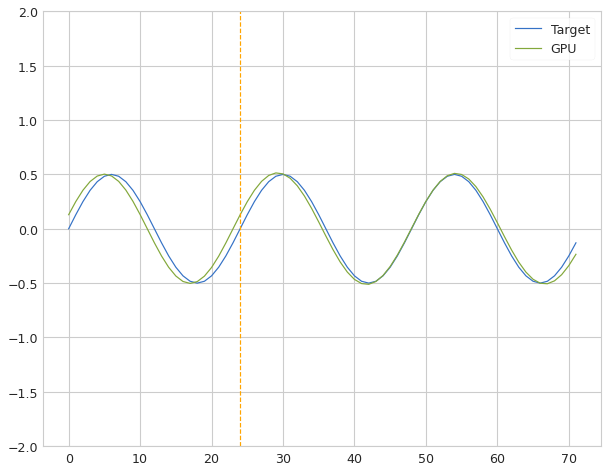

 Iter=37 a=0.953 sr=0.070 amp=0.298  ri=0.653 rr=4.602 loss=0.051422


Iter: 37 #### Diagnostic 0.051   Time 1.89  Best 0.051 NRMSE 0.051 CD 0.009
Iter: 38 #### Diagnostic 1.254   Time 0.88  Best 0.051 NRMSE 1.254 CD 1.867
Iter: 39 #### Diagnostic 0.093   Time 0.78  Best 0.051 NRMSE 0.093 CD 0.034
Iter: 40 #### Diagnostic 0.092   Time 0.80  Best 0.051 NRMSE 0.092 CD 0.034
Iter: 41 #### Diagnostic 0.095   Time 0.66  Best 0.051 NRMSE 0.095 CD 0.036
Iter: 42 #### Diagnostic 0.093   Time 0.82  Best 0.051 NRMSE 0.093 CD 0.035
Iter: 43 #### Diagnostic 0.093   Time 0.70  Best 0.051 NRMSE 0.093 CD 0.034
Iter: 44 #### Diagnostic 0.092   Time 0.70  Best 0.051 NRMSE 0.092 CD 0.034
Iter: 45 #### Diagnostic 0.092   Time 0.83  Best 0.051 NRMSE 0.092 CD 0.034
Iter: 46 #### Diagnostic 0.092   Time 0.99  Best 0.051 NRMSE 0.092 CD 0.034
Iter: 47 #### Diagnostic 0.092   Time 0.90  Best 0.051 NRMSE 0.092 CD 0.034
Iter: 48 #### Diagnostic 0.092   Time 0.91  Best 0.051 NRMSE 0.092 CD 0.034
Iter: 49 #### Dia

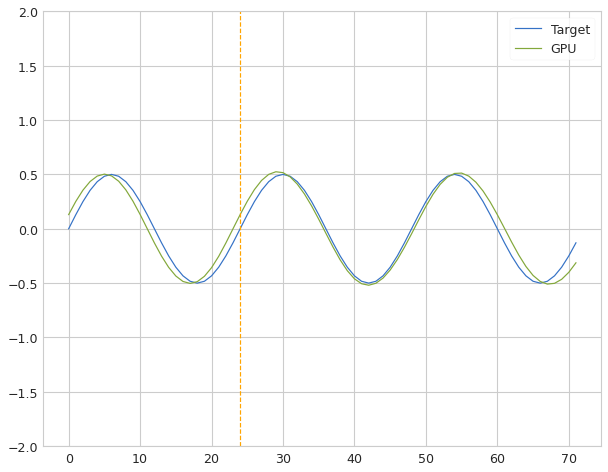

 Iter=30 a=0.979 sr=0.619 amp=0.086  ri=0.840 rr=0.572 loss=0.074167


Iter: 30 #### Diagnostic 0.074   Time 1.27  Best 0.074 NRMSE 0.074 CD 0.019
Iter: 31 #### Diagnostic 0.093   Time 1.08  Best 0.074 NRMSE 0.093 CD 0.034
Iter: 32 #### Diagnostic 0.093   Time 1.15  Best 0.074 NRMSE 0.093 CD 0.034
Iter: 33 #### Diagnostic 0.092   Time 1.08  Best 0.074 NRMSE 0.092 CD 0.034
Iter: 34 #### Diagnostic 0.094   Time 0.90  Best 0.074 NRMSE 0.094 CD 0.035
Iter: 35 #### Diagnostic 0.093   Time 1.06  Best 0.074 NRMSE 0.093 CD 0.034
Iter: 36 #### Diagnostic 0.092   Time 0.85  Best 0.074 NRMSE 0.092 CD 0.034
Iter: 37 #### Diagnostic 0.092   Time 0.95  Best 0.074 NRMSE 0.092 CD 0.034
Iter: 38 #### Diagnostic 0.092   Time 0.83  Best 0.074 NRMSE 0.092 CD 0.034
Iter: 39 #### Diagnostic 0.092   Time 0.64  Best 0.074 NRMSE 0.092 CD 0.034
Iter: 40 #### Diagnostic 0.092   Time 0.57  Best 0.074 NRMSE 0.092 CD 0.034
Iter: 41 #### Diagnostic 0.093   Time 0.52  Best 0.074 NRMSE 0.093 CD 0.035
Iter: 42 #### Dia

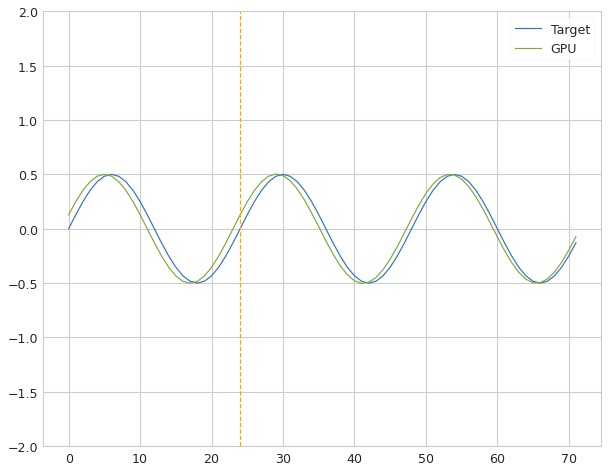

 Iter=17 a=0.924 sr=0.889 amp=0.320  ri=0.025 rr=4.308 loss=0.068134


Iter: 17 #### Diagnostic 0.068   Time 1.52  Best 0.068 NRMSE 0.068 CD 0.018
Iter: 18 #### Diagnostic 0.092   Time 1.01  Best 0.068 NRMSE 0.092 CD 0.034
Iter: 19 #### Diagnostic 0.090   Time 1.26  Best 0.068 NRMSE 0.090 CD 0.033
Iter: 20 #### Diagnostic 0.085   Time 1.17  Best 0.068 NRMSE 0.085 CD 0.030
Iter: 21 #### Diagnostic 0.092   Time 0.66  Best 0.068 NRMSE 0.092 CD 0.034
Iter: 22 #### Diagnostic 0.092   Time 1.04  Best 0.068 NRMSE 0.092 CD 0.034
Iter: 23 #### Diagnostic 0.093   Time 0.79  Best 0.068 NRMSE 0.093 CD 0.034
Iter: 24 #### Diagnostic 0.092   Time 0.63  Best 0.068 NRMSE 0.092 CD 0.033
Iter: 25 #### Diagnostic 0.093   Time 0.98  Best 0.068 NRMSE 0.093 CD 0.034
Iter: 26 #### Diagnostic 0.093   Time 0.78  Best 0.068 NRMSE 0.093 CD 0.034
Iter: 27 #### Diagnostic 0.092   Time 0.85  Best 0.068 NRMSE 0.092 CD 0.034
Iter: 28 #### Diagnostic 0.092   Time 0.76  Best 0.068 NRMSE 0.092 CD 0.034
Iter: 29 #### Dia

Iter: 21 #### Diagnostic 0.090   Time 0.95  Best 1000.000 NRMSE 0.090 CD 0.032
Iter: 22 #### Diagnostic 0.095   Time 0.47  Best 1000.000 NRMSE 0.095 CD 0.036
Iter: 23 #### Diagnostic 0.093   Time 0.48  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 24 #### Diagnostic 0.094   Time 0.64  Best 1000.000 NRMSE 0.094 CD 0.035
Iter: 25 #### Diagnostic 0.093   Time 0.46  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 26 #### Diagnostic 0.128   Time 0.59  Best 1000.000 NRMSE 0.128 CD 0.043
Iter: 27 #### Diagnostic 0.092   Time 0.76  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 28 #### Diagnostic 0.102   Time 0.80  Best 1000.000 NRMSE 0.102 CD 0.042
Iter: 29 #### Diagnostic 0.091   Time 0.66  Best 1000.000 NRMSE 0.091 CD 0.033
Iter: 30 #### Diagnostic 0.093   Time 0.61  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 31 #### Diagnostic 0.094   Time 0.53  Best 1000.000 NRMSE 0.094 CD 0.035
Iter: 32 #### Diagnostic 2.668   Time 0.49  Best 1000.000 NRMSE 2.668 CD 1.828
Iter: 33 #### Diagnostic 0.093   Time 0.64  Best 100

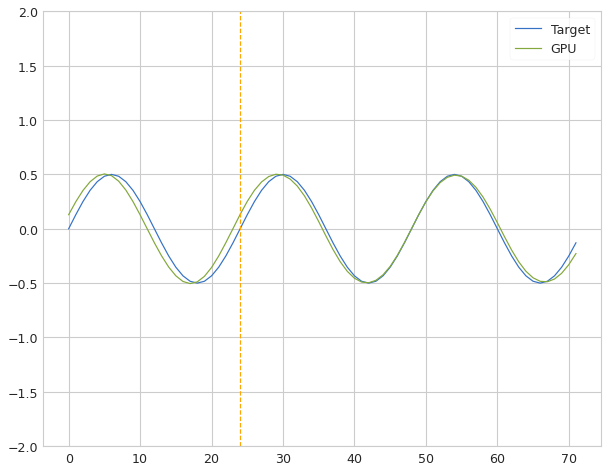

 Iter=35 a=0.982 sr=0.862 amp=0.092  ri=0.394 rr=3.226 loss=0.049518


Iter: 35 #### Diagnostic 0.050   Time 1.41  Best 0.050 NRMSE 0.050 CD 0.009
Iter: 36 #### Diagnostic 0.093   Time 1.22  Best 0.050 NRMSE 0.093 CD 0.035
Iter: 37 #### Diagnostic 0.091   Time 1.33  Best 0.050 NRMSE 0.091 CD 0.033
Iter: 38 #### Diagnostic 0.093   Time 1.39  Best 0.050 NRMSE 0.093 CD 0.034
Iter: 39 #### Diagnostic 0.093   Time 1.83  Best 0.050 NRMSE 0.093 CD 0.034
Iter: 40 #### Diagnostic 0.092   Time 1.28  Best 0.050 NRMSE 0.092 CD 0.034
Iter: 41 #### Diagnostic 0.093   Time 0.75  Best 0.050 NRMSE 0.093 CD 0.034
Iter: 42 #### Diagnostic 0.115   Time 0.98  Best 0.050 NRMSE 0.115 CD 0.053
Iter: 43 #### Diagnostic 0.094   Time 0.75  Best 0.050 NRMSE 0.094 CD 0.035
Iter: 44 #### Diagnostic 0.109   Time 0.66  Best 0.050 NRMSE 0.109 CD 0.048
Iter: 45 #### Diagnostic 0.096   Time 0.51  Best 0.050 NRMSE 0.096 CD 0.037
Iter: 46 #### Diagnostic 0.092   Time 0.26  Best 0.050 NRMSE 0.092 CD 0.034
Iter: 47 #### Dia

Iter: 39 #### Diagnostic 0.103   Time 0.81  Best 1000.000 NRMSE 0.103 CD 0.043
Iter: 40 #### Diagnostic 0.092   Time 0.91  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 41 #### Diagnostic 0.092   Time 0.66  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 42 #### Diagnostic 0.093   Time 0.50  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 43 #### Diagnostic 0.370   Time 0.73  Best 1000.000 NRMSE 0.370 CD 1.199
Iter: 44 #### Diagnostic 0.092   Time 0.52  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 45 #### Diagnostic 0.087   Time 0.50  Best 1000.000 NRMSE 0.087 CD 0.030
Iter: 46 #### Diagnostic 0.090   Time 0.50  Best 1000.000 NRMSE 0.090 CD 0.032
Iter: 47 #### Diagnostic 0.092   Time 0.55  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 48 #### Diagnostic 0.157   Time 0.80  Best 1000.000 NRMSE 0.157 CD 0.048
Iter: 49 #### Diagnostic 0.093   Time 1.16  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 50 #### Diagnostic 0.103   Time 1.04  Best 1000.000 NRMSE 0.103 CD 0.038
Iter: 51 #### Diagnostic 0.093   Time 1.42  Best 100

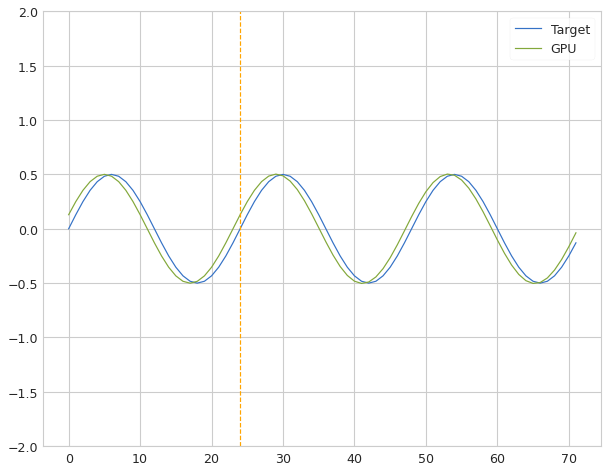

 Iter=54 a=0.823 sr=0.029 amp=0.188  ri=0.675 rr=4.542 loss=0.079563


Iter: 54 #### Diagnostic 0.080   Time 2.05  Best 0.080 NRMSE 0.080 CD 0.025
Iter: 55 #### Diagnostic 0.093   Time 0.59  Best 0.080 NRMSE 0.093 CD 0.034
Iter: 56 #### Diagnostic 0.094   Time 0.74  Best 0.080 NRMSE 0.094 CD 0.035
Iter: 57 #### Diagnostic 0.717   Time 0.81  Best 0.080 NRMSE 0.717 CD 0.027
Iter: 58 #### Diagnostic 0.093   Time 0.92  Best 0.080 NRMSE 0.093 CD 0.035
Iter: 59 #### Diagnostic 0.093   Time 0.97  Best 0.080 NRMSE 0.093 CD 0.035
Iter: 60 #### Diagnostic 0.093   Time 0.77  Best 0.080 NRMSE 0.093 CD 0.035
Iter: 61 #### Diagnostic 0.092   Time 0.65  Best 0.080 NRMSE 0.092 CD 0.034
Iter: 62 #### Diagnostic 0.092   Time 0.56  Best 0.080 NRMSE 0.092 CD 0.034
Iter: 63 #### Diagnostic 0.092   Time 0.69  Best 0.080 NRMSE 0.092 CD 0.034
Iter: 64 #### Diagnostic 0.141   Time 0.77  Best 0.080 NRMSE 0.141 CD 0.039
Iter: 65 #### Diagnostic 0.093   Time 0.68  Best 0.080 NRMSE 0.093 CD 0.034
Iter: 66 #### Dia

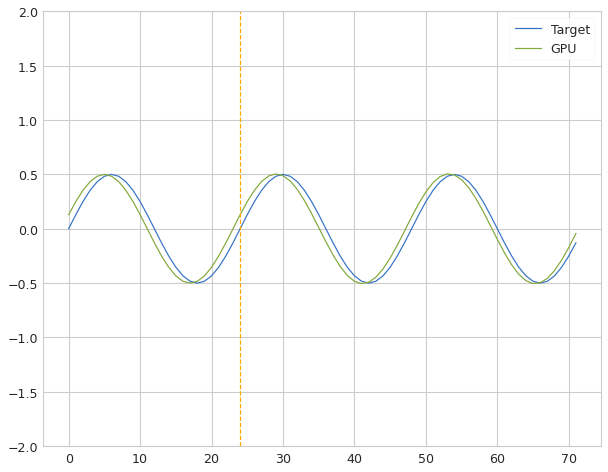

 Iter=72 a=0.889 sr=0.100 amp=0.221  ri=0.851 rr=4.421 loss=0.077681


Iter: 72 #### Diagnostic 0.078   Time 2.60  Best 0.078 NRMSE 0.078 CD 0.024
Iter: 73 #### Diagnostic 0.092   Time 1.06  Best 0.078 NRMSE 0.092 CD 0.034
Iter: 74 #### Diagnostic 0.092   Time 0.71  Best 0.078 NRMSE 0.092 CD 0.034
Iter: 75 #### Diagnostic 0.095   Time 0.82  Best 0.078 NRMSE 0.095 CD 0.036
Iter: 76 #### Diagnostic 0.098   Time 0.34  Best 0.078 NRMSE 0.098 CD 0.039
Iter: 77 #### Diagnostic 0.093   Time 0.67  Best 0.078 NRMSE 0.093 CD 0.034
Iter: 78 #### Diagnostic 0.092   Time 0.86  Best 0.078 NRMSE 0.092 CD 0.034
Iter: 79 #### Diagnostic 0.093   Time 0.69  Best 0.078 NRMSE 0.093 CD 0.035
Iter: 80 #### Diagnostic 0.092   Time 0.72  Best 0.078 NRMSE 0.092 CD 0.034
Iter: 81 #### Diagnostic 0.094   Time 0.79  Best 0.078 NRMSE 0.094 CD 0.035
Iter: 82 #### Diagnostic 0.104   Time 0.82  Best 0.078 NRMSE 0.104 CD 0.039
Iter: 83 #### Diagnostic 0.093   Time 0.44  Best 0.078 NRMSE 0.093 CD 0.034
Iter: 84 #### Dia

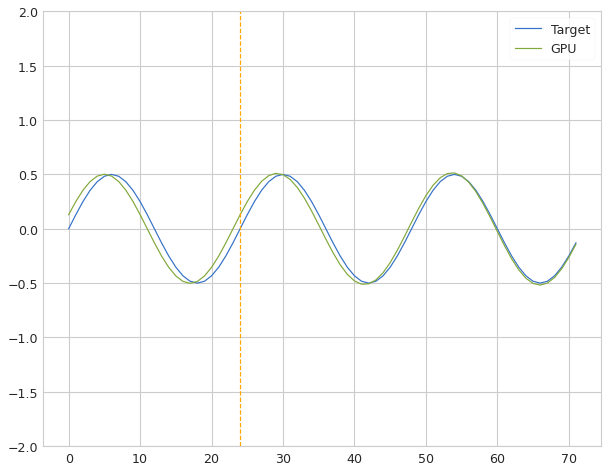

 Iter=85 a=0.889 sr=0.187 amp=0.095  ri=0.949 rr=1.347 loss=0.053729


Iter: 85 #### Diagnostic 0.054   Time 1.07  Best 0.054 NRMSE 0.054 CD 0.010
Iter: 86 #### Diagnostic 0.092   Time 0.98  Best 0.054 NRMSE 0.092 CD 0.034
Iter: 87 #### Diagnostic 0.092   Time 1.33  Best 0.054 NRMSE 0.092 CD 0.034
Iter: 88 #### Diagnostic 0.083   Time 1.17  Best 0.054 NRMSE 0.083 CD 0.027
Iter: 89 #### Diagnostic 0.093   Time 1.20  Best 0.054 NRMSE 0.093 CD 0.035
Iter: 90 #### Diagnostic 0.092   Time 1.00  Best 0.054 NRMSE 0.092 CD 0.034
Iter: 91 #### Diagnostic 0.092   Time 0.99  Best 0.054 NRMSE 0.092 CD 0.034
Iter: 92 #### Diagnostic 0.092   Time 0.78  Best 0.054 NRMSE 0.092 CD 0.034
Iter: 93 #### Diagnostic 0.092   Time 1.15  Best 0.054 NRMSE 0.092 CD 0.034
Iter: 94 #### Diagnostic 0.092   Time 1.35  Best 0.054 NRMSE 0.092 CD 0.034
Iter: 95 #### Diagnostic 0.092   Time 0.62  Best 0.054 NRMSE 0.092 CD 0.034
Iter: 96 #### Diagnostic 0.093   Time 0.43  Best 0.054 NRMSE 0.093 CD 0.034
Iter: 97 #### Dia

Iter: 87 #### Diagnostic 0.094   Time 0.75  Best 1000.000 NRMSE 0.094 CD 0.035
Iter: 88 #### Diagnostic 0.092   Time 0.65  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 89 #### Diagnostic 0.092   Time 1.04  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 90 #### Diagnostic 0.092   Time 0.63  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 91 #### Diagnostic 0.092   Time 1.22  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 92 #### Diagnostic 0.095   Time 1.11  Best 1000.000 NRMSE 0.095 CD 0.037
Iter: 93 #### Diagnostic 0.091   Time 1.12  Best 1000.000 NRMSE 0.091 CD 0.033
Iter: 94 #### Diagnostic 0.101   Time 1.02  Best 1000.000 NRMSE 0.101 CD 0.041
Iter: 95 #### Diagnostic 0.092   Time 0.94  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 96 #### Diagnostic 0.101   Time 0.93  Best 1000.000 NRMSE 0.101 CD 0.041
Iter: 97 #### Diagnostic 0.095   Time 1.49  Best 1000.000 NRMSE 0.095 CD 0.036
Iter: 98 #### Diagnostic 0.093   Time 1.02  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 99 #### Diagnostic 0.093   Time 0.89  Best 100

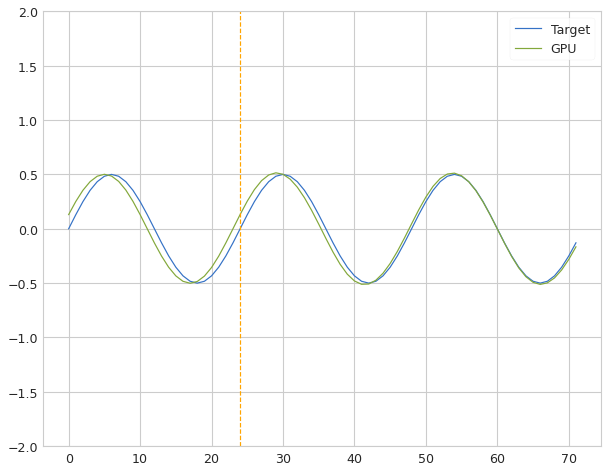

 Iter=30 a=0.979 sr=0.619 amp=0.086  ri=0.840 rr=0.572 loss=0.051229


Iter: 30 #### Diagnostic 0.051   Time 2.04  Best 0.051 NRMSE 0.051 CD 0.009
Iter: 31 #### Diagnostic 0.093   Time 1.22  Best 0.051 NRMSE 0.093 CD 0.034
Iter: 32 #### Diagnostic 0.093   Time 1.48  Best 0.051 NRMSE 0.093 CD 0.034
Iter: 33 #### Diagnostic 0.092   Time 1.86  Best 0.051 NRMSE 0.092 CD 0.034
Iter: 34 #### Diagnostic 0.103   Time 0.88  Best 0.051 NRMSE 0.103 CD 0.043
Iter: 35 #### Diagnostic 0.093   Time 0.93  Best 0.051 NRMSE 0.093 CD 0.035
Iter: 36 #### Diagnostic 0.092   Time 0.90  Best 0.051 NRMSE 0.092 CD 0.034
Iter: 37 #### Diagnostic 0.093   Time 0.67  Best 0.051 NRMSE 0.093 CD 0.035
Iter: 38 #### Diagnostic 0.092   Time 0.54  Best 0.051 NRMSE 0.092 CD 0.034
Iter: 39 #### Diagnostic 0.092   Time 0.67  Best 0.051 NRMSE 0.092 CD 0.034
Iter: 40 #### Diagnostic 0.093   Time 0.54  Best 0.051 NRMSE 0.093 CD 0.034
Iter: 41 #### Diagnostic 0.092   Time 0.69  Best 0.051 NRMSE 0.092 CD 0.034
Iter: 42 #### Dia

Iter: 26 #### Diagnostic 0.093   Time 0.47  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 27 #### Diagnostic 0.092   Time 0.87  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 28 #### Diagnostic 0.092   Time 0.67  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 29 #### Diagnostic 0.387   Time 0.76  Best 1000.000 NRMSE 0.387 CD 1.327
Iter: 30 #### Diagnostic 0.161   Time 0.85  Best 1000.000 NRMSE 0.161 CD 0.001
Iter: 31 #### Diagnostic 0.093   Time 0.79  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 32 #### Diagnostic 23.176   Time 0.67  Best 1000.000 NRMSE 23.176 CD 1.017
Iter: 33 #### Diagnostic 0.091   Time 0.69  Best 1000.000 NRMSE 0.091 CD 0.033
Iter: 34 #### Diagnostic 0.093   Time 0.55  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 35 #### Diagnostic 0.092   Time 0.44  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 36 #### Diagnostic 0.096   Time 0.79  Best 1000.000 NRMSE 0.096 CD 0.037
Iter: 37 #### Diagnostic 0.098   Time 1.18  Best 1000.000 NRMSE 0.098 CD 0.039
Iter: 38 #### Diagnostic 0.092   Time 1.31  Best 1

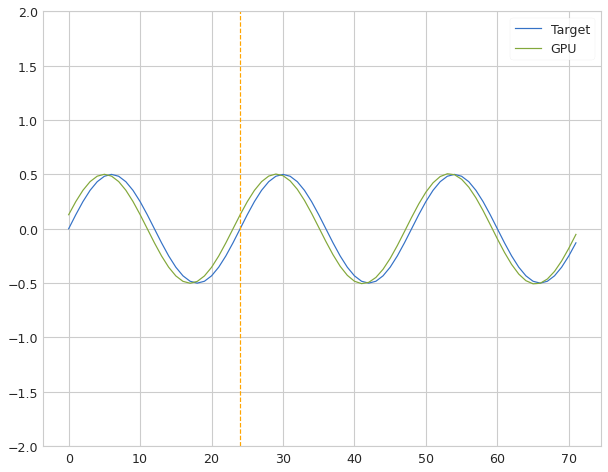

 Iter=84 a=0.591 sr=0.449 amp=0.684  ri=0.997 rr=3.632 loss=0.075015


Iter: 84 #### Diagnostic 0.075   Time 2.19  Best 0.075 NRMSE 0.075 CD 0.022
Iter: 85 #### Diagnostic 0.097   Time 1.23  Best 0.075 NRMSE 0.097 CD 0.018
Iter: 86 #### Diagnostic 0.092   Time 1.20  Best 0.075 NRMSE 0.092 CD 0.034
Iter: 87 #### Diagnostic 0.097   Time 1.07  Best 0.075 NRMSE 0.097 CD 0.036
Iter: 88 #### Diagnostic 0.092   Time 0.83  Best 0.075 NRMSE 0.092 CD 0.034
Iter: 89 #### Diagnostic 0.092   Time 0.80  Best 0.075 NRMSE 0.092 CD 0.034
Iter: 90 #### Diagnostic 0.095   Time 0.84  Best 0.075 NRMSE 0.095 CD 0.035
Iter: 91 #### Diagnostic 0.092   Time 0.77  Best 0.075 NRMSE 0.092 CD 0.034
Iter: 92 #### Diagnostic 0.093   Time 0.58  Best 0.075 NRMSE 0.093 CD 0.034
Iter: 93 #### Diagnostic 0.092   Time 0.84  Best 0.075 NRMSE 0.092 CD 0.034
Iter: 94 #### Diagnostic 0.370   Time 0.95  Best 0.075 NRMSE 0.370 CD 1.163
Iter: 95 #### Diagnostic 0.094   Time 1.16  Best 0.075 NRMSE 0.094 CD 0.035
Iter: 96 #### Dia

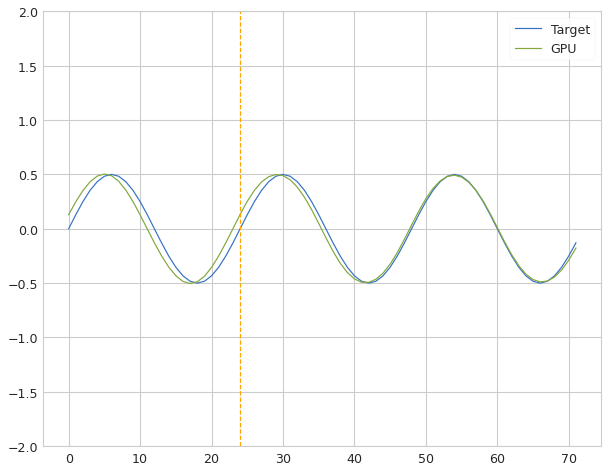

 Iter=35 a=0.982 sr=0.862 amp=0.092  ri=0.394 rr=3.226 loss=0.046735


Iter: 35 #### Diagnostic 0.047   Time 1.72  Best 0.047 NRMSE 0.047 CD 0.009
Iter: 36 #### Diagnostic 0.093   Time 0.69  Best 0.047 NRMSE 0.093 CD 0.035
Iter: 37 #### Diagnostic 0.088   Time 0.99  Best 0.047 NRMSE 0.088 CD 0.031
Iter: 38 #### Diagnostic 0.092   Time 1.14  Best 0.047 NRMSE 0.092 CD 0.034
Iter: 39 #### Diagnostic 0.092   Time 1.38  Best 0.047 NRMSE 0.092 CD 0.034
Iter: 40 #### Diagnostic 0.092   Time 1.53  Best 0.047 NRMSE 0.092 CD 0.034
Iter: 41 #### Diagnostic 0.093   Time 1.78  Best 0.047 NRMSE 0.093 CD 0.034
Iter: 42 #### Diagnostic 0.099   Time 1.78  Best 0.047 NRMSE 0.099 CD 0.039
Iter: 43 #### Diagnostic 0.094   Time 1.45  Best 0.047 NRMSE 0.094 CD 0.035
Iter: 44 #### Diagnostic 0.086   Time 1.09  Best 0.047 NRMSE 0.086 CD 0.030
Iter: 45 #### Diagnostic 0.095   Time 0.71  Best 0.047 NRMSE 0.095 CD 0.036
Iter: 46 #### Diagnostic 0.092   Time 1.24  Best 0.047 NRMSE 0.092 CD 0.034
Iter: 47 #### Dia

Iter: 39 #### Diagnostic 0.094   Time 1.45  Best 1000.000 NRMSE 0.094 CD 0.035
Iter: 40 #### Diagnostic 0.092   Time 0.96  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 41 #### Diagnostic 0.092   Time 0.89  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 42 #### Diagnostic 0.093   Time 0.97  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 43 #### Diagnostic 0.373   Time 0.62  Best 1000.000 NRMSE 0.373 CD 1.098
Iter: 44 #### Diagnostic 0.093   Time 0.79  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 45 #### Diagnostic 0.092   Time 1.65  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 46 #### Diagnostic 0.091   Time 1.18  Best 1000.000 NRMSE 0.091 CD 0.033
Iter: 47 #### Diagnostic 0.092   Time 1.25  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 48 #### Diagnostic 0.319   Time 1.50  Best 1000.000 NRMSE 0.319 CD 0.514
Iter: 49 #### Diagnostic 0.093   Time 1.38  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 50 #### Diagnostic 0.092   Time 0.99  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 51 #### Diagnostic 0.093   Time 0.31  Best 100

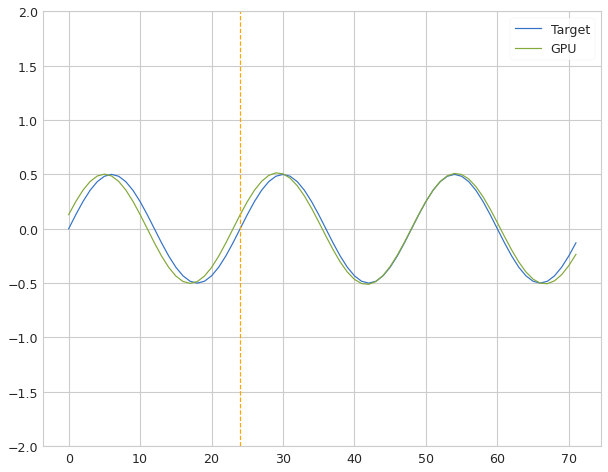

 Iter=37 a=0.953 sr=0.070 amp=0.298  ri=0.653 rr=4.602 loss=0.051552


Iter: 37 #### Diagnostic 0.052   Time 0.90  Best 0.052 NRMSE 0.052 CD 0.009
Iter: 38 #### Diagnostic 1.984   Time 0.89  Best 0.052 NRMSE 1.984 CD 0.040
Iter: 39 #### Diagnostic 0.093   Time 1.10  Best 0.052 NRMSE 0.093 CD 0.035
Iter: 40 #### Diagnostic 0.092   Time 0.89  Best 0.052 NRMSE 0.092 CD 0.034
Iter: 41 #### Diagnostic 0.091   Time 0.98  Best 0.052 NRMSE 0.091 CD 0.033
Iter: 42 #### Diagnostic 0.093   Time 1.18  Best 0.052 NRMSE 0.093 CD 0.035
Iter: 43 #### Diagnostic 0.093   Time 1.31  Best 0.052 NRMSE 0.093 CD 0.034
Iter: 44 #### Diagnostic 0.092   Time 1.52  Best 0.052 NRMSE 0.092 CD 0.034
Iter: 45 #### Diagnostic 0.091   Time 1.93  Best 0.052 NRMSE 0.091 CD 0.033
Iter: 46 #### Diagnostic 0.092   Time 1.61  Best 0.052 NRMSE 0.092 CD 0.034
Iter: 47 #### Diagnostic 0.094   Time 1.68  Best 0.052 NRMSE 0.094 CD 0.035
Iter: 48 #### Diagnostic 0.092   Time 1.24  Best 0.052 NRMSE 0.092 CD 0.034
Iter: 49 #### Dia

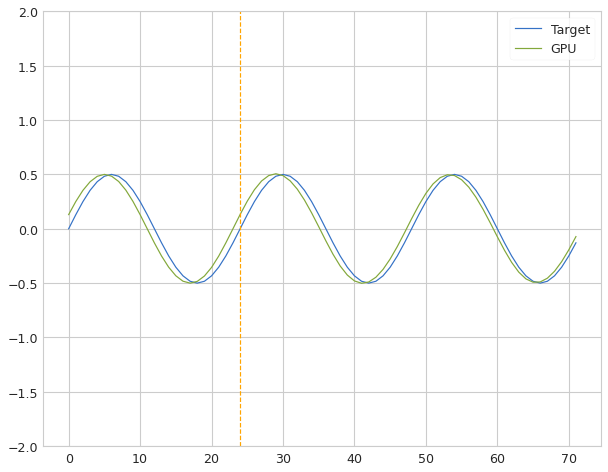

 Iter=30 a=0.979 sr=0.619 amp=0.086  ri=0.840 rr=0.572 loss=0.069601


Iter: 30 #### Diagnostic 0.070   Time 1.87  Best 0.070 NRMSE 0.070 CD 0.019
Iter: 31 #### Diagnostic 0.093   Time 1.43  Best 0.070 NRMSE 0.093 CD 0.034
Iter: 32 #### Diagnostic 0.092   Time 1.44  Best 0.070 NRMSE 0.092 CD 0.034
Iter: 33 #### Diagnostic 0.092   Time 1.53  Best 0.070 NRMSE 0.092 CD 0.034
Iter: 34 #### Diagnostic 0.090   Time 0.93  Best 0.070 NRMSE 0.090 CD 0.032
Iter: 35 #### Diagnostic 0.093   Time 0.81  Best 0.070 NRMSE 0.093 CD 0.034
Iter: 36 #### Diagnostic 0.092   Time 0.75  Best 0.070 NRMSE 0.092 CD 0.034
Iter: 37 #### Diagnostic 0.093   Time 0.99  Best 0.070 NRMSE 0.093 CD 0.034
Iter: 38 #### Diagnostic 0.092   Time 0.99  Best 0.070 NRMSE 0.092 CD 0.034
Iter: 39 #### Diagnostic 0.092   Time 1.18  Best 0.070 NRMSE 0.092 CD 0.034
Iter: 40 #### Diagnostic 0.093   Time 1.08  Best 0.070 NRMSE 0.093 CD 0.034
Iter: 41 #### Diagnostic 0.098   Time 1.45  Best 0.070 NRMSE 0.098 CD 0.038
Iter: 42 #### Dia

Iter: 26 #### Diagnostic 0.093   Time 0.67  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 27 #### Diagnostic 0.092   Time 1.02  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 28 #### Diagnostic 0.092   Time 1.43  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 29 #### Diagnostic 0.370   Time 1.23  Best 1000.000 NRMSE 0.370 CD 1.168
Iter: 30 #### Diagnostic 0.095   Time 1.19  Best 1000.000 NRMSE 0.095 CD 0.035
Iter: 31 #### Diagnostic 0.093   Time 1.19  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 32 #### Diagnostic 5.837   Time 0.76  Best 1000.000 NRMSE 5.837 CD 0.995
Iter: 33 #### Diagnostic 0.102   Time 0.71  Best 1000.000 NRMSE 0.102 CD 0.042
Iter: 34 #### Diagnostic 0.093   Time 0.70  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 35 #### Diagnostic 0.092   Time 0.64  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 36 #### Diagnostic 0.095   Time 0.41  Best 1000.000 NRMSE 0.095 CD 0.036
Iter: 37 #### Diagnostic 0.088   Time 0.74  Best 1000.000 NRMSE 0.088 CD 0.031
Iter: 38 #### Diagnostic 0.093   Time 1.48  Best 100

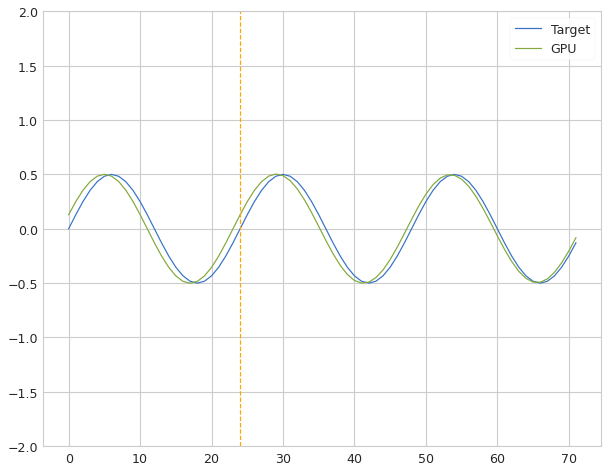

 Iter=62 a=0.833 sr=0.451 amp=0.266  ri=0.564 rr=1.296 loss=0.064878


Iter: 62 #### Diagnostic 0.065   Time 2.29  Best 0.065 NRMSE 0.065 CD 0.017
Iter: 63 #### Diagnostic 0.092   Time 1.65  Best 0.065 NRMSE 0.092 CD 0.034
Iter: 64 #### Diagnostic 0.092   Time 1.46  Best 0.065 NRMSE 0.092 CD 0.034
Iter: 65 #### Diagnostic 0.092   Time 0.64  Best 0.065 NRMSE 0.092 CD 0.034
Iter: 66 #### Diagnostic 0.091   Time 0.88  Best 0.065 NRMSE 0.091 CD 0.034
Iter: 67 #### Diagnostic 0.093   Time 1.09  Best 0.065 NRMSE 0.093 CD 0.035
Iter: 68 #### Diagnostic 0.092   Time 0.71  Best 0.065 NRMSE 0.092 CD 0.034
Iter: 69 #### Diagnostic 0.092   Time 0.89  Best 0.065 NRMSE 0.092 CD 0.034
Iter: 70 #### Diagnostic 0.093   Time 0.99  Best 0.065 NRMSE 0.093 CD 0.034
Iter: 71 #### Diagnostic 0.093   Time 0.81  Best 0.065 NRMSE 0.093 CD 0.035
Iter: 72 #### Diagnostic 0.092   Time 1.16  Best 0.065 NRMSE 0.092 CD 0.034
Iter: 73 #### Diagnostic 0.093   Time 0.93  Best 0.065 NRMSE 0.093 CD 0.035
Iter: 74 #### Dia

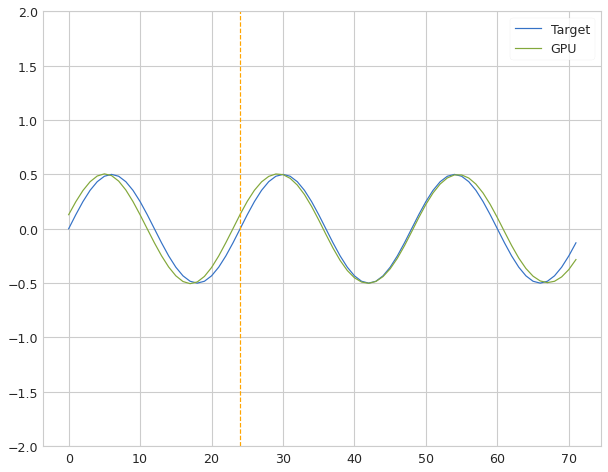

 Iter=35 a=0.982 sr=0.862 amp=0.092  ri=0.394 rr=3.226 loss=0.062346


Iter: 35 #### Diagnostic 0.062   Time 1.47  Best 0.062 NRMSE 0.062 CD 0.014
Iter: 36 #### Diagnostic 0.093   Time 0.51  Best 0.062 NRMSE 0.093 CD 0.035
Iter: 37 #### Diagnostic 0.087   Time 0.54  Best 0.062 NRMSE 0.087 CD 0.031
Iter: 38 #### Diagnostic 0.092   Time 0.82  Best 0.062 NRMSE 0.092 CD 0.034
Iter: 39 #### Diagnostic 0.093   Time 0.72  Best 0.062 NRMSE 0.093 CD 0.035
Iter: 40 #### Diagnostic 0.093   Time 0.73  Best 0.062 NRMSE 0.093 CD 0.034
Iter: 41 #### Diagnostic 0.093   Time 0.71  Best 0.062 NRMSE 0.093 CD 0.034
Iter: 42 #### Diagnostic 0.097   Time 0.62  Best 0.062 NRMSE 0.097 CD 0.037
Iter: 43 #### Diagnostic 0.094   Time 0.75  Best 0.062 NRMSE 0.094 CD 0.035
Iter: 44 #### Diagnostic 0.077   Time 1.27  Best 0.062 NRMSE 0.077 CD 0.023
Iter: 45 #### Diagnostic 0.091   Time 1.18  Best 0.062 NRMSE 0.091 CD 0.033
Iter: 46 #### Diagnostic 0.092   Time 0.98  Best 0.062 NRMSE 0.092 CD 0.034
Iter: 47 #### Dia

Iter: 39 #### Diagnostic 0.094   Time 1.03  Best 1000.000 NRMSE 0.094 CD 0.035
Iter: 40 #### Diagnostic 0.092   Time 0.86  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 41 #### Diagnostic 0.092   Time 0.67  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 42 #### Diagnostic 0.092   Time 0.98  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 43 #### Diagnostic 0.370   Time 0.55  Best 1000.000 NRMSE 0.370 CD 1.184
Iter: 44 #### Diagnostic 0.092   Time 0.59  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 45 #### Diagnostic 0.085   Time 0.48  Best 1000.000 NRMSE 0.085 CD 0.029
Iter: 46 #### Diagnostic 0.095   Time 0.44  Best 1000.000 NRMSE 0.095 CD 0.036
Iter: 47 #### Diagnostic 0.092   Time 0.42  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 48 #### Diagnostic 0.273   Time 1.15  Best 1000.000 NRMSE 0.273 CD 0.160
Iter: 49 #### Diagnostic 0.093   Time 1.05  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 50 #### Diagnostic 0.088   Time 1.10  Best 1000.000 NRMSE 0.088 CD 0.031
Iter: 51 #### Diagnostic 0.092   Time 0.57  Best 100

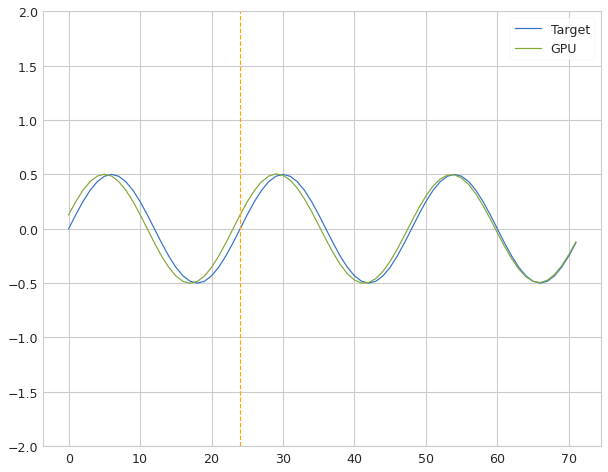

 Iter=54 a=0.823 sr=0.029 amp=0.188  ri=0.675 rr=4.542 loss=0.054901


Iter: 54 #### Diagnostic 0.055   Time 1.25  Best 0.055 NRMSE 0.055 CD 0.012
Iter: 55 #### Diagnostic 0.093   Time 0.92  Best 0.055 NRMSE 0.093 CD 0.034
Iter: 56 #### Diagnostic 0.088   Time 0.88  Best 0.055 NRMSE 0.088 CD 0.031
Iter: 57 #### Diagnostic 1.698   Time 1.05  Best 0.055 NRMSE 1.698 CD 0.086
Iter: 58 #### Diagnostic 0.094   Time 0.84  Best 0.055 NRMSE 0.094 CD 0.036
Iter: 59 #### Diagnostic 0.093   Time 0.91  Best 0.055 NRMSE 0.093 CD 0.035
Iter: 60 #### Diagnostic 0.092   Time 1.18  Best 0.055 NRMSE 0.092 CD 0.033
Iter: 61 #### Diagnostic 0.092   Time 1.17  Best 0.055 NRMSE 0.092 CD 0.034
Iter: 62 #### Diagnostic 0.092   Time 0.94  Best 0.055 NRMSE 0.092 CD 0.034
Iter: 63 #### Diagnostic 0.092   Time 0.83  Best 0.055 NRMSE 0.092 CD 0.034
Iter: 64 #### Diagnostic 0.090   Time 1.06  Best 0.055 NRMSE 0.090 CD 0.031
Iter: 65 #### Diagnostic 0.094   Time 0.43  Best 0.055 NRMSE 0.094 CD 0.035
Iter: 66 #### Dia

Iter: 57 #### Diagnostic 0.092   Time 0.91  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 58 #### Diagnostic 0.092   Time 0.91  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 59 #### Diagnostic 0.093   Time 0.83  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 60 #### Diagnostic 0.089   Time 0.56  Best 1000.000 NRMSE 0.089 CD 0.029
Iter: 61 #### Diagnostic 0.409   Time 0.76  Best 1000.000 NRMSE 0.409 CD 1.333
Iter: 62 #### Diagnostic 0.089   Time 1.02  Best 1000.000 NRMSE 0.089 CD 0.031
Iter: 63 #### Diagnostic 0.092   Time 0.78  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 64 #### Diagnostic 0.095   Time 0.74  Best 1000.000 NRMSE 0.095 CD 0.036
Iter: 65 #### Diagnostic 0.092   Time 0.78  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 66 #### Diagnostic 0.093   Time 0.75  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 67 #### Diagnostic 0.126   Time 0.44  Best 1000.000 NRMSE 0.126 CD 0.059
Iter: 68 #### Diagnostic 0.108   Time 1.01  Best 1000.000 NRMSE 0.108 CD 0.036
Iter: 69 #### Diagnostic 0.092   Time 1.14  Best 100

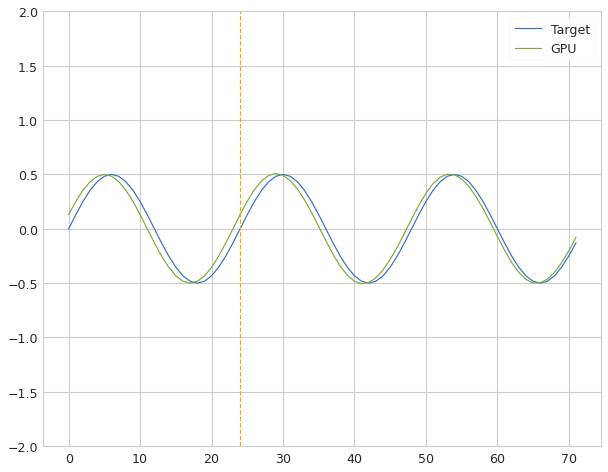

 Iter=86 a=0.945 sr=1.039 amp=0.126  ri=0.886 rr=3.615 loss=0.068000


Iter: 86 #### Diagnostic 0.068   Time 1.06  Best 0.068 NRMSE 0.068 CD 0.018
Iter: 87 #### Diagnostic 0.095   Time 0.96  Best 0.068 NRMSE 0.095 CD 0.036
Iter: 88 #### Diagnostic 0.092   Time 0.66  Best 0.068 NRMSE 0.092 CD 0.034
Iter: 89 #### Diagnostic 0.092   Time 0.70  Best 0.068 NRMSE 0.092 CD 0.034
Iter: 90 #### Diagnostic 0.092   Time 0.64  Best 0.068 NRMSE 0.092 CD 0.034
Iter: 91 #### Diagnostic 0.092   Time 0.72  Best 0.068 NRMSE 0.092 CD 0.034
Iter: 92 #### Diagnostic 0.095   Time 0.68  Best 0.068 NRMSE 0.095 CD 0.036
Iter: 93 #### Diagnostic 0.104   Time 0.76  Best 0.068 NRMSE 0.104 CD 0.043
Iter: 94 #### Diagnostic 0.094   Time 0.44  Best 0.068 NRMSE 0.094 CD 0.035
Iter: 95 #### Diagnostic 0.092   Time 0.42  Best 0.068 NRMSE 0.092 CD 0.034
Iter: 96 #### Diagnostic 0.099   Time 0.55  Best 0.068 NRMSE 0.099 CD 0.039
Iter: 97 #### Diagnostic 0.095   Time 0.52  Best 0.068 NRMSE 0.095 CD 0.035
Iter: 98 #### Dia

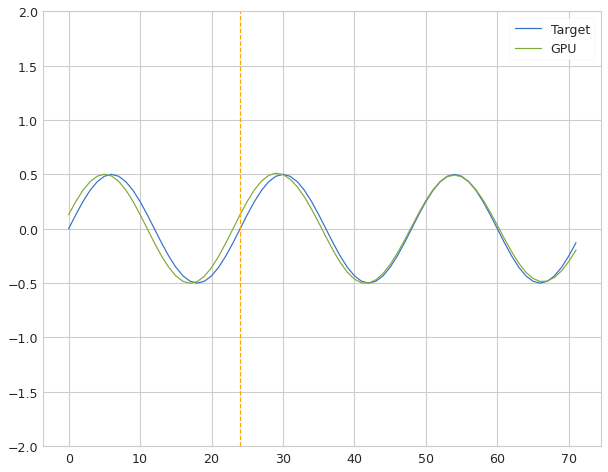

 Iter=30 a=0.979 sr=0.619 amp=0.086  ri=0.840 rr=0.572 loss=0.047593


Iter: 30 #### Diagnostic 0.048   Time 1.64  Best 0.048 NRMSE 0.048 CD 0.009
Iter: 31 #### Diagnostic 0.093   Time 0.89  Best 0.048 NRMSE 0.093 CD 0.034
Iter: 32 #### Diagnostic 0.092   Time 0.64  Best 0.048 NRMSE 0.092 CD 0.034
Iter: 33 #### Diagnostic 0.093   Time 0.74  Best 0.048 NRMSE 0.093 CD 0.035
Iter: 34 #### Diagnostic 0.098   Time 0.76  Best 0.048 NRMSE 0.098 CD 0.038
Iter: 35 #### Diagnostic 0.093   Time 0.73  Best 0.048 NRMSE 0.093 CD 0.035
Iter: 36 #### Diagnostic 0.092   Time 0.96  Best 0.048 NRMSE 0.092 CD 0.034
Iter: 37 #### Diagnostic 0.093   Time 0.63  Best 0.048 NRMSE 0.093 CD 0.034
Iter: 38 #### Diagnostic 0.092   Time 0.61  Best 0.048 NRMSE 0.092 CD 0.034
Iter: 39 #### Diagnostic 0.092   Time 0.75  Best 0.048 NRMSE 0.092 CD 0.034
Iter: 40 #### Diagnostic 0.093   Time 0.68  Best 0.048 NRMSE 0.093 CD 0.034
Iter: 41 #### Diagnostic 0.093   Time 0.59  Best 0.048 NRMSE 0.093 CD 0.034
Iter: 42 #### Dia

Iter: 26 #### Diagnostic 0.093   Time 0.70  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 27 #### Diagnostic 0.092   Time 1.04  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 28 #### Diagnostic 0.092   Time 1.40  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 29 #### Diagnostic 0.371   Time 1.59  Best 1000.000 NRMSE 0.371 CD 1.079
Iter: 30 #### Diagnostic 0.151   Time 1.19  Best 1000.000 NRMSE 0.151 CD 0.002
Iter: 31 #### Diagnostic 0.093   Time 1.02  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 32 #### Diagnostic 19.348   Time 0.51  Best 1000.000 NRMSE 19.348 CD 1.005
Iter: 33 #### Diagnostic 0.097   Time 0.72  Best 1000.000 NRMSE 0.097 CD 0.038
Iter: 34 #### Diagnostic 0.093   Time 0.65  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 35 #### Diagnostic 0.092   Time 0.78  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 36 #### Diagnostic 0.088   Time 0.77  Best 1000.000 NRMSE 0.088 CD 0.031
Iter: 37 #### Diagnostic 0.095   Time 0.71  Best 1000.000 NRMSE 0.095 CD 0.036
Iter: 38 #### Diagnostic 0.092   Time 0.69  Best 1

Iter: 28 #### Diagnostic 0.101   Time 1.28  Best 1000.000 NRMSE 0.101 CD 0.041
Iter: 29 #### Diagnostic 0.092   Time 0.99  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 30 #### Diagnostic 0.093   Time 1.16  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 31 #### Diagnostic 0.094   Time 1.13  Best 1000.000 NRMSE 0.094 CD 0.035
Iter: 32 #### Diagnostic 1.723   Time 0.88  Best 1000.000 NRMSE 1.723 CD 1.947
Iter: 33 #### Diagnostic 0.093   Time 0.82  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 34 #### Diagnostic 0.092   Time 0.87  Best 1000.000 NRMSE 0.092 CD 0.034


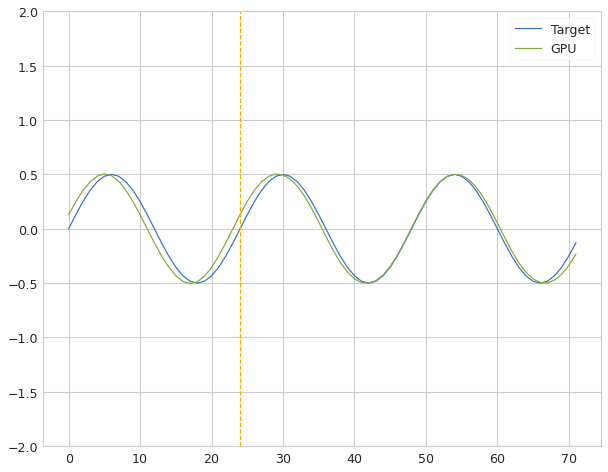

 Iter=35 a=0.982 sr=0.862 amp=0.092  ri=0.394 rr=3.226 loss=0.050647


Iter: 35 #### Diagnostic 0.051   Time 2.23  Best 0.051 NRMSE 0.051 CD 0.009
Iter: 36 #### Diagnostic 0.093   Time 0.74  Best 0.051 NRMSE 0.093 CD 0.035
Iter: 37 #### Diagnostic 0.090   Time 0.77  Best 0.051 NRMSE 0.090 CD 0.033
Iter: 38 #### Diagnostic 0.093   Time 0.73  Best 0.051 NRMSE 0.093 CD 0.034
Iter: 39 #### Diagnostic 0.092   Time 0.70  Best 0.051 NRMSE 0.092 CD 0.034
Iter: 40 #### Diagnostic 0.087   Time 0.76  Best 0.051 NRMSE 0.087 CD 0.030
Iter: 41 #### Diagnostic 0.093   Time 0.85  Best 0.051 NRMSE 0.093 CD 0.034
Iter: 42 #### Diagnostic 0.097   Time 0.94  Best 0.051 NRMSE 0.097 CD 0.037
Iter: 43 #### Diagnostic 0.094   Time 0.40  Best 0.051 NRMSE 0.094 CD 0.035
Iter: 44 #### Diagnostic 0.090   Time 0.35  Best 0.051 NRMSE 0.090 CD 0.032
Iter: 45 #### Diagnostic 0.093   Time 0.91  Best 0.051 NRMSE 0.093 CD 0.034
Iter: 46 #### Diagnostic 0.092   Time 0.77  Best 0.051 NRMSE 0.092 CD 0.034
Iter: 47 #### Dia

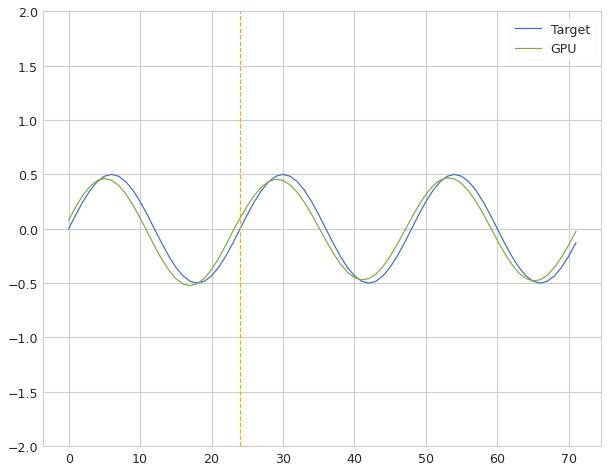

 Iter=36 a=0.440 sr=1.025 amp=0.969  ri=0.720 rr=2.051 loss=0.078907


Iter: 36 #### Diagnostic 0.079   Time 1.12  Best 0.079 NRMSE 0.079 CD 0.025
Iter: 37 #### Diagnostic 0.093   Time 0.73  Best 0.079 NRMSE 0.093 CD 0.034
Iter: 38 #### Diagnostic 0.092   Time 0.31  Best 0.079 NRMSE 0.092 CD 0.034
Iter: 39 #### Diagnostic 0.082   Time 0.77  Best 0.079 NRMSE 0.082 CD 0.027
Iter: 40 #### Diagnostic 0.092   Time 1.23  Best 0.079 NRMSE 0.092 CD 0.034
Iter: 41 #### Diagnostic 0.093   Time 1.16  Best 0.079 NRMSE 0.093 CD 0.034
Iter: 42 #### Diagnostic 0.093   Time 1.08  Best 0.079 NRMSE 0.093 CD 0.034
Iter: 43 #### Diagnostic 0.371   Time 0.71  Best 0.079 NRMSE 0.371 CD 1.128
Iter: 44 #### Diagnostic 0.093   Time 0.66  Best 0.079 NRMSE 0.093 CD 0.034
Iter: 45 #### Diagnostic 0.087   Time 1.02  Best 0.079 NRMSE 0.087 CD 0.030
Iter: 46 #### Diagnostic 0.093   Time 0.75  Best 0.079 NRMSE 0.093 CD 0.035
Iter: 47 #### Diagnostic 0.092   Time 0.74  Best 0.079 NRMSE 0.092 CD 0.034
Iter: 48 #### Dia

Iter: 40 #### Diagnostic 0.092   Time 0.50  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 41 #### Diagnostic 0.091   Time 0.82  Best 1000.000 NRMSE 0.091 CD 0.033
Iter: 42 #### Diagnostic 0.093   Time 0.70  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 43 #### Diagnostic 0.093   Time 0.70  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 44 #### Diagnostic 0.093   Time 0.77  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 45 #### Diagnostic 0.110   Time 0.73  Best 1000.000 NRMSE 0.110 CD 0.034
Iter: 46 #### Diagnostic 0.092   Time 0.82  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 47 #### Diagnostic 0.091   Time 0.70  Best 1000.000 NRMSE 0.091 CD 0.033
Iter: 48 #### Diagnostic 0.092   Time 0.55  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 49 #### Diagnostic 0.092   Time 1.08  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 50 #### Diagnostic 0.092   Time 0.98  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 51 #### Diagnostic 0.093   Time 0.98  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 52 #### Diagnostic 0.105   Time 1.09  Best 100

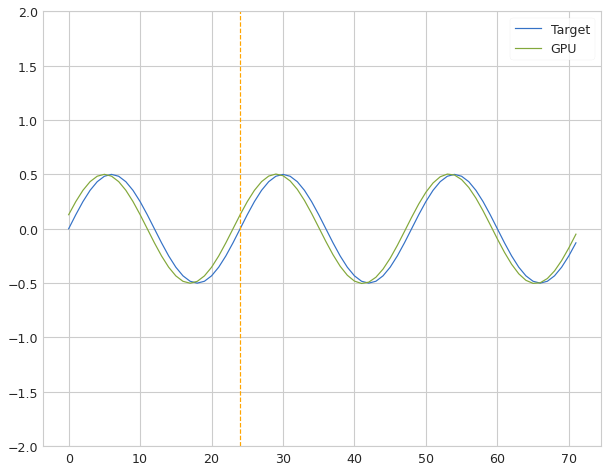

 Iter=70 a=0.917 sr=0.566 amp=0.484  ri=0.025 rr=3.723 loss=0.075455


Iter: 70 #### Diagnostic 0.075   Time 1.35  Best 0.075 NRMSE 0.075 CD 0.022
Iter: 71 #### Diagnostic 0.093   Time 0.86  Best 0.075 NRMSE 0.093 CD 0.034
Iter: 72 #### Diagnostic 0.094   Time 0.70  Best 0.075 NRMSE 0.094 CD 0.035
Iter: 73 #### Diagnostic 0.185   Time 0.75  Best 0.075 NRMSE 0.185 CD 0.052
Iter: 74 #### Diagnostic 0.092   Time 0.80  Best 0.075 NRMSE 0.092 CD 0.034
Iter: 75 #### Diagnostic 0.091   Time 0.97  Best 0.075 NRMSE 0.091 CD 0.033
Iter: 76 #### Diagnostic 0.093   Time 1.14  Best 0.075 NRMSE 0.093 CD 0.034
Iter: 77 #### Diagnostic 0.092   Time 0.65  Best 0.075 NRMSE 0.092 CD 0.034
Iter: 78 #### Diagnostic 0.093   Time 0.94  Best 0.075 NRMSE 0.093 CD 0.034
Iter: 79 #### Diagnostic 0.093   Time 0.87  Best 0.075 NRMSE 0.093 CD 0.035
Iter: 80 #### Diagnostic 0.092   Time 0.86  Best 0.075 NRMSE 0.092 CD 0.034
Iter: 81 #### Diagnostic 0.093   Time 0.82  Best 0.075 NRMSE 0.093 CD 0.035
Iter: 82 #### Dia

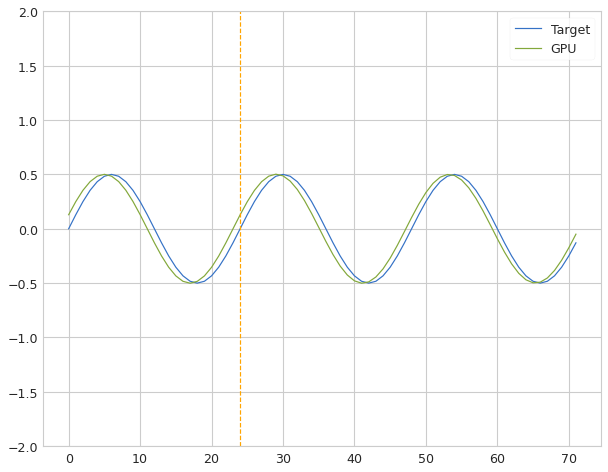

 Iter=22 a=0.795 sr=0.733 amp=0.469  ri=0.888 rr=0.607 loss=0.075065


Iter: 22 #### Diagnostic 0.075   Time 1.54  Best 0.075 NRMSE 0.075 CD 0.022
Iter: 23 #### Diagnostic 0.097   Time 0.44  Best 0.075 NRMSE 0.097 CD 0.037
Iter: 24 #### Diagnostic 0.095   Time 0.93  Best 0.075 NRMSE 0.095 CD 0.036
Iter: 25 #### Diagnostic 0.092   Time 0.31  Best 0.075 NRMSE 0.092 CD 0.034
Iter: 26 #### Diagnostic 0.087   Time 0.32  Best 0.075 NRMSE 0.087 CD 0.030
Iter: 27 #### Diagnostic 0.094   Time 0.57  Best 0.075 NRMSE 0.094 CD 0.035
Iter: 28 #### Diagnostic 0.092   Time 0.69  Best 0.075 NRMSE 0.092 CD 0.034
Iter: 29 #### Diagnostic 0.093   Time 0.86  Best 0.075 NRMSE 0.093 CD 0.035


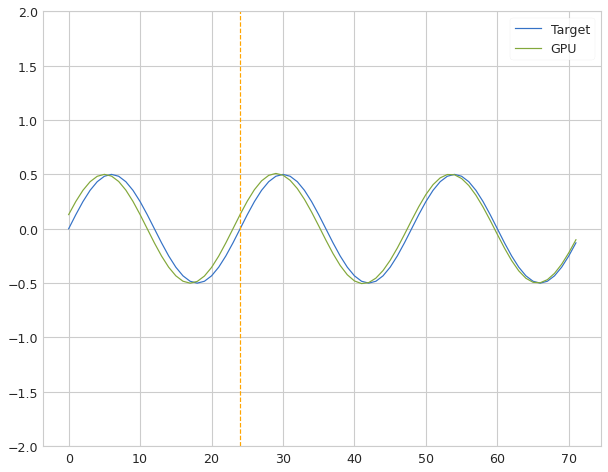

 Iter=30 a=0.979 sr=0.619 amp=0.086  ri=0.840 rr=0.572 loss=0.061845


Iter: 30 #### Diagnostic 0.062   Time 1.68  Best 0.062 NRMSE 0.062 CD 0.015
Iter: 31 #### Diagnostic 0.093   Time 0.80  Best 0.062 NRMSE 0.093 CD 0.034
Iter: 32 #### Diagnostic 0.092   Time 0.94  Best 0.062 NRMSE 0.092 CD 0.034
Iter: 33 #### Diagnostic 0.092   Time 0.82  Best 0.062 NRMSE 0.092 CD 0.034
Iter: 34 #### Diagnostic 0.093   Time 0.70  Best 0.062 NRMSE 0.093 CD 0.034
Iter: 35 #### Diagnostic 0.093   Time 0.75  Best 0.062 NRMSE 0.093 CD 0.035
Iter: 36 #### Diagnostic 0.092   Time 0.74  Best 0.062 NRMSE 0.092 CD 0.034
Iter: 37 #### Diagnostic 0.092   Time 1.25  Best 0.062 NRMSE 0.092 CD 0.034
Iter: 38 #### Diagnostic 0.092   Time 0.96  Best 0.062 NRMSE 0.092 CD 0.034
Iter: 39 #### Diagnostic 0.092   Time 1.09  Best 0.062 NRMSE 0.092 CD 0.034
Iter: 40 #### Diagnostic 0.092   Time 0.77  Best 0.062 NRMSE 0.092 CD 0.034
Iter: 41 #### Diagnostic 0.091   Time 0.77  Best 0.062 NRMSE 0.091 CD 0.033
Iter: 42 #### Dia

Iter: 26 #### Diagnostic 0.093   Time 0.54  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 27 #### Diagnostic 0.092   Time 0.50  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 28 #### Diagnostic 0.092   Time 0.49  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 29 #### Diagnostic 0.378   Time 0.71  Best 1000.000 NRMSE 0.378 CD 0.992
Iter: 30 #### Diagnostic 0.087   Time 0.80  Best 1000.000 NRMSE 0.087 CD 0.026
Iter: 31 #### Diagnostic 0.093   Time 0.52  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 32 #### Diagnostic 3.544   Time 0.47  Best 1000.000 NRMSE 3.544 CD 0.997
Iter: 33 #### Diagnostic 0.084   Time 0.43  Best 1000.000 NRMSE 0.084 CD 0.029
Iter: 34 #### Diagnostic 0.093   Time 0.52  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 35 #### Diagnostic 0.092   Time 0.54  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 36 #### Diagnostic 0.095   Time 0.45  Best 1000.000 NRMSE 0.095 CD 0.036
Iter: 37 #### Diagnostic 0.094   Time 0.80  Best 1000.000 NRMSE 0.094 CD 0.036
Iter: 38 #### Diagnostic 0.092   Time 0.80  Best 100

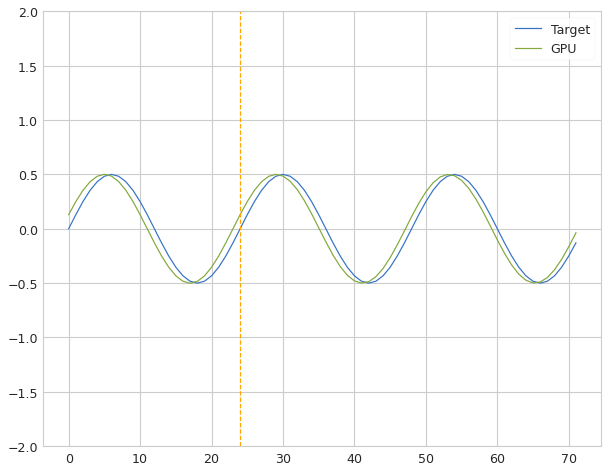

 Iter=2 a=0.574 sr=0.695 amp=0.006  ri=0.607 rr=3.525 loss=0.079555


Iter: 2 #### Diagnostic 0.080   Time 1.36  Best 0.080 NRMSE 0.080 CD 0.025
Iter: 3 #### Diagnostic 0.093   Time 0.46  Best 0.080 NRMSE 0.093 CD 0.034
Iter: 4 #### Diagnostic 0.093   Time 0.48  Best 0.080 NRMSE 0.093 CD 0.034
Iter: 5 #### Diagnostic 0.094   Time 0.48  Best 0.080 NRMSE 0.094 CD 0.035
Iter: 6 #### Diagnostic 0.092   Time 0.59  Best 0.080 NRMSE 0.092 CD 0.034
Iter: 7 #### Diagnostic 0.093   Time 0.59  Best 0.080 NRMSE 0.093 CD 0.034
Iter: 8 #### Diagnostic 0.092   Time 0.56  Best 0.080 NRMSE 0.092 CD 0.034
Iter: 9 #### Diagnostic 0.093   Time 0.36  Best 0.080 NRMSE 0.093 CD 0.035
Iter: 10 #### Diagnostic 0.096   Time 0.79  Best 0.080 NRMSE 0.096 CD 0.037
Iter: 11 #### Diagnostic 0.092   Time 0.89  Best 0.080 NRMSE 0.092 CD 0.034
Iter: 12 #### Diagnostic 0.099   Time 0.77  Best 0.080 NRMSE 0.099 CD 0.040
Iter: 13 #### Diagnostic 0.093   Time 0.56  Best 0.080 NRMSE 0.093 CD 0.034
Iter: 14 #### Diagnostic 0

Iter: 7 #### Diagnostic 0.092   Time 0.26  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 8 #### Diagnostic 0.093   Time 0.43  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 9 #### Diagnostic 0.092   Time 0.60  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 10 #### Diagnostic 0.096   Time 0.75  Best 1000.000 NRMSE 0.096 CD 0.037
Iter: 11 #### Diagnostic 0.093   Time 0.54  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 12 #### Diagnostic 0.095   Time 0.80  Best 1000.000 NRMSE 0.095 CD 0.036
Iter: 13 #### Diagnostic 0.092   Time 0.50  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 14 #### Diagnostic 0.093   Time 0.43  Best 1000.000 NRMSE 0.093 CD 0.035


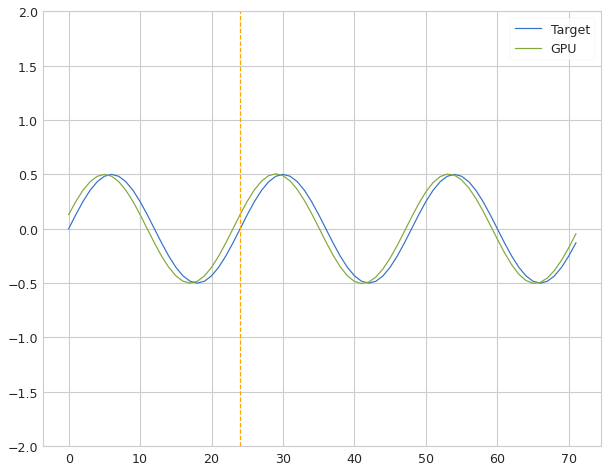

 Iter=15 a=0.926 sr=0.334 amp=0.177  ri=0.990 rr=3.464 loss=0.077927


Iter: 15 #### Diagnostic 0.078   Time 1.15  Best 0.078 NRMSE 0.078 CD 0.024
Iter: 16 #### Diagnostic 0.096   Time 0.41  Best 0.078 NRMSE 0.096 CD 0.037
Iter: 17 #### Diagnostic 0.093   Time 0.57  Best 0.078 NRMSE 0.093 CD 0.034
Iter: 18 #### Diagnostic 0.092   Time 0.54  Best 0.078 NRMSE 0.092 CD 0.034
Iter: 19 #### Diagnostic 0.093   Time 0.53  Best 0.078 NRMSE 0.093 CD 0.034
Iter: 20 #### Diagnostic 0.093   Time 0.62  Best 0.078 NRMSE 0.093 CD 0.034
Iter: 21 #### Diagnostic 0.092   Time 0.42  Best 0.078 NRMSE 0.092 CD 0.034
Iter: 22 #### Diagnostic 0.093   Time 0.36  Best 0.078 NRMSE 0.093 CD 0.034
Iter: 23 #### Diagnostic 0.092   Time 0.31  Best 0.078 NRMSE 0.092 CD 0.034
Iter: 24 #### Diagnostic 0.093   Time 0.41  Best 0.078 NRMSE 0.093 CD 0.034
Iter: 25 #### Diagnostic 0.098   Time 0.92  Best 0.078 NRMSE 0.098 CD 0.038
Iter: 26 #### Diagnostic 0.094   Time 0.65  Best 0.078 NRMSE 0.094 CD 0.035
Iter: 27 #### Dia

Iter: 19 #### Diagnostic 0.092   Time 0.37  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 20 #### Diagnostic 0.093   Time 0.49  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 21 #### Diagnostic 0.092   Time 0.51  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 22 #### Diagnostic 0.092   Time 0.48  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 23 #### Diagnostic 0.091   Time 0.85  Best 1000.000 NRMSE 0.091 CD 0.033
Iter: 24 #### Diagnostic 0.091   Time 0.66  Best 1000.000 NRMSE 0.091 CD 0.033
Iter: 25 #### Diagnostic 0.092   Time 0.47  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 26 #### Diagnostic 0.092   Time 0.59  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 27 #### Diagnostic 0.092   Time 0.39  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 28 #### Diagnostic 0.091   Time 0.39  Best 1000.000 NRMSE 0.091 CD 0.034
Iter: 29 #### Diagnostic 0.100   Time 0.59  Best 1000.000 NRMSE 0.100 CD 0.040
Iter: 30 #### Diagnostic 0.092   Time 0.47  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 31 #### Diagnostic 0.093   Time 0.70  Best 100

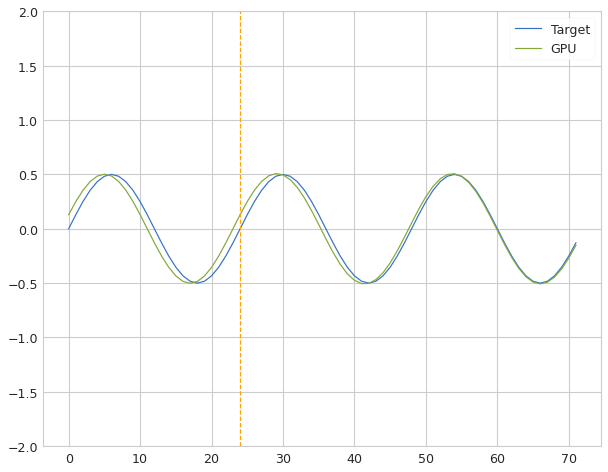

 Iter=37 a=0.953 sr=0.070 amp=0.298  ri=0.653 rr=4.602 loss=0.050911


Iter: 37 #### Diagnostic 0.051   Time 1.45  Best 0.051 NRMSE 0.051 CD 0.010
Iter: 38 #### Diagnostic 0.245   Time 1.14  Best 0.051 NRMSE 0.245 CD 0.064
Iter: 39 #### Diagnostic 0.092   Time 0.81  Best 0.051 NRMSE 0.092 CD 0.034
Iter: 40 #### Diagnostic 0.092   Time 0.66  Best 0.051 NRMSE 0.092 CD 0.034
Iter: 41 #### Diagnostic 0.091   Time 0.63  Best 0.051 NRMSE 0.091 CD 0.034
Iter: 42 #### Diagnostic 0.093   Time 0.66  Best 0.051 NRMSE 0.093 CD 0.035
Iter: 43 #### Diagnostic 0.093   Time 0.54  Best 0.051 NRMSE 0.093 CD 0.034
Iter: 44 #### Diagnostic 0.094   Time 0.56  Best 0.051 NRMSE 0.094 CD 0.035
Iter: 45 #### Diagnostic 0.090   Time 0.37  Best 0.051 NRMSE 0.090 CD 0.033
Iter: 46 #### Diagnostic 0.092   Time 0.48  Best 0.051 NRMSE 0.092 CD 0.034
Iter: 47 #### Diagnostic 0.092   Time 0.61  Best 0.051 NRMSE 0.092 CD 0.034
Iter: 48 #### Diagnostic 0.092   Time 0.46  Best 0.051 NRMSE 0.092 CD 0.034
Iter: 49 #### Dia

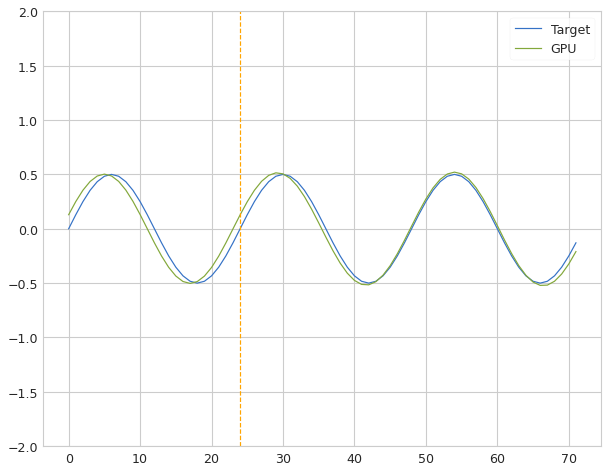

 Iter=56 a=0.816 sr=0.061 amp=0.053  ri=0.096 rr=0.347 loss=0.050193


Iter: 56 #### Diagnostic 0.050   Time 1.11  Best 0.050 NRMSE 0.050 CD 0.008
Iter: 57 #### Diagnostic 0.092   Time 0.56  Best 0.050 NRMSE 0.092 CD 0.034
Iter: 58 #### Diagnostic 0.092   Time 0.42  Best 0.050 NRMSE 0.092 CD 0.034
Iter: 59 #### Diagnostic 0.091   Time 0.24  Best 0.050 NRMSE 0.091 CD 0.034
Iter: 60 #### Diagnostic 0.090   Time 0.16  Best 0.050 NRMSE 0.090 CD 0.032
Iter: 61 #### Diagnostic 0.148   Time 0.23  Best 0.050 NRMSE 0.148 CD 0.063
Iter: 62 #### Diagnostic 0.091   Time 0.32  Best 0.050 NRMSE 0.091 CD 0.033
Iter: 63 #### Diagnostic 0.096   Time 0.28  Best 0.050 NRMSE 0.096 CD 0.037
Iter: 64 #### Diagnostic 0.094   Time 0.32  Best 0.050 NRMSE 0.094 CD 0.035
Iter: 65 #### Diagnostic 0.093   Time 0.34  Best 0.050 NRMSE 0.093 CD 0.034
Iter: 66 #### Diagnostic 0.092   Time 0.84  Best 0.050 NRMSE 0.092 CD 0.034
Iter: 67 #### Diagnostic 0.070   Time 0.27  Best 0.050 NRMSE 0.070 CD 0.017
Iter: 68 #### Dia

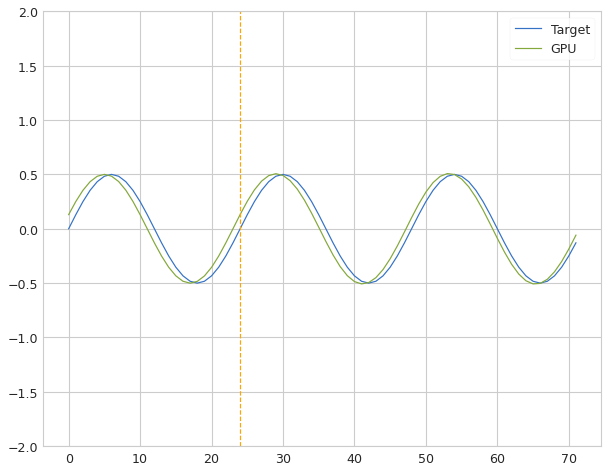

 Iter=23 a=0.917 sr=0.451 amp=0.216  ri=0.727 rr=0.181 loss=0.074316


Iter: 23 #### Diagnostic 0.074   Time 0.86  Best 0.074 NRMSE 0.074 CD 0.021
Iter: 24 #### Diagnostic 0.095   Time 0.70  Best 0.074 NRMSE 0.095 CD 0.036
Iter: 25 #### Diagnostic 0.092   Time 0.36  Best 0.074 NRMSE 0.092 CD 0.034
Iter: 26 #### Diagnostic 0.093   Time 0.59  Best 0.074 NRMSE 0.093 CD 0.034
Iter: 27 #### Diagnostic 0.093   Time 0.43  Best 0.074 NRMSE 0.093 CD 0.035
Iter: 28 #### Diagnostic 0.092   Time 1.02  Best 0.074 NRMSE 0.092 CD 0.034
Iter: 29 #### Diagnostic 0.093   Time 0.67  Best 0.074 NRMSE 0.093 CD 0.035


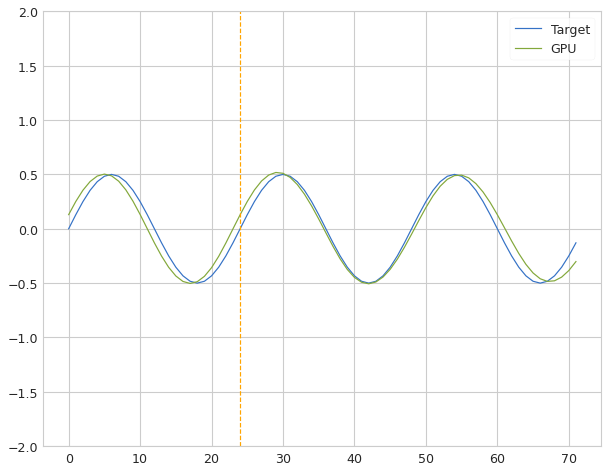

 Iter=30 a=0.979 sr=0.619 amp=0.086  ri=0.840 rr=0.572 loss=0.072755


Iter: 30 #### Diagnostic 0.073   Time 1.86  Best 0.073 NRMSE 0.073 CD 0.020
Iter: 31 #### Diagnostic 0.093   Time 0.78  Best 0.073 NRMSE 0.093 CD 0.034
Iter: 32 #### Diagnostic 0.092   Time 0.72  Best 0.073 NRMSE 0.092 CD 0.034
Iter: 33 #### Diagnostic 0.093   Time 0.47  Best 0.073 NRMSE 0.093 CD 0.034
Iter: 34 #### Diagnostic 0.101   Time 0.45  Best 0.073 NRMSE 0.101 CD 0.041
Iter: 35 #### Diagnostic 0.093   Time 0.66  Best 0.073 NRMSE 0.093 CD 0.035
Iter: 36 #### Diagnostic 0.092   Time 0.42  Best 0.073 NRMSE 0.092 CD 0.034
Iter: 37 #### Diagnostic 0.092   Time 0.59  Best 0.073 NRMSE 0.092 CD 0.033
Iter: 38 #### Diagnostic 0.092   Time 0.93  Best 0.073 NRMSE 0.092 CD 0.034
Iter: 39 #### Diagnostic 0.092   Time 0.65  Best 0.073 NRMSE 0.092 CD 0.034
Iter: 40 #### Diagnostic 0.092   Time 0.49  Best 0.073 NRMSE 0.092 CD 0.034
Iter: 41 #### Diagnostic 0.088   Time 0.46  Best 0.073 NRMSE 0.088 CD 0.030
Iter: 42 #### Dia

Iter: 26 #### Diagnostic 0.093   Time 0.57  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 27 #### Diagnostic 0.092   Time 0.63  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 28 #### Diagnostic 0.092   Time 0.57  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 29 #### Diagnostic 0.389   Time 0.46  Best 1000.000 NRMSE 0.389 CD 0.961
Iter: 30 #### Diagnostic 0.158   Time 0.82  Best 1000.000 NRMSE 0.158 CD 0.001
Iter: 31 #### Diagnostic 0.093   Time 0.75  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 32 #### Diagnostic 6.324   Time 0.85  Best 1000.000 NRMSE 6.324 CD 1.060
Iter: 33 #### Diagnostic 0.083   Time 1.01  Best 1000.000 NRMSE 0.083 CD 0.027
Iter: 34 #### Diagnostic 0.093   Time 1.00  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 35 #### Diagnostic 0.092   Time 0.86  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 36 #### Diagnostic 0.092   Time 0.98  Best 1000.000 NRMSE 0.092 CD 0.033
Iter: 37 #### Diagnostic 0.090   Time 0.61  Best 1000.000 NRMSE 0.090 CD 0.032
Iter: 38 #### Diagnostic 0.092   Time 0.70  Best 100

Iter: 28 #### Diagnostic 0.100   Time 0.92  Best 1000.000 NRMSE 0.100 CD 0.041
Iter: 29 #### Diagnostic 0.094   Time 0.83  Best 1000.000 NRMSE 0.094 CD 0.036
Iter: 30 #### Diagnostic 0.092   Time 0.84  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 31 #### Diagnostic 0.091   Time 0.63  Best 1000.000 NRMSE 0.091 CD 0.033
Iter: 32 #### Diagnostic 29.244   Time 0.85  Best 1000.000 NRMSE 29.244 CD 0.906
Iter: 33 #### Diagnostic 0.092   Time 0.81  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 34 #### Diagnostic 0.092   Time 0.71  Best 1000.000 NRMSE 0.092 CD 0.034


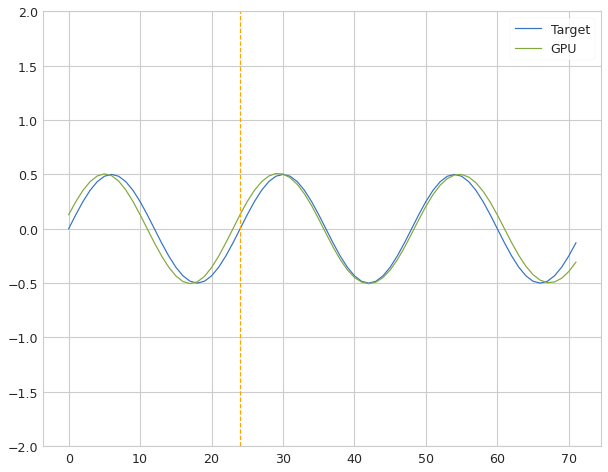

 Iter=35 a=0.982 sr=0.862 amp=0.092  ri=0.394 rr=3.226 loss=0.071070


Iter: 35 #### Diagnostic 0.071   Time 1.31  Best 0.071 NRMSE 0.071 CD 0.019
Iter: 36 #### Diagnostic 0.093   Time 0.77  Best 0.071 NRMSE 0.093 CD 0.035
Iter: 37 #### Diagnostic 0.088   Time 0.70  Best 0.071 NRMSE 0.088 CD 0.031
Iter: 38 #### Diagnostic 0.092   Time 0.73  Best 0.071 NRMSE 0.092 CD 0.034
Iter: 39 #### Diagnostic 0.092   Time 0.75  Best 0.071 NRMSE 0.092 CD 0.034
Iter: 40 #### Diagnostic 0.101   Time 0.70  Best 0.071 NRMSE 0.101 CD 0.041
Iter: 41 #### Diagnostic 0.092   Time 0.97  Best 0.071 NRMSE 0.092 CD 0.034
Iter: 42 #### Diagnostic 0.098   Time 1.03  Best 0.071 NRMSE 0.098 CD 0.039
Iter: 43 #### Diagnostic 0.094   Time 0.82  Best 0.071 NRMSE 0.094 CD 0.035


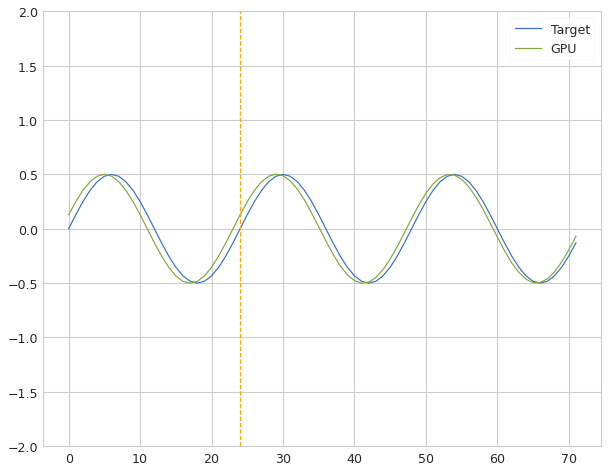

 Iter=44 a=0.773 sr=0.924 amp=0.028  ri=0.246 rr=1.622 loss=0.068923


Iter: 44 #### Diagnostic 0.069   Time 1.42  Best 0.069 NRMSE 0.069 CD 0.019
Iter: 45 #### Diagnostic 0.096   Time 0.69  Best 0.069 NRMSE 0.096 CD 0.037
Iter: 46 #### Diagnostic 0.092   Time 0.78  Best 0.069 NRMSE 0.092 CD 0.034
Iter: 47 #### Diagnostic 0.129   Time 0.76  Best 0.069 NRMSE 0.129 CD 0.035
Iter: 48 #### Diagnostic 0.095   Time 0.77  Best 0.069 NRMSE 0.095 CD 0.036
Iter: 49 #### Diagnostic 0.370   Time 0.82  Best 0.069 NRMSE 0.370 CD 1.162
Iter: 50 #### Diagnostic 0.092   Time 0.54  Best 0.069 NRMSE 0.092 CD 0.034
Iter: 51 #### Diagnostic 0.093   Time 0.58  Best 0.069 NRMSE 0.093 CD 0.035
Iter: 52 #### Diagnostic 0.092   Time 0.47  Best 0.069 NRMSE 0.092 CD 0.034
Iter: 53 #### Diagnostic 0.088   Time 0.34  Best 0.069 NRMSE 0.088 CD 0.031
Iter: 54 #### Diagnostic 0.092   Time 0.58  Best 0.069 NRMSE 0.092 CD 0.034
Iter: 55 #### Diagnostic 0.089   Time 0.74  Best 0.069 NRMSE 0.089 CD 0.032
Iter: 56 #### Dia

Iter: 47 #### Diagnostic 0.092   Time 0.53  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 48 #### Diagnostic 0.295   Time 0.61  Best 1000.000 NRMSE 0.295 CD 0.061
Iter: 49 #### Diagnostic 0.093   Time 0.55  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 50 #### Diagnostic 0.096   Time 0.39  Best 1000.000 NRMSE 0.096 CD 0.026
Iter: 51 #### Diagnostic 0.093   Time 0.39  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 52 #### Diagnostic 0.094   Time 0.23  Best 1000.000 NRMSE 0.094 CD 0.034
Iter: 53 #### Diagnostic 0.090   Time 0.42  Best 1000.000 NRMSE 0.090 CD 0.032


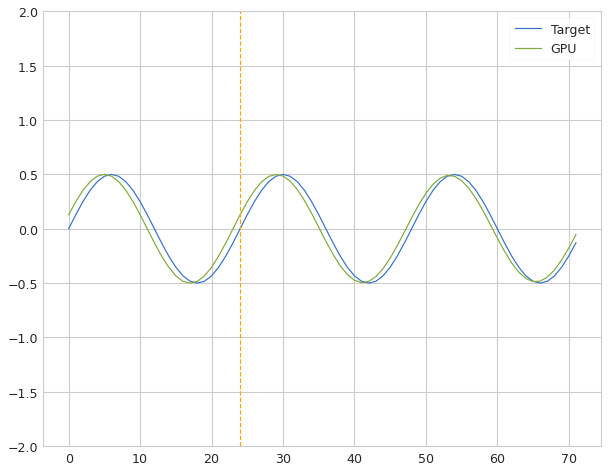

 Iter=54 a=0.823 sr=0.029 amp=0.188  ri=0.675 rr=4.542 loss=0.073198


Iter: 54 #### Diagnostic 0.073   Time 1.47  Best 0.073 NRMSE 0.073 CD 0.022
Iter: 55 #### Diagnostic 0.093   Time 0.50  Best 0.073 NRMSE 0.093 CD 0.034
Iter: 56 #### Diagnostic 0.094   Time 0.79  Best 0.073 NRMSE 0.094 CD 0.035
Iter: 57 #### Diagnostic 2.824   Time 0.55  Best 0.073 NRMSE 2.824 CD 0.101
Iter: 58 #### Diagnostic 0.093   Time 0.81  Best 0.073 NRMSE 0.093 CD 0.035
Iter: 59 #### Diagnostic 0.094   Time 0.93  Best 0.073 NRMSE 0.094 CD 0.035
Iter: 60 #### Diagnostic 0.094   Time 0.90  Best 0.073 NRMSE 0.094 CD 0.035
Iter: 61 #### Diagnostic 0.092   Time 1.20  Best 0.073 NRMSE 0.092 CD 0.034
Iter: 62 #### Diagnostic 0.092   Time 0.99  Best 0.073 NRMSE 0.092 CD 0.034
Iter: 63 #### Diagnostic 0.093   Time 0.71  Best 0.073 NRMSE 0.093 CD 0.034
Iter: 64 #### Diagnostic 0.210   Time 0.58  Best 0.073 NRMSE 0.210 CD 0.053
Iter: 65 #### Diagnostic 0.094   Time 0.70  Best 0.073 NRMSE 0.094 CD 0.035
Iter: 66 #### Dia

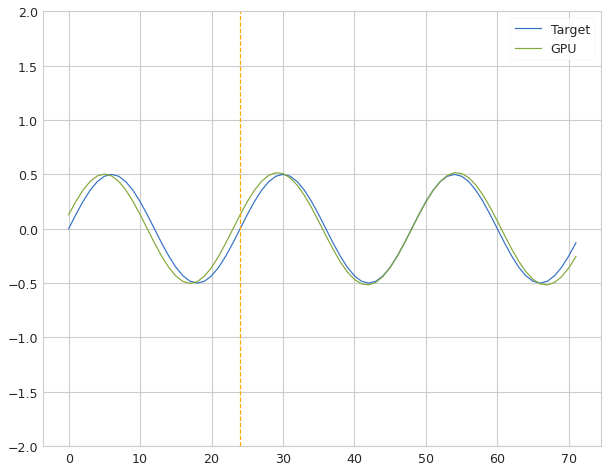

 Iter=85 a=0.889 sr=0.187 amp=0.095  ri=0.949 rr=1.347 loss=0.055911


Iter: 85 #### Diagnostic 0.056   Time 1.15  Best 0.056 NRMSE 0.056 CD 0.010
Iter: 86 #### Diagnostic 0.092   Time 0.56  Best 0.056 NRMSE 0.092 CD 0.034
Iter: 87 #### Diagnostic 0.092   Time 0.52  Best 0.056 NRMSE 0.092 CD 0.034
Iter: 88 #### Diagnostic 0.071   Time 0.66  Best 0.056 NRMSE 0.071 CD 0.020
Iter: 89 #### Diagnostic 0.093   Time 0.37  Best 0.056 NRMSE 0.093 CD 0.035
Iter: 90 #### Diagnostic 0.091   Time 0.62  Best 0.056 NRMSE 0.091 CD 0.034
Iter: 91 #### Diagnostic 0.091   Time 0.51  Best 0.056 NRMSE 0.091 CD 0.034
Iter: 92 #### Diagnostic 0.092   Time 0.48  Best 0.056 NRMSE 0.092 CD 0.034
Iter: 93 #### Diagnostic 0.092   Time 0.83  Best 0.056 NRMSE 0.092 CD 0.034
Iter: 94 #### Diagnostic 0.092   Time 0.68  Best 0.056 NRMSE 0.092 CD 0.034
Iter: 95 #### Diagnostic 0.093   Time 0.67  Best 0.056 NRMSE 0.093 CD 0.034
Iter: 96 #### Diagnostic 0.092   Time 0.55  Best 0.056 NRMSE 0.092 CD 0.034
Iter: 97 #### Dia

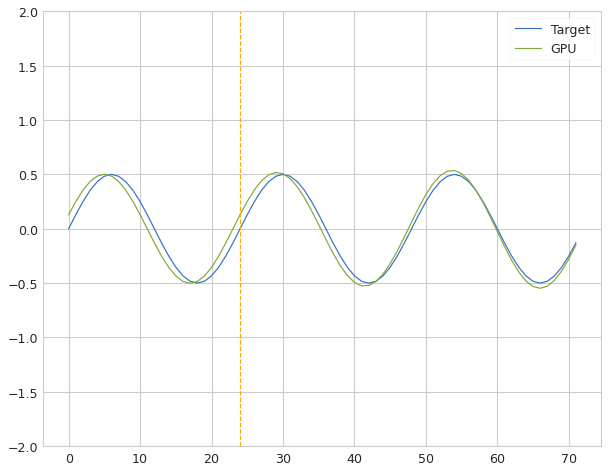

 Iter=37 a=0.953 sr=0.070 amp=0.298  ri=0.653 rr=4.602 loss=0.058824


Iter: 37 #### Diagnostic 0.059   Time 1.70  Best 0.059 NRMSE 0.059 CD 0.010
Iter: 38 #### Diagnostic 2.313   Time 0.75  Best 0.059 NRMSE 2.313 CD 0.079
Iter: 39 #### Diagnostic 0.092   Time 0.50  Best 0.059 NRMSE 0.092 CD 0.034
Iter: 40 #### Diagnostic 0.092   Time 0.66  Best 0.059 NRMSE 0.092 CD 0.034
Iter: 41 #### Diagnostic 0.098   Time 0.78  Best 0.059 NRMSE 0.098 CD 0.038
Iter: 42 #### Diagnostic 0.093   Time 0.59  Best 0.059 NRMSE 0.093 CD 0.035
Iter: 43 #### Diagnostic 0.093   Time 0.40  Best 0.059 NRMSE 0.093 CD 0.034
Iter: 44 #### Diagnostic 0.092   Time 0.30  Best 0.059 NRMSE 0.092 CD 0.033
Iter: 45 #### Diagnostic 0.189   Time 0.42  Best 0.059 NRMSE 0.189 CD 0.071
Iter: 46 #### Diagnostic 0.092   Time 0.51  Best 0.059 NRMSE 0.092 CD 0.034
Iter: 47 #### Diagnostic 0.094   Time 0.37  Best 0.059 NRMSE 0.094 CD 0.036
Iter: 48 #### Diagnostic 0.092   Time 0.49  Best 0.059 NRMSE 0.092 CD 0.034
Iter: 49 #### Dia

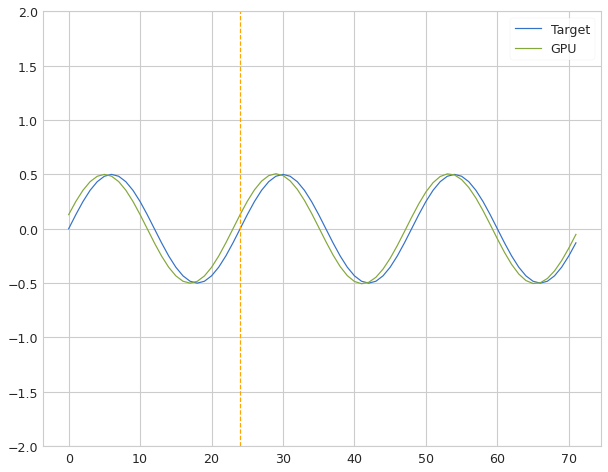

 Iter=23 a=0.917 sr=0.451 amp=0.216  ri=0.727 rr=0.181 loss=0.076176


Iter: 23 #### Diagnostic 0.076   Time 1.08  Best 0.076 NRMSE 0.076 CD 0.023
Iter: 24 #### Diagnostic 0.095   Time 0.64  Best 0.076 NRMSE 0.095 CD 0.036
Iter: 25 #### Diagnostic 0.092   Time 0.65  Best 0.076 NRMSE 0.092 CD 0.034
Iter: 26 #### Diagnostic 0.093   Time 0.54  Best 0.076 NRMSE 0.093 CD 0.035
Iter: 27 #### Diagnostic 0.101   Time 0.57  Best 0.076 NRMSE 0.101 CD 0.041
Iter: 28 #### Diagnostic 0.093   Time 0.56  Best 0.076 NRMSE 0.093 CD 0.034
Iter: 29 #### Diagnostic 0.093   Time 0.41  Best 0.076 NRMSE 0.093 CD 0.034


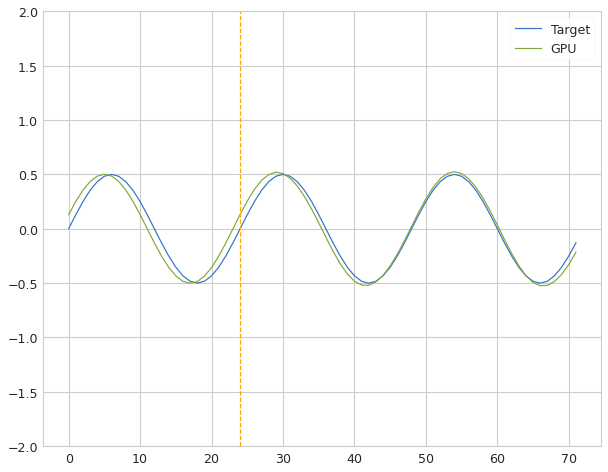

 Iter=30 a=0.979 sr=0.619 amp=0.086  ri=0.840 rr=0.572 loss=0.053083


Iter: 30 #### Diagnostic 0.053   Time 0.96  Best 0.053 NRMSE 0.053 CD 0.009
Iter: 31 #### Diagnostic 0.093   Time 0.51  Best 0.053 NRMSE 0.093 CD 0.034
Iter: 32 #### Diagnostic 0.092   Time 0.52  Best 0.053 NRMSE 0.092 CD 0.034
Iter: 33 #### Diagnostic 0.092   Time 0.33  Best 0.053 NRMSE 0.092 CD 0.034
Iter: 34 #### Diagnostic 0.089   Time 0.33  Best 0.053 NRMSE 0.089 CD 0.031
Iter: 35 #### Diagnostic 0.093   Time 0.39  Best 0.053 NRMSE 0.093 CD 0.034
Iter: 36 #### Diagnostic 0.092   Time 0.39  Best 0.053 NRMSE 0.092 CD 0.034
Iter: 37 #### Diagnostic 0.093   Time 0.53  Best 0.053 NRMSE 0.093 CD 0.035
Iter: 38 #### Diagnostic 0.092   Time 0.46  Best 0.053 NRMSE 0.092 CD 0.034
Iter: 39 #### Diagnostic 0.092   Time 0.44  Best 0.053 NRMSE 0.092 CD 0.034
Iter: 40 #### Diagnostic 0.093   Time 0.41  Best 0.053 NRMSE 0.093 CD 0.034
Iter: 41 #### Diagnostic 0.088   Time 0.50  Best 0.053 NRMSE 0.088 CD 0.031
Iter: 42 #### Dia

Iter: 26 #### Diagnostic 0.092   Time 0.64  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 27 #### Diagnostic 0.092   Time 0.31  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 28 #### Diagnostic 0.092   Time 0.53  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 29 #### Diagnostic 0.371   Time 0.65  Best 1000.000 NRMSE 0.371 CD 1.067
Iter: 30 #### Diagnostic 0.116   Time 0.67  Best 1000.000 NRMSE 0.116 CD 0.012
Iter: 31 #### Diagnostic 0.093   Time 0.41  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 32 #### Diagnostic 0.366   Time 0.56  Best 1000.000 NRMSE 0.366 CD 1.090
Iter: 33 #### Diagnostic 0.094   Time 0.24  Best 1000.000 NRMSE 0.094 CD 0.035
Iter: 34 #### Diagnostic 0.093   Time 0.39  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 35 #### Diagnostic 0.092   Time 0.44  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 36 #### Diagnostic 0.090   Time 0.31  Best 1000.000 NRMSE 0.090 CD 0.032
Iter: 37 #### Diagnostic 0.095   Time 0.30  Best 1000.000 NRMSE 0.095 CD 0.037
Iter: 38 #### Diagnostic 0.092   Time 0.68  Best 100

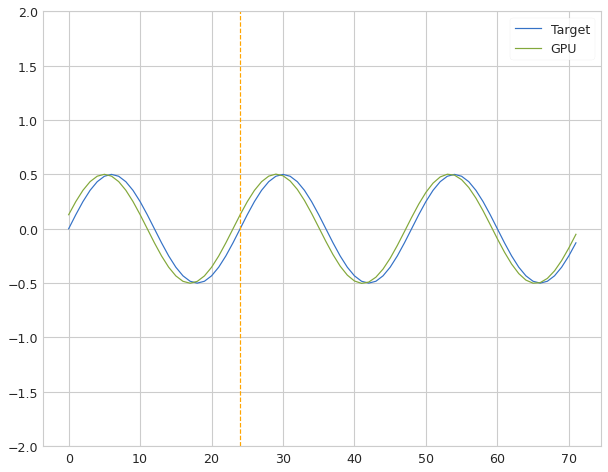

 Iter=12 a=0.615 sr=0.512 amp=0.193  ri=0.022 rr=4.454 loss=0.074883


Iter: 12 #### Diagnostic 0.075   Time 1.14  Best 0.075 NRMSE 0.075 CD 0.022
Iter: 13 #### Diagnostic 0.093   Time 0.61  Best 0.075 NRMSE 0.093 CD 0.034
Iter: 14 #### Diagnostic 0.092   Time 0.82  Best 0.075 NRMSE 0.092 CD 0.034
Iter: 15 #### Diagnostic 0.092   Time 0.56  Best 0.075 NRMSE 0.092 CD 0.034
Iter: 16 #### Diagnostic 0.093   Time 0.53  Best 0.075 NRMSE 0.093 CD 0.034
Iter: 17 #### Diagnostic 0.092   Time 0.60  Best 0.075 NRMSE 0.092 CD 0.034
Iter: 18 #### Diagnostic 0.092   Time 0.50  Best 0.075 NRMSE 0.092 CD 0.034
Iter: 19 #### Diagnostic 0.273   Time 0.22  Best 0.075 NRMSE 0.273 CD 0.081
Iter: 20 #### Diagnostic 0.092   Time 0.44  Best 0.075 NRMSE 0.092 CD 0.034
Iter: 21 #### Diagnostic 0.096   Time 0.51  Best 0.075 NRMSE 0.096 CD 0.037
Iter: 22 #### Diagnostic 0.095   Time 0.41  Best 0.075 NRMSE 0.095 CD 0.036
Iter: 23 #### Diagnostic 0.093   Time 0.79  Best 0.075 NRMSE 0.093 CD 0.034
Iter: 24 #### Dia

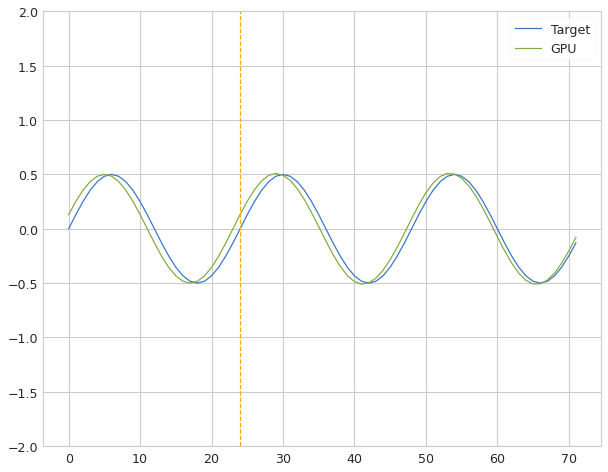

 Iter=15 a=0.926 sr=0.334 amp=0.177  ri=0.990 rr=3.464 loss=0.068920


Iter: 15 #### Diagnostic 0.069   Time 1.17  Best 0.069 NRMSE 0.069 CD 0.018
Iter: 16 #### Diagnostic 0.096   Time 0.79  Best 0.069 NRMSE 0.096 CD 0.037
Iter: 17 #### Diagnostic 0.092   Time 0.65  Best 0.069 NRMSE 0.092 CD 0.034
Iter: 18 #### Diagnostic 0.092   Time 0.62  Best 0.069 NRMSE 0.092 CD 0.034
Iter: 19 #### Diagnostic 0.092   Time 0.45  Best 0.069 NRMSE 0.092 CD 0.034
Iter: 20 #### Diagnostic 0.093   Time 0.52  Best 0.069 NRMSE 0.093 CD 0.034
Iter: 21 #### Diagnostic 0.092   Time 0.50  Best 0.069 NRMSE 0.092 CD 0.034
Iter: 22 #### Diagnostic 0.093   Time 0.57  Best 0.069 NRMSE 0.093 CD 0.034
Iter: 23 #### Diagnostic 0.092   Time 0.61  Best 0.069 NRMSE 0.092 CD 0.034
Iter: 24 #### Diagnostic 0.093   Time 0.59  Best 0.069 NRMSE 0.093 CD 0.035
Iter: 25 #### Diagnostic 0.094   Time 0.45  Best 0.069 NRMSE 0.094 CD 0.035
Iter: 26 #### Diagnostic 0.095   Time 0.30  Best 0.069 NRMSE 0.095 CD 0.036
Iter: 27 #### Dia

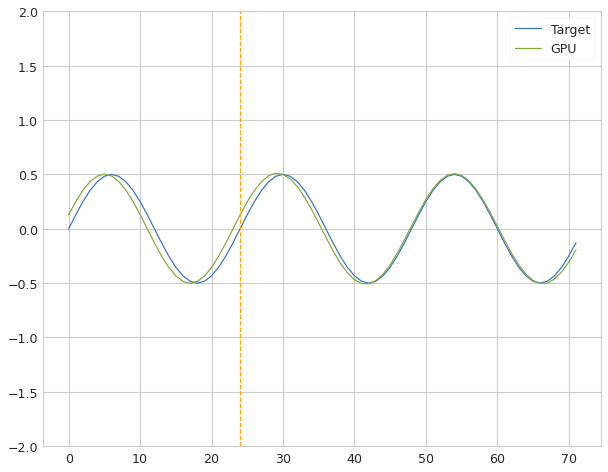

 Iter=85 a=0.889 sr=0.187 amp=0.095  ri=0.949 rr=1.347 loss=0.047360


Iter: 85 #### Diagnostic 0.047   Time 1.44  Best 0.047 NRMSE 0.047 CD 0.008
Iter: 86 #### Diagnostic 0.092   Time 0.60  Best 0.047 NRMSE 0.092 CD 0.034
Iter: 87 #### Diagnostic 0.092   Time 0.75  Best 0.047 NRMSE 0.092 CD 0.034
Iter: 88 #### Diagnostic 0.113   Time 0.62  Best 0.047 NRMSE 0.113 CD 0.051
Iter: 89 #### Diagnostic 0.093   Time 0.64  Best 0.047 NRMSE 0.093 CD 0.035
Iter: 90 #### Diagnostic 0.093   Time 0.71  Best 0.047 NRMSE 0.093 CD 0.034
Iter: 91 #### Diagnostic 0.093   Time 0.52  Best 0.047 NRMSE 0.093 CD 0.034
Iter: 92 #### Diagnostic 0.092   Time 0.46  Best 0.047 NRMSE 0.092 CD 0.034
Iter: 93 #### Diagnostic 0.092   Time 0.53  Best 0.047 NRMSE 0.092 CD 0.034
Iter: 94 #### Diagnostic 0.092   Time 0.40  Best 0.047 NRMSE 0.092 CD 0.034
Iter: 95 #### Diagnostic 0.092   Time 0.46  Best 0.047 NRMSE 0.092 CD 0.034
Iter: 96 #### Diagnostic 0.093   Time 0.39  Best 0.047 NRMSE 0.093 CD 0.035
Iter: 97 #### Dia

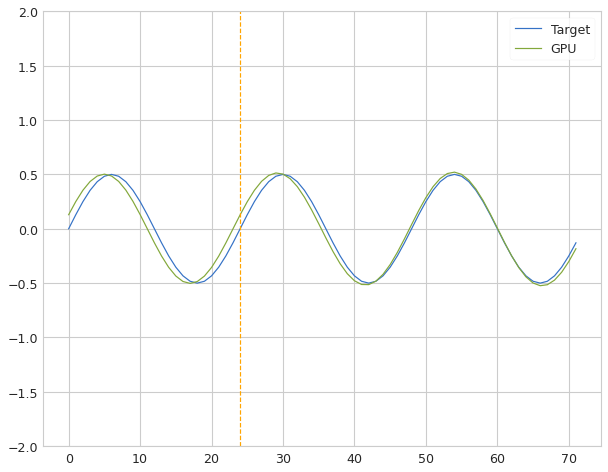

 Iter=67 a=0.901 sr=1.168 amp=0.195  ri=0.016 rr=2.257 loss=0.050042


Iter: 67 #### Diagnostic 0.050   Time 0.76  Best 0.050 NRMSE 0.050 CD 0.008
Iter: 68 #### Diagnostic 0.105   Time 0.21  Best 0.050 NRMSE 0.105 CD 0.029
Iter: 69 #### Diagnostic 0.094   Time 0.24  Best 0.050 NRMSE 0.094 CD 0.035
Iter: 70 #### Diagnostic 0.088   Time 0.59  Best 0.050 NRMSE 0.088 CD 0.031
Iter: 71 #### Diagnostic 0.093   Time 0.38  Best 0.050 NRMSE 0.093 CD 0.034
Iter: 72 #### Diagnostic 0.092   Time 0.59  Best 0.050 NRMSE 0.092 CD 0.034
Iter: 73 #### Diagnostic 0.209   Time 0.68  Best 0.050 NRMSE 0.209 CD 0.008
Iter: 74 #### Diagnostic 0.092   Time 0.53  Best 0.050 NRMSE 0.092 CD 0.034
Iter: 75 #### Diagnostic 0.093   Time 0.55  Best 0.050 NRMSE 0.093 CD 0.035
Iter: 76 #### Diagnostic 0.093   Time 0.58  Best 0.050 NRMSE 0.093 CD 0.034
Iter: 77 #### Diagnostic 0.092   Time 0.48  Best 0.050 NRMSE 0.092 CD 0.034
Iter: 78 #### Diagnostic 0.093   Time 0.69  Best 0.050 NRMSE 0.093 CD 0.034
Iter: 79 #### Dia

Iter: 69 #### Diagnostic 0.093   Time 0.29  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 70 #### Diagnostic 0.096   Time 0.50  Best 1000.000 NRMSE 0.096 CD 0.036
Iter: 71 #### Diagnostic 0.092   Time 0.27  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 72 #### Diagnostic 0.093   Time 0.21  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 73 #### Diagnostic 0.093   Time 0.22  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 74 #### Diagnostic 0.092   Time 0.24  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 75 #### Diagnostic 0.270   Time 0.40  Best 1000.000 NRMSE 0.270 CD 0.303
Iter: 76 #### Diagnostic 0.093   Time 0.28  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 77 #### Diagnostic 0.092   Time 0.40  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 78 #### Diagnostic 0.093   Time 0.35  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 79 #### Diagnostic 0.094   Time 0.51  Best 1000.000 NRMSE 0.094 CD 0.035
Iter: 80 #### Diagnostic 0.093   Time 0.48  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 81 #### Diagnostic 0.092   Time 0.53  Best 100

Iter: 64 #### Diagnostic 0.092   Time 0.57  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 65 #### Diagnostic 0.093   Time 0.62  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 66 #### Diagnostic 0.093   Time 0.50  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 67 #### Diagnostic 0.094   Time 0.46  Best 1000.000 NRMSE 0.094 CD 0.035
Iter: 68 #### Diagnostic 0.092   Time 0.54  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 69 #### Diagnostic 0.092   Time 0.47  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 70 #### Diagnostic 0.093   Time 0.33  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 71 #### Diagnostic 0.093   Time 0.31  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 72 #### Diagnostic 0.092   Time 0.40  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 73 #### Diagnostic 0.093   Time 0.62  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 74 #### Diagnostic 0.093   Time 0.74  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 75 #### Diagnostic 0.092   Time 0.50  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 76 #### Diagnostic 0.093   Time 0.66  Best 100

Iter: 66 #### Diagnostic 0.093   Time 0.25  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 67 #### Diagnostic 0.093   Time 0.22  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 68 #### Diagnostic 0.092   Time 0.26  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 69 #### Diagnostic 0.092   Time 0.20  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 70 #### Diagnostic 0.092   Time 0.25  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 71 #### Diagnostic 0.092   Time 0.36  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 72 #### Diagnostic 0.095   Time 0.66  Best 1000.000 NRMSE 0.095 CD 0.036
Iter: 73 #### Diagnostic 0.089   Time 0.44  Best 1000.000 NRMSE 0.089 CD 0.027
Iter: 74 #### Diagnostic 0.094   Time 0.57  Best 1000.000 NRMSE 0.094 CD 0.035
Iter: 75 #### Diagnostic 0.093   Time 0.57  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 76 #### Diagnostic 0.090   Time 0.39  Best 1000.000 NRMSE 0.090 CD 0.033
Iter: 77 #### Diagnostic 0.092   Time 0.43  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 78 #### Diagnostic 0.092   Time 0.43  Best 100

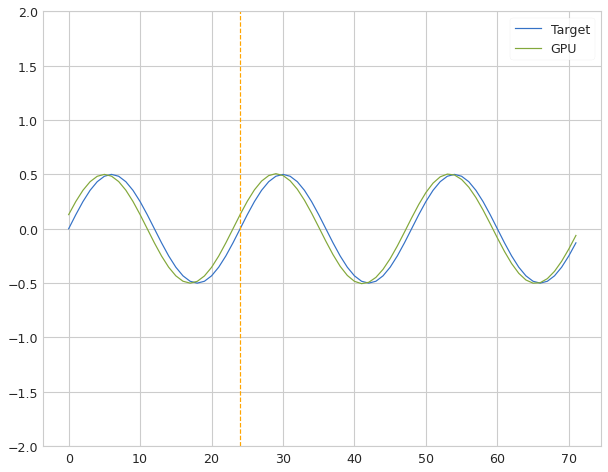

 Iter=15 a=0.926 sr=0.334 amp=0.177  ri=0.990 rr=3.464 loss=0.073045


Iter: 15 #### Diagnostic 0.073   Time 1.55  Best 0.073 NRMSE 0.073 CD 0.021
Iter: 16 #### Diagnostic 0.096   Time 0.48  Best 0.073 NRMSE 0.096 CD 0.037
Iter: 17 #### Diagnostic 0.092   Time 0.33  Best 0.073 NRMSE 0.092 CD 0.034
Iter: 18 #### Diagnostic 0.092   Time 0.55  Best 0.073 NRMSE 0.092 CD 0.034
Iter: 19 #### Diagnostic 0.091   Time 0.60  Best 0.073 NRMSE 0.091 CD 0.033
Iter: 20 #### Diagnostic 0.093   Time 0.56  Best 0.073 NRMSE 0.093 CD 0.034
Iter: 21 #### Diagnostic 0.092   Time 0.21  Best 0.073 NRMSE 0.092 CD 0.034
Iter: 22 #### Diagnostic 0.093   Time 0.28  Best 0.073 NRMSE 0.093 CD 0.034
Iter: 23 #### Diagnostic 0.092   Time 0.49  Best 0.073 NRMSE 0.092 CD 0.034
Iter: 24 #### Diagnostic 0.093   Time 0.25  Best 0.073 NRMSE 0.093 CD 0.034
Iter: 25 #### Diagnostic 0.093   Time 0.21  Best 0.073 NRMSE 0.093 CD 0.034
Iter: 26 #### Diagnostic 0.095   Time 0.19  Best 0.073 NRMSE 0.095 CD 0.036
Iter: 27 #### Dia

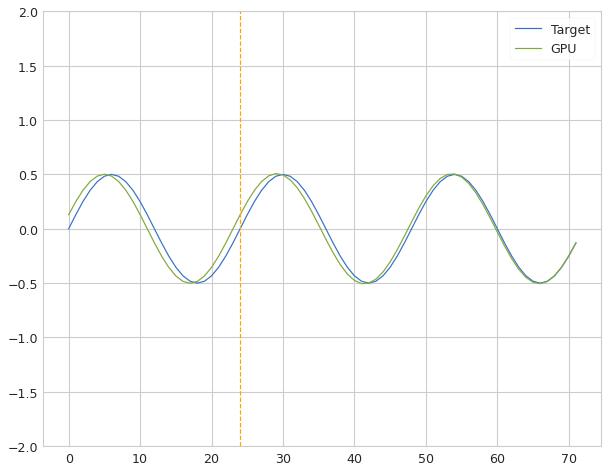

 Iter=85 a=0.889 sr=0.187 amp=0.095  ri=0.949 rr=1.347 loss=0.053728


Iter: 85 #### Diagnostic 0.054   Time 1.08  Best 0.054 NRMSE 0.054 CD 0.011
Iter: 86 #### Diagnostic 0.092   Time 0.50  Best 0.054 NRMSE 0.092 CD 0.034
Iter: 87 #### Diagnostic 0.092   Time 0.60  Best 0.054 NRMSE 0.092 CD 0.034
Iter: 88 #### Diagnostic 0.101   Time 0.50  Best 0.054 NRMSE 0.101 CD 0.040
Iter: 89 #### Diagnostic 0.093   Time 0.57  Best 0.054 NRMSE 0.093 CD 0.035
Iter: 90 #### Diagnostic 0.092   Time 0.66  Best 0.054 NRMSE 0.092 CD 0.034
Iter: 91 #### Diagnostic 0.092   Time 0.48  Best 0.054 NRMSE 0.092 CD 0.034
Iter: 92 #### Diagnostic 0.092   Time 0.45  Best 0.054 NRMSE 0.092 CD 0.034
Iter: 93 #### Diagnostic 0.093   Time 0.42  Best 0.054 NRMSE 0.093 CD 0.034
Iter: 94 #### Diagnostic 0.093   Time 0.50  Best 0.054 NRMSE 0.093 CD 0.034
Iter: 95 #### Diagnostic 0.092   Time 0.40  Best 0.054 NRMSE 0.092 CD 0.034
Iter: 96 #### Diagnostic 0.092   Time 0.42  Best 0.054 NRMSE 0.092 CD 0.034
Iter: 97 #### Dia

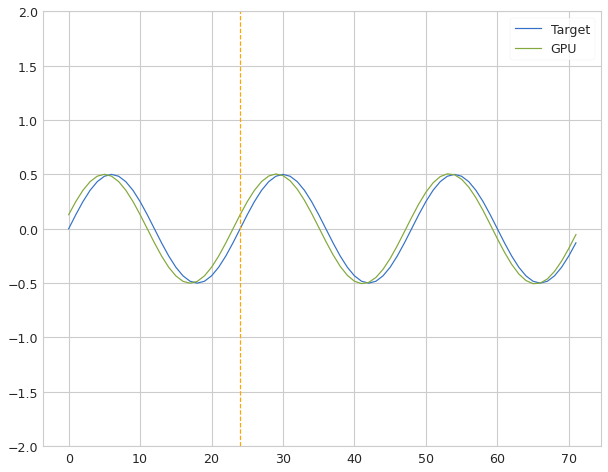

 Iter=70 a=0.917 sr=0.566 amp=0.484  ri=0.025 rr=3.723 loss=0.074592


Iter: 70 #### Diagnostic 0.075   Time 1.18  Best 0.075 NRMSE 0.075 CD 0.022
Iter: 71 #### Diagnostic 0.093   Time 0.35  Best 0.075 NRMSE 0.093 CD 0.035
Iter: 72 #### Diagnostic 0.094   Time 0.39  Best 0.075 NRMSE 0.094 CD 0.035
Iter: 73 #### Diagnostic 0.161   Time 0.52  Best 0.075 NRMSE 0.161 CD 0.044
Iter: 74 #### Diagnostic 0.095   Time 0.53  Best 0.075 NRMSE 0.095 CD 0.036
Iter: 75 #### Diagnostic 0.095   Time 0.88  Best 0.075 NRMSE 0.095 CD 0.036
Iter: 76 #### Diagnostic 0.093   Time 0.57  Best 0.075 NRMSE 0.093 CD 0.034
Iter: 77 #### Diagnostic 0.092   Time 0.58  Best 0.075 NRMSE 0.092 CD 0.034
Iter: 78 #### Diagnostic 0.093   Time 0.76  Best 0.075 NRMSE 0.093 CD 0.034
Iter: 79 #### Diagnostic 0.093   Time 0.59  Best 0.075 NRMSE 0.093 CD 0.035
Iter: 80 #### Diagnostic 0.090   Time 0.71  Best 0.075 NRMSE 0.090 CD 0.032
Iter: 81 #### Diagnostic 0.093   Time 0.60  Best 0.075 NRMSE 0.093 CD 0.035
Iter: 82 #### Dia

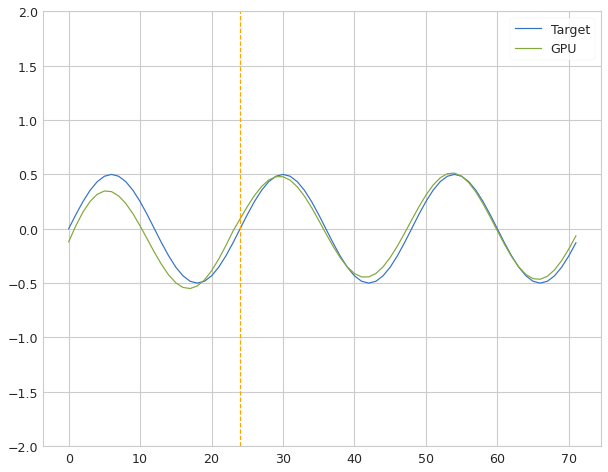

 Iter=43 a=0.904 sr=1.199 amp=0.984  ri=0.570 rr=3.478 loss=0.048816


Iter: 43 #### Diagnostic 0.049   Time 1.32  Best 0.049 NRMSE 0.049 CD 0.009
Iter: 44 #### Diagnostic 0.092   Time 0.48  Best 0.049 NRMSE 0.092 CD 0.034
Iter: 45 #### Diagnostic 0.092   Time 0.56  Best 0.049 NRMSE 0.092 CD 0.034
Iter: 46 #### Diagnostic 1.919   Time 0.56  Best 0.049 NRMSE 1.919 CD 0.026
Iter: 47 #### Diagnostic 0.096   Time 0.47  Best 0.049 NRMSE 0.096 CD 0.037
Iter: 48 #### Diagnostic 0.093   Time 0.37  Best 0.049 NRMSE 0.093 CD 0.034
Iter: 49 #### Diagnostic 0.092   Time 0.49  Best 0.049 NRMSE 0.092 CD 0.034
Iter: 50 #### Diagnostic 0.092   Time 0.35  Best 0.049 NRMSE 0.092 CD 0.034
Iter: 51 #### Diagnostic 14.912   Time 0.16  Best 0.049 NRMSE 14.912 CD 0.037
Iter: 52 #### Diagnostic 11.467   Time 0.15  Best 0.049 NRMSE 11.467 CD 1.037
Iter: 53 #### Diagnostic 0.093   Time 0.13  Best 0.049 NRMSE 0.093 CD 0.034
Iter: 54 #### Diagnostic 0.093   Time 0.14  Best 0.049 NRMSE 0.093 CD 0.034
Iter: 55 ####

Iter: 40 #### Diagnostic 0.093   Time 0.20  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 41 #### Diagnostic 0.093   Time 0.29  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 42 #### Diagnostic 0.099   Time 0.21  Best 1000.000 NRMSE 0.099 CD 0.040
Iter: 43 #### Diagnostic 0.092   Time 0.34  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 44 #### Diagnostic 0.093   Time 0.22  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 45 #### Diagnostic 0.092   Time 0.21  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 46 #### Diagnostic 0.092   Time 0.42  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 47 #### Diagnostic 0.093   Time 0.40  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 48 #### Diagnostic 0.093   Time 0.51  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 49 #### Diagnostic 0.093   Time 0.40  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 50 #### Diagnostic 0.093   Time 0.39  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 51 #### Diagnostic 0.092   Time 0.59  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 52 #### Diagnostic 0.093   Time 0.51  Best 100

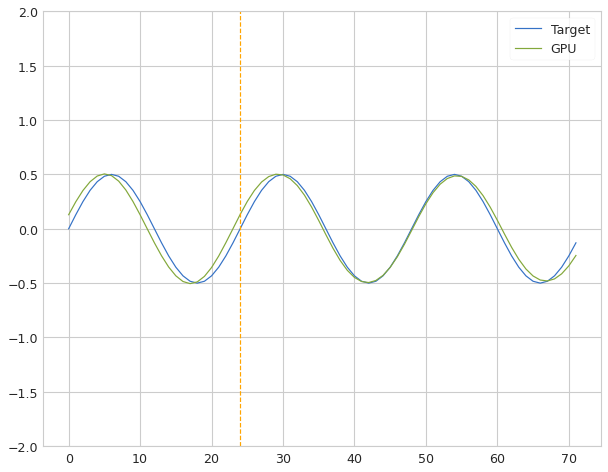

 Iter=35 a=0.982 sr=0.862 amp=0.092  ri=0.394 rr=3.226 loss=0.053708


Iter: 35 #### Diagnostic 0.054   Time 1.15  Best 0.054 NRMSE 0.054 CD 0.011
Iter: 36 #### Diagnostic 0.093   Time 0.80  Best 0.054 NRMSE 0.093 CD 0.035
Iter: 37 #### Diagnostic 0.093   Time 0.44  Best 0.054 NRMSE 0.093 CD 0.034
Iter: 38 #### Diagnostic 0.092   Time 0.59  Best 0.054 NRMSE 0.092 CD 0.034
Iter: 39 #### Diagnostic 0.093   Time 0.62  Best 0.054 NRMSE 0.093 CD 0.034
Iter: 40 #### Diagnostic 0.098   Time 0.51  Best 0.054 NRMSE 0.098 CD 0.039
Iter: 41 #### Diagnostic 0.093   Time 0.69  Best 0.054 NRMSE 0.093 CD 0.034
Iter: 42 #### Diagnostic 0.084   Time 0.50  Best 0.054 NRMSE 0.084 CD 0.028
Iter: 43 #### Diagnostic 0.094   Time 0.49  Best 0.054 NRMSE 0.094 CD 0.035
Iter: 44 #### Diagnostic 0.081   Time 0.48  Best 0.054 NRMSE 0.081 CD 0.026
Iter: 45 #### Diagnostic 0.096   Time 0.47  Best 0.054 NRMSE 0.096 CD 0.037
Iter: 46 #### Diagnostic 0.092   Time 0.31  Best 0.054 NRMSE 0.092 CD 0.034
Iter: 47 #### Dia

Iter: 39 #### Diagnostic 0.096   Time 0.43  Best 1000.000 NRMSE 0.096 CD 0.036
Iter: 40 #### Diagnostic 0.092   Time 0.47  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 41 #### Diagnostic 0.093   Time 0.31  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 42 #### Diagnostic 0.093   Time 0.50  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 43 #### Diagnostic 0.372   Time 0.41  Best 1000.000 NRMSE 0.372 CD 1.120
Iter: 44 #### Diagnostic 0.092   Time 0.62  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 45 #### Diagnostic 0.108   Time 0.49  Best 1000.000 NRMSE 0.108 CD 0.047
Iter: 46 #### Diagnostic 0.094   Time 0.50  Best 1000.000 NRMSE 0.094 CD 0.035
Iter: 47 #### Diagnostic 0.092   Time 0.45  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 48 #### Diagnostic 0.311   Time 0.58  Best 1000.000 NRMSE 0.311 CD 0.062
Iter: 49 #### Diagnostic 0.093   Time 0.49  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 50 #### Diagnostic 0.092   Time 0.46  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 51 #### Diagnostic 0.093   Time 0.39  Best 100

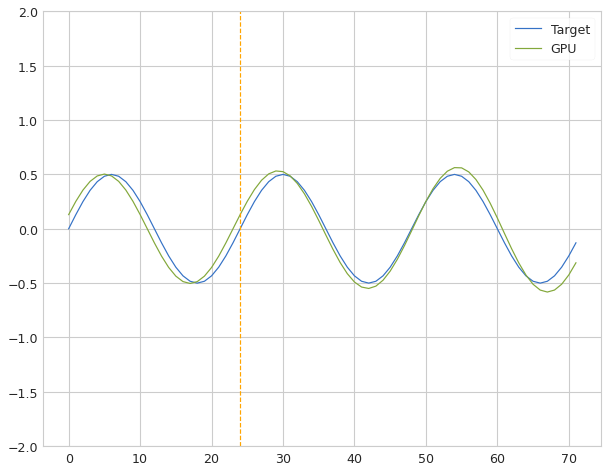

 Iter=37 a=0.953 sr=0.070 amp=0.298  ri=0.653 rr=4.602 loss=0.078263


Iter: 37 #### Diagnostic 0.078   Time 1.17  Best 0.078 NRMSE 0.078 CD 0.013
Iter: 38 #### Diagnostic 2.415   Time 0.72  Best 0.078 NRMSE 2.415 CD 0.086
Iter: 39 #### Diagnostic 0.093   Time 0.57  Best 0.078 NRMSE 0.093 CD 0.034
Iter: 40 #### Diagnostic 0.092   Time 0.62  Best 0.078 NRMSE 0.092 CD 0.034
Iter: 41 #### Diagnostic 0.087   Time 0.50  Best 0.078 NRMSE 0.087 CD 0.030
Iter: 42 #### Diagnostic 0.093   Time 0.36  Best 0.078 NRMSE 0.093 CD 0.035
Iter: 43 #### Diagnostic 0.093   Time 0.50  Best 0.078 NRMSE 0.093 CD 0.034
Iter: 44 #### Diagnostic 0.093   Time 0.65  Best 0.078 NRMSE 0.093 CD 0.034
Iter: 45 #### Diagnostic 0.092   Time 0.59  Best 0.078 NRMSE 0.092 CD 0.032
Iter: 46 #### Diagnostic 0.092   Time 0.51  Best 0.078 NRMSE 0.092 CD 0.034
Iter: 47 #### Diagnostic 0.092   Time 0.53  Best 0.078 NRMSE 0.092 CD 0.034
Iter: 48 #### Diagnostic 0.092   Time 0.57  Best 0.078 NRMSE 0.092 CD 0.034
Iter: 49 #### Dia

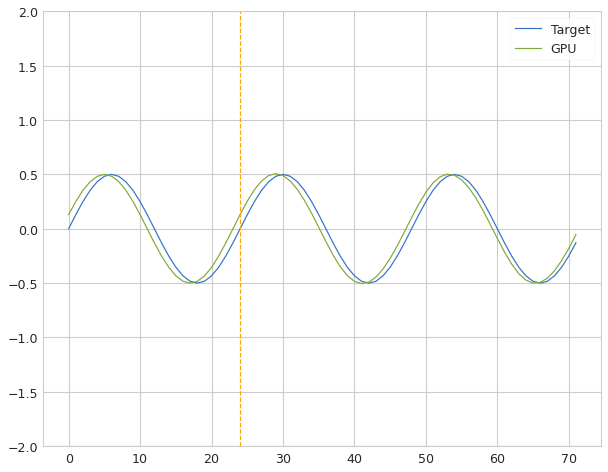

 Iter=30 a=0.979 sr=0.619 amp=0.086  ri=0.840 rr=0.572 loss=0.075547


Iter: 30 #### Diagnostic 0.076   Time 0.76  Best 0.076 NRMSE 0.076 CD 0.022
Iter: 31 #### Diagnostic 0.093   Time 0.44  Best 0.076 NRMSE 0.093 CD 0.034
Iter: 32 #### Diagnostic 0.092   Time 0.27  Best 0.076 NRMSE 0.092 CD 0.034
Iter: 33 #### Diagnostic 0.092   Time 0.23  Best 0.076 NRMSE 0.092 CD 0.034
Iter: 34 #### Diagnostic 0.090   Time 0.29  Best 0.076 NRMSE 0.090 CD 0.032
Iter: 35 #### Diagnostic 0.093   Time 0.39  Best 0.076 NRMSE 0.093 CD 0.034
Iter: 36 #### Diagnostic 0.092   Time 0.48  Best 0.076 NRMSE 0.092 CD 0.034
Iter: 37 #### Diagnostic 0.093   Time 0.71  Best 0.076 NRMSE 0.093 CD 0.034
Iter: 38 #### Diagnostic 0.092   Time 0.87  Best 0.076 NRMSE 0.092 CD 0.034
Iter: 39 #### Diagnostic 0.092   Time 0.84  Best 0.076 NRMSE 0.092 CD 0.034
Iter: 40 #### Diagnostic 0.093   Time 0.63  Best 0.076 NRMSE 0.093 CD 0.034
Iter: 41 #### Diagnostic 0.087   Time 0.67  Best 0.076 NRMSE 0.087 CD 0.030
Iter: 42 #### Dia

Iter: 26 #### Diagnostic 0.092   Time 0.33  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 27 #### Diagnostic 0.092   Time 0.35  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 28 #### Diagnostic 0.092   Time 0.36  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 29 #### Diagnostic 0.398   Time 0.12  Best 1000.000 NRMSE 0.398 CD 1.285
Iter: 30 #### Diagnostic 0.125   Time 0.16  Best 1000.000 NRMSE 0.125 CD 0.009
Iter: 31 #### Diagnostic 0.095   Time 0.15  Best 1000.000 NRMSE 0.095 CD 0.036
Iter: 32 #### Diagnostic 23.399   Time 0.15  Best 1000.000 NRMSE 23.399 CD 0.960
Iter: 33 #### Diagnostic 0.088   Time 0.44  Best 1000.000 NRMSE 0.088 CD 0.031
Iter: 34 #### Diagnostic 0.093   Time 0.29  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 35 #### Diagnostic 0.092   Time 0.29  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 36 #### Diagnostic 0.092   Time 0.40  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 37 #### Diagnostic 0.096   Time 0.35  Best 1000.000 NRMSE 0.096 CD 0.037
Iter: 38 #### Diagnostic 0.092   Time 0.42  Best 1

Iter: 28 #### Diagnostic 0.101   Time 0.38  Best 1000.000 NRMSE 0.101 CD 0.041
Iter: 29 #### Diagnostic 0.092   Time 0.27  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 30 #### Diagnostic 0.092   Time 0.24  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 31 #### Diagnostic 0.092   Time 0.37  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 32 #### Diagnostic 3.921   Time 0.40  Best 1000.000 NRMSE 3.921 CD 1.273
Iter: 33 #### Diagnostic 0.093   Time 0.44  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 34 #### Diagnostic 0.092   Time 0.30  Best 1000.000 NRMSE 0.092 CD 0.034


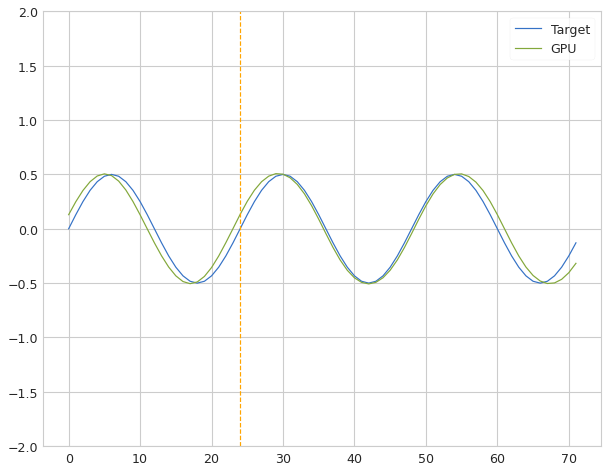

 Iter=35 a=0.982 sr=0.862 amp=0.092  ri=0.394 rr=3.226 loss=0.072756


Iter: 35 #### Diagnostic 0.073   Time 0.94  Best 0.073 NRMSE 0.073 CD 0.019
Iter: 36 #### Diagnostic 0.093   Time 0.40  Best 0.073 NRMSE 0.093 CD 0.035
Iter: 37 #### Diagnostic 0.094   Time 0.35  Best 0.073 NRMSE 0.094 CD 0.035
Iter: 38 #### Diagnostic 0.092   Time 0.41  Best 0.073 NRMSE 0.092 CD 0.034
Iter: 39 #### Diagnostic 0.092   Time 0.44  Best 0.073 NRMSE 0.092 CD 0.034
Iter: 40 #### Diagnostic 0.086   Time 0.39  Best 0.073 NRMSE 0.086 CD 0.030
Iter: 41 #### Diagnostic 0.093   Time 0.39  Best 0.073 NRMSE 0.093 CD 0.034
Iter: 42 #### Diagnostic 0.099   Time 0.17  Best 0.073 NRMSE 0.099 CD 0.040
Iter: 43 #### Diagnostic 0.094   Time 0.35  Best 0.073 NRMSE 0.094 CD 0.035
Iter: 44 #### Diagnostic 0.223   Time 0.34  Best 0.073 NRMSE 0.223 CD 0.154
Iter: 45 #### Diagnostic 0.095   Time 0.43  Best 0.073 NRMSE 0.095 CD 0.036
Iter: 46 #### Diagnostic 0.092   Time 0.55  Best 0.073 NRMSE 0.092 CD 0.034
Iter: 47 #### Dia

Iter: 39 #### Diagnostic 0.093   Time 0.18  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 40 #### Diagnostic 0.092   Time 0.20  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 41 #### Diagnostic 0.092   Time 0.18  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 42 #### Diagnostic 0.093   Time 0.32  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 43 #### Diagnostic 5.501   Time 0.19  Best 1000.000 NRMSE 5.501 CD 0.998
Iter: 44 #### Diagnostic 0.092   Time 0.33  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 45 #### Diagnostic 0.092   Time 0.21  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 46 #### Diagnostic 0.093   Time 0.58  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 47 #### Diagnostic 0.092   Time 0.38  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 48 #### Diagnostic 0.293   Time 0.28  Best 1000.000 NRMSE 0.293 CD 0.283
Iter: 49 #### Diagnostic 0.093   Time 0.33  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 50 #### Diagnostic 0.096   Time 0.42  Best 1000.000 NRMSE 0.096 CD 0.027
Iter: 51 #### Diagnostic 0.093   Time 0.40  Best 100

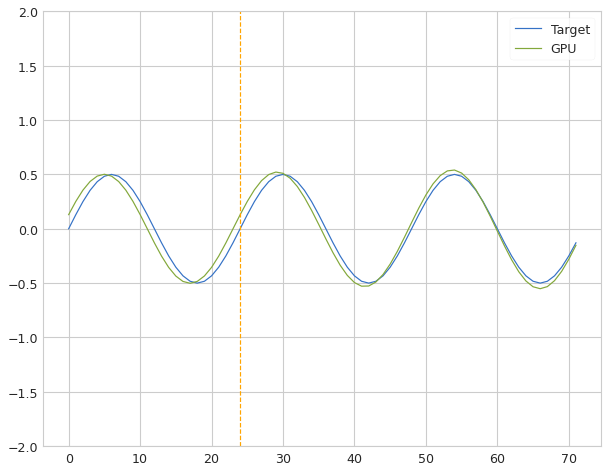

 Iter=37 a=0.953 sr=0.070 amp=0.298  ri=0.653 rr=4.602 loss=0.058063


Iter: 37 #### Diagnostic 0.058   Time 1.04  Best 0.058 NRMSE 0.058 CD 0.009
Iter: 38 #### Diagnostic 0.439   Time 0.36  Best 0.058 NRMSE 0.439 CD 1.397
Iter: 39 #### Diagnostic 0.093   Time 0.40  Best 0.058 NRMSE 0.093 CD 0.035
Iter: 40 #### Diagnostic 0.093   Time 0.34  Best 0.058 NRMSE 0.093 CD 0.034
Iter: 41 #### Diagnostic 0.090   Time 0.22  Best 0.058 NRMSE 0.090 CD 0.032
Iter: 42 #### Diagnostic 0.093   Time 0.24  Best 0.058 NRMSE 0.093 CD 0.035
Iter: 43 #### Diagnostic 0.092   Time 0.09  Best 0.058 NRMSE 0.092 CD 0.034
Iter: 44 #### Diagnostic 0.090   Time 0.10  Best 0.058 NRMSE 0.090 CD 0.033
Iter: 45 #### Diagnostic 0.092   Time 0.09  Best 0.058 NRMSE 0.092 CD 0.033
Iter: 46 #### Diagnostic 0.092   Time 0.11  Best 0.058 NRMSE 0.092 CD 0.034
Iter: 47 #### Diagnostic 0.094   Time 0.15  Best 0.058 NRMSE 0.094 CD 0.035
Iter: 48 #### Diagnostic 0.092   Time 0.40  Best 0.058 NRMSE 0.092 CD 0.034
Iter: 49 #### Dia

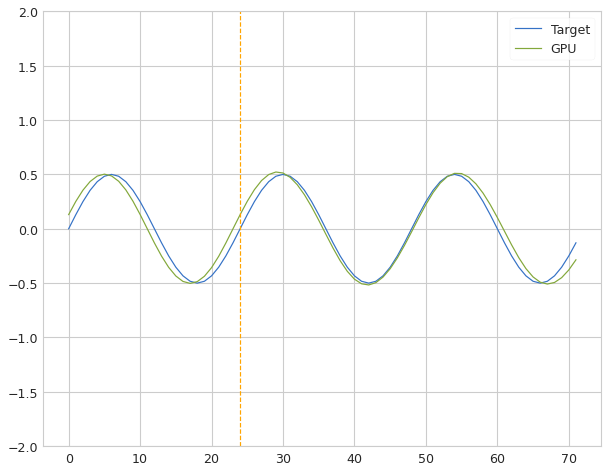

 Iter=30 a=0.979 sr=0.619 amp=0.086  ri=0.840 rr=0.572 loss=0.064822


Iter: 30 #### Diagnostic 0.065   Time 0.70  Best 0.065 NRMSE 0.065 CD 0.015
Iter: 31 #### Diagnostic 0.093   Time 0.40  Best 0.065 NRMSE 0.093 CD 0.034
Iter: 32 #### Diagnostic 0.092   Time 0.45  Best 0.065 NRMSE 0.092 CD 0.034
Iter: 33 #### Diagnostic 0.093   Time 0.45  Best 0.065 NRMSE 0.093 CD 0.034
Iter: 34 #### Diagnostic 0.107   Time 0.37  Best 0.065 NRMSE 0.107 CD 0.046
Iter: 35 #### Diagnostic 0.093   Time 0.51  Best 0.065 NRMSE 0.093 CD 0.035
Iter: 36 #### Diagnostic 0.092   Time 0.44  Best 0.065 NRMSE 0.092 CD 0.034
Iter: 37 #### Diagnostic 0.093   Time 0.45  Best 0.065 NRMSE 0.093 CD 0.034
Iter: 38 #### Diagnostic 0.092   Time 0.47  Best 0.065 NRMSE 0.092 CD 0.034
Iter: 39 #### Diagnostic 0.092   Time 0.50  Best 0.065 NRMSE 0.092 CD 0.034
Iter: 40 #### Diagnostic 0.092   Time 0.35  Best 0.065 NRMSE 0.092 CD 0.034
Iter: 41 #### Diagnostic 0.097   Time 0.34  Best 0.065 NRMSE 0.097 CD 0.037
Iter: 42 #### Dia

Iter: 27 #### Diagnostic 0.092   Time 0.31  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 28 #### Diagnostic 0.092   Time 0.15  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 29 #### Diagnostic 0.394   Time 0.21  Best 1000.000 NRMSE 0.394 CD 1.298
Iter: 30 #### Diagnostic 0.110   Time 0.11  Best 1000.000 NRMSE 0.110 CD 0.014
Iter: 31 #### Diagnostic 0.093   Time 0.09  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 32 #### Diagnostic 37.570   Time 0.08  Best 1000.000 NRMSE 37.570 CD 0.984
Iter: 33 #### Diagnostic 0.089   Time 0.10  Best 1000.000 NRMSE 0.089 CD 0.032
Iter: 34 #### Diagnostic 0.093   Time 0.28  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 35 #### Diagnostic 0.092   Time 0.10  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 36 #### Diagnostic 0.103   Time 0.09  Best 1000.000 NRMSE 0.103 CD 0.043
Iter: 37 #### Diagnostic 0.095   Time 0.09  Best 1000.000 NRMSE 0.095 CD 0.036
Iter: 38 #### Diagnostic 0.093   Time 0.10  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 39 #### Diagnostic 0.091   Time 0.10  Best 1

Iter: 31 #### Diagnostic 0.089   Time 0.24  Best 1000.000 NRMSE 0.089 CD 0.032
Iter: 32 #### Diagnostic 0.536   Time 0.29  Best 1000.000 NRMSE 0.536 CD 1.800
Iter: 33 #### Diagnostic 0.092   Time 0.33  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 34 #### Diagnostic 0.092   Time 0.18  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 35 #### Diagnostic 0.105   Time 0.17  Best 1000.000 NRMSE 0.105 CD 0.040
Iter: 36 #### Diagnostic 0.093   Time 0.19  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 37 #### Diagnostic 0.095   Time 0.21  Best 1000.000 NRMSE 0.095 CD 0.036
Iter: 38 #### Diagnostic 0.093   Time 0.29  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 39 #### Diagnostic 0.092   Time 0.18  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 40 #### Diagnostic 0.087   Time 0.28  Best 1000.000 NRMSE 0.087 CD 0.030
Iter: 41 #### Diagnostic 0.093   Time 0.26  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 42 #### Diagnostic 0.094   Time 0.17  Best 1000.000 NRMSE 0.094 CD 0.035
Iter: 43 #### Diagnostic 0.094   Time 0.43  Best 100

Iter: 33 #### Diagnostic 0.092   Time 0.53  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 34 #### Diagnostic 0.093   Time 0.38  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 35 #### Diagnostic 0.093   Time 0.41  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 36 #### Diagnostic 0.090   Time 0.23  Best 1000.000 NRMSE 0.090 CD 0.031
Iter: 37 #### Diagnostic 0.093   Time 0.20  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 38 #### Diagnostic 0.092   Time 0.35  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 39 #### Diagnostic 0.100   Time 0.26  Best 1000.000 NRMSE 0.100 CD 0.040
Iter: 40 #### Diagnostic 0.092   Time 0.27  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 41 #### Diagnostic 0.092   Time 0.25  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 42 #### Diagnostic 0.092   Time 0.31  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 43 #### Diagnostic 0.983   Time 0.30  Best 1000.000 NRMSE 0.983 CD 0.947
Iter: 44 #### Diagnostic 0.093   Time 0.21  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 45 #### Diagnostic 0.088   Time 0.40  Best 100

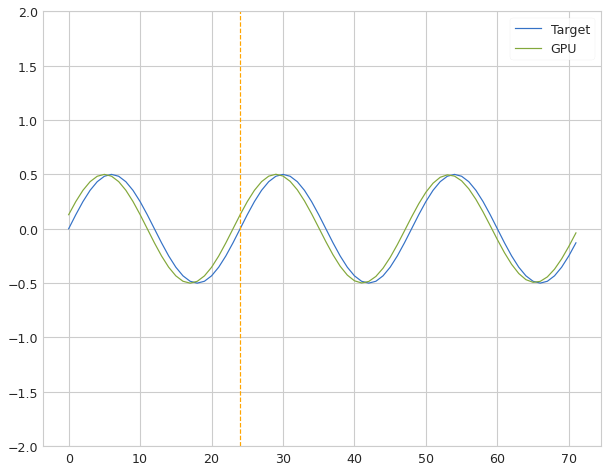

 Iter=81 a=0.958 sr=0.662 amp=0.714  ri=0.761 rr=1.584 loss=0.079109


Iter: 81 #### Diagnostic 0.079   Time 0.73  Best 0.079 NRMSE 0.079 CD 0.025
Iter: 82 #### Diagnostic 0.328   Time 0.31  Best 0.079 NRMSE 0.328 CD 0.069
Iter: 83 #### Diagnostic 0.092   Time 0.51  Best 0.079 NRMSE 0.092 CD 0.034
Iter: 84 #### Diagnostic 0.093   Time 0.32  Best 0.079 NRMSE 0.093 CD 0.034
Iter: 85 #### Diagnostic 0.140   Time 0.36  Best 0.079 NRMSE 0.140 CD 0.080
Iter: 86 #### Diagnostic 0.092   Time 0.36  Best 0.079 NRMSE 0.092 CD 0.034
Iter: 87 #### Diagnostic 0.092   Time 0.23  Best 0.079 NRMSE 0.092 CD 0.034


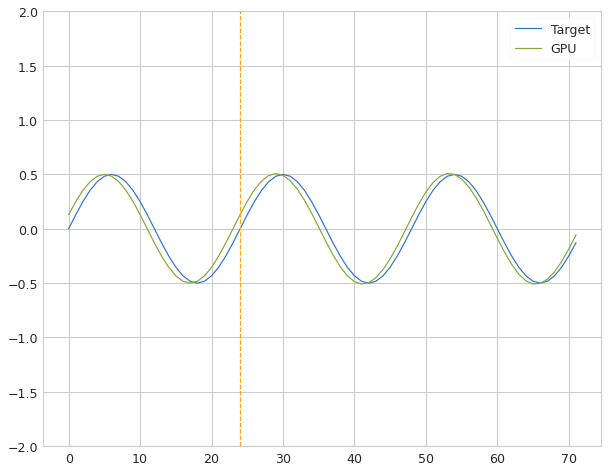

 Iter=88 a=0.954 sr=0.858 amp=0.171  ri=0.662 rr=2.894 loss=0.074655


Iter: 88 #### Diagnostic 0.075   Time 1.15  Best 0.075 NRMSE 0.075 CD 0.022
Iter: 89 #### Diagnostic 0.093   Time 0.38  Best 0.075 NRMSE 0.093 CD 0.035
Iter: 90 #### Diagnostic 0.092   Time 0.46  Best 0.075 NRMSE 0.092 CD 0.034
Iter: 91 #### Diagnostic 0.092   Time 0.42  Best 0.075 NRMSE 0.092 CD 0.034
Iter: 92 #### Diagnostic 0.092   Time 0.48  Best 0.075 NRMSE 0.092 CD 0.034
Iter: 93 #### Diagnostic 0.092   Time 0.34  Best 0.075 NRMSE 0.092 CD 0.034
Iter: 94 #### Diagnostic 0.092   Time 0.36  Best 0.075 NRMSE 0.092 CD 0.034
Iter: 95 #### Diagnostic 0.093   Time 0.32  Best 0.075 NRMSE 0.093 CD 0.035
Iter: 96 #### Diagnostic 0.092   Time 0.44  Best 0.075 NRMSE 0.092 CD 0.034
Iter: 97 #### Diagnostic 0.092   Time 0.51  Best 0.075 NRMSE 0.092 CD 0.034
Iter: 98 #### Diagnostic 0.094   Time 0.14  Best 0.075 NRMSE 0.094 CD 0.035
Iter: 99 #### Diagnostic 0.092   Time 0.13  Best 0.075 NRMSE 0.092 CD 0.034

Best result = 0.

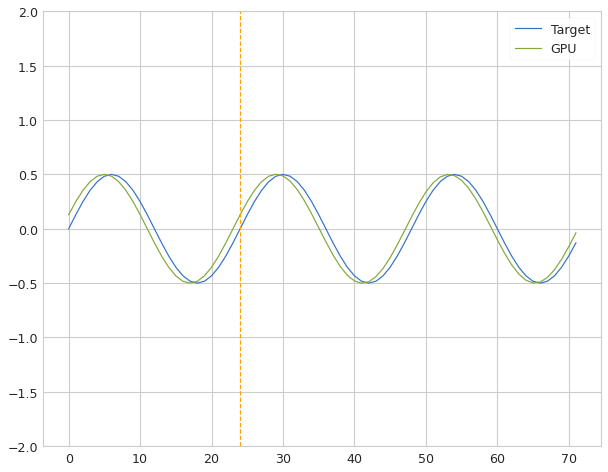

 Iter=70 a=0.917 sr=0.566 amp=0.484  ri=0.025 rr=3.723 loss=0.079240


Iter: 70 #### Diagnostic 0.079   Time 1.01  Best 0.079 NRMSE 0.079 CD 0.025
Iter: 71 #### Diagnostic 0.092   Time 0.27  Best 0.079 NRMSE 0.092 CD 0.034
Iter: 72 #### Diagnostic 0.095   Time 0.33  Best 0.079 NRMSE 0.095 CD 0.036
Iter: 73 #### Diagnostic 0.200   Time 0.32  Best 0.079 NRMSE 0.200 CD 0.042
Iter: 74 #### Diagnostic 0.094   Time 0.38  Best 0.079 NRMSE 0.094 CD 0.035
Iter: 75 #### Diagnostic 0.090   Time 0.51  Best 0.079 NRMSE 0.090 CD 0.032
Iter: 76 #### Diagnostic 0.092   Time 0.36  Best 0.079 NRMSE 0.092 CD 0.034
Iter: 77 #### Diagnostic 0.092   Time 0.61  Best 0.079 NRMSE 0.092 CD 0.034
Iter: 78 #### Diagnostic 0.093   Time 0.30  Best 0.079 NRMSE 0.093 CD 0.034
Iter: 79 #### Diagnostic 0.093   Time 0.16  Best 0.079 NRMSE 0.093 CD 0.035
Iter: 80 #### Diagnostic 0.087   Time 0.16  Best 0.079 NRMSE 0.087 CD 0.030
Iter: 81 #### Diagnostic 0.093   Time 0.11  Best 0.079 NRMSE 0.093 CD 0.034
Iter: 82 #### Dia

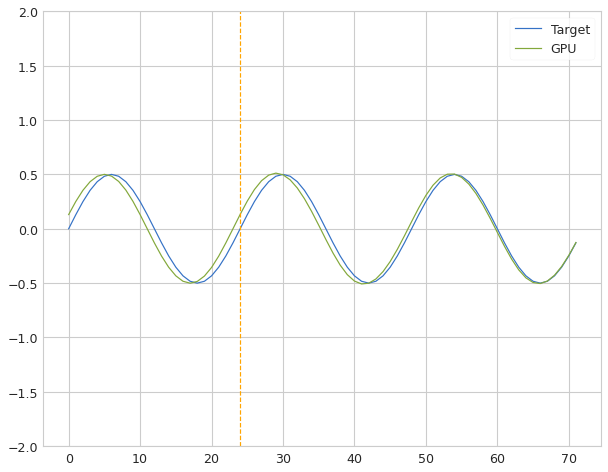

 Iter=30 a=0.979 sr=0.619 amp=0.086  ri=0.840 rr=0.572 loss=0.056695


Iter: 30 #### Diagnostic 0.057   Time 1.08  Best 0.057 NRMSE 0.057 CD 0.012
Iter: 31 #### Diagnostic 0.093   Time 0.35  Best 0.057 NRMSE 0.093 CD 0.034
Iter: 32 #### Diagnostic 0.092   Time 0.34  Best 0.057 NRMSE 0.092 CD 0.034
Iter: 33 #### Diagnostic 0.092   Time 0.27  Best 0.057 NRMSE 0.092 CD 0.034
Iter: 34 #### Diagnostic 0.087   Time 0.23  Best 0.057 NRMSE 0.087 CD 0.030
Iter: 35 #### Diagnostic 0.093   Time 0.29  Best 0.057 NRMSE 0.093 CD 0.034
Iter: 36 #### Diagnostic 0.092   Time 0.21  Best 0.057 NRMSE 0.092 CD 0.034
Iter: 37 #### Diagnostic 0.092   Time 0.32  Best 0.057 NRMSE 0.092 CD 0.034
Iter: 38 #### Diagnostic 0.092   Time 0.25  Best 0.057 NRMSE 0.092 CD 0.034
Iter: 39 #### Diagnostic 0.092   Time 0.27  Best 0.057 NRMSE 0.092 CD 0.034
Iter: 40 #### Diagnostic 0.093   Time 0.29  Best 0.057 NRMSE 0.093 CD 0.034
Iter: 41 #### Diagnostic 0.096   Time 0.18  Best 0.057 NRMSE 0.096 CD 0.037
Iter: 42 #### Dia

Iter: 26 #### Diagnostic 0.093   Time 0.44  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 27 #### Diagnostic 0.092   Time 0.38  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 28 #### Diagnostic 0.092   Time 0.37  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 29 #### Diagnostic 0.372   Time 0.42  Best 1000.000 NRMSE 0.372 CD 1.300
Iter: 30 #### Diagnostic 0.350   Time 0.30  Best 1000.000 NRMSE 0.350 CD 0.059
Iter: 31 #### Diagnostic 0.092   Time 0.35  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 32 #### Diagnostic 12.271   Time 0.23  Best 1000.000 NRMSE 12.271 CD 1.055
Iter: 33 #### Diagnostic 0.083   Time 0.41  Best 1000.000 NRMSE 0.083 CD 0.027
Iter: 34 #### Diagnostic 0.093   Time 0.32  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 35 #### Diagnostic 0.092   Time 0.32  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 36 #### Diagnostic 0.088   Time 0.33  Best 1000.000 NRMSE 0.088 CD 0.031
Iter: 37 #### Diagnostic 0.092   Time 0.41  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 38 #### Diagnostic 0.092   Time 0.40  Best 1

Iter: 28 #### Diagnostic 0.101   Time 0.29  Best 1000.000 NRMSE 0.101 CD 0.042
Iter: 29 #### Diagnostic 0.094   Time 0.33  Best 1000.000 NRMSE 0.094 CD 0.035
Iter: 30 #### Diagnostic 0.093   Time 0.29  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 31 #### Diagnostic 0.095   Time 0.28  Best 1000.000 NRMSE 0.095 CD 0.036
Iter: 32 #### Diagnostic 7.359   Time 0.37  Best 1000.000 NRMSE 7.359 CD 1.047
Iter: 33 #### Diagnostic 0.092   Time 0.31  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 34 #### Diagnostic 0.092   Time 0.30  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 35 #### Diagnostic 0.140   Time 0.31  Best 1000.000 NRMSE 0.140 CD 0.072
Iter: 36 #### Diagnostic 0.093   Time 0.27  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 37 #### Diagnostic 0.091   Time 0.30  Best 1000.000 NRMSE 0.091 CD 0.033
Iter: 38 #### Diagnostic 0.093   Time 0.17  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 39 #### Diagnostic 0.093   Time 0.39  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 40 #### Diagnostic 0.099   Time 0.24  Best 100

Iter: 30 #### Diagnostic 0.093   Time 0.45  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 31 #### Diagnostic 0.092   Time 0.24  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 32 #### Diagnostic 0.092   Time 0.31  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 33 #### Diagnostic 0.092   Time 0.28  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 34 #### Diagnostic 0.093   Time 0.27  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 35 #### Diagnostic 0.093   Time 0.18  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 36 #### Diagnostic 0.089   Time 0.18  Best 1000.000 NRMSE 0.089 CD 0.030
Iter: 37 #### Diagnostic 0.094   Time 0.19  Best 1000.000 NRMSE 0.094 CD 0.035
Iter: 38 #### Diagnostic 0.092   Time 0.28  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 39 #### Diagnostic 0.093   Time 0.20  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 40 #### Diagnostic 0.092   Time 0.13  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 41 #### Diagnostic 0.093   Time 0.12  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 42 #### Diagnostic 0.093   Time 0.11  Best 100

Iter: 32 #### Diagnostic 0.092   Time 0.25  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 33 #### Diagnostic 0.092   Time 0.24  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 34 #### Diagnostic 0.146   Time 0.30  Best 1000.000 NRMSE 0.146 CD 0.040
Iter: 35 #### Diagnostic 0.092   Time 0.23  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 36 #### Diagnostic 1.295   Time 0.24  Best 1000.000 NRMSE 1.295 CD 1.804


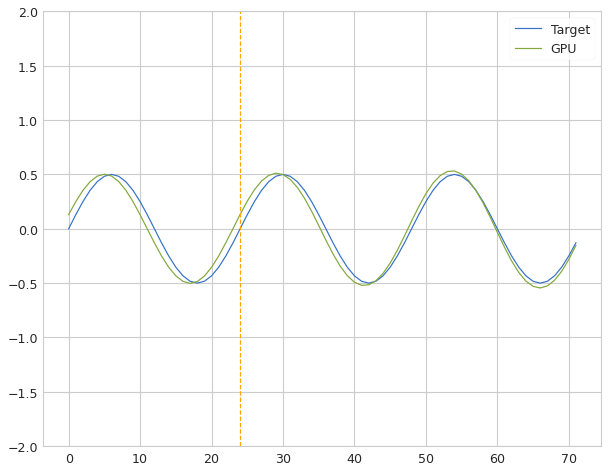

 Iter=37 a=0.953 sr=0.070 amp=0.298  ri=0.653 rr=4.602 loss=0.061325


Iter: 37 #### Diagnostic 0.061   Time 0.92  Best 0.061 NRMSE 0.061 CD 0.012
Iter: 38 #### Diagnostic 1.612   Time 0.26  Best 0.061 NRMSE 1.612 CD 1.917
Iter: 39 #### Diagnostic 0.089   Time 0.18  Best 0.061 NRMSE 0.089 CD 0.032
Iter: 40 #### Diagnostic 0.092   Time 0.25  Best 0.061 NRMSE 0.092 CD 0.034
Iter: 41 #### Diagnostic 0.088   Time 0.20  Best 0.061 NRMSE 0.088 CD 0.031
Iter: 42 #### Diagnostic 0.093   Time 0.24  Best 0.061 NRMSE 0.093 CD 0.035
Iter: 43 #### Diagnostic 0.092   Time 0.31  Best 0.061 NRMSE 0.092 CD 0.034
Iter: 44 #### Diagnostic 0.093   Time 0.54  Best 0.061 NRMSE 0.093 CD 0.035
Iter: 45 #### Diagnostic 0.104   Time 0.30  Best 0.061 NRMSE 0.104 CD 0.040
Iter: 46 #### Diagnostic 0.092   Time 0.44  Best 0.061 NRMSE 0.092 CD 0.034
Iter: 47 #### Diagnostic 0.093   Time 0.39  Best 0.061 NRMSE 0.093 CD 0.034
Iter: 48 #### Diagnostic 0.092   Time 0.27  Best 0.061 NRMSE 0.092 CD 0.034
Iter: 49 #### Dia

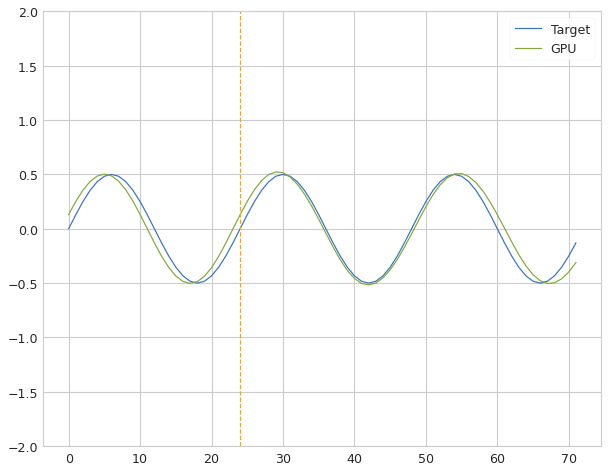

 Iter=30 a=0.979 sr=0.619 amp=0.086  ri=0.840 rr=0.572 loss=0.073706


Iter: 30 #### Diagnostic 0.074   Time 0.87  Best 0.074 NRMSE 0.074 CD 0.019
Iter: 31 #### Diagnostic 0.093   Time 0.30  Best 0.074 NRMSE 0.093 CD 0.034
Iter: 32 #### Diagnostic 0.092   Time 0.26  Best 0.074 NRMSE 0.092 CD 0.034
Iter: 33 #### Diagnostic 0.093   Time 0.33  Best 0.074 NRMSE 0.093 CD 0.034
Iter: 34 #### Diagnostic 0.098   Time 0.28  Best 0.074 NRMSE 0.098 CD 0.039
Iter: 35 #### Diagnostic 0.093   Time 0.22  Best 0.074 NRMSE 0.093 CD 0.034
Iter: 36 #### Diagnostic 0.092   Time 0.43  Best 0.074 NRMSE 0.092 CD 0.034
Iter: 37 #### Diagnostic 0.092   Time 0.17  Best 0.074 NRMSE 0.092 CD 0.034
Iter: 38 #### Diagnostic 0.092   Time 0.11  Best 0.074 NRMSE 0.092 CD 0.034
Iter: 39 #### Diagnostic 0.092   Time 0.14  Best 0.074 NRMSE 0.092 CD 0.034
Iter: 40 #### Diagnostic 0.092   Time 0.14  Best 0.074 NRMSE 0.092 CD 0.034
Iter: 41 #### Diagnostic 0.096   Time 0.14  Best 0.074 NRMSE 0.096 CD 0.037
Iter: 42 #### Dia

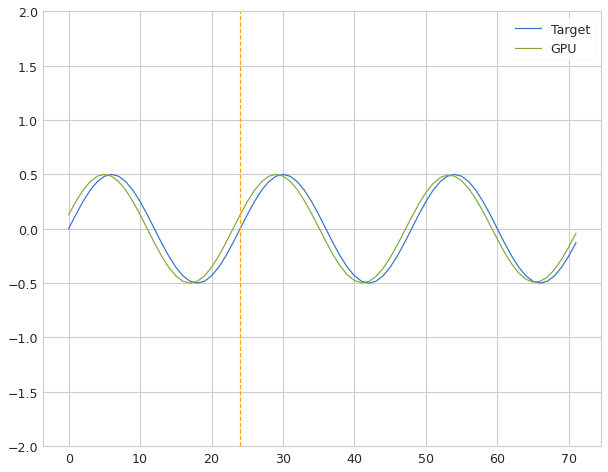

 Iter=17 a=0.924 sr=0.889 amp=0.320  ri=0.025 rr=4.308 loss=0.077140


Iter: 17 #### Diagnostic 0.077   Time 1.18  Best 0.077 NRMSE 0.077 CD 0.024
Iter: 18 #### Diagnostic 0.092   Time 0.28  Best 0.077 NRMSE 0.092 CD 0.034
Iter: 19 #### Diagnostic 0.088   Time 0.33  Best 0.077 NRMSE 0.088 CD 0.031
Iter: 20 #### Diagnostic 0.090   Time 0.33  Best 0.077 NRMSE 0.090 CD 0.033
Iter: 21 #### Diagnostic 0.092   Time 0.22  Best 0.077 NRMSE 0.092 CD 0.034
Iter: 22 #### Diagnostic 0.092   Time 0.38  Best 0.077 NRMSE 0.092 CD 0.034
Iter: 23 #### Diagnostic 0.092   Time 0.33  Best 0.077 NRMSE 0.092 CD 0.034
Iter: 24 #### Diagnostic 0.095   Time 0.29  Best 0.077 NRMSE 0.095 CD 0.036
Iter: 25 #### Diagnostic 0.093   Time 0.45  Best 0.077 NRMSE 0.093 CD 0.034
Iter: 26 #### Diagnostic 0.092   Time 0.34  Best 0.077 NRMSE 0.092 CD 0.034
Iter: 27 #### Diagnostic 0.092   Time 0.19  Best 0.077 NRMSE 0.092 CD 0.034
Iter: 28 #### Diagnostic 0.092   Time 0.38  Best 0.077 NRMSE 0.092 CD 0.034
Iter: 29 #### Dia

Iter: 21 #### Diagnostic 0.095   Time 0.42  Best 1000.000 NRMSE 0.095 CD 0.036
Iter: 22 #### Diagnostic 0.095   Time 0.33  Best 1000.000 NRMSE 0.095 CD 0.036
Iter: 23 #### Diagnostic 0.093   Time 0.36  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 24 #### Diagnostic 0.093   Time 0.24  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 25 #### Diagnostic 0.093   Time 0.12  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 26 #### Diagnostic 0.096   Time 0.13  Best 1000.000 NRMSE 0.096 CD 0.021
Iter: 27 #### Diagnostic 0.092   Time 0.13  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 28 #### Diagnostic 0.103   Time 0.15  Best 1000.000 NRMSE 0.103 CD 0.043
Iter: 29 #### Diagnostic 0.091   Time 0.15  Best 1000.000 NRMSE 0.091 CD 0.033
Iter: 30 #### Diagnostic 0.093   Time 0.09  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 31 #### Diagnostic 0.090   Time 0.10  Best 1000.000 NRMSE 0.090 CD 0.033
Iter: 32 #### Diagnostic 29.283   Time 0.09  Best 1000.000 NRMSE 29.283 CD 0.899
Iter: 33 #### Diagnostic 0.092   Time 0.18  Best 1

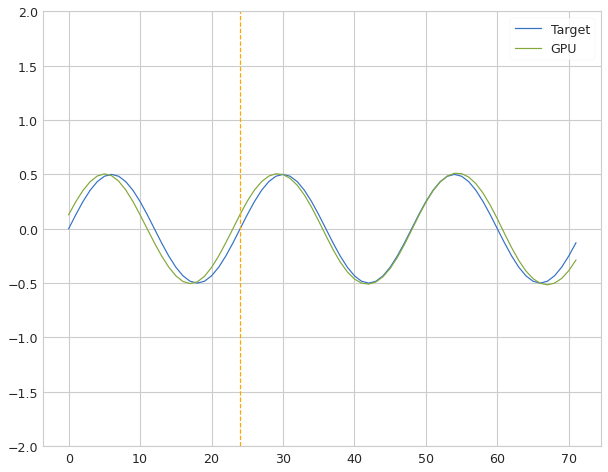

 Iter=35 a=0.982 sr=0.862 amp=0.092  ri=0.394 rr=3.226 loss=0.062277


Iter: 35 #### Diagnostic 0.062   Time 0.97  Best 0.062 NRMSE 0.062 CD 0.013
Iter: 36 #### Diagnostic 0.093   Time 0.38  Best 0.062 NRMSE 0.093 CD 0.035
Iter: 37 #### Diagnostic 0.090   Time 0.35  Best 0.062 NRMSE 0.090 CD 0.033
Iter: 38 #### Diagnostic 0.093   Time 0.25  Best 0.062 NRMSE 0.093 CD 0.034
Iter: 39 #### Diagnostic 0.092   Time 0.22  Best 0.062 NRMSE 0.092 CD 0.034
Iter: 40 #### Diagnostic 0.091   Time 0.37  Best 0.062 NRMSE 0.091 CD 0.033
Iter: 41 #### Diagnostic 0.093   Time 0.41  Best 0.062 NRMSE 0.093 CD 0.034
Iter: 42 #### Diagnostic 0.083   Time 0.29  Best 0.062 NRMSE 0.083 CD 0.027
Iter: 43 #### Diagnostic 0.094   Time 0.23  Best 0.062 NRMSE 0.094 CD 0.035
Iter: 44 #### Diagnostic 0.251   Time 0.29  Best 0.062 NRMSE 0.251 CD 0.201
Iter: 45 #### Diagnostic 0.093   Time 0.33  Best 0.062 NRMSE 0.093 CD 0.035
Iter: 46 #### Diagnostic 0.092   Time 0.26  Best 0.062 NRMSE 0.092 CD 0.034
Iter: 47 #### Dia

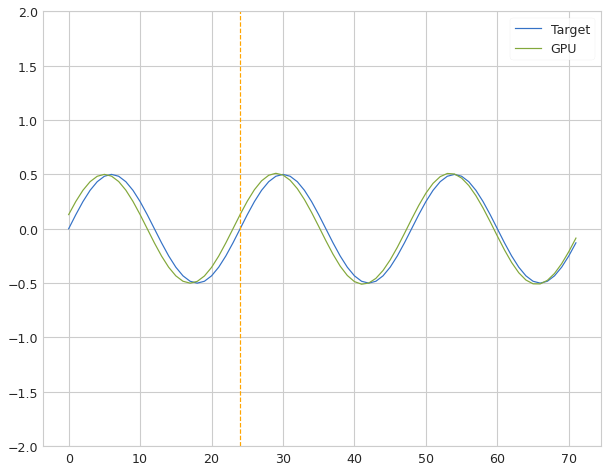

 Iter=15 a=0.926 sr=0.334 amp=0.177  ri=0.990 rr=3.464 loss=0.066945


Iter: 15 #### Diagnostic 0.067   Time 0.57  Best 0.067 NRMSE 0.067 CD 0.017
Iter: 16 #### Diagnostic 0.096   Time 0.24  Best 0.067 NRMSE 0.096 CD 0.037
Iter: 17 #### Diagnostic 0.092   Time 0.26  Best 0.067 NRMSE 0.092 CD 0.034
Iter: 18 #### Diagnostic 0.094   Time 0.19  Best 0.067 NRMSE 0.094 CD 0.035
Iter: 19 #### Diagnostic 0.092   Time 0.17  Best 0.067 NRMSE 0.092 CD 0.034
Iter: 20 #### Diagnostic 0.092   Time 0.25  Best 0.067 NRMSE 0.092 CD 0.034
Iter: 21 #### Diagnostic 0.092   Time 0.15  Best 0.067 NRMSE 0.092 CD 0.034
Iter: 22 #### Diagnostic 0.093   Time 0.26  Best 0.067 NRMSE 0.093 CD 0.034
Iter: 23 #### Diagnostic 0.092   Time 0.29  Best 0.067 NRMSE 0.092 CD 0.034
Iter: 24 #### Diagnostic 0.092   Time 0.30  Best 0.067 NRMSE 0.092 CD 0.034
Iter: 25 #### Diagnostic 0.088   Time 0.31  Best 0.067 NRMSE 0.088 CD 0.031
Iter: 26 #### Diagnostic 0.096   Time 0.32  Best 0.067 NRMSE 0.096 CD 0.037
Iter: 27 #### Dia

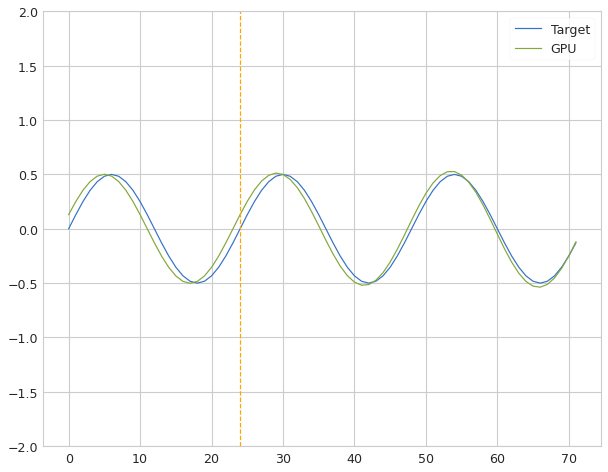

 Iter=85 a=0.889 sr=0.187 amp=0.095  ri=0.949 rr=1.347 loss=0.062474


Iter: 85 #### Diagnostic 0.062   Time 0.75  Best 0.062 NRMSE 0.062 CD 0.013
Iter: 86 #### Diagnostic 0.093   Time 0.29  Best 0.062 NRMSE 0.093 CD 0.035
Iter: 87 #### Diagnostic 0.092   Time 0.40  Best 0.062 NRMSE 0.092 CD 0.034
Iter: 88 #### Diagnostic 0.097   Time 0.42  Best 0.062 NRMSE 0.097 CD 0.037
Iter: 89 #### Diagnostic 0.093   Time 0.46  Best 0.062 NRMSE 0.093 CD 0.035
Iter: 90 #### Diagnostic 0.093   Time 0.44  Best 0.062 NRMSE 0.093 CD 0.034
Iter: 91 #### Diagnostic 0.092   Time 0.33  Best 0.062 NRMSE 0.092 CD 0.034
Iter: 92 #### Diagnostic 0.092   Time 0.39  Best 0.062 NRMSE 0.092 CD 0.034
Iter: 93 #### Diagnostic 0.093   Time 0.17  Best 0.062 NRMSE 0.093 CD 0.034
Iter: 94 #### Diagnostic 0.093   Time 0.18  Best 0.062 NRMSE 0.093 CD 0.034
Iter: 95 #### Diagnostic 0.096   Time 0.19  Best 0.062 NRMSE 0.096 CD 0.037
Iter: 96 #### Diagnostic 0.093   Time 0.27  Best 0.062 NRMSE 0.093 CD 0.035
Iter: 97 #### Dia

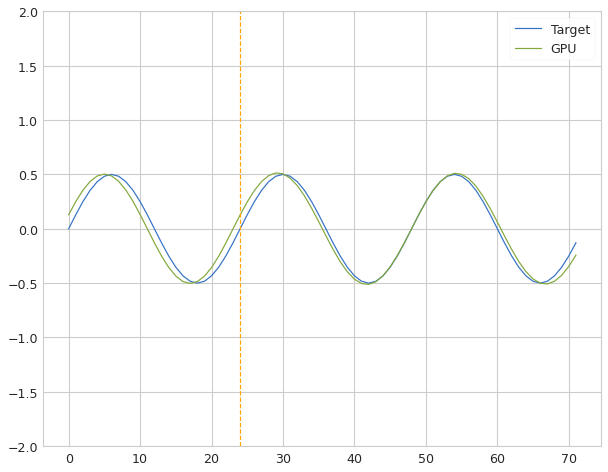

 Iter=56 a=0.816 sr=0.061 amp=0.053  ri=0.096 rr=0.347 loss=0.052552


Iter: 56 #### Diagnostic 0.053   Time 1.54  Best 0.053 NRMSE 0.053 CD 0.010
Iter: 57 #### Diagnostic 0.092   Time 0.28  Best 0.053 NRMSE 0.092 CD 0.034
Iter: 58 #### Diagnostic 0.092   Time 0.11  Best 0.053 NRMSE 0.092 CD 0.034
Iter: 59 #### Diagnostic 0.092   Time 0.11  Best 0.053 NRMSE 0.092 CD 0.034
Iter: 60 #### Diagnostic 0.083   Time 0.13  Best 0.053 NRMSE 0.083 CD 0.026
Iter: 61 #### Diagnostic 0.129   Time 0.13  Best 0.053 NRMSE 0.129 CD 0.031
Iter: 62 #### Diagnostic 0.097   Time 0.18  Best 0.053 NRMSE 0.097 CD 0.038
Iter: 63 #### Diagnostic 0.094   Time 0.12  Best 0.053 NRMSE 0.094 CD 0.036
Iter: 64 #### Diagnostic 0.095   Time 0.14  Best 0.053 NRMSE 0.095 CD 0.036
Iter: 65 #### Diagnostic 0.093   Time 0.13  Best 0.053 NRMSE 0.093 CD 0.034
Iter: 66 #### Diagnostic 0.093   Time 0.12  Best 0.053 NRMSE 0.093 CD 0.034
Iter: 67 #### Diagnostic 0.183   Time 0.13  Best 0.053 NRMSE 0.183 CD 0.099
Iter: 68 #### Dia

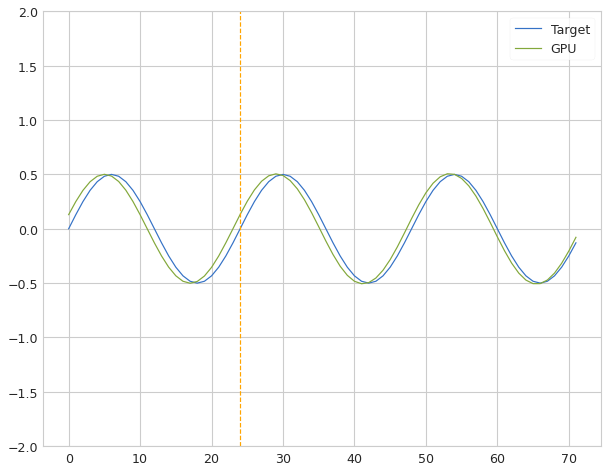

 Iter=23 a=0.917 sr=0.451 amp=0.216  ri=0.727 rr=0.181 loss=0.068793


Iter: 23 #### Diagnostic 0.069   Time 0.62  Best 0.069 NRMSE 0.069 CD 0.018
Iter: 24 #### Diagnostic 0.093   Time 0.21  Best 0.069 NRMSE 0.093 CD 0.035
Iter: 25 #### Diagnostic 0.092   Time 0.42  Best 0.069 NRMSE 0.092 CD 0.034
Iter: 26 #### Diagnostic 0.094   Time 0.23  Best 0.069 NRMSE 0.094 CD 0.035
Iter: 27 #### Diagnostic 0.090   Time 0.59  Best 0.069 NRMSE 0.090 CD 0.033
Iter: 28 #### Diagnostic 0.093   Time 0.35  Best 0.069 NRMSE 0.093 CD 0.034
Iter: 29 #### Diagnostic 0.093   Time 0.35  Best 0.069 NRMSE 0.093 CD 0.034
Iter: 30 #### Diagnostic 0.190   Time 0.31  Best 0.069 NRMSE 0.190 CD 0.150
Iter: 31 #### Diagnostic 0.093   Time 0.32  Best 0.069 NRMSE 0.093 CD 0.034
Iter: 32 #### Diagnostic 0.092   Time 0.32  Best 0.069 NRMSE 0.092 CD 0.034
Iter: 33 #### Diagnostic 0.093   Time 0.25  Best 0.069 NRMSE 0.093 CD 0.034
Iter: 34 #### Diagnostic 0.082   Time 0.24  Best 0.069 NRMSE 0.082 CD 0.027
Iter: 35 #### Dia

Iter: 19 #### Diagnostic 0.093   Time 0.18  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 20 #### Diagnostic 0.096   Time 0.10  Best 1000.000 NRMSE 0.096 CD 0.035
Iter: 21 #### Diagnostic 0.092   Time 0.12  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 22 #### Diagnostic 0.092   Time 0.26  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 23 #### Diagnostic 0.093   Time 0.25  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 24 #### Diagnostic 0.094   Time 0.25  Best 1000.000 NRMSE 0.094 CD 0.035
Iter: 25 #### Diagnostic 0.092   Time 0.26  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 26 #### Diagnostic 0.092   Time 0.41  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 27 #### Diagnostic 0.092   Time 0.51  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 28 #### Diagnostic 0.092   Time 0.31  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 29 #### Diagnostic 0.370   Time 0.31  Best 1000.000 NRMSE 0.370 CD 1.218
Iter: 30 #### Diagnostic 0.261   Time 0.36  Best 1000.000 NRMSE 0.261 CD 0.106
Iter: 31 #### Diagnostic 0.093   Time 0.39  Best 100

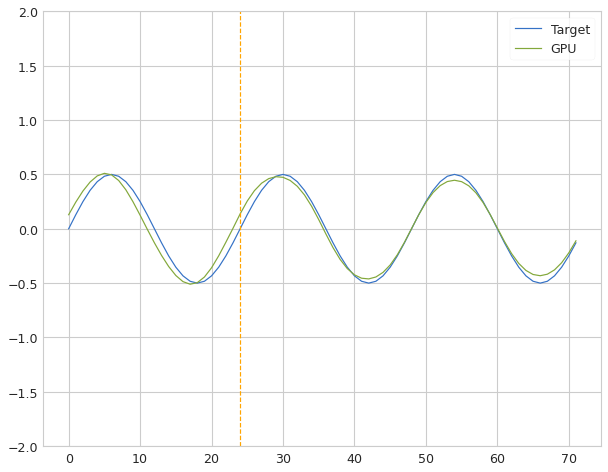

 Iter=55 a=0.976 sr=1.034 amp=0.060  ri=0.599 rr=3.091 loss=0.046710


Iter: 55 #### Diagnostic 0.047   Time 0.62  Best 0.047 NRMSE 0.047 CD 0.008
Iter: 56 #### Diagnostic 0.087   Time 0.28  Best 0.047 NRMSE 0.087 CD 0.030
Iter: 57 #### Diagnostic 0.094   Time 0.26  Best 0.047 NRMSE 0.094 CD 0.035
Iter: 58 #### Diagnostic 0.093   Time 0.24  Best 0.047 NRMSE 0.093 CD 0.035
Iter: 59 #### Diagnostic 0.092   Time 0.25  Best 0.047 NRMSE 0.092 CD 0.034
Iter: 60 #### Diagnostic 0.093   Time 0.21  Best 0.047 NRMSE 0.093 CD 0.034
Iter: 61 #### Diagnostic 0.092   Time 0.13  Best 0.047 NRMSE 0.092 CD 0.034
Iter: 62 #### Diagnostic 0.097   Time 0.14  Best 0.047 NRMSE 0.097 CD 0.038
Iter: 63 #### Diagnostic 0.092   Time 0.12  Best 0.047 NRMSE 0.092 CD 0.034
Iter: 64 #### Diagnostic 0.092   Time 0.32  Best 0.047 NRMSE 0.092 CD 0.034
Iter: 65 #### Diagnostic 0.092   Time 0.40  Best 0.047 NRMSE 0.092 CD 0.034
Iter: 66 #### Diagnostic 0.093   Time 0.14  Best 0.047 NRMSE 0.093 CD 0.034
Iter: 67 #### Dia

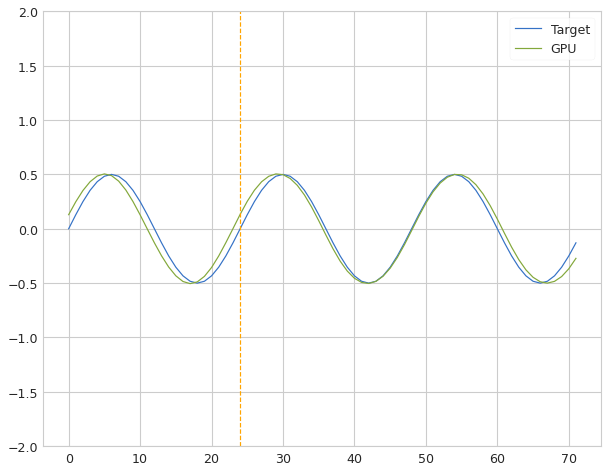

 Iter=35 a=0.982 sr=0.862 amp=0.092  ri=0.394 rr=3.226 loss=0.058718


Iter: 35 #### Diagnostic 0.059   Time 0.84  Best 0.059 NRMSE 0.059 CD 0.013
Iter: 36 #### Diagnostic 0.093   Time 0.25  Best 0.059 NRMSE 0.093 CD 0.035
Iter: 37 #### Diagnostic 0.090   Time 0.27  Best 0.059 NRMSE 0.090 CD 0.033
Iter: 38 #### Diagnostic 0.093   Time 0.44  Best 0.059 NRMSE 0.093 CD 0.034
Iter: 39 #### Diagnostic 0.093   Time 0.32  Best 0.059 NRMSE 0.093 CD 0.035
Iter: 40 #### Diagnostic 0.098   Time 0.30  Best 0.059 NRMSE 0.098 CD 0.039
Iter: 41 #### Diagnostic 0.093   Time 0.42  Best 0.059 NRMSE 0.093 CD 0.034
Iter: 42 #### Diagnostic 0.083   Time 0.50  Best 0.059 NRMSE 0.083 CD 0.026
Iter: 43 #### Diagnostic 0.089   Time 0.47  Best 0.059 NRMSE 0.089 CD 0.032
Iter: 44 #### Diagnostic 0.233   Time 0.40  Best 0.059 NRMSE 0.233 CD 0.168
Iter: 45 #### Diagnostic 0.105   Time 0.28  Best 0.059 NRMSE 0.105 CD 0.045
Iter: 46 #### Diagnostic 0.092   Time 0.32  Best 0.059 NRMSE 0.092 CD 0.034
Iter: 47 #### Dia

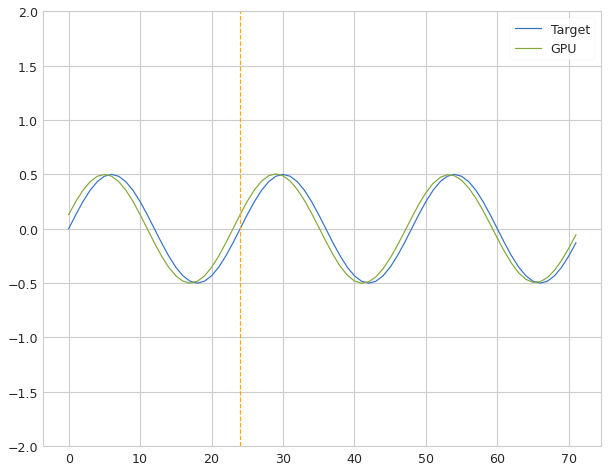

 Iter=15 a=0.926 sr=0.334 amp=0.177  ri=0.990 rr=3.464 loss=0.074584


Iter: 15 #### Diagnostic 0.075   Time 0.71  Best 0.075 NRMSE 0.075 CD 0.022
Iter: 16 #### Diagnostic 0.096   Time 0.30  Best 0.075 NRMSE 0.096 CD 0.037
Iter: 17 #### Diagnostic 0.093   Time 0.32  Best 0.075 NRMSE 0.093 CD 0.035
Iter: 18 #### Diagnostic 0.093   Time 0.29  Best 0.075 NRMSE 0.093 CD 0.034
Iter: 19 #### Diagnostic 0.094   Time 0.51  Best 0.075 NRMSE 0.094 CD 0.035
Iter: 20 #### Diagnostic 0.093   Time 0.28  Best 0.075 NRMSE 0.093 CD 0.034
Iter: 21 #### Diagnostic 0.092   Time 0.33  Best 0.075 NRMSE 0.092 CD 0.034
Iter: 22 #### Diagnostic 0.093   Time 0.34  Best 0.075 NRMSE 0.093 CD 0.034
Iter: 23 #### Diagnostic 0.092   Time 0.41  Best 0.075 NRMSE 0.092 CD 0.034
Iter: 24 #### Diagnostic 0.092   Time 0.26  Best 0.075 NRMSE 0.092 CD 0.034
Iter: 25 #### Diagnostic 0.094   Time 0.33  Best 0.075 NRMSE 0.094 CD 0.035
Iter: 26 #### Diagnostic 0.101   Time 0.26  Best 0.075 NRMSE 0.101 CD 0.041
Iter: 27 #### Dia

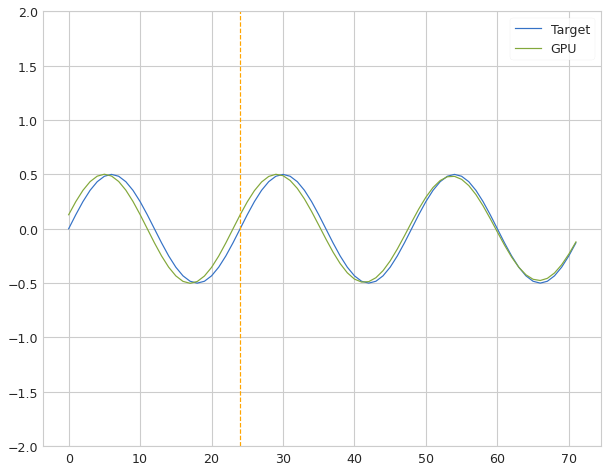

 Iter=85 a=0.889 sr=0.187 amp=0.095  ri=0.949 rr=1.347 loss=0.053640


Iter: 85 #### Diagnostic 0.054   Time 1.00  Best 0.054 NRMSE 0.054 CD 0.012
Iter: 86 #### Diagnostic 0.092   Time 0.47  Best 0.054 NRMSE 0.092 CD 0.034
Iter: 87 #### Diagnostic 0.092   Time 0.39  Best 0.054 NRMSE 0.092 CD 0.034
Iter: 88 #### Diagnostic 0.101   Time 0.22  Best 0.054 NRMSE 0.101 CD 0.040
Iter: 89 #### Diagnostic 0.092   Time 0.13  Best 0.054 NRMSE 0.092 CD 0.034
Iter: 90 #### Diagnostic 0.093   Time 0.27  Best 0.054 NRMSE 0.093 CD 0.034
Iter: 91 #### Diagnostic 0.092   Time 0.14  Best 0.054 NRMSE 0.092 CD 0.034
Iter: 92 #### Diagnostic 0.092   Time 0.25  Best 0.054 NRMSE 0.092 CD 0.034
Iter: 93 #### Diagnostic 0.093   Time 0.18  Best 0.054 NRMSE 0.093 CD 0.034
Iter: 94 #### Diagnostic 0.093   Time 0.30  Best 0.054 NRMSE 0.093 CD 0.034
Iter: 95 #### Diagnostic 0.093   Time 0.57  Best 0.054 NRMSE 0.093 CD 0.035
Iter: 96 #### Diagnostic 0.092   Time 0.54  Best 0.054 NRMSE 0.092 CD 0.034
Iter: 97 #### Dia

Iter: 87 #### Diagnostic 0.099   Time 0.36  Best 1000.000 NRMSE 0.099 CD 0.039
Iter: 88 #### Diagnostic 0.093   Time 0.50  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 89 #### Diagnostic 0.092   Time 0.28  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 90 #### Diagnostic 0.092   Time 0.10  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 91 #### Diagnostic 0.092   Time 0.11  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 92 #### Diagnostic 0.095   Time 0.17  Best 1000.000 NRMSE 0.095 CD 0.036
Iter: 93 #### Diagnostic 0.082   Time 0.22  Best 1000.000 NRMSE 0.082 CD 0.027
Iter: 94 #### Diagnostic 0.095   Time 0.23  Best 1000.000 NRMSE 0.095 CD 0.036
Iter: 95 #### Diagnostic 0.092   Time 0.17  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 96 #### Diagnostic 0.093   Time 0.16  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 97 #### Diagnostic 0.095   Time 0.27  Best 1000.000 NRMSE 0.095 CD 0.035
Iter: 98 #### Diagnostic 0.092   Time 0.35  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 99 #### Diagnostic 0.092   Time 0.62  Best 100

Iter: 90 #### Diagnostic 0.147   Time 0.31  Best 1000.000 NRMSE 0.147 CD 0.047
Iter: 91 #### Diagnostic 0.091   Time 0.33  Best 1000.000 NRMSE 0.091 CD 0.033
Iter: 92 #### Diagnostic 0.196   Time 0.30  Best 1000.000 NRMSE 0.196 CD 0.004
Iter: 93 #### Diagnostic 0.093   Time 0.19  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 94 #### Diagnostic 0.091   Time 0.40  Best 1000.000 NRMSE 0.091 CD 0.033
Iter: 95 #### Diagnostic 0.532   Time 0.36  Best 1000.000 NRMSE 0.532 CD 1.062
Iter: 96 #### Diagnostic 0.093   Time 0.24  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 97 #### Diagnostic 0.092   Time 0.23  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 98 #### Diagnostic 0.094   Time 0.24  Best 1000.000 NRMSE 0.094 CD 0.035
Iter: 99 #### Diagnostic 0.092   Time 0.21  Best 1000.000 NRMSE 0.092 CD 0.034

Best result = 0.0896129735021358
a = 0.09690706420290479
sr = 0.7063881363765193
amp = 0.5959665278261368
ri = 0.589652061827949
rr = 0.8475080453222494

Best mn:0.889	 mn:0.982
New bounds mn--mx: 0.034---0.00

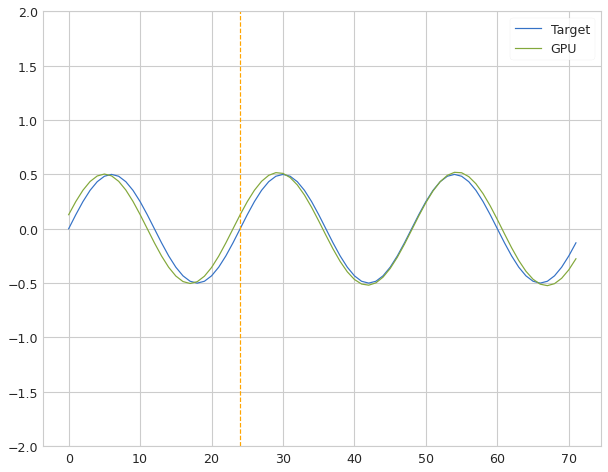

 Iter=4 a=0.921 sr=0.494 amp=0.191  ri=0.205 rr=4.320 loss=0.060667


Iter: 4 #### Diagnostic 0.061   Time 0.77  Best 0.061 NRMSE 0.061 CD 0.012
Iter: 5 #### Diagnostic 0.092   Time 0.19  Best 0.061 NRMSE 0.092 CD 0.034
Iter: 6 #### Diagnostic 0.092   Time 0.26  Best 0.061 NRMSE 0.092 CD 0.034
Iter: 7 #### Diagnostic 0.092   Time 0.26  Best 0.061 NRMSE 0.092 CD 0.034
Iter: 8 #### Diagnostic 0.094   Time 0.24  Best 0.061 NRMSE 0.094 CD 0.019
Iter: 9 #### Diagnostic 0.092   Time 0.22  Best 0.061 NRMSE 0.092 CD 0.033
Iter: 10 #### Diagnostic 0.638   Time 0.17  Best 0.061 NRMSE 0.638 CD 0.036
Iter: 11 #### Diagnostic 0.092   Time 0.15  Best 0.061 NRMSE 0.092 CD 0.034
Iter: 12 #### Diagnostic 0.092   Time 0.12  Best 0.061 NRMSE 0.092 CD 0.034
Iter: 13 #### Diagnostic 0.457   Time 0.12  Best 0.061 NRMSE 0.457 CD 1.354
Iter: 14 #### Diagnostic 0.092   Time 0.22  Best 0.061 NRMSE 0.092 CD 0.034
Iter: 15 #### Diagnostic 0.442   Time 0.09  Best 0.061 NRMSE 0.442 CD 0.079
Iter: 16 #### Diagnostic

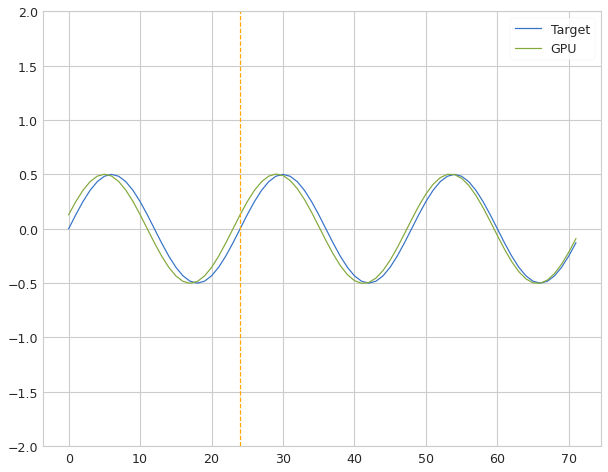

 Iter=2 a=0.574 sr=0.695 amp=0.006  ri=0.607 rr=3.525 loss=0.063155


Iter: 2 #### Diagnostic 0.063   Time 0.81  Best 0.063 NRMSE 0.063 CD 0.016
Iter: 3 #### Diagnostic 0.092   Time 0.25  Best 0.063 NRMSE 0.092 CD 0.034
Iter: 4 #### Diagnostic 0.093   Time 0.08  Best 0.063 NRMSE 0.093 CD 0.034
Iter: 5 #### Diagnostic 0.092   Time 0.05  Best 0.063 NRMSE 0.092 CD 0.034
Iter: 6 #### Diagnostic 0.092   Time 0.05  Best 0.063 NRMSE 0.092 CD 0.034
Iter: 7 #### Diagnostic 0.093   Time 0.14  Best 0.063 NRMSE 0.093 CD 0.034
Iter: 8 #### Diagnostic 0.093   Time 0.21  Best 0.063 NRMSE 0.093 CD 0.034
Iter: 9 #### Diagnostic 0.095   Time 0.23  Best 0.063 NRMSE 0.095 CD 0.036
Iter: 10 #### Diagnostic 0.114   Time 0.21  Best 0.063 NRMSE 0.114 CD 0.040
Iter: 11 #### Diagnostic 0.092   Time 0.18  Best 0.063 NRMSE 0.092 CD 0.034
Iter: 12 #### Diagnostic 0.103   Time 0.18  Best 0.063 NRMSE 0.103 CD 0.043
Iter: 13 #### Diagnostic 0.093   Time 0.24  Best 0.063 NRMSE 0.093 CD 0.035
Iter: 14 #### Diagnostic 0

Iter: 7 #### Diagnostic 0.092   Time 0.16  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 8 #### Diagnostic 0.092   Time 0.12  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 9 #### Diagnostic 0.093   Time 0.19  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 10 #### Diagnostic 0.092   Time 0.10  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 11 #### Diagnostic 0.092   Time 0.18  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 12 #### Diagnostic 0.094   Time 0.15  Best 1000.000 NRMSE 0.094 CD 0.035
Iter: 13 #### Diagnostic 0.092   Time 0.15  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 14 #### Diagnostic 0.091   Time 0.14  Best 1000.000 NRMSE 0.091 CD 0.033
Iter: 15 #### Diagnostic 0.131   Time 0.16  Best 1000.000 NRMSE 0.131 CD 0.068
Iter: 16 #### Diagnostic 0.096   Time 0.13  Best 1000.000 NRMSE 0.096 CD 0.037
Iter: 17 #### Diagnostic 0.093   Time 0.10  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 18 #### Diagnostic 0.096   Time 0.09  Best 1000.000 NRMSE 0.096 CD 0.036
Iter: 19 #### Diagnostic 0.094   Time 0.12  Best 1000.0

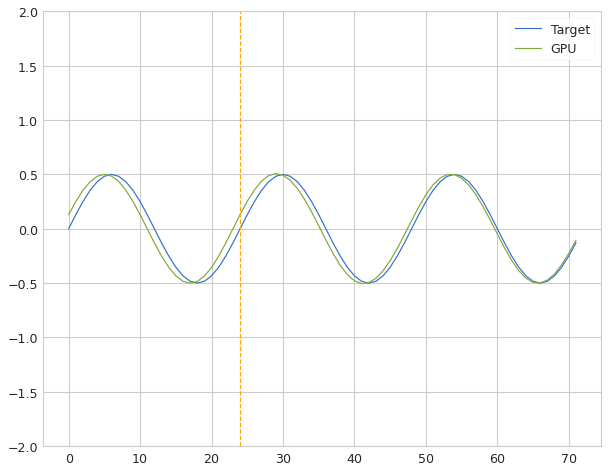

 Iter=88 a=0.954 sr=0.858 amp=0.171  ri=0.662 rr=2.894 loss=0.060145


Iter: 88 #### Diagnostic 0.060   Time 0.75  Best 0.060 NRMSE 0.060 CD 0.014
Iter: 89 #### Diagnostic 0.092   Time 0.12  Best 0.060 NRMSE 0.092 CD 0.034
Iter: 90 #### Diagnostic 0.093   Time 0.19  Best 0.060 NRMSE 0.093 CD 0.034
Iter: 91 #### Diagnostic 0.092   Time 0.19  Best 0.060 NRMSE 0.092 CD 0.034
Iter: 92 #### Diagnostic 0.092   Time 0.22  Best 0.060 NRMSE 0.092 CD 0.034
Iter: 93 #### Diagnostic 0.092   Time 0.22  Best 0.060 NRMSE 0.092 CD 0.034
Iter: 94 #### Diagnostic 0.092   Time 0.21  Best 0.060 NRMSE 0.092 CD 0.034
Iter: 95 #### Diagnostic 0.092   Time 0.11  Best 0.060 NRMSE 0.092 CD 0.033
Iter: 96 #### Diagnostic 0.093   Time 0.12  Best 0.060 NRMSE 0.093 CD 0.034
Iter: 97 #### Diagnostic 0.092   Time 0.11  Best 0.060 NRMSE 0.092 CD 0.034
Iter: 98 #### Diagnostic 0.092   Time 0.18  Best 0.060 NRMSE 0.092 CD 0.034
Iter: 99 #### Diagnostic 0.093   Time 0.13  Best 0.060 NRMSE 0.093 CD 0.034

Best result = 0.

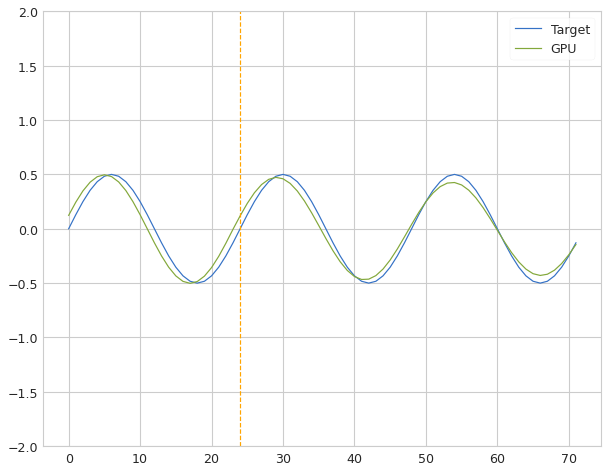

 Iter=5 a=0.946 sr=1.104 amp=0.953  ri=0.935 rr=0.546 loss=0.060630


Iter: 5 #### Diagnostic 0.061   Time 0.95  Best 0.061 NRMSE 0.061 CD 0.012
Iter: 6 #### Diagnostic 0.092   Time 0.19  Best 0.061 NRMSE 0.092 CD 0.034
Iter: 7 #### Diagnostic 0.092   Time 0.23  Best 0.061 NRMSE 0.092 CD 0.034
Iter: 8 #### Diagnostic 0.093   Time 0.25  Best 0.061 NRMSE 0.093 CD 0.035
Iter: 9 #### Diagnostic 0.093   Time 0.23  Best 0.061 NRMSE 0.093 CD 0.035
Iter: 10 #### Diagnostic 0.092   Time 0.19  Best 0.061 NRMSE 0.092 CD 0.034
Iter: 11 #### Diagnostic 0.093   Time 0.08  Best 0.061 NRMSE 0.093 CD 0.034
Iter: 12 #### Diagnostic 0.094   Time 0.10  Best 0.061 NRMSE 0.094 CD 0.036
Iter: 13 #### Diagnostic 0.091   Time 0.10  Best 0.061 NRMSE 0.091 CD 0.034
Iter: 14 #### Diagnostic 0.101   Time 0.10  Best 0.061 NRMSE 0.101 CD 0.036
Iter: 15 #### Diagnostic 0.092   Time 0.10  Best 0.061 NRMSE 0.092 CD 0.034
Iter: 16 #### Diagnostic 0.255   Time 0.11  Best 0.061 NRMSE 0.255 CD 0.024
Iter: 17 #### Diagnosti

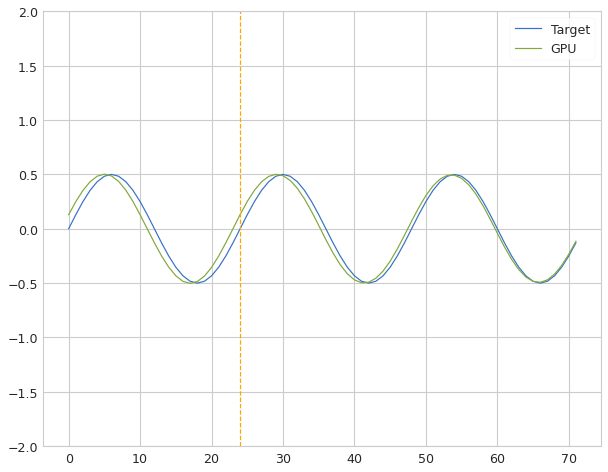

 Iter=37 a=0.953 sr=0.070 amp=0.298  ri=0.653 rr=4.602 loss=0.056350


Iter: 37 #### Diagnostic 0.056   Time 0.69  Best 0.056 NRMSE 0.056 CD 0.013
Iter: 38 #### Diagnostic 2.310   Time 0.15  Best 0.056 NRMSE 2.310 CD 1.966
Iter: 39 #### Diagnostic 0.093   Time 0.14  Best 0.056 NRMSE 0.093 CD 0.034
Iter: 40 #### Diagnostic 0.092   Time 0.19  Best 0.056 NRMSE 0.092 CD 0.034
Iter: 41 #### Diagnostic 0.082   Time 0.20  Best 0.056 NRMSE 0.082 CD 0.027
Iter: 42 #### Diagnostic 0.093   Time 0.21  Best 0.056 NRMSE 0.093 CD 0.035
Iter: 43 #### Diagnostic 0.092   Time 0.20  Best 0.056 NRMSE 0.092 CD 0.034
Iter: 44 #### Diagnostic 0.089   Time 0.17  Best 0.056 NRMSE 0.089 CD 0.032
Iter: 45 #### Diagnostic 0.111   Time 0.18  Best 0.056 NRMSE 0.111 CD 0.037
Iter: 46 #### Diagnostic 0.092   Time 0.17  Best 0.056 NRMSE 0.092 CD 0.034
Iter: 47 #### Diagnostic 0.092   Time 0.18  Best 0.056 NRMSE 0.092 CD 0.034
Iter: 48 #### Diagnostic 0.092   Time 0.20  Best 0.056 NRMSE 0.092 CD 0.034
Iter: 49 #### Dia

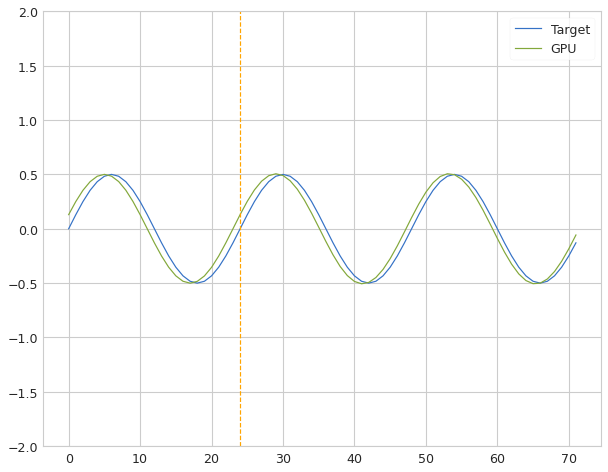

 Iter=23 a=0.917 sr=0.451 amp=0.216  ri=0.727 rr=0.181 loss=0.074418


Iter: 23 #### Diagnostic 0.074   Time 0.49  Best 0.074 NRMSE 0.074 CD 0.022
Iter: 24 #### Diagnostic 0.095   Time 0.18  Best 0.074 NRMSE 0.095 CD 0.036
Iter: 25 #### Diagnostic 0.092   Time 0.05  Best 0.074 NRMSE 0.092 CD 0.034
Iter: 26 #### Diagnostic 0.087   Time 0.05  Best 0.074 NRMSE 0.087 CD 0.030
Iter: 27 #### Diagnostic 0.094   Time 0.05  Best 0.074 NRMSE 0.094 CD 0.035
Iter: 28 #### Diagnostic 0.093   Time 0.05  Best 0.074 NRMSE 0.093 CD 0.034
Iter: 29 #### Diagnostic 0.091   Time 0.10  Best 0.074 NRMSE 0.091 CD 0.033
Iter: 30 #### Diagnostic 0.146   Time 0.05  Best 0.074 NRMSE 0.146 CD 0.088
Iter: 31 #### Diagnostic 0.093   Time 0.06  Best 0.074 NRMSE 0.093 CD 0.034
Iter: 32 #### Diagnostic 0.092   Time 0.05  Best 0.074 NRMSE 0.092 CD 0.034
Iter: 33 #### Diagnostic 0.092   Time 0.06  Best 0.074 NRMSE 0.092 CD 0.034
Iter: 34 #### Diagnostic 0.091   Time 0.22  Best 0.074 NRMSE 0.091 CD 0.033
Iter: 35 #### Dia

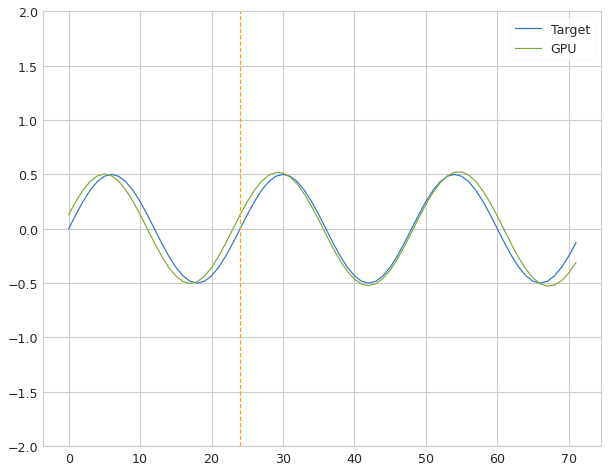

 Iter=4 a=0.921 sr=0.494 amp=0.191  ri=0.205 rr=4.320 loss=0.070877


Iter: 4 #### Diagnostic 0.071   Time 0.71  Best 0.071 NRMSE 0.071 CD 0.016
Iter: 5 #### Diagnostic 0.092   Time 0.10  Best 0.071 NRMSE 0.092 CD 0.034
Iter: 6 #### Diagnostic 0.092   Time 0.11  Best 0.071 NRMSE 0.092 CD 0.034
Iter: 7 #### Diagnostic 0.092   Time 0.10  Best 0.071 NRMSE 0.092 CD 0.034
Iter: 8 #### Diagnostic 0.101   Time 0.23  Best 0.071 NRMSE 0.101 CD 0.037
Iter: 9 #### Diagnostic 0.093   Time 0.18  Best 0.071 NRMSE 0.093 CD 0.035
Iter: 10 #### Diagnostic 0.288   Time 0.18  Best 0.071 NRMSE 0.288 CD 0.241
Iter: 11 #### Diagnostic 0.092   Time 0.16  Best 0.071 NRMSE 0.092 CD 0.034
Iter: 12 #### Diagnostic 0.092   Time 0.06  Best 0.071 NRMSE 0.092 CD 0.034
Iter: 13 #### Diagnostic 4.905   Time 0.05  Best 0.071 NRMSE 4.905 CD 0.031
Iter: 14 #### Diagnostic 0.093   Time 0.15  Best 0.071 NRMSE 0.093 CD 0.034
Iter: 15 #### Diagnostic 0.098   Time 0.20  Best 0.071 NRMSE 0.098 CD 0.035
Iter: 16 #### Diagnostic

Iter: 9 #### Diagnostic 0.094   Time 0.32  Best 1000.000 NRMSE 0.094 CD 0.035
Iter: 10 #### Diagnostic 0.089   Time 0.21  Best 1000.000 NRMSE 0.089 CD 0.030
Iter: 11 #### Diagnostic 0.092   Time 0.24  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 12 #### Diagnostic 0.107   Time 0.20  Best 1000.000 NRMSE 0.107 CD 0.047
Iter: 13 #### Diagnostic 0.093   Time 0.12  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 14 #### Diagnostic 0.092   Time 0.17  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 15 #### Diagnostic 0.092   Time 0.19  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 16 #### Diagnostic 0.093   Time 0.15  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 17 #### Diagnostic 0.092   Time 0.40  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 18 #### Diagnostic 0.092   Time 0.21  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 19 #### Diagnostic 0.130   Time 0.23  Best 1000.000 NRMSE 0.130 CD 0.062
Iter: 20 #### Diagnostic 0.092   Time 0.10  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 21 #### Diagnostic 0.093   Time 0.34  Best 1000

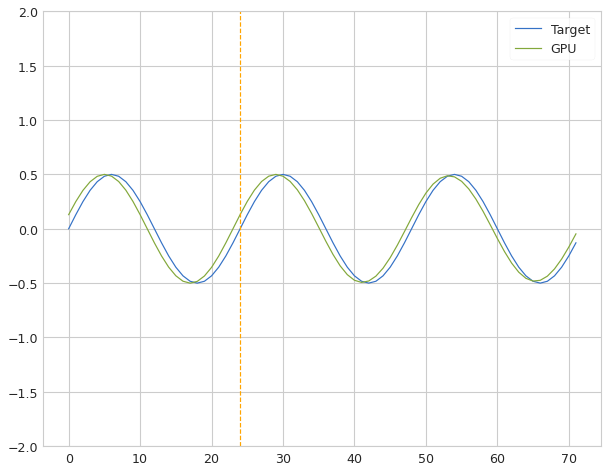

 Iter=90 a=0.898 sr=0.813 amp=0.112  ri=0.958 rr=1.950 loss=0.075980


Iter: 90 #### Diagnostic 0.076   Time 0.75  Best 0.076 NRMSE 0.076 CD 0.023
Iter: 91 #### Diagnostic 0.094   Time 0.19  Best 0.076 NRMSE 0.094 CD 0.035
Iter: 92 #### Diagnostic 0.092   Time 0.18  Best 0.076 NRMSE 0.092 CD 0.034
Iter: 93 #### Diagnostic 0.093   Time 0.18  Best 0.076 NRMSE 0.093 CD 0.034
Iter: 94 #### Diagnostic 0.092   Time 0.10  Best 0.076 NRMSE 0.092 CD 0.034
Iter: 95 #### Diagnostic 0.092   Time 0.10  Best 0.076 NRMSE 0.092 CD 0.034
Iter: 96 #### Diagnostic 0.094   Time 0.09  Best 0.076 NRMSE 0.094 CD 0.035
Iter: 97 #### Diagnostic 5.873   Time 0.13  Best 0.076 NRMSE 5.873 CD 0.028
Iter: 98 #### Diagnostic 0.093   Time 0.22  Best 0.076 NRMSE 0.093 CD 0.034
Iter: 99 #### Diagnostic 0.093   Time 0.16  Best 0.076 NRMSE 0.093 CD 0.035

Best result = 0.07597957630915254
a = 0.898152893376875
sr = 0.8127078057590512
amp = 0.11160219580589567
ri = 0.958195275690587
rr = 1.9501271018988164

 ********** 20

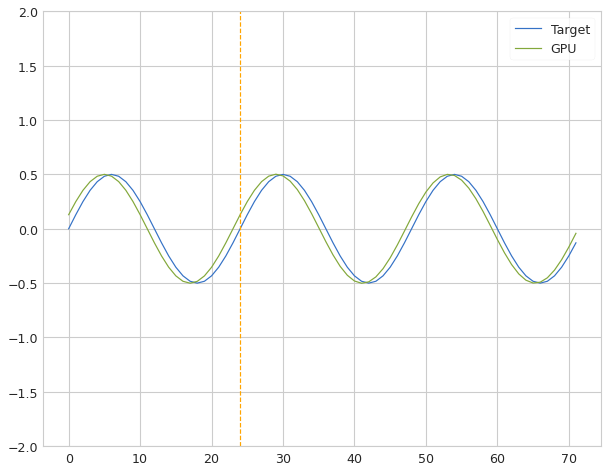

 Iter=56 a=0.764 sr=0.248 amp=0.233  ri=0.897 rr=3.716 loss=0.077947


Iter: 56 #### Diagnostic 0.078   Time 0.47  Best 0.078 NRMSE 0.078 CD 0.024
Iter: 57 #### Diagnostic 3.912   Time 0.07  Best 0.078 NRMSE 3.912 CD 0.063
Iter: 58 #### Diagnostic 0.093   Time 0.10  Best 0.078 NRMSE 0.093 CD 0.035
Iter: 59 #### Diagnostic 0.092   Time 0.12  Best 0.078 NRMSE 0.092 CD 0.034
Iter: 60 #### Diagnostic 0.092   Time 0.13  Best 0.078 NRMSE 0.092 CD 0.034
Iter: 61 #### Diagnostic 0.092   Time 0.14  Best 0.078 NRMSE 0.092 CD 0.034
Iter: 62 #### Diagnostic 0.092   Time 0.25  Best 0.078 NRMSE 0.092 CD 0.034
Iter: 63 #### Diagnostic 0.093   Time 0.15  Best 0.078 NRMSE 0.093 CD 0.034
Iter: 64 #### Diagnostic 0.093   Time 0.33  Best 0.078 NRMSE 0.093 CD 0.024
Iter: 65 #### Diagnostic 0.094   Time 0.15  Best 0.078 NRMSE 0.094 CD 0.035
Iter: 66 #### Diagnostic 14.361   Time 0.16  Best 0.078 NRMSE 14.361 CD 1.180
Iter: 67 #### Diagnostic 0.093   Time 0.16  Best 0.078 NRMSE 0.093 CD 0.034
Iter: 68 #### D

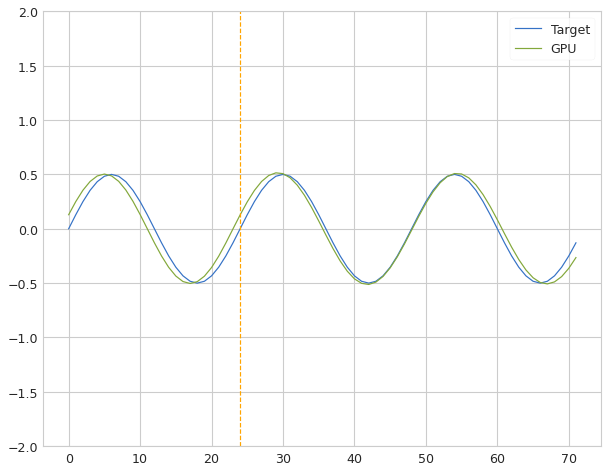

 Iter=85 a=0.889 sr=0.187 amp=0.095  ri=0.949 rr=1.347 loss=0.057661


Iter: 85 #### Diagnostic 0.058   Time 1.17  Best 0.058 NRMSE 0.058 CD 0.012
Iter: 86 #### Diagnostic 0.093   Time 0.22  Best 0.058 NRMSE 0.093 CD 0.034
Iter: 87 #### Diagnostic 0.092   Time 0.21  Best 0.058 NRMSE 0.092 CD 0.034
Iter: 88 #### Diagnostic 0.173   Time 0.23  Best 0.058 NRMSE 0.173 CD 0.122
Iter: 89 #### Diagnostic 0.093   Time 0.24  Best 0.058 NRMSE 0.093 CD 0.034
Iter: 90 #### Diagnostic 0.092   Time 0.19  Best 0.058 NRMSE 0.092 CD 0.034
Iter: 91 #### Diagnostic 0.093   Time 0.25  Best 0.058 NRMSE 0.093 CD 0.035
Iter: 92 #### Diagnostic 0.092   Time 0.25  Best 0.058 NRMSE 0.092 CD 0.034
Iter: 93 #### Diagnostic 0.092   Time 0.25  Best 0.058 NRMSE 0.092 CD 0.034
Iter: 94 #### Diagnostic 0.093   Time 0.21  Best 0.058 NRMSE 0.093 CD 0.035
Iter: 95 #### Diagnostic 0.089   Time 0.24  Best 0.058 NRMSE 0.089 CD 0.032
Iter: 96 #### Diagnostic 0.092   Time 0.32  Best 0.058 NRMSE 0.092 CD 0.034
Iter: 97 #### Dia

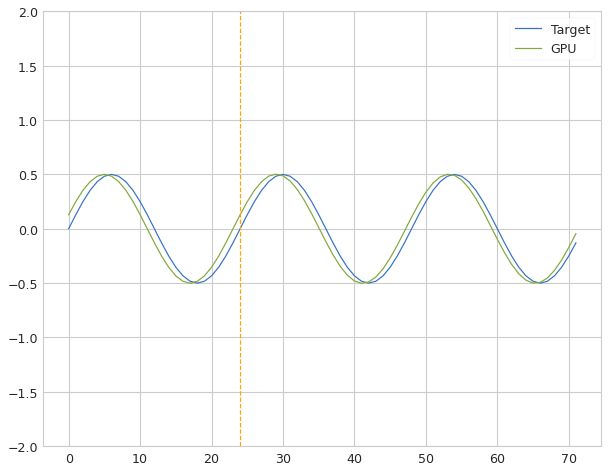

 Iter=63 a=0.930 sr=0.781 amp=0.302  ri=0.082 rr=0.453 loss=0.076925


Iter: 63 #### Diagnostic 0.077   Time 0.61  Best 0.077 NRMSE 0.077 CD 0.023
Iter: 64 #### Diagnostic 0.092   Time 0.16  Best 0.077 NRMSE 0.092 CD 0.034
Iter: 65 #### Diagnostic 0.093   Time 0.20  Best 0.077 NRMSE 0.093 CD 0.035
Iter: 66 #### Diagnostic 0.092   Time 0.09  Best 0.077 NRMSE 0.092 CD 0.034


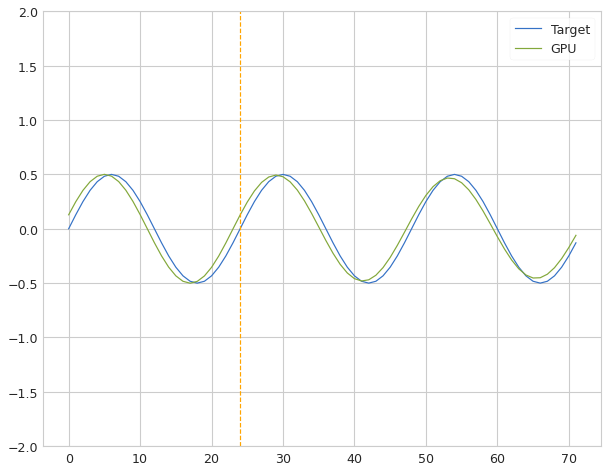

 Iter=67 a=0.901 sr=1.168 amp=0.195  ri=0.016 rr=2.257 loss=0.071773


Iter: 67 #### Diagnostic 0.072   Time 0.64  Best 0.072 NRMSE 0.072 CD 0.021
Iter: 68 #### Diagnostic 0.149   Time 0.25  Best 0.072 NRMSE 0.149 CD 0.039
Iter: 69 #### Diagnostic 0.093   Time 0.25  Best 0.072 NRMSE 0.093 CD 0.035
Iter: 70 #### Diagnostic 0.116   Time 0.22  Best 0.072 NRMSE 0.116 CD 0.055
Iter: 71 #### Diagnostic 0.092   Time 0.15  Best 0.072 NRMSE 0.092 CD 0.034
Iter: 72 #### Diagnostic 0.101   Time 0.15  Best 0.072 NRMSE 0.101 CD 0.041
Iter: 73 #### Diagnostic 0.462   Time 0.20  Best 0.072 NRMSE 0.462 CD 1.656
Iter: 74 #### Diagnostic 0.093   Time 0.14  Best 0.072 NRMSE 0.093 CD 0.035
Iter: 75 #### Diagnostic 0.093   Time 0.23  Best 0.072 NRMSE 0.093 CD 0.034
Iter: 76 #### Diagnostic 0.093   Time 0.15  Best 0.072 NRMSE 0.093 CD 0.034
Iter: 77 #### Diagnostic 0.092   Time 0.20  Best 0.072 NRMSE 0.092 CD 0.034
Iter: 78 #### Diagnostic 0.093   Time 0.16  Best 0.072 NRMSE 0.093 CD 0.034
Iter: 79 #### Dia

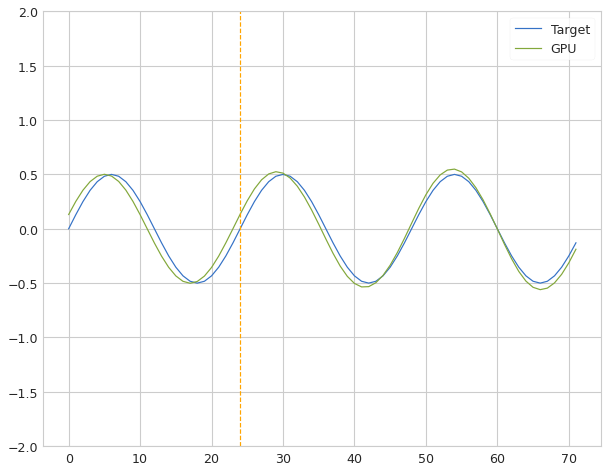

 Iter=30 a=0.979 sr=0.619 amp=0.086  ri=0.840 rr=0.572 loss=0.062551


Iter: 30 #### Diagnostic 0.063   Time 1.25  Best 0.063 NRMSE 0.063 CD 0.009
Iter: 31 #### Diagnostic 0.093   Time 0.21  Best 0.063 NRMSE 0.093 CD 0.034
Iter: 32 #### Diagnostic 0.091   Time 0.21  Best 0.063 NRMSE 0.091 CD 0.033
Iter: 33 #### Diagnostic 0.093   Time 0.20  Best 0.063 NRMSE 0.093 CD 0.035
Iter: 34 #### Diagnostic 0.106   Time 0.22  Best 0.063 NRMSE 0.106 CD 0.045
Iter: 35 #### Diagnostic 0.093   Time 0.11  Best 0.063 NRMSE 0.093 CD 0.034
Iter: 36 #### Diagnostic 0.092   Time 0.08  Best 0.063 NRMSE 0.092 CD 0.034
Iter: 37 #### Diagnostic 0.093   Time 0.07  Best 0.063 NRMSE 0.093 CD 0.035
Iter: 38 #### Diagnostic 0.092   Time 0.05  Best 0.063 NRMSE 0.092 CD 0.034
Iter: 39 #### Diagnostic 0.092   Time 0.06  Best 0.063 NRMSE 0.092 CD 0.034
Iter: 40 #### Diagnostic 0.092   Time 0.07  Best 0.063 NRMSE 0.092 CD 0.034
Iter: 41 #### Diagnostic 0.082   Time 0.10  Best 0.063 NRMSE 0.082 CD 0.027
Iter: 42 #### Dia

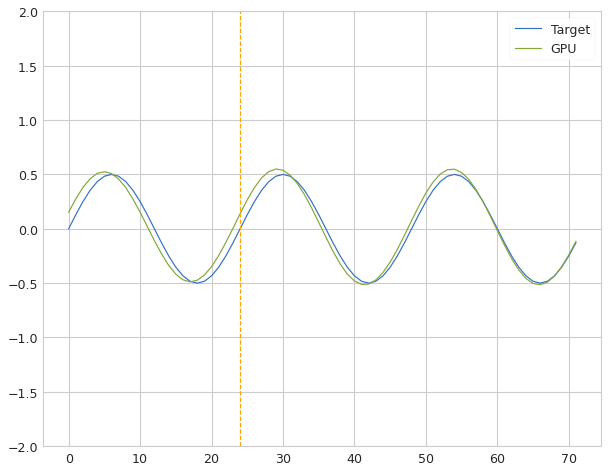

 Iter=43 a=0.904 sr=1.199 amp=0.984  ri=0.570 rr=3.478 loss=0.059223


Iter: 43 #### Diagnostic 0.059   Time 0.63  Best 0.059 NRMSE 0.059 CD 0.010
Iter: 44 #### Diagnostic 0.092   Time 0.17  Best 0.059 NRMSE 0.092 CD 0.034
Iter: 45 #### Diagnostic 0.092   Time 0.21  Best 0.059 NRMSE 0.092 CD 0.034
Iter: 46 #### Diagnostic 1.716   Time 0.16  Best 0.059 NRMSE 1.716 CD 0.026
Iter: 47 #### Diagnostic 0.097   Time 0.27  Best 0.059 NRMSE 0.097 CD 0.038
Iter: 48 #### Diagnostic 0.093   Time 0.21  Best 0.059 NRMSE 0.093 CD 0.034
Iter: 49 #### Diagnostic 0.092   Time 0.23  Best 0.059 NRMSE 0.092 CD 0.034
Iter: 50 #### Diagnostic 0.093   Time 0.18  Best 0.059 NRMSE 0.093 CD 0.034
Iter: 51 #### Diagnostic 6.740   Time 0.12  Best 0.059 NRMSE 6.740 CD 1.936
Iter: 52 #### Diagnostic 3.590   Time 0.16  Best 0.059 NRMSE 3.590 CD 1.464
Iter: 53 #### Diagnostic 0.093   Time 0.21  Best 0.059 NRMSE 0.093 CD 0.034
Iter: 54 #### Diagnostic 0.093   Time 0.09  Best 0.059 NRMSE 0.093 CD 0.035
Iter: 55 #### Dia

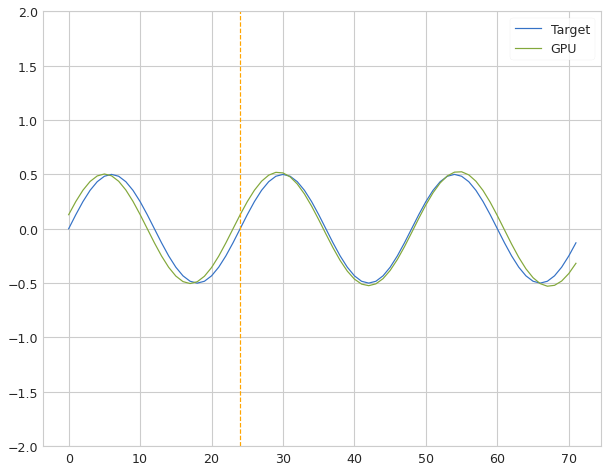

 Iter=4 a=0.921 sr=0.494 amp=0.191  ri=0.205 rr=4.320 loss=0.072962


Iter: 4 #### Diagnostic 0.073   Time 1.03  Best 0.073 NRMSE 0.073 CD 0.017
Iter: 5 #### Diagnostic 0.092   Time 0.16  Best 0.073 NRMSE 0.092 CD 0.034
Iter: 6 #### Diagnostic 0.092   Time 0.18  Best 0.073 NRMSE 0.092 CD 0.034
Iter: 7 #### Diagnostic 0.092   Time 0.20  Best 0.073 NRMSE 0.092 CD 0.034
Iter: 8 #### Diagnostic 0.086   Time 0.18  Best 0.073 NRMSE 0.086 CD 0.029
Iter: 9 #### Diagnostic 0.093   Time 0.19  Best 0.073 NRMSE 0.093 CD 0.035
Iter: 10 #### Diagnostic 0.099   Time 0.11  Best 0.073 NRMSE 0.099 CD 0.039
Iter: 11 #### Diagnostic 0.093   Time 0.23  Best 0.073 NRMSE 0.093 CD 0.034
Iter: 12 #### Diagnostic 0.092   Time 0.20  Best 0.073 NRMSE 0.092 CD 0.034
Iter: 13 #### Diagnostic 4.020   Time 0.17  Best 0.073 NRMSE 4.020 CD 1.931
Iter: 14 #### Diagnostic 0.092   Time 0.25  Best 0.073 NRMSE 0.092 CD 0.034
Iter: 15 #### Diagnostic 0.454   Time 0.15  Best 0.073 NRMSE 0.454 CD 0.078
Iter: 16 #### Diagnostic

Iter: 9 #### Diagnostic 0.093   Time 0.19  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 10 #### Diagnostic 0.087   Time 0.18  Best 1000.000 NRMSE 0.087 CD 0.028
Iter: 11 #### Diagnostic 0.092   Time 0.18  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 12 #### Diagnostic 0.103   Time 0.17  Best 1000.000 NRMSE 0.103 CD 0.043
Iter: 13 #### Diagnostic 0.093   Time 0.22  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 14 #### Diagnostic 0.092   Time 0.23  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 15 #### Diagnostic 0.092   Time 0.24  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 16 #### Diagnostic 0.092   Time 0.23  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 17 #### Diagnostic 0.092   Time 0.25  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 18 #### Diagnostic 0.092   Time 0.24  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 19 #### Diagnostic 0.350   Time 0.15  Best 1000.000 NRMSE 0.350 CD 0.066
Iter: 20 #### Diagnostic 0.092   Time 0.12  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 21 #### Diagnostic 0.095   Time 0.13  Best 1000

Iter: 11 #### Diagnostic 0.092   Time 0.07  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 12 #### Diagnostic 0.094   Time 0.18  Best 1000.000 NRMSE 0.094 CD 0.035
Iter: 13 #### Diagnostic 0.092   Time 0.20  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 14 #### Diagnostic 0.092   Time 0.16  Best 1000.000 NRMSE 0.092 CD 0.034


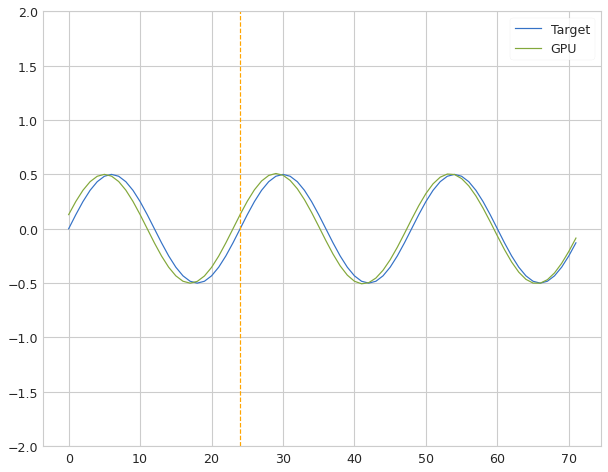

 Iter=15 a=0.926 sr=0.334 amp=0.177  ri=0.990 rr=3.464 loss=0.066112


Iter: 15 #### Diagnostic 0.066   Time 0.64  Best 0.066 NRMSE 0.066 CD 0.017
Iter: 16 #### Diagnostic 0.097   Time 0.12  Best 0.066 NRMSE 0.097 CD 0.038
Iter: 17 #### Diagnostic 0.093   Time 0.15  Best 0.066 NRMSE 0.093 CD 0.035
Iter: 18 #### Diagnostic 0.095   Time 0.18  Best 0.066 NRMSE 0.095 CD 0.036
Iter: 19 #### Diagnostic 0.094   Time 0.20  Best 0.066 NRMSE 0.094 CD 0.035
Iter: 20 #### Diagnostic 0.093   Time 0.11  Best 0.066 NRMSE 0.093 CD 0.034
Iter: 21 #### Diagnostic 0.092   Time 0.10  Best 0.066 NRMSE 0.092 CD 0.034
Iter: 22 #### Diagnostic 0.093   Time 0.11  Best 0.066 NRMSE 0.093 CD 0.034
Iter: 23 #### Diagnostic 0.092   Time 0.10  Best 0.066 NRMSE 0.092 CD 0.034
Iter: 24 #### Diagnostic 0.093   Time 0.25  Best 0.066 NRMSE 0.093 CD 0.035
Iter: 25 #### Diagnostic 0.100   Time 0.26  Best 0.066 NRMSE 0.100 CD 0.040
Iter: 26 #### Diagnostic 0.093   Time 0.25  Best 0.066 NRMSE 0.093 CD 0.034
Iter: 27 #### Dia

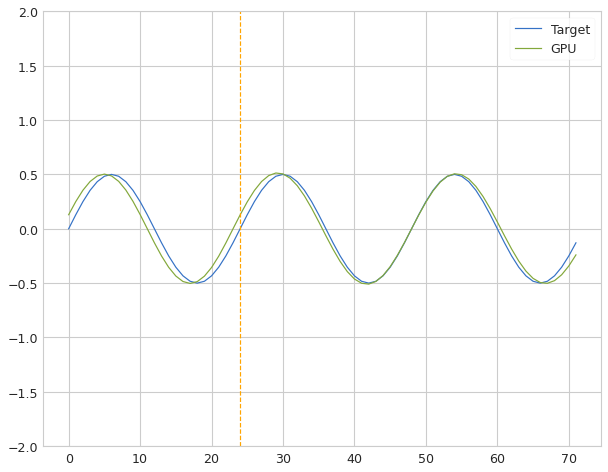

 Iter=72 a=0.889 sr=0.100 amp=0.221  ri=0.851 rr=4.421 loss=0.052092


Iter: 72 #### Diagnostic 0.052   Time 0.81  Best 0.052 NRMSE 0.052 CD 0.010
Iter: 73 #### Diagnostic 0.092   Time 0.18  Best 0.052 NRMSE 0.092 CD 0.034
Iter: 74 #### Diagnostic 0.092   Time 0.09  Best 0.052 NRMSE 0.092 CD 0.034
Iter: 75 #### Diagnostic 0.092   Time 0.12  Best 0.052 NRMSE 0.092 CD 0.034
Iter: 76 #### Diagnostic 0.093   Time 0.18  Best 0.052 NRMSE 0.093 CD 0.034
Iter: 77 #### Diagnostic 0.093   Time 0.26  Best 0.052 NRMSE 0.093 CD 0.034
Iter: 78 #### Diagnostic 0.092   Time 0.23  Best 0.052 NRMSE 0.092 CD 0.034
Iter: 79 #### Diagnostic 0.094   Time 0.22  Best 0.052 NRMSE 0.094 CD 0.035
Iter: 80 #### Diagnostic 0.092   Time 0.14  Best 0.052 NRMSE 0.092 CD 0.034
Iter: 81 #### Diagnostic 0.094   Time 0.11  Best 0.052 NRMSE 0.094 CD 0.035
Iter: 82 #### Diagnostic 0.441   Time 0.11  Best 0.052 NRMSE 0.441 CD 0.078
Iter: 83 #### Diagnostic 0.093   Time 0.05  Best 0.052 NRMSE 0.093 CD 0.034
Iter: 84 #### Dia

Iter: 75 #### Diagnostic 0.090   Time 0.20  Best 1000.000 NRMSE 0.090 CD 0.033
Iter: 76 #### Diagnostic 0.093   Time 0.21  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 77 #### Diagnostic 0.092   Time 0.21  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 78 #### Diagnostic 0.093   Time 0.22  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 79 #### Diagnostic 0.093   Time 0.21  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 80 #### Diagnostic 0.083   Time 0.29  Best 1000.000 NRMSE 0.083 CD 0.027
Iter: 81 #### Diagnostic 0.092   Time 0.18  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 82 #### Diagnostic 0.092   Time 0.23  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 83 #### Diagnostic 0.095   Time 0.20  Best 1000.000 NRMSE 0.095 CD 0.036
Iter: 84 #### Diagnostic 0.091   Time 0.13  Best 1000.000 NRMSE 0.091 CD 0.033
Iter: 85 #### Diagnostic 13.932   Time 0.13  Best 1000.000 NRMSE 13.932 CD 1.175
Iter: 86 #### Diagnostic 0.122   Time 0.08  Best 1000.000 NRMSE 0.122 CD 0.061
Iter: 87 #### Diagnostic 0.088   Time 0.12  Best 1

Iter: 77 #### Diagnostic 0.092   Time 0.15  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 78 #### Diagnostic 0.090   Time 0.19  Best 1000.000 NRMSE 0.090 CD 0.032
Iter: 79 #### Diagnostic 0.092   Time 0.19  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 80 #### Diagnostic 0.093   Time 0.21  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 81 #### Diagnostic 0.092   Time 0.20  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 82 #### Diagnostic 0.092   Time 0.19  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 83 #### Diagnostic 0.417   Time 0.21  Best 1000.000 NRMSE 0.417 CD 0.025
Iter: 84 #### Diagnostic 0.092   Time 0.16  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 85 #### Diagnostic 0.092   Time 0.18  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 86 #### Diagnostic 0.263   Time 0.18  Best 1000.000 NRMSE 0.263 CD 0.062
Iter: 87 #### Diagnostic 0.093   Time 0.22  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 88 #### Diagnostic 0.093   Time 0.17  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 89 #### Diagnostic 0.092   Time 0.24  Best 100

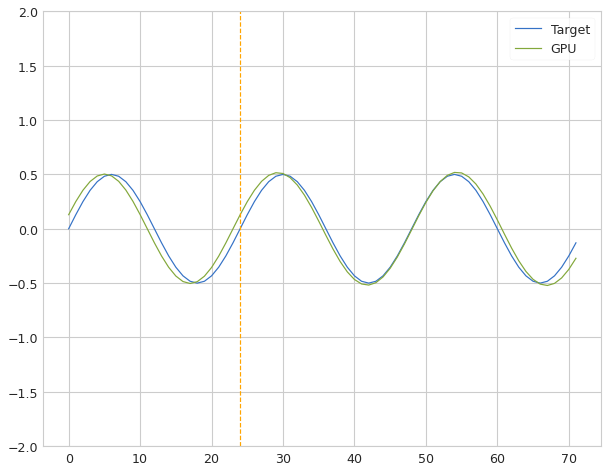

 Iter=4 a=0.921 sr=0.494 amp=0.191  ri=0.205 rr=4.320 loss=0.059458


Iter: 4 #### Diagnostic 0.059   Time 0.60  Best 0.059 NRMSE 0.059 CD 0.011
Iter: 5 #### Diagnostic 0.092   Time 0.16  Best 0.059 NRMSE 0.092 CD 0.034
Iter: 6 #### Diagnostic 0.092   Time 0.14  Best 0.059 NRMSE 0.092 CD 0.034
Iter: 7 #### Diagnostic 0.092   Time 0.38  Best 0.059 NRMSE 0.092 CD 0.034
Iter: 8 #### Diagnostic 0.087   Time 0.26  Best 0.059 NRMSE 0.087 CD 0.023
Iter: 9 #### Diagnostic 0.094   Time 0.22  Best 0.059 NRMSE 0.094 CD 0.035
Iter: 10 #### Diagnostic 0.284   Time 0.19  Best 0.059 NRMSE 0.284 CD 0.177
Iter: 11 #### Diagnostic 0.093   Time 0.21  Best 0.059 NRMSE 0.093 CD 0.034
Iter: 12 #### Diagnostic 0.092   Time 0.22  Best 0.059 NRMSE 0.092 CD 0.034
Iter: 13 #### Diagnostic 0.499   Time 0.25  Best 0.059 NRMSE 0.499 CD 1.536
Iter: 14 #### Diagnostic 0.092   Time 0.17  Best 0.059 NRMSE 0.092 CD 0.034
Iter: 15 #### Diagnostic 0.853   Time 0.30  Best 0.059 NRMSE 0.853 CD 0.094
Iter: 16 #### Diagnostic

Iter: 11 #### Diagnostic 0.092   Time 0.10  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 12 #### Diagnostic 0.087   Time 0.10  Best 1000.000 NRMSE 0.087 CD 0.030
Iter: 13 #### Diagnostic 0.093   Time 0.09  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 14 #### Diagnostic 0.092   Time 0.22  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 15 #### Diagnostic 0.092   Time 0.20  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 16 #### Diagnostic 0.092   Time 0.18  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 17 #### Diagnostic 0.092   Time 0.18  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 18 #### Diagnostic 0.092   Time 0.08  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 19 #### Diagnostic 0.270   Time 0.06  Best 1000.000 NRMSE 0.270 CD 0.096
Iter: 20 #### Diagnostic 0.092   Time 0.06  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 21 #### Diagnostic 0.092   Time 0.05  Best 1000.000 NRMSE 0.092 CD 0.033
Iter: 22 #### Diagnostic 0.095   Time 0.16  Best 1000.000 NRMSE 0.095 CD 0.036
Iter: 23 #### Diagnostic 0.093   Time 0.17  Best 100

Iter: 13 #### Diagnostic 0.092   Time 0.15  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 14 #### Diagnostic 0.092   Time 0.14  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 15 #### Diagnostic 0.125   Time 0.10  Best 1000.000 NRMSE 0.125 CD 0.063
Iter: 16 #### Diagnostic 0.097   Time 0.09  Best 1000.000 NRMSE 0.097 CD 0.038
Iter: 17 #### Diagnostic 0.093   Time 0.10  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 18 #### Diagnostic 0.093   Time 0.09  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 19 #### Diagnostic 0.094   Time 0.11  Best 1000.000 NRMSE 0.094 CD 0.035
Iter: 20 #### Diagnostic 0.092   Time 0.10  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 21 #### Diagnostic 0.092   Time 0.15  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 22 #### Diagnostic 0.093   Time 0.16  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 23 #### Diagnostic 0.092   Time 0.14  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 24 #### Diagnostic 0.092   Time 0.13  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 25 #### Diagnostic 0.090   Time 0.14  Best 100

Iter: 15 #### Diagnostic 0.092   Time 0.22  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 16 #### Diagnostic 0.204   Time 0.21  Best 1000.000 NRMSE 0.204 CD 0.092
Iter: 17 #### Diagnostic 0.092   Time 0.29  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 18 #### Diagnostic 0.084   Time 0.29  Best 1000.000 NRMSE 0.084 CD 0.028
Iter: 19 #### Diagnostic 0.094   Time 0.18  Best 1000.000 NRMSE 0.094 CD 0.035
Iter: 20 #### Diagnostic 0.092   Time 0.22  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 21 #### Diagnostic 0.092   Time 0.22  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 22 #### Diagnostic 0.093   Time 0.19  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 23 #### Diagnostic 0.090   Time 0.09  Best 1000.000 NRMSE 0.090 CD 0.032
Iter: 24 #### Diagnostic 0.094   Time 0.09  Best 1000.000 NRMSE 0.094 CD 0.035
Iter: 25 #### Diagnostic 0.093   Time 0.24  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 26 #### Diagnostic 0.090   Time 0.20  Best 1000.000 NRMSE 0.090 CD 0.033
Iter: 27 #### Diagnostic 0.092   Time 0.20  Best 100

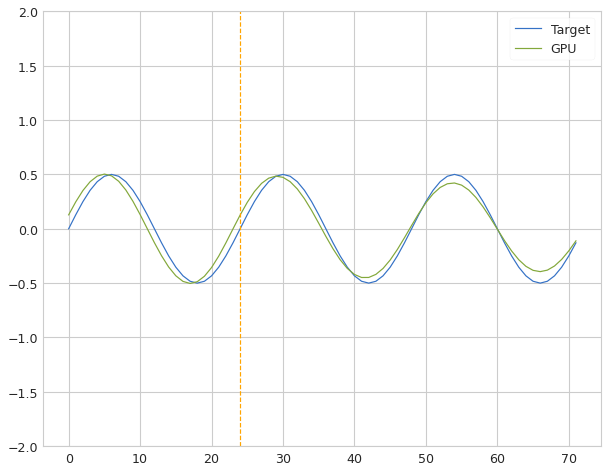

 Iter=37 a=0.953 sr=0.070 amp=0.298  ri=0.653 rr=4.602 loss=0.064459


Iter: 37 #### Diagnostic 0.064   Time 0.67  Best 0.064 NRMSE 0.064 CD 0.012
Iter: 38 #### Diagnostic 2.377   Time 0.31  Best 0.064 NRMSE 2.377 CD 1.965
Iter: 39 #### Diagnostic 0.091   Time 0.12  Best 0.064 NRMSE 0.091 CD 0.033
Iter: 40 #### Diagnostic 0.092   Time 0.15  Best 0.064 NRMSE 0.092 CD 0.034
Iter: 41 #### Diagnostic 0.092   Time 0.21  Best 0.064 NRMSE 0.092 CD 0.033
Iter: 42 #### Diagnostic 0.093   Time 0.22  Best 0.064 NRMSE 0.093 CD 0.035
Iter: 43 #### Diagnostic 0.093   Time 0.13  Best 0.064 NRMSE 0.093 CD 0.034
Iter: 44 #### Diagnostic 0.094   Time 0.18  Best 0.064 NRMSE 0.094 CD 0.035
Iter: 45 #### Diagnostic 0.093   Time 0.21  Best 0.064 NRMSE 0.093 CD 0.034
Iter: 46 #### Diagnostic 0.092   Time 0.21  Best 0.064 NRMSE 0.092 CD 0.034
Iter: 47 #### Diagnostic 0.092   Time 0.22  Best 0.064 NRMSE 0.092 CD 0.034
Iter: 48 #### Diagnostic 0.092   Time 0.26  Best 0.064 NRMSE 0.092 CD 0.034
Iter: 49 #### Dia

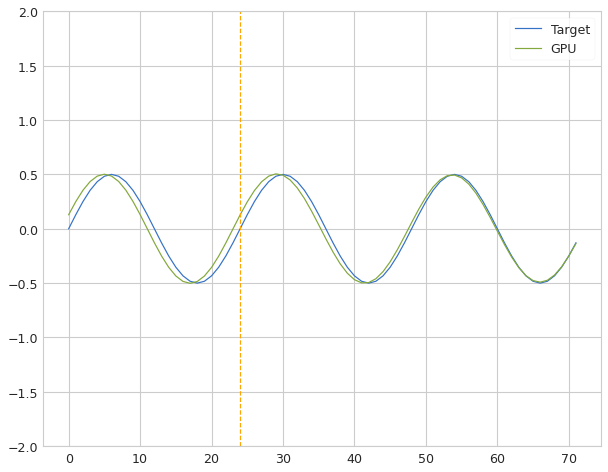

 Iter=56 a=0.816 sr=0.061 amp=0.053  ri=0.096 rr=0.347 loss=0.051191


Iter: 56 #### Diagnostic 0.051   Time 0.58  Best 0.051 NRMSE 0.051 CD 0.010
Iter: 57 #### Diagnostic 0.092   Time 0.07  Best 0.051 NRMSE 0.092 CD 0.034
Iter: 58 #### Diagnostic 0.092   Time 0.09  Best 0.051 NRMSE 0.092 CD 0.034
Iter: 59 #### Diagnostic 0.093   Time 0.09  Best 0.051 NRMSE 0.093 CD 0.035
Iter: 60 #### Diagnostic 0.143   Time 0.05  Best 0.051 NRMSE 0.143 CD 0.048
Iter: 61 #### Diagnostic 0.278   Time 0.06  Best 0.051 NRMSE 0.278 CD 0.054
Iter: 62 #### Diagnostic 0.088   Time 0.14  Best 0.051 NRMSE 0.088 CD 0.031
Iter: 63 #### Diagnostic 0.080   Time 0.15  Best 0.051 NRMSE 0.080 CD 0.026
Iter: 64 #### Diagnostic 0.092   Time 0.12  Best 0.051 NRMSE 0.092 CD 0.034
Iter: 65 #### Diagnostic 0.093   Time 0.09  Best 0.051 NRMSE 0.093 CD 0.034
Iter: 66 #### Diagnostic 0.092   Time 0.09  Best 0.051 NRMSE 0.092 CD 0.034
Iter: 67 #### Diagnostic 0.158   Time 0.14  Best 0.051 NRMSE 0.158 CD 0.101
Iter: 68 #### Dia

Iter: 59 #### Diagnostic 0.092   Time 0.15  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 60 #### Diagnostic 0.093   Time 0.29  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 61 #### Diagnostic 0.093   Time 0.27  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 62 #### Diagnostic 14.757   Time 0.17  Best 1000.000 NRMSE 14.757 CD 0.063
Iter: 63 #### Diagnostic 0.092   Time 0.14  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 64 #### Diagnostic 5.404   Time 0.17  Best 1000.000 NRMSE 5.404 CD 0.822
Iter: 65 #### Diagnostic 0.439   Time 0.15  Best 1000.000 NRMSE 0.439 CD 1.059
Iter: 66 #### Diagnostic 0.094   Time 0.14  Best 1000.000 NRMSE 0.094 CD 0.035
Iter: 67 #### Diagnostic 0.091   Time 0.13  Best 1000.000 NRMSE 0.091 CD 0.033
Iter: 68 #### Diagnostic 0.092   Time 0.18  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 69 #### Diagnostic 0.093   Time 0.21  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 70 #### Diagnostic 0.094   Time 0.14  Best 1000.000 NRMSE 0.094 CD 0.035
Iter: 71 #### Diagnostic 0.092   Time 0.16  Best 1

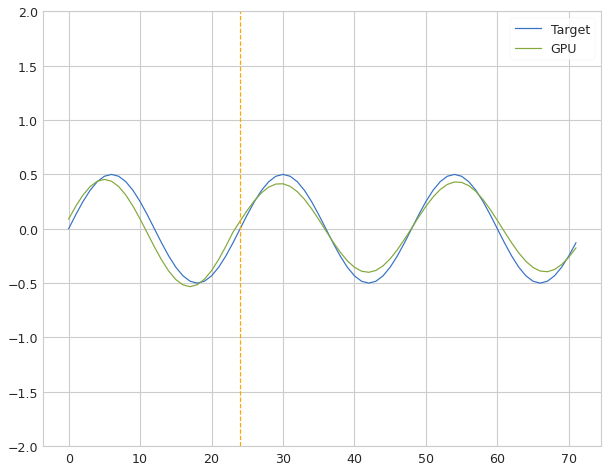

 Iter=3 a=0.673 sr=1.164 amp=0.989  ri=0.778 rr=0.127 loss=0.071929


Iter: 3 #### Diagnostic 0.072   Time 0.95  Best 0.072 NRMSE 0.072 CD 0.008
Iter: 4 #### Diagnostic 0.085   Time 0.25  Best 0.072 NRMSE 0.085 CD 0.023
Iter: 5 #### Diagnostic 0.092   Time 0.18  Best 0.072 NRMSE 0.092 CD 0.034
Iter: 6 #### Diagnostic 0.092   Time 0.21  Best 0.072 NRMSE 0.092 CD 0.034
Iter: 7 #### Diagnostic 0.092   Time 0.20  Best 0.072 NRMSE 0.092 CD 0.034
Iter: 8 #### Diagnostic 0.113   Time 0.10  Best 0.072 NRMSE 0.113 CD 0.041
Iter: 9 #### Diagnostic 0.091   Time 0.17  Best 0.072 NRMSE 0.091 CD 0.033
Iter: 10 #### Diagnostic 0.123   Time 0.06  Best 0.072 NRMSE 0.123 CD 0.035
Iter: 11 #### Diagnostic 0.093   Time 0.12  Best 0.072 NRMSE 0.093 CD 0.035
Iter: 12 #### Diagnostic 0.092   Time 0.18  Best 0.072 NRMSE 0.092 CD 0.034
Iter: 13 #### Diagnostic 1.053   Time 0.20  Best 0.072 NRMSE 1.053 CD 0.094
Iter: 14 #### Diagnostic 0.093   Time 0.24  Best 0.072 NRMSE 0.093 CD 0.035
Iter: 15 #### Diagnostic 

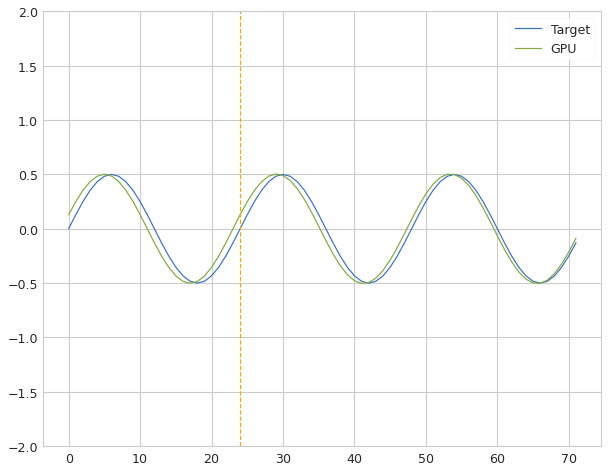

 Iter=2 a=0.574 sr=0.695 amp=0.006  ri=0.607 rr=3.525 loss=0.064011


Iter: 2 #### Diagnostic 0.064   Time 0.68  Best 0.064 NRMSE 0.064 CD 0.016
Iter: 3 #### Diagnostic 0.093   Time 0.21  Best 0.064 NRMSE 0.093 CD 0.034
Iter: 4 #### Diagnostic 0.092   Time 0.20  Best 0.064 NRMSE 0.092 CD 0.034
Iter: 5 #### Diagnostic 0.092   Time 0.21  Best 0.064 NRMSE 0.092 CD 0.034
Iter: 6 #### Diagnostic 0.092   Time 0.23  Best 0.064 NRMSE 0.092 CD 0.034
Iter: 7 #### Diagnostic 0.093   Time 0.08  Best 0.064 NRMSE 0.093 CD 0.034
Iter: 8 #### Diagnostic 0.093   Time 0.15  Best 0.064 NRMSE 0.093 CD 0.034
Iter: 9 #### Diagnostic 0.093   Time 0.15  Best 0.064 NRMSE 0.093 CD 0.034
Iter: 10 #### Diagnostic 0.094   Time 0.13  Best 0.064 NRMSE 0.094 CD 0.026
Iter: 11 #### Diagnostic 0.092   Time 0.10  Best 0.064 NRMSE 0.092 CD 0.034
Iter: 12 #### Diagnostic 0.115   Time 0.10  Best 0.064 NRMSE 0.115 CD 0.054
Iter: 13 #### Diagnostic 0.093   Time 0.20  Best 0.064 NRMSE 0.093 CD 0.034
Iter: 14 #### Diagnostic 0

Iter: 7 #### Diagnostic 0.093   Time 0.06  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 8 #### Diagnostic 0.092   Time 0.09  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 9 #### Diagnostic 0.092   Time 0.09  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 10 #### Diagnostic 0.100   Time 0.19  Best 1000.000 NRMSE 0.100 CD 0.040
Iter: 11 #### Diagnostic 0.093   Time 0.15  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 12 #### Diagnostic 0.092   Time 0.18  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 13 #### Diagnostic 0.092   Time 0.14  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 14 #### Diagnostic 0.091   Time 0.15  Best 1000.000 NRMSE 0.091 CD 0.033
Iter: 15 #### Diagnostic 0.128   Time 0.25  Best 1000.000 NRMSE 0.128 CD 0.067
Iter: 16 #### Diagnostic 0.096   Time 0.25  Best 1000.000 NRMSE 0.096 CD 0.037
Iter: 17 #### Diagnostic 0.093   Time 0.21  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 18 #### Diagnostic 0.091   Time 0.19  Best 1000.000 NRMSE 0.091 CD 0.033
Iter: 19 #### Diagnostic 0.094   Time 0.17  Best 1000.0

Iter: 10 #### Diagnostic 0.092   Time 0.18  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 11 #### Diagnostic 0.092   Time 0.21  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 12 #### Diagnostic 0.092   Time 0.07  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 13 #### Diagnostic 0.090   Time 0.13  Best 1000.000 NRMSE 0.090 CD 0.033
Iter: 14 #### Diagnostic 0.096   Time 0.23  Best 1000.000 NRMSE 0.096 CD 0.036
Iter: 15 #### Diagnostic 0.092   Time 0.32  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 16 #### Diagnostic 0.162   Time 0.25  Best 1000.000 NRMSE 0.162 CD 0.042
Iter: 17 #### Diagnostic 0.092   Time 0.14  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 18 #### Diagnostic 0.086   Time 0.09  Best 1000.000 NRMSE 0.086 CD 0.030
Iter: 19 #### Diagnostic 0.093   Time 0.10  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 20 #### Diagnostic 0.092   Time 0.09  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 21 #### Diagnostic 0.092   Time 0.10  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 22 #### Diagnostic 0.092   Time 0.16  Best 100

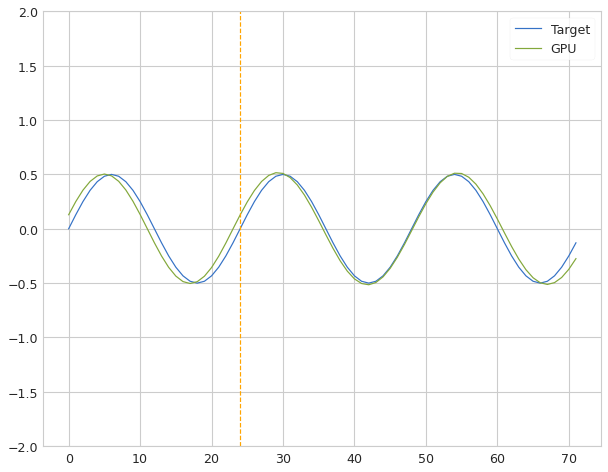

 Iter=56 a=0.816 sr=0.061 amp=0.053  ri=0.096 rr=0.347 loss=0.060234


Iter: 56 #### Diagnostic 0.060   Time 0.99  Best 0.060 NRMSE 0.060 CD 0.013
Iter: 57 #### Diagnostic 0.092   Time 0.22  Best 0.060 NRMSE 0.092 CD 0.034
Iter: 58 #### Diagnostic 0.092   Time 0.21  Best 0.060 NRMSE 0.092 CD 0.034
Iter: 59 #### Diagnostic 0.092   Time 0.10  Best 0.060 NRMSE 0.092 CD 0.034
Iter: 60 #### Diagnostic 0.102   Time 0.06  Best 0.060 NRMSE 0.102 CD 0.014
Iter: 61 #### Diagnostic 0.252   Time 0.06  Best 0.060 NRMSE 0.252 CD 0.070
Iter: 62 #### Diagnostic 0.080   Time 0.07  Best 0.060 NRMSE 0.080 CD 0.026
Iter: 63 #### Diagnostic 0.088   Time 0.07  Best 0.060 NRMSE 0.088 CD 0.031
Iter: 64 #### Diagnostic 0.096   Time 0.06  Best 0.060 NRMSE 0.096 CD 0.036
Iter: 65 #### Diagnostic 0.093   Time 0.07  Best 0.060 NRMSE 0.093 CD 0.035
Iter: 66 #### Diagnostic 0.092   Time 0.07  Best 0.060 NRMSE 0.092 CD 0.034
Iter: 67 #### Diagnostic 0.391   Time 0.06  Best 0.060 NRMSE 0.391 CD 0.765
Iter: 68 #### Dia

Iter: 59 #### Diagnostic 0.092   Time 0.21  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 60 #### Diagnostic 0.093   Time 0.19  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 61 #### Diagnostic 0.093   Time 0.15  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 62 #### Diagnostic 10.532   Time 0.14  Best 1000.000 NRMSE 10.532 CD 0.029
Iter: 63 #### Diagnostic 0.092   Time 0.09  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 64 #### Diagnostic 3.984   Time 0.06  Best 1000.000 NRMSE 3.984 CD 0.483
Iter: 65 #### Diagnostic 0.402   Time 0.05  Best 1000.000 NRMSE 0.402 CD 0.804
Iter: 66 #### Diagnostic 0.093   Time 0.05  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 67 #### Diagnostic 0.092   Time 0.05  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 68 #### Diagnostic 0.091   Time 0.05  Best 1000.000 NRMSE 0.091 CD 0.034
Iter: 69 #### Diagnostic 0.093   Time 0.05  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 70 #### Diagnostic 0.094   Time 0.05  Best 1000.000 NRMSE 0.094 CD 0.035
Iter: 71 #### Diagnostic 0.092   Time 0.06  Best 1

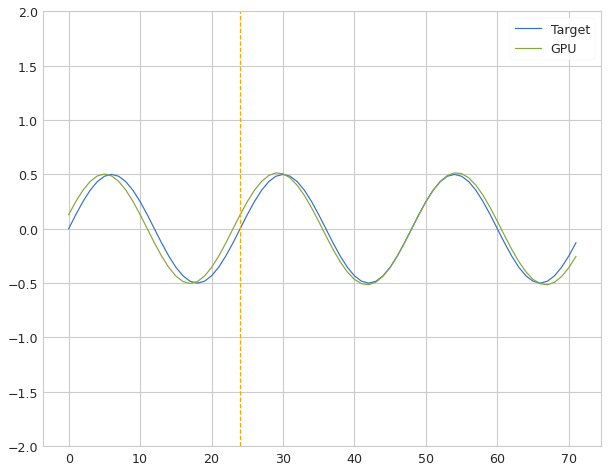

 Iter=4 a=0.921 sr=0.494 amp=0.191  ri=0.205 rr=4.320 loss=0.055272


Iter: 4 #### Diagnostic 0.055   Time 0.91  Best 0.055 NRMSE 0.055 CD 0.010
Iter: 5 #### Diagnostic 0.092   Time 0.06  Best 0.055 NRMSE 0.092 CD 0.034
Iter: 6 #### Diagnostic 0.092   Time 0.10  Best 0.055 NRMSE 0.092 CD 0.034
Iter: 7 #### Diagnostic 0.092   Time 0.14  Best 0.055 NRMSE 0.092 CD 0.034
Iter: 8 #### Diagnostic 0.240   Time 0.13  Best 0.055 NRMSE 0.240 CD 0.060
Iter: 9 #### Diagnostic 0.092   Time 0.14  Best 0.055 NRMSE 0.092 CD 0.034
Iter: 10 #### Diagnostic 0.348   Time 0.14  Best 0.055 NRMSE 0.348 CD 0.806
Iter: 11 #### Diagnostic 0.093   Time 0.09  Best 0.055 NRMSE 0.093 CD 0.035
Iter: 12 #### Diagnostic 0.092   Time 0.08  Best 0.055 NRMSE 0.092 CD 0.034
Iter: 13 #### Diagnostic 9.564   Time 0.08  Best 0.055 NRMSE 9.564 CD 0.114
Iter: 14 #### Diagnostic 0.091   Time 0.14  Best 0.055 NRMSE 0.091 CD 0.033
Iter: 15 #### Diagnostic 0.132   Time 0.12  Best 0.055 NRMSE 0.132 CD 0.042
Iter: 16 #### Diagnostic

Iter: 11 #### Diagnostic 0.093   Time 0.08  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 12 #### Diagnostic 0.110   Time 0.10  Best 1000.000 NRMSE 0.110 CD 0.049
Iter: 13 #### Diagnostic 0.093   Time 0.07  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 14 #### Diagnostic 0.092   Time 0.09  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 15 #### Diagnostic 0.092   Time 0.08  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 16 #### Diagnostic 0.092   Time 0.09  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 17 #### Diagnostic 0.092   Time 0.10  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 18 #### Diagnostic 0.092   Time 0.11  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 19 #### Diagnostic 0.426   Time 0.16  Best 1000.000 NRMSE 0.426 CD 1.615
Iter: 20 #### Diagnostic 0.093   Time 0.08  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 21 #### Diagnostic 0.093   Time 0.08  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 22 #### Diagnostic 0.095   Time 0.07  Best 1000.000 NRMSE 0.095 CD 0.037
Iter: 23 #### Diagnostic 0.093   Time 0.07  Best 100

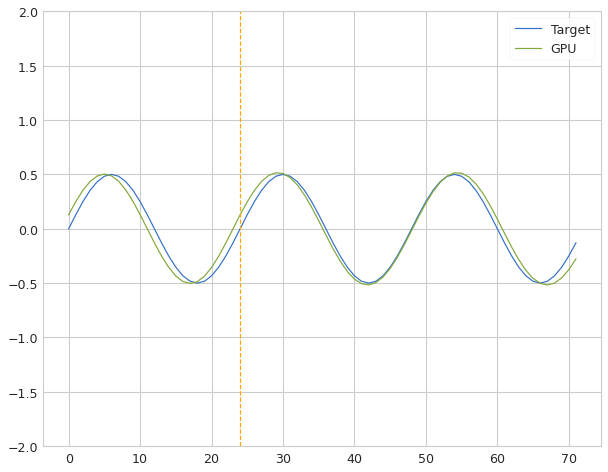

 Iter=85 a=0.917 sr=0.416 amp=0.193  ri=0.212 rr=0.739 loss=0.060742


Iter: 85 #### Diagnostic 0.061   Time 0.79  Best 0.061 NRMSE 0.061 CD 0.012
Iter: 86 #### Diagnostic 0.092   Time 0.04  Best 0.061 NRMSE 0.092 CD 0.034
Iter: 87 #### Diagnostic 0.092   Time 0.06  Best 0.061 NRMSE 0.092 CD 0.034
Iter: 88 #### Diagnostic 0.092   Time 0.06  Best 0.061 NRMSE 0.092 CD 0.034
Iter: 89 #### Diagnostic 0.092   Time 0.11  Best 0.061 NRMSE 0.092 CD 0.034
Iter: 90 #### Diagnostic 0.114   Time 0.10  Best 0.061 NRMSE 0.114 CD 0.053
Iter: 91 #### Diagnostic 0.091   Time 0.10  Best 0.061 NRMSE 0.091 CD 0.033
Iter: 92 #### Diagnostic 0.092   Time 0.10  Best 0.061 NRMSE 0.092 CD 0.034
Iter: 93 #### Diagnostic 0.093   Time 0.15  Best 0.061 NRMSE 0.093 CD 0.034
Iter: 94 #### Diagnostic 0.092   Time 0.18  Best 0.061 NRMSE 0.092 CD 0.034
Iter: 95 #### Diagnostic 0.092   Time 0.17  Best 0.061 NRMSE 0.092 CD 0.034
Iter: 96 #### Diagnostic 0.094   Time 0.14  Best 0.061 NRMSE 0.094 CD 0.035
Iter: 97 #### Dia

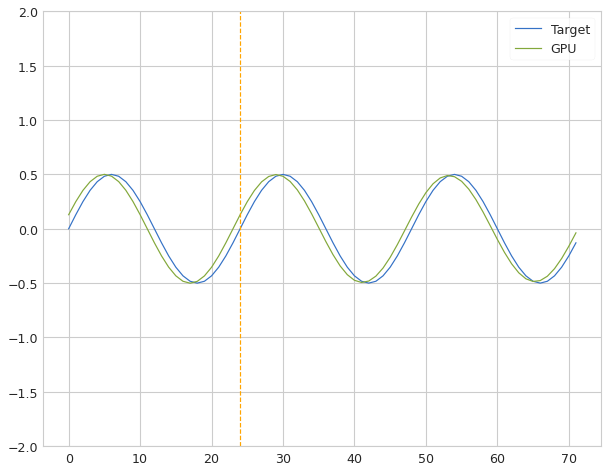

 Iter=72 a=0.889 sr=0.100 amp=0.221  ri=0.851 rr=4.421 loss=0.078591


Iter: 72 #### Diagnostic 0.079   Time 0.45  Best 0.079 NRMSE 0.079 CD 0.025
Iter: 73 #### Diagnostic 0.092   Time 0.04  Best 0.079 NRMSE 0.092 CD 0.034
Iter: 74 #### Diagnostic 0.092   Time 0.03  Best 0.079 NRMSE 0.092 CD 0.034
Iter: 75 #### Diagnostic 0.093   Time 0.03  Best 0.079 NRMSE 0.093 CD 0.034
Iter: 76 #### Diagnostic 0.107   Time 0.03  Best 0.079 NRMSE 0.107 CD 0.046
Iter: 77 #### Diagnostic 0.093   Time 0.03  Best 0.079 NRMSE 0.093 CD 0.034
Iter: 78 #### Diagnostic 0.092   Time 0.03  Best 0.079 NRMSE 0.092 CD 0.034
Iter: 79 #### Diagnostic 0.092   Time 0.03  Best 0.079 NRMSE 0.092 CD 0.034
Iter: 80 #### Diagnostic 0.092   Time 0.03  Best 0.079 NRMSE 0.092 CD 0.034
Iter: 81 #### Diagnostic 0.093   Time 0.03  Best 0.079 NRMSE 0.093 CD 0.035
Iter: 82 #### Diagnostic 0.432   Time 0.03  Best 0.079 NRMSE 0.432 CD 0.081
Iter: 83 #### Diagnostic 0.093   Time 0.03  Best 0.079 NRMSE 0.093 CD 0.035
Iter: 84 #### Dia

Iter: 76 #### Diagnostic 0.093   Time 0.10  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 77 #### Diagnostic 0.092   Time 0.03  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 78 #### Diagnostic 0.093   Time 0.06  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 79 #### Diagnostic 0.094   Time 0.03  Best 1000.000 NRMSE 0.094 CD 0.035
Iter: 80 #### Diagnostic 0.101   Time 0.03  Best 1000.000 NRMSE 0.101 CD 0.040
Iter: 81 #### Diagnostic 0.093   Time 0.03  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 82 #### Diagnostic 0.094   Time 0.04  Best 1000.000 NRMSE 0.094 CD 0.036
Iter: 83 #### Diagnostic 0.090   Time 0.03  Best 1000.000 NRMSE 0.090 CD 0.032
Iter: 84 #### Diagnostic 0.090   Time 0.03  Best 1000.000 NRMSE 0.090 CD 0.032
Iter: 85 #### Diagnostic 48.940   Time 0.03  Best 1000.000 NRMSE 48.940 CD 0.796
Iter: 86 #### Diagnostic 0.176   Time 0.04  Best 1000.000 NRMSE 0.176 CD 0.127
Iter: 87 #### Diagnostic 0.091   Time 0.03  Best 1000.000 NRMSE 0.091 CD 0.033
Iter: 88 #### Diagnostic 0.093   Time 0.04  Best 1

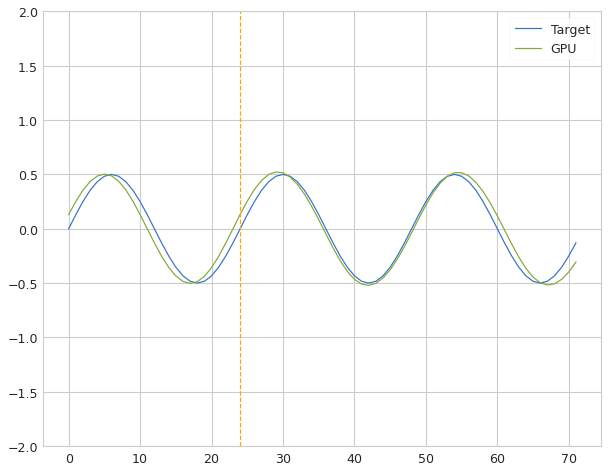

 Iter=30 a=0.979 sr=0.619 amp=0.086  ri=0.840 rr=0.572 loss=0.070713


Iter: 30 #### Diagnostic 0.071   Time 0.77  Best 0.071 NRMSE 0.071 CD 0.017
Iter: 31 #### Diagnostic 0.093   Time 0.07  Best 0.071 NRMSE 0.093 CD 0.034
Iter: 32 #### Diagnostic 0.091   Time 0.04  Best 0.071 NRMSE 0.091 CD 0.033
Iter: 33 #### Diagnostic 0.092   Time 0.08  Best 0.071 NRMSE 0.092 CD 0.034
Iter: 34 #### Diagnostic 0.073   Time 0.06  Best 0.071 NRMSE 0.073 CD 0.022
Iter: 35 #### Diagnostic 0.092   Time 0.09  Best 0.071 NRMSE 0.092 CD 0.034
Iter: 36 #### Diagnostic 0.092   Time 0.10  Best 0.071 NRMSE 0.092 CD 0.034
Iter: 37 #### Diagnostic 0.093   Time 0.10  Best 0.071 NRMSE 0.093 CD 0.034
Iter: 38 #### Diagnostic 0.092   Time 0.10  Best 0.071 NRMSE 0.092 CD 0.034
Iter: 39 #### Diagnostic 0.092   Time 0.11  Best 0.071 NRMSE 0.092 CD 0.034
Iter: 40 #### Diagnostic 0.093   Time 0.10  Best 0.071 NRMSE 0.093 CD 0.034
Iter: 41 #### Diagnostic 0.088   Time 0.08  Best 0.071 NRMSE 0.088 CD 0.031
Iter: 42 #### Dia

Iter: 28 #### Diagnostic 0.092   Time 0.03  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 29 #### Diagnostic 0.370   Time 0.04  Best 1000.000 NRMSE 0.370 CD 1.105
Iter: 30 #### Diagnostic 0.154   Time 0.10  Best 1000.000 NRMSE 0.154 CD 0.047
Iter: 31 #### Diagnostic 0.093   Time 0.04  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 32 #### Diagnostic 40.113   Time 0.04  Best 1000.000 NRMSE 40.113 CD 0.987
Iter: 33 #### Diagnostic 0.086   Time 0.06  Best 1000.000 NRMSE 0.086 CD 0.029
Iter: 34 #### Diagnostic 0.093   Time 0.04  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 35 #### Diagnostic 0.092   Time 0.04  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 36 #### Diagnostic 0.094   Time 0.04  Best 1000.000 NRMSE 0.094 CD 0.035
Iter: 37 #### Diagnostic 0.091   Time 0.04  Best 1000.000 NRMSE 0.091 CD 0.033
Iter: 38 #### Diagnostic 0.092   Time 0.05  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 39 #### Diagnostic 0.089   Time 0.04  Best 1000.000 NRMSE 0.089 CD 0.032
Iter: 40 #### Diagnostic 0.091   Time 0.04  Best 1

Iter: 33 #### Diagnostic 0.093   Time 0.14  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 34 #### Diagnostic 0.092   Time 0.09  Best 1000.000 NRMSE 0.092 CD 0.034


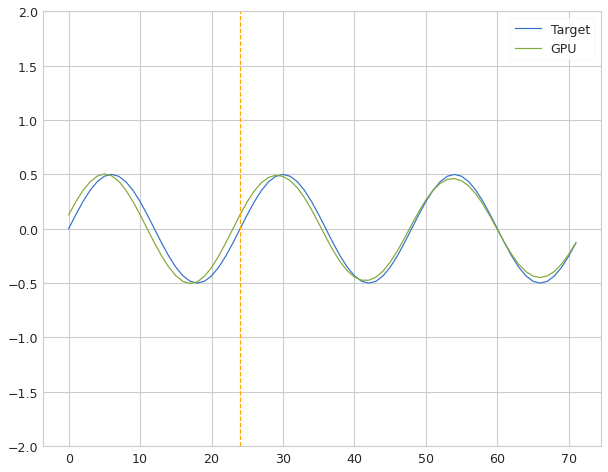

 Iter=35 a=0.982 sr=0.862 amp=0.092  ri=0.394 rr=3.226 loss=0.049487


Iter: 35 #### Diagnostic 0.049   Time 1.37  Best 0.049 NRMSE 0.049 CD 0.009
Iter: 36 #### Diagnostic 0.093   Time 0.07  Best 0.049 NRMSE 0.093 CD 0.035
Iter: 37 #### Diagnostic 0.096   Time 0.06  Best 0.049 NRMSE 0.096 CD 0.036
Iter: 38 #### Diagnostic 0.092   Time 0.06  Best 0.049 NRMSE 0.092 CD 0.034
Iter: 39 #### Diagnostic 0.092   Time 0.09  Best 0.049 NRMSE 0.092 CD 0.034
Iter: 40 #### Diagnostic 0.098   Time 0.07  Best 0.049 NRMSE 0.098 CD 0.039
Iter: 41 #### Diagnostic 0.093   Time 0.05  Best 0.049 NRMSE 0.093 CD 0.034
Iter: 42 #### Diagnostic 0.095   Time 0.03  Best 0.049 NRMSE 0.095 CD 0.036
Iter: 43 #### Diagnostic 0.096   Time 0.03  Best 0.049 NRMSE 0.096 CD 0.036
Iter: 44 #### Diagnostic 0.306   Time 0.03  Best 0.049 NRMSE 0.306 CD 0.301
Iter: 45 #### Diagnostic 0.078   Time 0.03  Best 0.049 NRMSE 0.078 CD 0.024
Iter: 46 #### Diagnostic 0.092   Time 0.03  Best 0.049 NRMSE 0.092 CD 0.034
Iter: 47 #### Dia

Iter: 40 #### Diagnostic 0.092   Time 0.10  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 41 #### Diagnostic 0.093   Time 0.10  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 42 #### Diagnostic 0.093   Time 0.09  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 43 #### Diagnostic 0.370   Time 0.11  Best 1000.000 NRMSE 0.370 CD 1.192
Iter: 44 #### Diagnostic 0.093   Time 0.11  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 45 #### Diagnostic 0.096   Time 0.10  Best 1000.000 NRMSE 0.096 CD 0.037
Iter: 46 #### Diagnostic 0.094   Time 0.06  Best 1000.000 NRMSE 0.094 CD 0.035
Iter: 47 #### Diagnostic 0.092   Time 0.06  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 48 #### Diagnostic 1.304   Time 0.04  Best 1000.000 NRMSE 1.304 CD 0.040
Iter: 49 #### Diagnostic 0.093   Time 0.03  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 50 #### Diagnostic 0.095   Time 0.03  Best 1000.000 NRMSE 0.095 CD 0.030
Iter: 51 #### Diagnostic 0.092   Time 0.03  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 52 #### Diagnostic 0.093   Time 0.15  Best 100

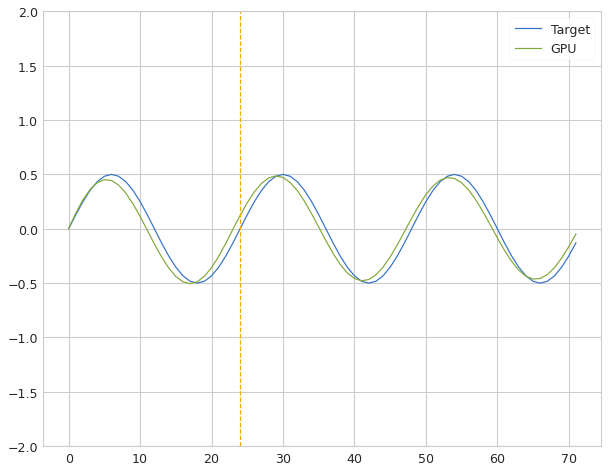

 Iter=53 a=0.192 sr=0.680 amp=0.028  ri=0.054 rr=4.082 loss=0.074311


Iter: 53 #### Diagnostic 0.074   Time 1.01  Best 0.074 NRMSE 0.074 CD 0.022
Iter: 54 #### Diagnostic 0.106   Time 0.04  Best 0.074 NRMSE 0.106 CD 0.046
Iter: 55 #### Diagnostic 0.094   Time 0.13  Best 0.074 NRMSE 0.094 CD 0.035
Iter: 56 #### Diagnostic 0.077   Time 0.14  Best 0.074 NRMSE 0.077 CD 0.023
Iter: 57 #### Diagnostic 0.862   Time 0.12  Best 0.074 NRMSE 0.862 CD 0.042
Iter: 58 #### Diagnostic 0.091   Time 0.08  Best 0.074 NRMSE 0.091 CD 0.033
Iter: 59 #### Diagnostic 0.093   Time 0.16  Best 0.074 NRMSE 0.093 CD 0.035
Iter: 60 #### Diagnostic 0.092   Time 0.16  Best 0.074 NRMSE 0.092 CD 0.034
Iter: 61 #### Diagnostic 0.092   Time 0.04  Best 0.074 NRMSE 0.092 CD 0.034
Iter: 62 #### Diagnostic 0.092   Time 0.04  Best 0.074 NRMSE 0.092 CD 0.034
Iter: 63 #### Diagnostic 0.093   Time 0.04  Best 0.074 NRMSE 0.093 CD 0.034
Iter: 64 #### Diagnostic 0.089   Time 0.04  Best 0.074 NRMSE 0.089 CD 0.031
Iter: 65 #### Dia

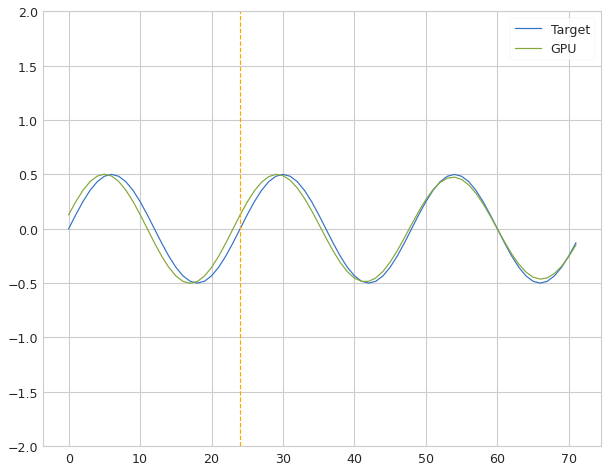

 Iter=72 a=0.889 sr=0.100 amp=0.221  ri=0.851 rr=4.421 loss=0.048757


Iter: 72 #### Diagnostic 0.049   Time 0.44  Best 0.049 NRMSE 0.049 CD 0.009
Iter: 73 #### Diagnostic 0.092   Time 0.04  Best 0.049 NRMSE 0.092 CD 0.034
Iter: 74 #### Diagnostic 0.092   Time 0.07  Best 0.049 NRMSE 0.092 CD 0.034
Iter: 75 #### Diagnostic 0.093   Time 0.06  Best 0.049 NRMSE 0.093 CD 0.034
Iter: 76 #### Diagnostic 0.099   Time 0.08  Best 0.049 NRMSE 0.099 CD 0.040
Iter: 77 #### Diagnostic 0.093   Time 0.07  Best 0.049 NRMSE 0.093 CD 0.034
Iter: 78 #### Diagnostic 0.092   Time 0.06  Best 0.049 NRMSE 0.092 CD 0.034
Iter: 79 #### Diagnostic 0.092   Time 0.07  Best 0.049 NRMSE 0.092 CD 0.034
Iter: 80 #### Diagnostic 0.092   Time 0.08  Best 0.049 NRMSE 0.092 CD 0.034
Iter: 81 #### Diagnostic 0.093   Time 0.08  Best 0.049 NRMSE 0.093 CD 0.035
Iter: 82 #### Diagnostic 0.645   Time 0.07  Best 0.049 NRMSE 0.645 CD 0.089
Iter: 83 #### Diagnostic 0.092   Time 0.07  Best 0.049 NRMSE 0.092 CD 0.034
Iter: 84 #### Dia

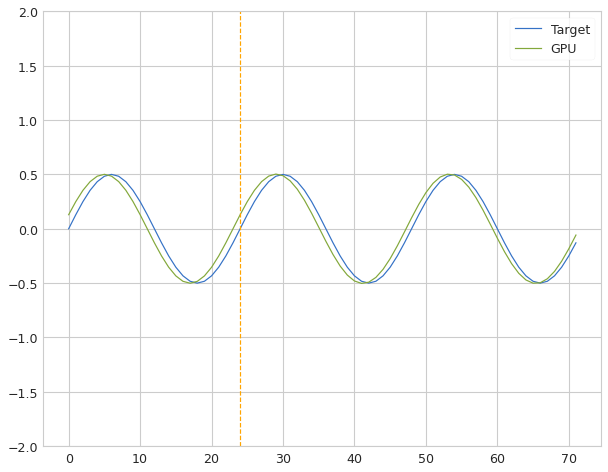

 Iter=18 a=0.843 sr=0.697 amp=0.158  ri=0.136 rr=2.924 loss=0.072817


Iter: 18 #### Diagnostic 0.073   Time 0.76  Best 0.073 NRMSE 0.073 CD 0.021
Iter: 19 #### Diagnostic 0.093   Time 0.07  Best 0.073 NRMSE 0.093 CD 0.035
Iter: 20 #### Diagnostic 0.092   Time 0.15  Best 0.073 NRMSE 0.092 CD 0.034
Iter: 21 #### Diagnostic 0.092   Time 0.13  Best 0.073 NRMSE 0.092 CD 0.034
Iter: 22 #### Diagnostic 0.092   Time 0.12  Best 0.073 NRMSE 0.092 CD 0.034
Iter: 23 #### Diagnostic 0.089   Time 0.11  Best 0.073 NRMSE 0.089 CD 0.030
Iter: 24 #### Diagnostic 0.093   Time 0.10  Best 0.073 NRMSE 0.093 CD 0.034
Iter: 25 #### Diagnostic 0.089   Time 0.10  Best 0.073 NRMSE 0.089 CD 0.032
Iter: 26 #### Diagnostic 0.091   Time 0.10  Best 0.073 NRMSE 0.091 CD 0.033
Iter: 27 #### Diagnostic 0.092   Time 0.11  Best 0.073 NRMSE 0.092 CD 0.034
Iter: 28 #### Diagnostic 0.094   Time 0.09  Best 0.073 NRMSE 0.094 CD 0.035
Iter: 29 #### Diagnostic 0.098   Time 0.10  Best 0.073 NRMSE 0.098 CD 0.039
Iter: 30 #### Dia

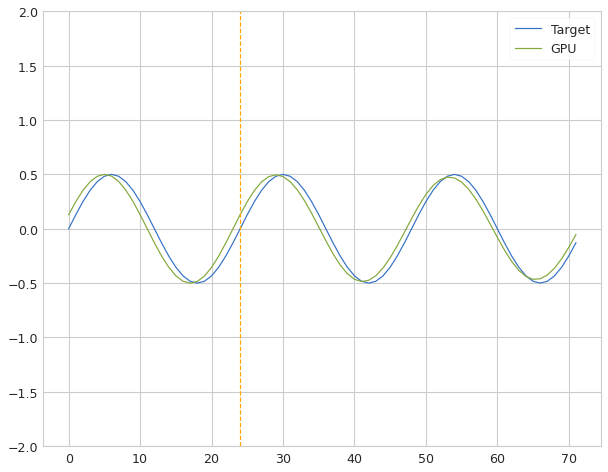

 Iter=23 a=0.917 sr=0.451 amp=0.216  ri=0.727 rr=0.181 loss=0.072972


Iter: 23 #### Diagnostic 0.073   Time 0.57  Best 0.073 NRMSE 0.073 CD 0.021
Iter: 24 #### Diagnostic 0.094   Time 0.04  Best 0.073 NRMSE 0.094 CD 0.035
Iter: 25 #### Diagnostic 0.092   Time 0.12  Best 0.073 NRMSE 0.092 CD 0.034
Iter: 26 #### Diagnostic 0.097   Time 0.07  Best 0.073 NRMSE 0.097 CD 0.037
Iter: 27 #### Diagnostic 0.091   Time 0.07  Best 0.073 NRMSE 0.091 CD 0.033
Iter: 28 #### Diagnostic 0.093   Time 0.12  Best 0.073 NRMSE 0.093 CD 0.034
Iter: 29 #### Diagnostic 0.094   Time 0.09  Best 0.073 NRMSE 0.094 CD 0.035
Iter: 30 #### Diagnostic 0.489   Time 0.11  Best 0.073 NRMSE 0.489 CD 0.862
Iter: 31 #### Diagnostic 0.093   Time 0.09  Best 0.073 NRMSE 0.093 CD 0.034
Iter: 32 #### Diagnostic 0.094   Time 0.15  Best 0.073 NRMSE 0.094 CD 0.035
Iter: 33 #### Diagnostic 0.094   Time 0.10  Best 0.073 NRMSE 0.094 CD 0.036
Iter: 34 #### Diagnostic 0.073   Time 0.11  Best 0.073 NRMSE 0.073 CD 0.022
Iter: 35 #### Dia

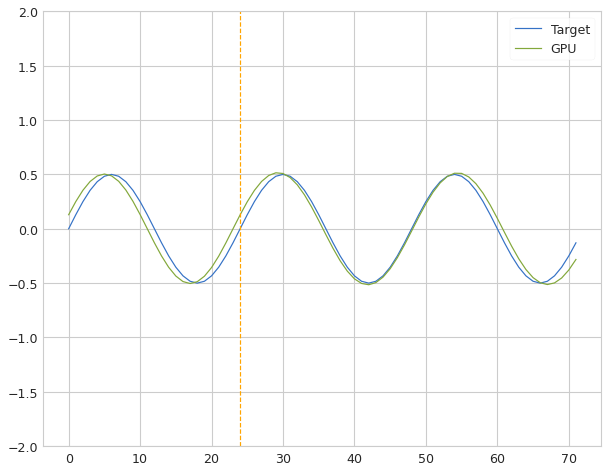

 Iter=4 a=0.921 sr=0.494 amp=0.191  ri=0.205 rr=4.320 loss=0.062216


Iter: 4 #### Diagnostic 0.062   Time 0.57  Best 0.062 NRMSE 0.062 CD 0.013
Iter: 5 #### Diagnostic 0.092   Time 0.09  Best 0.062 NRMSE 0.092 CD 0.034
Iter: 6 #### Diagnostic 0.092   Time 0.11  Best 0.062 NRMSE 0.092 CD 0.034
Iter: 7 #### Diagnostic 0.092   Time 0.10  Best 0.062 NRMSE 0.092 CD 0.034
Iter: 8 #### Diagnostic 0.118   Time 0.03  Best 0.062 NRMSE 0.118 CD 0.042
Iter: 9 #### Diagnostic 0.093   Time 0.06  Best 0.062 NRMSE 0.093 CD 0.034
Iter: 10 #### Diagnostic 0.104   Time 0.06  Best 0.062 NRMSE 0.104 CD 0.021
Iter: 11 #### Diagnostic 0.093   Time 0.03  Best 0.062 NRMSE 0.093 CD 0.034
Iter: 12 #### Diagnostic 0.092   Time 0.03  Best 0.062 NRMSE 0.092 CD 0.034
Iter: 13 #### Diagnostic 12.480   Time 0.03  Best 0.062 NRMSE 12.480 CD 0.409
Iter: 14 #### Diagnostic 0.093   Time 0.03  Best 0.062 NRMSE 0.093 CD 0.034
Iter: 15 #### Diagnostic 0.917   Time 0.03  Best 0.062 NRMSE 0.917 CD 0.093
Iter: 16 #### Diagnost

Iter: 9 #### Diagnostic 0.095   Time 0.04  Best 1000.000 NRMSE 0.095 CD 0.036
Iter: 10 #### Diagnostic 0.115   Time 0.04  Best 1000.000 NRMSE 0.115 CD 0.019
Iter: 11 #### Diagnostic 0.092   Time 0.04  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 12 #### Diagnostic 0.486   Time 0.08  Best 1000.000 NRMSE 0.486 CD 0.588
Iter: 13 #### Diagnostic 0.093   Time 0.05  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 14 #### Diagnostic 0.092   Time 0.07  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 15 #### Diagnostic 0.092   Time 0.09  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 16 #### Diagnostic 0.092   Time 0.10  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 17 #### Diagnostic 0.092   Time 0.10  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 18 #### Diagnostic 0.092   Time 0.05  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 19 #### Diagnostic 0.379   Time 0.08  Best 1000.000 NRMSE 0.379 CD 1.178
Iter: 20 #### Diagnostic 0.092   Time 0.08  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 21 #### Diagnostic 0.093   Time 0.07  Best 1000

Iter: 11 #### Diagnostic 0.093   Time 0.07  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 12 #### Diagnostic 0.094   Time 0.12  Best 1000.000 NRMSE 0.094 CD 0.035
Iter: 13 #### Diagnostic 0.092   Time 0.07  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 14 #### Diagnostic 0.092   Time 0.08  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 15 #### Diagnostic 0.111   Time 0.06  Best 1000.000 NRMSE 0.111 CD 0.050
Iter: 16 #### Diagnostic 0.095   Time 0.07  Best 1000.000 NRMSE 0.095 CD 0.036
Iter: 17 #### Diagnostic 0.093   Time 0.06  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 18 #### Diagnostic 0.089   Time 0.04  Best 1000.000 NRMSE 0.089 CD 0.031
Iter: 19 #### Diagnostic 0.085   Time 0.03  Best 1000.000 NRMSE 0.085 CD 0.028
Iter: 20 #### Diagnostic 0.092   Time 0.03  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 21 #### Diagnostic 0.092   Time 0.03  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 22 #### Diagnostic 0.093   Time 0.03  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 23 #### Diagnostic 0.092   Time 0.03  Best 100

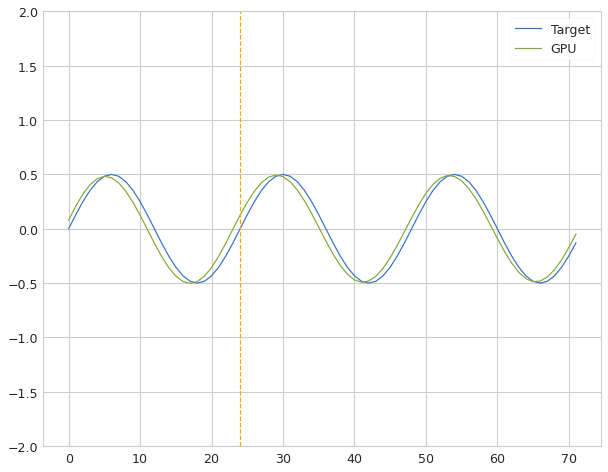

 Iter=53 a=0.192 sr=0.680 amp=0.028  ri=0.054 rr=4.082 loss=0.073523


Iter: 53 #### Diagnostic 0.074   Time 0.75  Best 0.074 NRMSE 0.074 CD 0.022
Iter: 54 #### Diagnostic 0.107   Time 0.09  Best 0.074 NRMSE 0.107 CD 0.047
Iter: 55 #### Diagnostic 0.093   Time 0.11  Best 0.074 NRMSE 0.093 CD 0.035
Iter: 56 #### Diagnostic 0.098   Time 0.09  Best 0.074 NRMSE 0.098 CD 0.039
Iter: 57 #### Diagnostic 0.729   Time 0.10  Best 0.074 NRMSE 0.729 CD 1.205
Iter: 58 #### Diagnostic 0.092   Time 0.10  Best 0.074 NRMSE 0.092 CD 0.034
Iter: 59 #### Diagnostic 0.088   Time 0.11  Best 0.074 NRMSE 0.088 CD 0.031
Iter: 60 #### Diagnostic 0.092   Time 0.10  Best 0.074 NRMSE 0.092 CD 0.034
Iter: 61 #### Diagnostic 0.092   Time 0.07  Best 0.074 NRMSE 0.092 CD 0.034
Iter: 62 #### Diagnostic 0.093   Time 0.05  Best 0.074 NRMSE 0.093 CD 0.034
Iter: 63 #### Diagnostic 0.093   Time 0.06  Best 0.074 NRMSE 0.093 CD 0.034
Iter: 64 #### Diagnostic 0.101   Time 0.06  Best 0.074 NRMSE 0.101 CD 0.040
Iter: 65 #### Dia

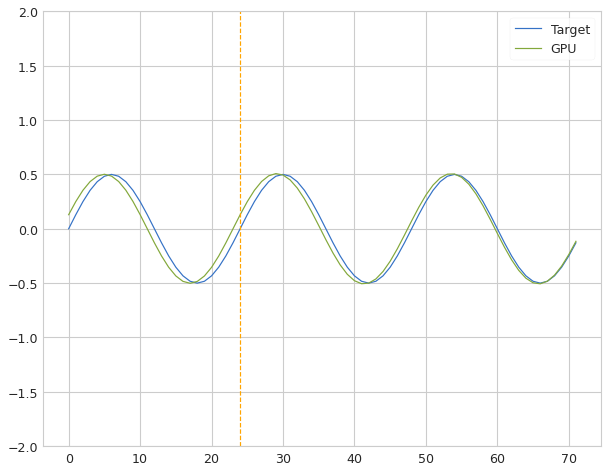

 Iter=72 a=0.889 sr=0.100 amp=0.221  ri=0.851 rr=4.421 loss=0.057237


Iter: 72 #### Diagnostic 0.057   Time 0.48  Best 0.057 NRMSE 0.057 CD 0.013
Iter: 73 #### Diagnostic 0.092   Time 0.04  Best 0.057 NRMSE 0.092 CD 0.034
Iter: 74 #### Diagnostic 0.092   Time 0.07  Best 0.057 NRMSE 0.092 CD 0.034
Iter: 75 #### Diagnostic 0.093   Time 0.06  Best 0.057 NRMSE 0.093 CD 0.034
Iter: 76 #### Diagnostic 0.061   Time 0.07  Best 0.057 NRMSE 0.061 CD 0.011
Iter: 77 #### Diagnostic 0.093   Time 0.11  Best 0.057 NRMSE 0.093 CD 0.034
Iter: 78 #### Diagnostic 0.092   Time 0.10  Best 0.057 NRMSE 0.092 CD 0.034
Iter: 79 #### Diagnostic 0.094   Time 0.11  Best 0.057 NRMSE 0.094 CD 0.035
Iter: 80 #### Diagnostic 0.091   Time 0.13  Best 0.057 NRMSE 0.091 CD 0.033
Iter: 81 #### Diagnostic 0.094   Time 0.06  Best 0.057 NRMSE 0.094 CD 0.035
Iter: 82 #### Diagnostic 0.087   Time 0.14  Best 0.057 NRMSE 0.087 CD 0.028
Iter: 83 #### Diagnostic 0.093   Time 0.11  Best 0.057 NRMSE 0.093 CD 0.034
Iter: 84 #### Dia

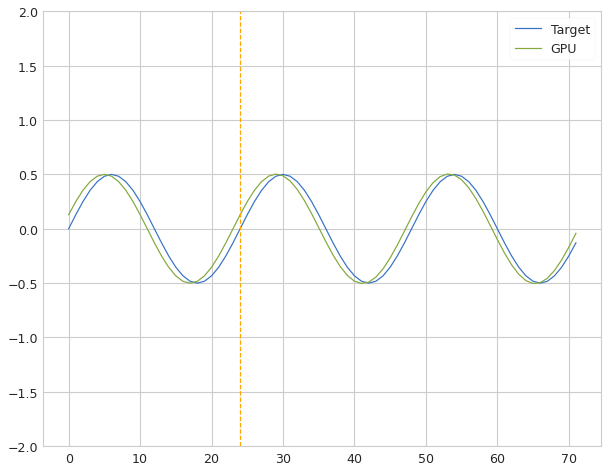

 Iter=62 a=0.687 sr=0.255 amp=0.267  ri=0.035 rr=0.454 loss=0.077998


Iter: 62 #### Diagnostic 0.078   Time 0.79  Best 0.078 NRMSE 0.078 CD 0.024
Iter: 63 #### Diagnostic 0.120   Time 0.10  Best 0.078 NRMSE 0.120 CD 0.059
Iter: 64 #### Diagnostic 0.091   Time 0.11  Best 0.078 NRMSE 0.091 CD 0.033
Iter: 65 #### Diagnostic 0.093   Time 0.13  Best 0.078 NRMSE 0.093 CD 0.034
Iter: 66 #### Diagnostic 0.093   Time 0.13  Best 0.078 NRMSE 0.093 CD 0.034
Iter: 67 #### Diagnostic 0.146   Time 0.09  Best 0.078 NRMSE 0.146 CD 0.085
Iter: 68 #### Diagnostic 0.122   Time 0.13  Best 0.078 NRMSE 0.122 CD 0.031
Iter: 69 #### Diagnostic 0.092   Time 0.11  Best 0.078 NRMSE 0.092 CD 0.034
Iter: 70 #### Diagnostic 0.270   Time 0.06  Best 0.078 NRMSE 0.270 CD 0.224
Iter: 71 #### Diagnostic 0.093   Time 0.17  Best 0.078 NRMSE 0.093 CD 0.034
Iter: 72 #### Diagnostic 0.107   Time 0.12  Best 0.078 NRMSE 0.107 CD 0.046
Iter: 73 #### Diagnostic 0.125   Time 0.09  Best 0.078 NRMSE 0.125 CD 0.037
Iter: 74 #### Dia

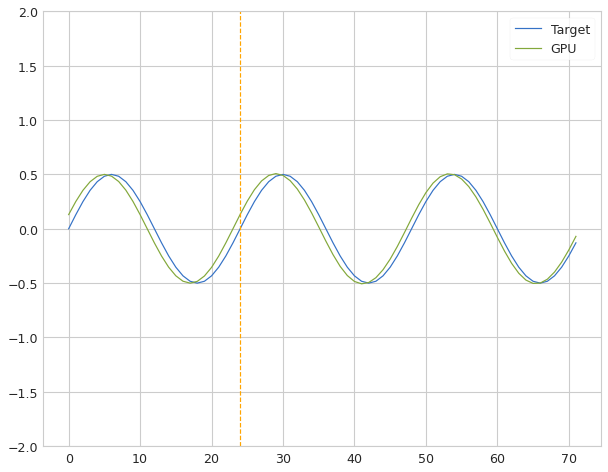

 Iter=86 a=0.945 sr=1.039 amp=0.126  ri=0.886 rr=3.615 loss=0.071230


Iter: 86 #### Diagnostic 0.071   Time 0.78  Best 0.071 NRMSE 0.071 CD 0.020


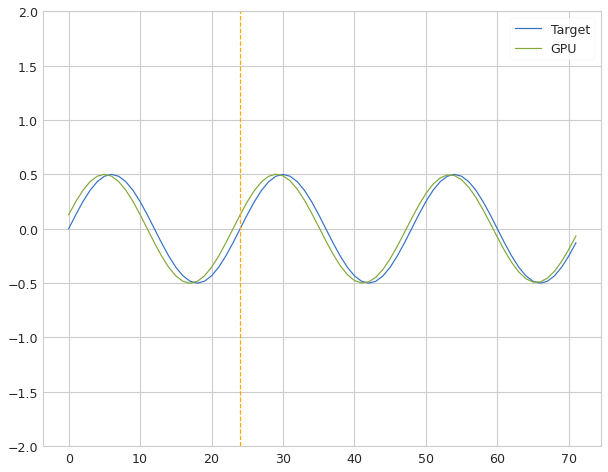

 Iter=87 a=0.797 sr=0.050 amp=0.260  ri=0.893 rr=4.695 loss=0.069396


Iter: 87 #### Diagnostic 0.069   Time 0.68  Best 0.069 NRMSE 0.069 CD 0.019
Iter: 88 #### Diagnostic 0.092   Time 0.09  Best 0.069 NRMSE 0.092 CD 0.034
Iter: 89 #### Diagnostic 0.089   Time 0.10  Best 0.069 NRMSE 0.089 CD 0.031
Iter: 90 #### Diagnostic 0.092   Time 0.19  Best 0.069 NRMSE 0.092 CD 0.034
Iter: 91 #### Diagnostic 0.094   Time 0.08  Best 0.069 NRMSE 0.094 CD 0.036
Iter: 92 #### Diagnostic 0.094   Time 0.09  Best 0.069 NRMSE 0.094 CD 0.036
Iter: 93 #### Diagnostic 0.112   Time 0.07  Best 0.069 NRMSE 0.112 CD 0.051
Iter: 94 #### Diagnostic 0.094   Time 0.07  Best 0.069 NRMSE 0.094 CD 0.035
Iter: 95 #### Diagnostic 0.092   Time 0.07  Best 0.069 NRMSE 0.092 CD 0.034
Iter: 96 #### Diagnostic 0.098   Time 0.12  Best 0.069 NRMSE 0.098 CD 0.038
Iter: 97 #### Diagnostic 0.099   Time 0.15  Best 0.069 NRMSE 0.099 CD 0.035
Iter: 98 #### Diagnostic 0.093   Time 0.23  Best 0.069 NRMSE 0.093 CD 0.034
Iter: 99 #### Dia

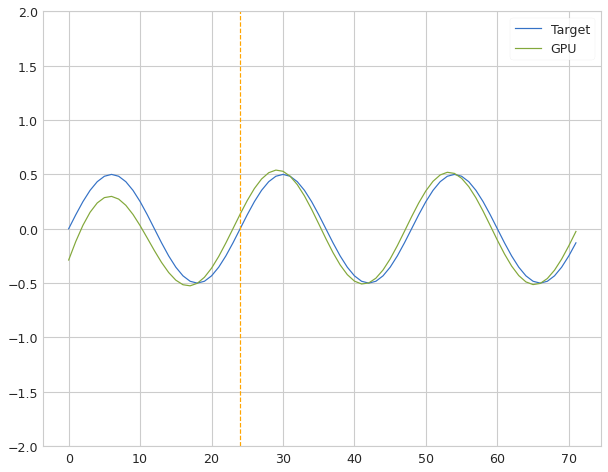

 Iter=13 a=0.089 sr=1.120 amp=0.267  ri=0.352 rr=4.759 loss=0.077268


Iter: 13 #### Diagnostic 0.077   Time 0.43  Best 0.077 NRMSE 0.077 CD 0.022
Iter: 14 #### Diagnostic 0.093   Time 0.08  Best 0.077 NRMSE 0.093 CD 0.034
Iter: 15 #### Diagnostic 0.093   Time 0.18  Best 0.077 NRMSE 0.093 CD 0.034
Iter: 16 #### Diagnostic 0.093   Time 0.10  Best 0.077 NRMSE 0.093 CD 0.034
Iter: 17 #### Diagnostic 0.094   Time 0.11  Best 0.077 NRMSE 0.094 CD 0.035
Iter: 18 #### Diagnostic 0.093   Time 0.10  Best 0.077 NRMSE 0.093 CD 0.034
Iter: 19 #### Diagnostic 0.090   Time 0.10  Best 0.077 NRMSE 0.090 CD 0.032
Iter: 20 #### Diagnostic 0.092   Time 0.10  Best 0.077 NRMSE 0.092 CD 0.034
Iter: 21 #### Diagnostic 0.093   Time 0.11  Best 0.077 NRMSE 0.093 CD 0.034
Iter: 22 #### Diagnostic 0.102   Time 0.10  Best 0.077 NRMSE 0.102 CD 0.042
Iter: 23 #### Diagnostic 0.083   Time 0.10  Best 0.077 NRMSE 0.083 CD 0.027
Iter: 24 #### Diagnostic 0.095   Time 0.12  Best 0.077 NRMSE 0.095 CD 0.036
Iter: 25 #### Dia

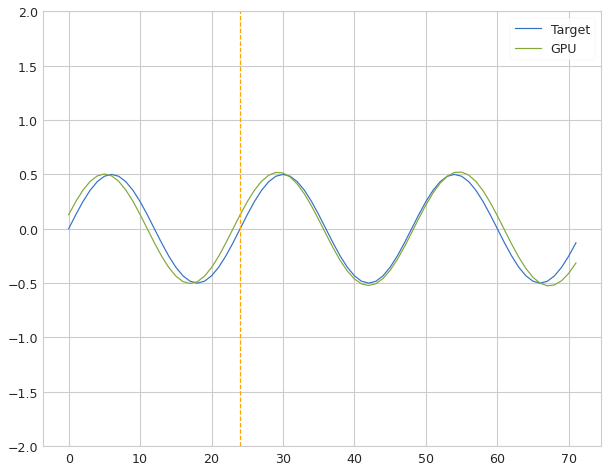

 Iter=4 a=0.921 sr=0.494 amp=0.191  ri=0.205 rr=4.320 loss=0.072155


Iter: 4 #### Diagnostic 0.072   Time 0.41  Best 0.072 NRMSE 0.072 CD 0.017
Iter: 5 #### Diagnostic 0.092   Time 0.13  Best 0.072 NRMSE 0.092 CD 0.034
Iter: 6 #### Diagnostic 0.092   Time 0.11  Best 0.072 NRMSE 0.092 CD 0.034
Iter: 7 #### Diagnostic 0.092   Time 0.10  Best 0.072 NRMSE 0.092 CD 0.034
Iter: 8 #### Diagnostic 0.086   Time 0.09  Best 0.072 NRMSE 0.086 CD 0.030
Iter: 9 #### Diagnostic 0.093   Time 0.10  Best 0.072 NRMSE 0.093 CD 0.035
Iter: 10 #### Diagnostic 0.259   Time 0.10  Best 0.072 NRMSE 0.259 CD 0.083
Iter: 11 #### Diagnostic 0.093   Time 0.10  Best 0.072 NRMSE 0.093 CD 0.034
Iter: 12 #### Diagnostic 0.092   Time 0.09  Best 0.072 NRMSE 0.092 CD 0.034
Iter: 13 #### Diagnostic 14.033   Time 0.10  Best 0.072 NRMSE 14.033 CD 0.541
Iter: 14 #### Diagnostic 0.093   Time 0.06  Best 0.072 NRMSE 0.093 CD 0.034
Iter: 15 #### Diagnostic 0.327   Time 0.05  Best 0.072 NRMSE 0.327 CD 0.596
Iter: 16 #### Diagnost

Iter: 11 #### Diagnostic 0.092   Time 0.08  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 12 #### Diagnostic 0.506   Time 0.05  Best 1000.000 NRMSE 0.506 CD 0.645
Iter: 13 #### Diagnostic 0.093   Time 0.09  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 14 #### Diagnostic 0.092   Time 0.07  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 15 #### Diagnostic 0.092   Time 0.07  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 16 #### Diagnostic 0.092   Time 0.07  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 17 #### Diagnostic 0.092   Time 0.07  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 18 #### Diagnostic 0.092   Time 0.07  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 19 #### Diagnostic 0.139   Time 0.06  Best 1000.000 NRMSE 0.139 CD 0.052
Iter: 20 #### Diagnostic 0.092   Time 0.13  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 21 #### Diagnostic 0.093   Time 0.11  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 22 #### Diagnostic 0.095   Time 0.12  Best 1000.000 NRMSE 0.095 CD 0.036
Iter: 23 #### Diagnostic 0.093   Time 0.06  Best 100

Iter: 14 #### Diagnostic 0.093   Time 0.03  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 15 #### Diagnostic 0.123   Time 0.06  Best 1000.000 NRMSE 0.123 CD 0.061
Iter: 16 #### Diagnostic 0.096   Time 0.06  Best 1000.000 NRMSE 0.096 CD 0.037
Iter: 17 #### Diagnostic 0.093   Time 0.06  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 18 #### Diagnostic 0.095   Time 0.07  Best 1000.000 NRMSE 0.095 CD 0.036
Iter: 19 #### Diagnostic 0.090   Time 0.05  Best 1000.000 NRMSE 0.090 CD 0.032
Iter: 20 #### Diagnostic 0.092   Time 0.04  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 21 #### Diagnostic 0.092   Time 0.03  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 22 #### Diagnostic 0.093   Time 0.03  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 23 #### Diagnostic 0.092   Time 0.04  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 24 #### Diagnostic 0.093   Time 0.03  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 25 #### Diagnostic 0.102   Time 0.03  Best 1000.000 NRMSE 0.102 CD 0.042
Iter: 26 #### Diagnostic 0.095   Time 0.06  Best 100

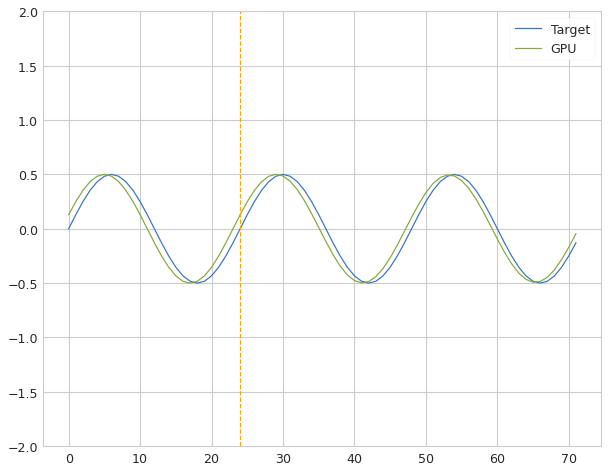

 Iter=87 a=0.797 sr=0.050 amp=0.260  ri=0.893 rr=4.695 loss=0.076402


Iter: 87 #### Diagnostic 0.076   Time 0.41  Best 0.076 NRMSE 0.076 CD 0.023
Iter: 88 #### Diagnostic 0.093   Time 0.13  Best 0.076 NRMSE 0.093 CD 0.035
Iter: 89 #### Diagnostic 0.098   Time 0.05  Best 0.076 NRMSE 0.098 CD 0.039
Iter: 90 #### Diagnostic 0.092   Time 0.07  Best 0.076 NRMSE 0.092 CD 0.034
Iter: 91 #### Diagnostic 0.095   Time 0.09  Best 0.076 NRMSE 0.095 CD 0.036
Iter: 92 #### Diagnostic 0.095   Time 0.11  Best 0.076 NRMSE 0.095 CD 0.036
Iter: 93 #### Diagnostic 0.111   Time 0.08  Best 0.076 NRMSE 0.111 CD 0.050
Iter: 94 #### Diagnostic 0.094   Time 0.08  Best 0.076 NRMSE 0.094 CD 0.035
Iter: 95 #### Diagnostic 0.092   Time 0.08  Best 0.076 NRMSE 0.092 CD 0.034
Iter: 96 #### Diagnostic 0.095   Time 0.07  Best 0.076 NRMSE 0.095 CD 0.036
Iter: 97 #### Diagnostic 0.092   Time 0.06  Best 0.076 NRMSE 0.092 CD 0.035
Iter: 98 #### Diagnostic 0.091   Time 0.07  Best 0.076 NRMSE 0.091 CD 0.034
Iter: 99 #### Dia

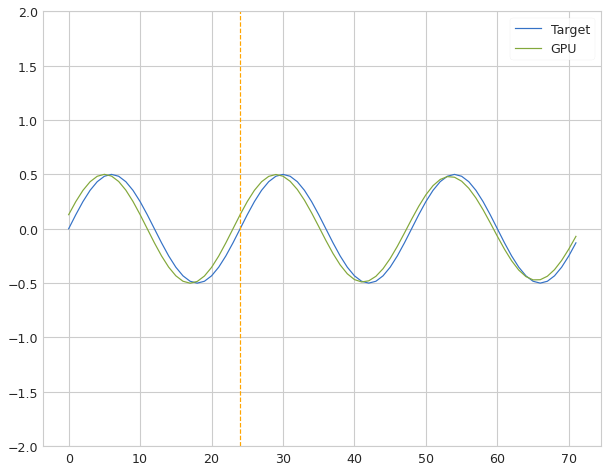

 Iter=23 a=0.917 sr=0.451 amp=0.216  ri=0.727 rr=0.181 loss=0.068091


Iter: 23 #### Diagnostic 0.068   Time 0.52  Best 0.068 NRMSE 0.068 CD 0.019
Iter: 24 #### Diagnostic 0.095   Time 0.06  Best 0.068 NRMSE 0.095 CD 0.036
Iter: 25 #### Diagnostic 0.092   Time 0.07  Best 0.068 NRMSE 0.092 CD 0.034
Iter: 26 #### Diagnostic 0.092   Time 0.07  Best 0.068 NRMSE 0.092 CD 0.033
Iter: 27 #### Diagnostic 0.092   Time 0.07  Best 0.068 NRMSE 0.092 CD 0.034
Iter: 28 #### Diagnostic 0.092   Time 0.05  Best 0.068 NRMSE 0.092 CD 0.034
Iter: 29 #### Diagnostic 0.090   Time 0.03  Best 0.068 NRMSE 0.090 CD 0.032
Iter: 30 #### Diagnostic 0.171   Time 0.04  Best 0.068 NRMSE 0.171 CD 0.113
Iter: 31 #### Diagnostic 0.093   Time 0.03  Best 0.068 NRMSE 0.093 CD 0.034
Iter: 32 #### Diagnostic 0.091   Time 0.06  Best 0.068 NRMSE 0.091 CD 0.033
Iter: 33 #### Diagnostic 0.095   Time 0.09  Best 0.068 NRMSE 0.095 CD 0.036
Iter: 34 #### Diagnostic 0.072   Time 0.07  Best 0.068 NRMSE 0.072 CD 0.021
Iter: 35 #### Dia

Iter: 20 #### Diagnostic 0.088   Time 0.09  Best 1000.000 NRMSE 0.088 CD 0.031
Iter: 21 #### Diagnostic 0.093   Time 0.14  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 22 #### Diagnostic 0.092   Time 0.09  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 23 #### Diagnostic 0.092   Time 0.09  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 24 #### Diagnostic 0.095   Time 0.09  Best 1000.000 NRMSE 0.095 CD 0.036
Iter: 25 #### Diagnostic 0.093   Time 0.14  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 26 #### Diagnostic 0.093   Time 0.07  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 27 #### Diagnostic 0.092   Time 0.06  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 28 #### Diagnostic 0.093   Time 0.07  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 29 #### Diagnostic 0.370   Time 0.04  Best 1000.000 NRMSE 0.370 CD 1.106
Iter: 30 #### Diagnostic 0.309   Time 0.04  Best 1000.000 NRMSE 0.309 CD 0.414
Iter: 31 #### Diagnostic 0.093   Time 0.05  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 32 #### Diagnostic 0.370   Time 0.04  Best 100

Iter: 24 #### Diagnostic 0.093   Time 0.08  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 25 #### Diagnostic 0.093   Time 0.08  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 26 #### Diagnostic 0.275   Time 0.06  Best 1000.000 NRMSE 0.275 CD 0.057
Iter: 27 #### Diagnostic 0.092   Time 0.06  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 28 #### Diagnostic 0.103   Time 0.07  Best 1000.000 NRMSE 0.103 CD 0.043
Iter: 29 #### Diagnostic 0.096   Time 0.07  Best 1000.000 NRMSE 0.096 CD 0.037
Iter: 30 #### Diagnostic 0.092   Time 0.10  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 31 #### Diagnostic 0.095   Time 0.11  Best 1000.000 NRMSE 0.095 CD 0.036
Iter: 32 #### Diagnostic 16.410   Time 0.09  Best 1000.000 NRMSE 16.410 CD 0.917
Iter: 33 #### Diagnostic 0.092   Time 0.06  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 34 #### Diagnostic 0.092   Time 0.07  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 35 #### Diagnostic 0.094   Time 0.07  Best 1000.000 NRMSE 0.094 CD 0.036
Iter: 36 #### Diagnostic 0.093   Time 0.04  Best 1

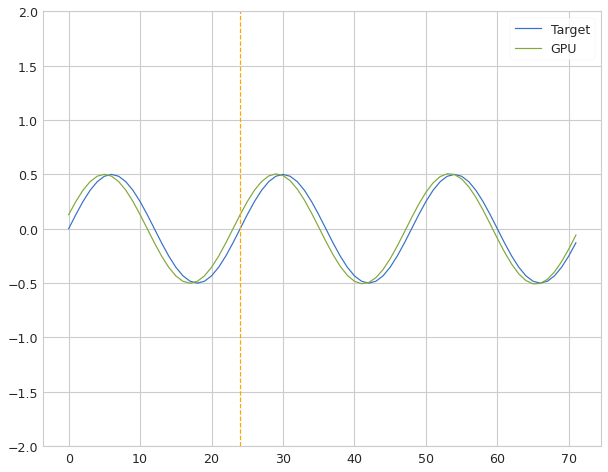

 Iter=45 a=0.762 sr=0.106 amp=0.273  ri=0.780 rr=1.238 loss=0.073311


Iter: 45 #### Diagnostic 0.073   Time 0.50  Best 0.073 NRMSE 0.073 CD 0.021
Iter: 46 #### Diagnostic 0.092   Time 0.06  Best 0.073 NRMSE 0.092 CD 0.034
Iter: 47 #### Diagnostic 0.341   Time 0.10  Best 0.073 NRMSE 0.341 CD 0.707
Iter: 48 #### Diagnostic 0.102   Time 0.09  Best 0.073 NRMSE 0.102 CD 0.042
Iter: 49 #### Diagnostic 0.370   Time 0.10  Best 0.073 NRMSE 0.370 CD 1.164
Iter: 50 #### Diagnostic 0.093   Time 0.09  Best 0.073 NRMSE 0.093 CD 0.034
Iter: 51 #### Diagnostic 0.093   Time 0.07  Best 0.073 NRMSE 0.093 CD 0.034
Iter: 52 #### Diagnostic 0.092   Time 0.07  Best 0.073 NRMSE 0.092 CD 0.034
Iter: 53 #### Diagnostic 0.094   Time 0.08  Best 0.073 NRMSE 0.094 CD 0.036
Iter: 54 #### Diagnostic 0.093   Time 0.06  Best 0.073 NRMSE 0.093 CD 0.034
Iter: 55 #### Diagnostic 0.091   Time 0.08  Best 0.073 NRMSE 0.091 CD 0.034
Iter: 56 #### Diagnostic 0.093   Time 0.06  Best 0.073 NRMSE 0.093 CD 0.035
Iter: 57 #### Dia

Iter: 50 #### Diagnostic 0.104   Time 0.07  Best 1000.000 NRMSE 0.104 CD 0.038
Iter: 51 #### Diagnostic 0.093   Time 0.07  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 52 #### Diagnostic 0.107   Time 0.07  Best 1000.000 NRMSE 0.107 CD 0.037
Iter: 53 #### Diagnostic 0.092   Time 0.07  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 54 #### Diagnostic 0.105   Time 0.03  Best 1000.000 NRMSE 0.105 CD 0.044
Iter: 55 #### Diagnostic 0.094   Time 0.06  Best 1000.000 NRMSE 0.094 CD 0.035
Iter: 56 #### Diagnostic 0.100   Time 0.03  Best 1000.000 NRMSE 0.100 CD 0.040
Iter: 57 #### Diagnostic 4.003   Time 0.03  Best 1000.000 NRMSE 4.003 CD 0.063
Iter: 58 #### Diagnostic 0.099   Time 0.03  Best 1000.000 NRMSE 0.099 CD 0.040
Iter: 59 #### Diagnostic 0.094   Time 0.04  Best 1000.000 NRMSE 0.094 CD 0.035
Iter: 60 #### Diagnostic 0.092   Time 0.03  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 61 #### Diagnostic 0.092   Time 0.03  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 62 #### Diagnostic 0.092   Time 0.03  Best 100

Iter: 53 #### Diagnostic 0.092   Time 0.10  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 54 #### Diagnostic 0.155   Time 0.07  Best 1000.000 NRMSE 0.155 CD 0.035
Iter: 55 #### Diagnostic 0.094   Time 0.06  Best 1000.000 NRMSE 0.094 CD 0.035
Iter: 56 #### Diagnostic 0.342   Time 0.11  Best 1000.000 NRMSE 0.342 CD 0.366
Iter: 57 #### Diagnostic 0.093   Time 0.11  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 58 #### Diagnostic 0.094   Time 0.10  Best 1000.000 NRMSE 0.094 CD 0.035
Iter: 59 #### Diagnostic 0.092   Time 0.07  Best 1000.000 NRMSE 0.092 CD 0.033
Iter: 60 #### Diagnostic 0.186   Time 0.09  Best 1000.000 NRMSE 0.186 CD 0.001
Iter: 61 #### Diagnostic 0.556   Time 0.07  Best 1000.000 NRMSE 0.556 CD 0.062
Iter: 62 #### Diagnostic 0.094   Time 0.13  Best 1000.000 NRMSE 0.094 CD 0.036
Iter: 63 #### Diagnostic 0.108   Time 0.10  Best 1000.000 NRMSE 0.108 CD 0.047
Iter: 64 #### Diagnostic 0.092   Time 0.12  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 65 #### Diagnostic 0.093   Time 0.08  Best 100

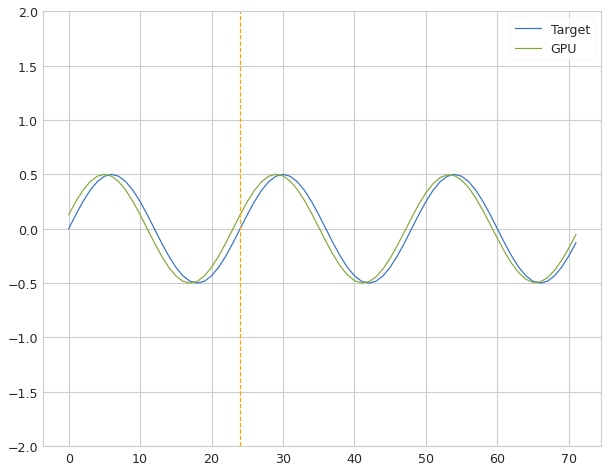

 Iter=87 a=0.797 sr=0.050 amp=0.260  ri=0.893 rr=4.695 loss=0.073823


Iter: 87 #### Diagnostic 0.074   Time 0.85  Best 0.074 NRMSE 0.074 CD 0.022
Iter: 88 #### Diagnostic 0.093   Time 0.06  Best 0.074 NRMSE 0.093 CD 0.034
Iter: 89 #### Diagnostic 0.092   Time 0.11  Best 0.074 NRMSE 0.092 CD 0.034
Iter: 90 #### Diagnostic 0.092   Time 0.10  Best 0.074 NRMSE 0.092 CD 0.034
Iter: 91 #### Diagnostic 0.092   Time 0.09  Best 0.074 NRMSE 0.092 CD 0.034
Iter: 92 #### Diagnostic 0.095   Time 0.11  Best 0.074 NRMSE 0.095 CD 0.036
Iter: 93 #### Diagnostic 0.115   Time 0.12  Best 0.074 NRMSE 0.115 CD 0.055
Iter: 94 #### Diagnostic 0.091   Time 0.08  Best 0.074 NRMSE 0.091 CD 0.033
Iter: 95 #### Diagnostic 0.092   Time 0.09  Best 0.074 NRMSE 0.092 CD 0.034
Iter: 96 #### Diagnostic 0.089   Time 0.19  Best 0.074 NRMSE 0.089 CD 0.032
Iter: 97 #### Diagnostic 0.094   Time 0.06  Best 0.074 NRMSE 0.094 CD 0.035
Iter: 98 #### Diagnostic 0.092   Time 0.10  Best 0.074 NRMSE 0.092 CD 0.034
Iter: 99 #### Dia

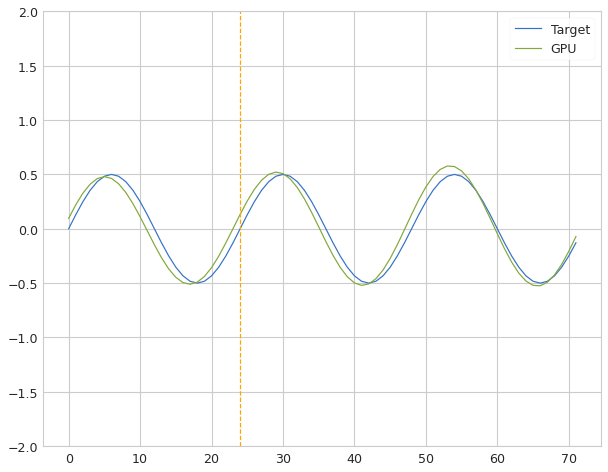

 Iter=75 a=0.585 sr=1.124 amp=0.954  ri=0.051 rr=3.040 loss=0.079482


Iter: 75 #### Diagnostic 0.079   Time 0.81  Best 0.079 NRMSE 0.079 CD 0.020
Iter: 76 #### Diagnostic 0.093   Time 0.18  Best 0.079 NRMSE 0.093 CD 0.035
Iter: 77 #### Diagnostic 0.092   Time 0.11  Best 0.079 NRMSE 0.092 CD 0.034
Iter: 78 #### Diagnostic 0.093   Time 0.11  Best 0.079 NRMSE 0.093 CD 0.035
Iter: 79 #### Diagnostic 0.092   Time 0.10  Best 0.079 NRMSE 0.092 CD 0.034
Iter: 80 #### Diagnostic 0.094   Time 0.12  Best 0.079 NRMSE 0.094 CD 0.035
Iter: 81 #### Diagnostic 0.092   Time 0.09  Best 0.079 NRMSE 0.092 CD 0.034
Iter: 82 #### Diagnostic 0.092   Time 0.11  Best 0.079 NRMSE 0.092 CD 0.034
Iter: 83 #### Diagnostic 0.098   Time 0.10  Best 0.079 NRMSE 0.098 CD 0.038
Iter: 84 #### Diagnostic 0.092   Time 0.11  Best 0.079 NRMSE 0.092 CD 0.034
Iter: 85 #### Diagnostic 0.092   Time 0.10  Best 0.079 NRMSE 0.092 CD 0.034
Iter: 86 #### Diagnostic 3.635   Time 0.10  Best 0.079 NRMSE 3.635 CD 0.081
Iter: 87 #### Dia

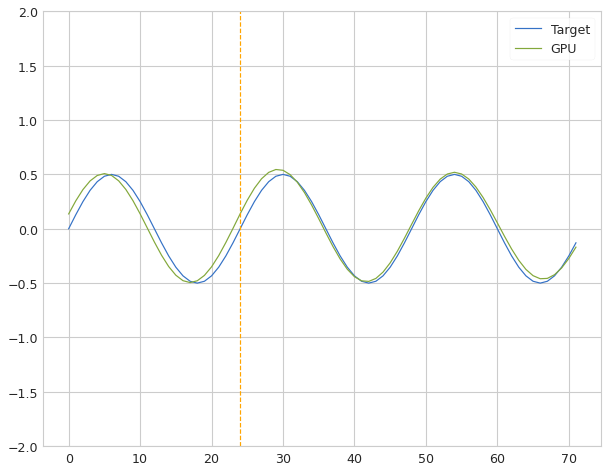

 Iter=3 a=0.673 sr=1.164 amp=0.989  ri=0.778 rr=0.127 loss=0.051429


Iter: 3 #### Diagnostic 0.051   Time 0.60  Best 0.051 NRMSE 0.051 CD 0.010
Iter: 4 #### Diagnostic 0.110   Time 0.05  Best 0.051 NRMSE 0.110 CD 0.043
Iter: 5 #### Diagnostic 0.092   Time 0.03  Best 0.051 NRMSE 0.092 CD 0.034
Iter: 6 #### Diagnostic 0.092   Time 0.03  Best 0.051 NRMSE 0.092 CD 0.034
Iter: 7 #### Diagnostic 0.092   Time 0.03  Best 0.051 NRMSE 0.092 CD 0.034
Iter: 8 #### Diagnostic 0.159   Time 0.03  Best 0.051 NRMSE 0.159 CD 0.050
Iter: 9 #### Diagnostic 0.093   Time 0.03  Best 0.051 NRMSE 0.093 CD 0.034
Iter: 10 #### Diagnostic 0.648   Time 0.03  Best 0.051 NRMSE 0.648 CD 0.031
Iter: 11 #### Diagnostic 0.092   Time 0.03  Best 0.051 NRMSE 0.092 CD 0.034
Iter: 12 #### Diagnostic 0.092   Time 0.03  Best 0.051 NRMSE 0.092 CD 0.034
Iter: 13 #### Diagnostic 0.089   Time 0.04  Best 0.051 NRMSE 0.089 CD 0.026
Iter: 14 #### Diagnostic 0.093   Time 0.04  Best 0.051 NRMSE 0.093 CD 0.035
Iter: 15 #### Diagnostic 

Iter: 8 #### Diagnostic 0.093   Time 0.06  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 9 #### Diagnostic 0.093   Time 0.07  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 10 #### Diagnostic 0.108   Time 0.11  Best 1000.000 NRMSE 0.108 CD 0.018
Iter: 11 #### Diagnostic 0.092   Time 0.11  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 12 #### Diagnostic 0.766   Time 0.06  Best 1000.000 NRMSE 0.766 CD 1.175
Iter: 13 #### Diagnostic 0.093   Time 0.04  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 14 #### Diagnostic 0.092   Time 0.04  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 15 #### Diagnostic 0.092   Time 0.05  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 16 #### Diagnostic 0.092   Time 0.05  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 17 #### Diagnostic 0.094   Time 0.11  Best 1000.000 NRMSE 0.094 CD 0.036
Iter: 18 #### Diagnostic 0.092   Time 0.09  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 19 #### Diagnostic 0.463   Time 0.10  Best 1000.000 NRMSE 0.463 CD 0.032
Iter: 20 #### Diagnostic 0.093   Time 0.09  Best 1000.

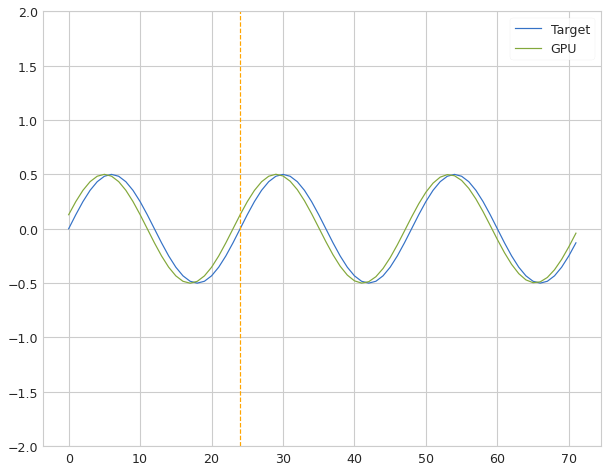

 Iter=29 a=0.858 sr=0.903 amp=0.364  ri=0.052 rr=3.815 loss=0.078035


Iter: 29 #### Diagnostic 0.078   Time 0.50  Best 0.078 NRMSE 0.078 CD 0.024
Iter: 30 #### Diagnostic 0.093   Time 0.06  Best 0.078 NRMSE 0.093 CD 0.034


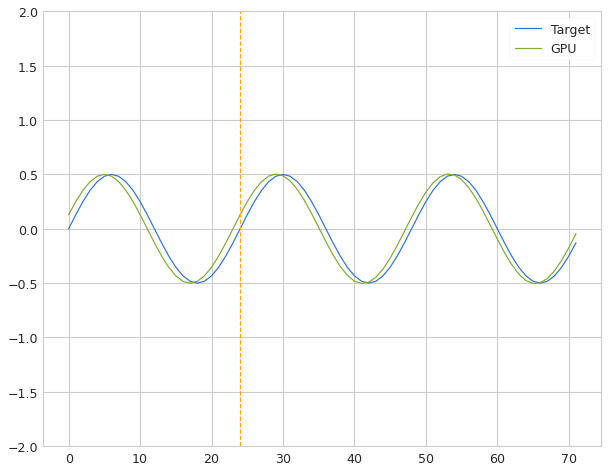

 Iter=31 a=0.806 sr=0.012 amp=0.593  ri=0.057 rr=1.115 loss=0.076462


Iter: 31 #### Diagnostic 0.076   Time 1.43  Best 0.076 NRMSE 0.076 CD 0.023
Iter: 32 #### Diagnostic 1000.000   Time 0.10  Best 0.076 NRMSE 1265.539 CD 1.295
Iter: 33 #### Diagnostic 0.092   Time 0.11  Best 0.076 NRMSE 0.092 CD 0.034
Iter: 34 #### Diagnostic 0.092   Time 0.08  Best 0.076 NRMSE 0.092 CD 0.034
Iter: 35 #### Diagnostic 0.325   Time 0.11  Best 0.076 NRMSE 0.325 CD 0.388
Iter: 36 #### Diagnostic 0.093   Time 0.10  Best 0.076 NRMSE 0.093 CD 0.035
Iter: 37 #### Diagnostic 0.099   Time 0.15  Best 0.076 NRMSE 0.099 CD 0.035
Iter: 38 #### Diagnostic 0.092   Time 0.21  Best 0.076 NRMSE 0.092 CD 0.034
Iter: 39 #### Diagnostic 0.092   Time 0.11  Best 0.076 NRMSE 0.092 CD 0.034
Iter: 40 #### Diagnostic 0.089   Time 0.12  Best 0.076 NRMSE 0.089 CD 0.032
Iter: 41 #### Diagnostic 0.093   Time 0.12  Best 0.076 NRMSE 0.093 CD 0.034
Iter: 42 #### Diagnostic 0.095   Time 0.07  Best 0.076 NRMSE 0.095 CD 0.036
Iter: 43 ##

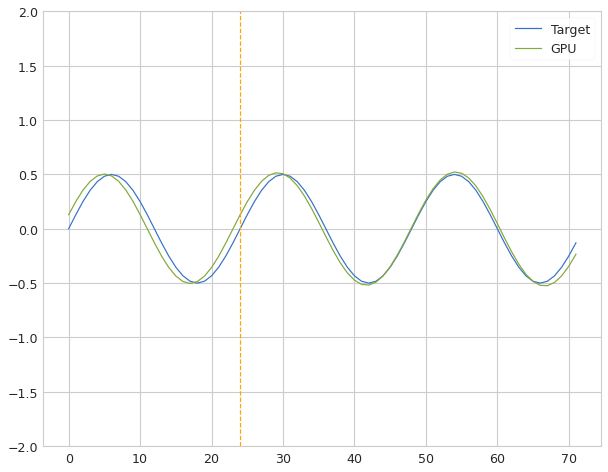

 Iter=44 a=0.773 sr=0.924 amp=0.028  ri=0.246 rr=1.622 loss=0.052904


Iter: 44 #### Diagnostic 0.053   Time 0.76  Best 0.053 NRMSE 0.053 CD 0.009
Iter: 45 #### Diagnostic 0.101   Time 0.06  Best 0.053 NRMSE 0.101 CD 0.041
Iter: 46 #### Diagnostic 0.092   Time 0.09  Best 0.053 NRMSE 0.092 CD 0.034
Iter: 47 #### Diagnostic 0.248   Time 0.07  Best 0.053 NRMSE 0.248 CD 0.057
Iter: 48 #### Diagnostic 0.085   Time 0.09  Best 0.053 NRMSE 0.085 CD 0.029
Iter: 49 #### Diagnostic 0.370   Time 0.09  Best 0.053 NRMSE 0.370 CD 1.163
Iter: 50 #### Diagnostic 0.093   Time 0.07  Best 0.053 NRMSE 0.093 CD 0.034
Iter: 51 #### Diagnostic 0.093   Time 0.08  Best 0.053 NRMSE 0.093 CD 0.035
Iter: 52 #### Diagnostic 0.093   Time 0.06  Best 0.053 NRMSE 0.093 CD 0.035
Iter: 53 #### Diagnostic 0.091   Time 0.12  Best 0.053 NRMSE 0.091 CD 0.033
Iter: 54 #### Diagnostic 0.093   Time 0.05  Best 0.053 NRMSE 0.093 CD 0.034
Iter: 55 #### Diagnostic 0.095   Time 0.04  Best 0.053 NRMSE 0.095 CD 0.037
Iter: 56 #### Dia

Iter: 49 #### Diagnostic 0.093   Time 0.09  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 50 #### Diagnostic 0.095   Time 0.07  Best 1000.000 NRMSE 0.095 CD 0.036
Iter: 51 #### Diagnostic 0.092   Time 0.08  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 52 #### Diagnostic 0.092   Time 0.05  Best 1000.000 NRMSE 0.092 CD 0.033
Iter: 53 #### Diagnostic 0.133   Time 0.05  Best 1000.000 NRMSE 0.133 CD 0.070
Iter: 54 #### Diagnostic 0.109   Time 0.05  Best 1000.000 NRMSE 0.109 CD 0.049
Iter: 55 #### Diagnostic 0.097   Time 0.07  Best 1000.000 NRMSE 0.097 CD 0.038
Iter: 56 #### Diagnostic 0.127   Time 0.06  Best 1000.000 NRMSE 0.127 CD 0.065
Iter: 57 #### Diagnostic 1.678   Time 0.06  Best 1000.000 NRMSE 1.678 CD 0.294
Iter: 58 #### Diagnostic 0.093   Time 0.06  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 59 #### Diagnostic 0.094   Time 0.10  Best 1000.000 NRMSE 0.094 CD 0.035
Iter: 60 #### Diagnostic 0.093   Time 0.07  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 61 #### Diagnostic 0.092   Time 0.12  Best 100

Iter: 55 #### Diagnostic 0.092   Time 0.13  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 56 #### Diagnostic 0.190   Time 0.11  Best 1000.000 NRMSE 0.190 CD 0.151
Iter: 57 #### Diagnostic 0.090   Time 0.12  Best 1000.000 NRMSE 0.090 CD 0.032
Iter: 58 #### Diagnostic 0.088   Time 0.11  Best 1000.000 NRMSE 0.088 CD 0.031
Iter: 59 #### Diagnostic 0.093   Time 0.10  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 60 #### Diagnostic 0.169   Time 0.11  Best 1000.000 NRMSE 0.169 CD 0.033
Iter: 61 #### Diagnostic 0.416   Time 0.04  Best 1000.000 NRMSE 0.416 CD 0.101
Iter: 62 #### Diagnostic 0.100   Time 0.05  Best 1000.000 NRMSE 0.100 CD 0.040
Iter: 63 #### Diagnostic 0.104   Time 0.05  Best 1000.000 NRMSE 0.104 CD 0.044
Iter: 64 #### Diagnostic 0.097   Time 0.05  Best 1000.000 NRMSE 0.097 CD 0.038
Iter: 65 #### Diagnostic 0.092   Time 0.05  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 66 #### Diagnostic 0.093   Time 0.04  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 67 #### Diagnostic 0.370   Time 0.14  Best 100

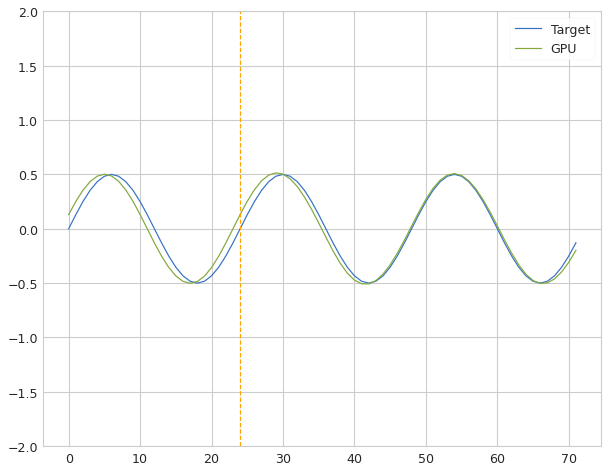

 Iter=86 a=0.945 sr=1.039 amp=0.126  ri=0.886 rr=3.615 loss=0.048765


Iter: 86 #### Diagnostic 0.049   Time 0.69  Best 0.049 NRMSE 0.049 CD 0.009
Iter: 87 #### Diagnostic 0.064   Time 0.04  Best 0.049 NRMSE 0.064 CD 0.016
Iter: 88 #### Diagnostic 0.092   Time 0.07  Best 0.049 NRMSE 0.092 CD 0.034
Iter: 89 #### Diagnostic 0.093   Time 0.08  Best 0.049 NRMSE 0.093 CD 0.035
Iter: 90 #### Diagnostic 0.092   Time 0.09  Best 0.049 NRMSE 0.092 CD 0.034
Iter: 91 #### Diagnostic 0.097   Time 0.08  Best 0.049 NRMSE 0.097 CD 0.038
Iter: 92 #### Diagnostic 0.095   Time 0.08  Best 0.049 NRMSE 0.095 CD 0.036
Iter: 93 #### Diagnostic 0.116   Time 0.12  Best 0.049 NRMSE 0.116 CD 0.056
Iter: 94 #### Diagnostic 0.093   Time 0.11  Best 0.049 NRMSE 0.093 CD 0.034
Iter: 95 #### Diagnostic 0.092   Time 0.10  Best 0.049 NRMSE 0.092 CD 0.034
Iter: 96 #### Diagnostic 0.091   Time 0.03  Best 0.049 NRMSE 0.091 CD 0.033
Iter: 97 #### Diagnostic 0.092   Time 0.04  Best 0.049 NRMSE 0.092 CD 0.034
Iter: 98 #### Dia

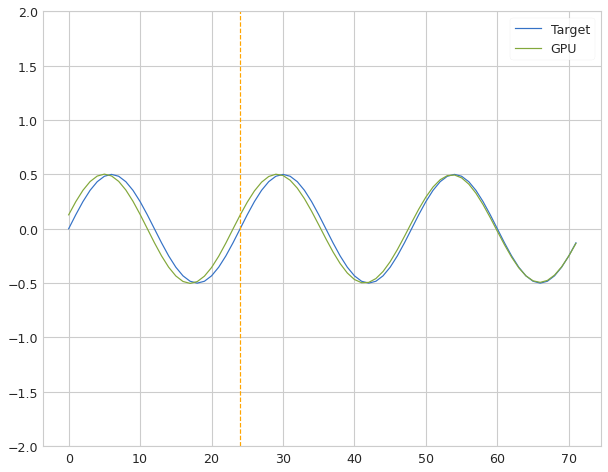

 Iter=34 a=0.438 sr=1.132 amp=0.022  ri=0.106 rr=2.222 loss=0.050754


Iter: 34 #### Diagnostic 0.051   Time 1.18  Best 0.051 NRMSE 0.051 CD 0.010
Iter: 35 #### Diagnostic 0.093   Time 0.05  Best 0.051 NRMSE 0.093 CD 0.034
Iter: 36 #### Diagnostic 0.092   Time 0.06  Best 0.051 NRMSE 0.092 CD 0.034
Iter: 37 #### Diagnostic 0.094   Time 0.06  Best 0.051 NRMSE 0.094 CD 0.035
Iter: 38 #### Diagnostic 0.092   Time 0.09  Best 0.051 NRMSE 0.092 CD 0.034
Iter: 39 #### Diagnostic 0.092   Time 0.05  Best 0.051 NRMSE 0.092 CD 0.034
Iter: 40 #### Diagnostic 0.093   Time 0.06  Best 0.051 NRMSE 0.093 CD 0.034
Iter: 41 #### Diagnostic 0.081   Time 0.03  Best 0.051 NRMSE 0.081 CD 0.026
Iter: 42 #### Diagnostic 0.091   Time 0.03  Best 0.051 NRMSE 0.091 CD 0.033
Iter: 43 #### Diagnostic 0.099   Time 0.03  Best 0.051 NRMSE 0.099 CD 0.030
Iter: 44 #### Diagnostic 0.092   Time 0.03  Best 0.051 NRMSE 0.092 CD 0.034
Iter: 45 #### Diagnostic 0.092   Time 0.03  Best 0.051 NRMSE 0.092 CD 0.034
Iter: 46 #### Dia

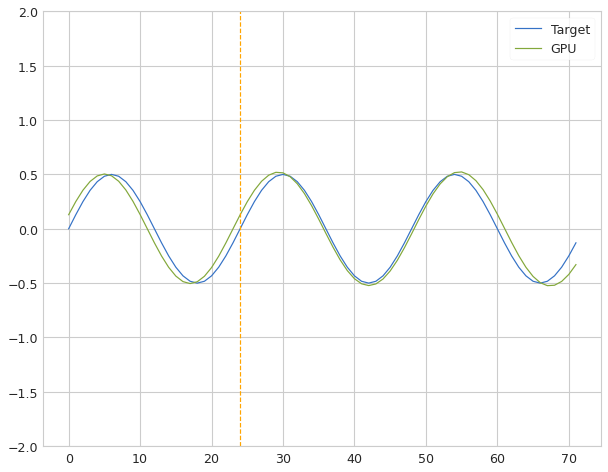

 Iter=4 a=0.921 sr=0.494 amp=0.191  ri=0.205 rr=4.320 loss=0.077349


Iter: 4 #### Diagnostic 0.077   Time 0.49  Best 0.077 NRMSE 0.077 CD 0.020
Iter: 5 #### Diagnostic 0.092   Time 0.04  Best 0.077 NRMSE 0.092 CD 0.034
Iter: 6 #### Diagnostic 0.092   Time 0.09  Best 0.077 NRMSE 0.092 CD 0.034
Iter: 7 #### Diagnostic 0.092   Time 0.09  Best 0.077 NRMSE 0.092 CD 0.034
Iter: 8 #### Diagnostic 0.129   Time 0.07  Best 0.077 NRMSE 0.129 CD 0.045
Iter: 9 #### Diagnostic 0.089   Time 0.04  Best 0.077 NRMSE 0.089 CD 0.032
Iter: 10 #### Diagnostic 0.158   Time 0.04  Best 0.077 NRMSE 0.158 CD 0.046
Iter: 11 #### Diagnostic 0.093   Time 0.04  Best 0.077 NRMSE 0.093 CD 0.035
Iter: 12 #### Diagnostic 0.092   Time 0.05  Best 0.077 NRMSE 0.092 CD 0.034
Iter: 13 #### Diagnostic 0.512   Time 0.08  Best 0.077 NRMSE 0.512 CD 1.510
Iter: 14 #### Diagnostic 0.091   Time 0.12  Best 0.077 NRMSE 0.091 CD 0.033
Iter: 15 #### Diagnostic 1.796   Time 0.08  Best 0.077 NRMSE 1.796 CD 1.842
Iter: 16 #### Diagnostic

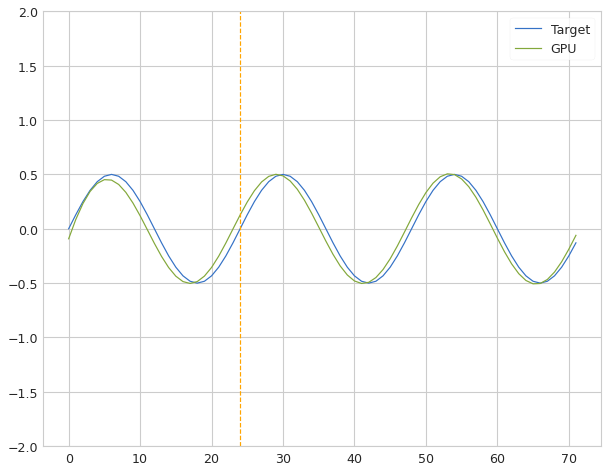

 Iter=77 a=0.264 sr=0.967 amp=0.031  ri=0.037 rr=3.889 loss=0.071702


Iter: 77 #### Diagnostic 0.072   Time 0.55  Best 0.072 NRMSE 0.072 CD 0.020
Iter: 78 #### Diagnostic 0.092   Time 0.05  Best 0.072 NRMSE 0.092 CD 0.034
Iter: 79 #### Diagnostic 0.092   Time 0.04  Best 0.072 NRMSE 0.092 CD 0.034
Iter: 80 #### Diagnostic 0.093   Time 0.04  Best 0.072 NRMSE 0.093 CD 0.034
Iter: 81 #### Diagnostic 0.092   Time 0.04  Best 0.072 NRMSE 0.092 CD 0.034
Iter: 82 #### Diagnostic 0.091   Time 0.03  Best 0.072 NRMSE 0.091 CD 0.033
Iter: 83 #### Diagnostic 0.093   Time 0.04  Best 0.072 NRMSE 0.093 CD 0.034
Iter: 84 #### Diagnostic 0.095   Time 0.19  Best 0.072 NRMSE 0.095 CD 0.036
Iter: 85 #### Diagnostic 0.096   Time 0.07  Best 0.072 NRMSE 0.096 CD 0.019
Iter: 86 #### Diagnostic 0.092   Time 0.06  Best 0.072 NRMSE 0.092 CD 0.034
Iter: 87 #### Diagnostic 0.091   Time 0.08  Best 0.072 NRMSE 0.091 CD 0.034
Iter: 88 #### Diagnostic 0.092   Time 0.03  Best 0.072 NRMSE 0.092 CD 0.034
Iter: 89 #### Dia

Iter: 80 #### Diagnostic 0.092   Time 0.04  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 81 #### Diagnostic 0.110   Time 0.03  Best 1000.000 NRMSE 0.110 CD 0.036
Iter: 82 #### Diagnostic 7.764   Time 0.03  Best 1000.000 NRMSE 7.764 CD 0.827
Iter: 83 #### Diagnostic 0.092   Time 0.03  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 84 #### Diagnostic 0.093   Time 0.03  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 85 #### Diagnostic 0.089   Time 0.03  Best 1000.000 NRMSE 0.089 CD 0.027
Iter: 86 #### Diagnostic 0.093   Time 0.04  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 87 #### Diagnostic 0.092   Time 0.04  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 88 #### Diagnostic 0.092   Time 0.04  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 89 #### Diagnostic 0.094   Time 0.04  Best 1000.000 NRMSE 0.094 CD 0.035
Iter: 90 #### Diagnostic 0.297   Time 0.04  Best 1000.000 NRMSE 0.297 CD 0.399
Iter: 91 #### Diagnostic 0.093   Time 0.03  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 92 #### Diagnostic 0.094   Time 0.05  Best 100

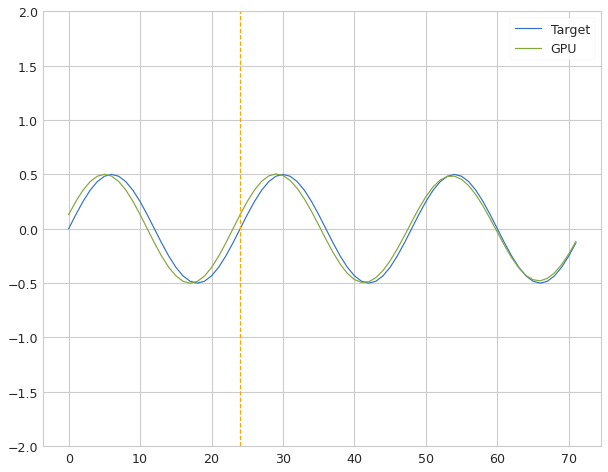

 Iter=15 a=0.926 sr=0.334 amp=0.177  ri=0.990 rr=3.464 loss=0.055555


Iter: 15 #### Diagnostic 0.056   Time 1.01  Best 0.056 NRMSE 0.056 CD 0.012
Iter: 16 #### Diagnostic 0.095   Time 0.06  Best 0.056 NRMSE 0.095 CD 0.037
Iter: 17 #### Diagnostic 0.093   Time 0.10  Best 0.056 NRMSE 0.093 CD 0.034
Iter: 18 #### Diagnostic 0.095   Time 0.10  Best 0.056 NRMSE 0.095 CD 0.036
Iter: 19 #### Diagnostic 0.093   Time 0.09  Best 0.056 NRMSE 0.093 CD 0.034
Iter: 20 #### Diagnostic 0.092   Time 0.11  Best 0.056 NRMSE 0.092 CD 0.034
Iter: 21 #### Diagnostic 0.092   Time 0.06  Best 0.056 NRMSE 0.092 CD 0.034
Iter: 22 #### Diagnostic 0.093   Time 0.05  Best 0.056 NRMSE 0.093 CD 0.034
Iter: 23 #### Diagnostic 0.092   Time 0.03  Best 0.056 NRMSE 0.092 CD 0.034
Iter: 24 #### Diagnostic 0.093   Time 0.03  Best 0.056 NRMSE 0.093 CD 0.034
Iter: 25 #### Diagnostic 0.133   Time 0.03  Best 0.056 NRMSE 0.133 CD 0.072
Iter: 26 #### Diagnostic 0.098   Time 0.03  Best 0.056 NRMSE 0.098 CD 0.038
Iter: 27 #### Dia

Iter: 20 #### Diagnostic 0.093   Time 0.06  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 21 #### Diagnostic 0.092   Time 0.05  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 22 #### Diagnostic 0.093   Time 0.06  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 23 #### Diagnostic 0.093   Time 0.06  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 24 #### Diagnostic 0.093   Time 0.06  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 25 #### Diagnostic 0.092   Time 0.06  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 26 #### Diagnostic 0.093   Time 0.06  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 27 #### Diagnostic 0.093   Time 0.06  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 28 #### Diagnostic 0.093   Time 0.04  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 29 #### Diagnostic 0.105   Time 0.06  Best 1000.000 NRMSE 0.105 CD 0.044
Iter: 30 #### Diagnostic 0.092   Time 0.03  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 31 #### Diagnostic 0.094   Time 0.03  Best 1000.000 NRMSE 0.094 CD 0.035
Iter: 32 #### Diagnostic 0.092   Time 0.04  Best 100

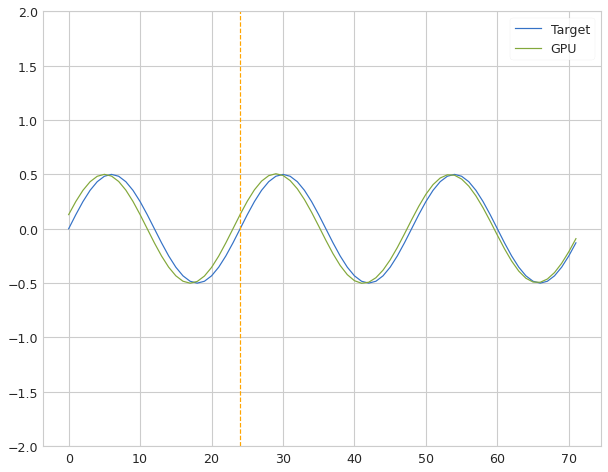

 Iter=86 a=0.945 sr=1.039 amp=0.126  ri=0.886 rr=3.615 loss=0.063798


Iter: 86 #### Diagnostic 0.064   Time 0.45  Best 0.064 NRMSE 0.064 CD 0.016
Iter: 87 #### Diagnostic 0.088   Time 0.05  Best 0.064 NRMSE 0.088 CD 0.031
Iter: 88 #### Diagnostic 0.092   Time 0.05  Best 0.064 NRMSE 0.092 CD 0.034
Iter: 89 #### Diagnostic 0.085   Time 0.05  Best 0.064 NRMSE 0.085 CD 0.029
Iter: 90 #### Diagnostic 0.092   Time 0.09  Best 0.064 NRMSE 0.092 CD 0.034
Iter: 91 #### Diagnostic 0.087   Time 0.07  Best 0.064 NRMSE 0.087 CD 0.030
Iter: 92 #### Diagnostic 0.095   Time 0.07  Best 0.064 NRMSE 0.095 CD 0.036
Iter: 93 #### Diagnostic 0.112   Time 0.08  Best 0.064 NRMSE 0.112 CD 0.052
Iter: 94 #### Diagnostic 0.096   Time 0.07  Best 0.064 NRMSE 0.096 CD 0.037
Iter: 95 #### Diagnostic 0.092   Time 0.08  Best 0.064 NRMSE 0.092 CD 0.034
Iter: 96 #### Diagnostic 0.089   Time 0.07  Best 0.064 NRMSE 0.089 CD 0.032
Iter: 97 #### Diagnostic 0.094   Time 0.11  Best 0.064 NRMSE 0.094 CD 0.035
Iter: 98 #### Dia

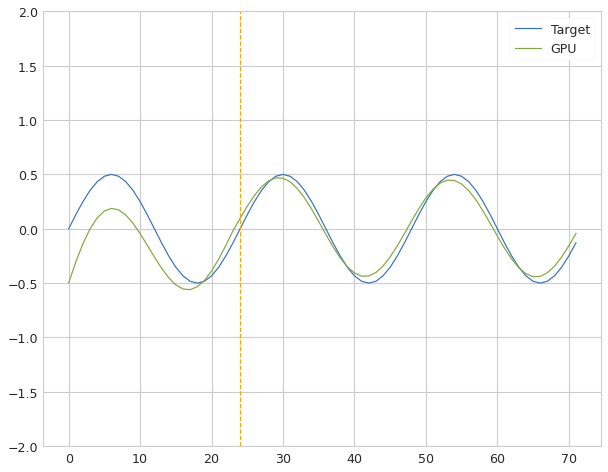

 Iter=13 a=0.089 sr=1.120 amp=0.267  ri=0.352 rr=4.759 loss=0.063379


Iter: 13 #### Diagnostic 0.063   Time 0.47  Best 0.063 NRMSE 0.063 CD 0.013
Iter: 14 #### Diagnostic 0.093   Time 0.03  Best 0.063 NRMSE 0.093 CD 0.034
Iter: 15 #### Diagnostic 0.093   Time 0.05  Best 0.063 NRMSE 0.093 CD 0.034
Iter: 16 #### Diagnostic 0.092   Time 0.05  Best 0.063 NRMSE 0.092 CD 0.034
Iter: 17 #### Diagnostic 0.094   Time 0.06  Best 0.063 NRMSE 0.094 CD 0.035
Iter: 18 #### Diagnostic 0.093   Time 0.06  Best 0.063 NRMSE 0.093 CD 0.035
Iter: 19 #### Diagnostic 0.097   Time 0.07  Best 0.063 NRMSE 0.097 CD 0.037
Iter: 20 #### Diagnostic 0.093   Time 0.11  Best 0.063 NRMSE 0.093 CD 0.034
Iter: 21 #### Diagnostic 0.092   Time 0.11  Best 0.063 NRMSE 0.092 CD 0.034
Iter: 22 #### Diagnostic 0.092   Time 0.10  Best 0.063 NRMSE 0.092 CD 0.034
Iter: 23 #### Diagnostic 0.083   Time 0.11  Best 0.063 NRMSE 0.083 CD 0.028
Iter: 24 #### Diagnostic 0.093   Time 0.12  Best 0.063 NRMSE 0.093 CD 0.034
Iter: 25 #### Dia

Iter: 12 #### Diagnostic 0.093   Time 0.03  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 13 #### Diagnostic 17.871   Time 0.03  Best 1000.000 NRMSE 17.871 CD 0.857
Iter: 14 #### Diagnostic 0.093   Time 0.03  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 15 #### Diagnostic 0.560   Time 0.06  Best 1000.000 NRMSE 0.560 CD 0.081
Iter: 16 #### Diagnostic 0.092   Time 0.06  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 17 #### Diagnostic 0.271   Time 0.06  Best 1000.000 NRMSE 0.271 CD 0.232
Iter: 18 #### Diagnostic 0.092   Time 0.03  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 19 #### Diagnostic 0.094   Time 0.03  Best 1000.000 NRMSE 0.094 CD 0.036
Iter: 20 #### Diagnostic 0.091   Time 0.03  Best 1000.000 NRMSE 0.091 CD 0.030
Iter: 21 #### Diagnostic 0.091   Time 0.03  Best 1000.000 NRMSE 0.091 CD 0.033
Iter: 22 #### Diagnostic 0.092   Time 0.03  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 23 #### Diagnostic 0.093   Time 0.03  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 24 #### Diagnostic 0.095   Time 0.03  Best 1

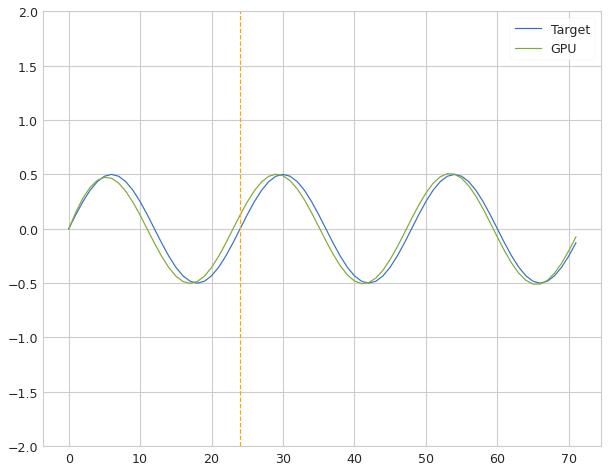

 Iter=77 a=0.264 sr=0.967 amp=0.031  ri=0.037 rr=3.889 loss=0.067753


Iter: 77 #### Diagnostic 0.068   Time 0.54  Best 0.068 NRMSE 0.068 CD 0.018
Iter: 78 #### Diagnostic 0.093   Time 0.06  Best 0.068 NRMSE 0.093 CD 0.034
Iter: 79 #### Diagnostic 0.092   Time 0.13  Best 0.068 NRMSE 0.092 CD 0.034
Iter: 80 #### Diagnostic 0.093   Time 0.08  Best 0.068 NRMSE 0.093 CD 0.034
Iter: 81 #### Diagnostic 0.094   Time 0.11  Best 0.068 NRMSE 0.094 CD 0.035
Iter: 82 #### Diagnostic 0.092   Time 0.08  Best 0.068 NRMSE 0.092 CD 0.034
Iter: 83 #### Diagnostic 0.093   Time 0.09  Best 0.068 NRMSE 0.093 CD 0.034
Iter: 84 #### Diagnostic 0.091   Time 0.09  Best 0.068 NRMSE 0.091 CD 0.033
Iter: 85 #### Diagnostic 0.303   Time 0.04  Best 0.068 NRMSE 0.303 CD 0.355
Iter: 86 #### Diagnostic 0.093   Time 0.03  Best 0.068 NRMSE 0.093 CD 0.034
Iter: 87 #### Diagnostic 0.094   Time 0.04  Best 0.068 NRMSE 0.094 CD 0.036
Iter: 88 #### Diagnostic 0.092   Time 0.04  Best 0.068 NRMSE 0.092 CD 0.034
Iter: 89 #### Dia

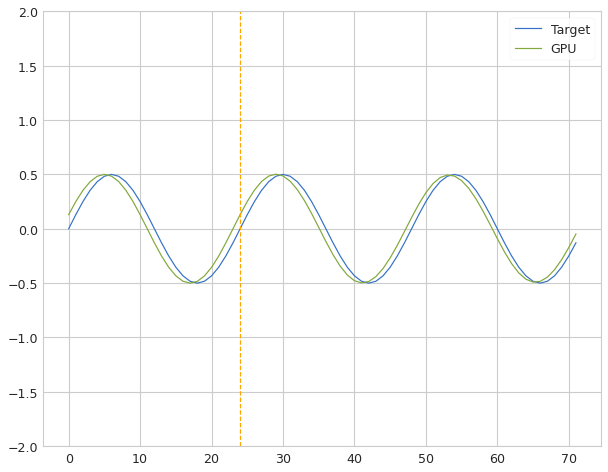

 Iter=64 a=0.942 sr=0.586 amp=0.504  ri=0.586 rr=4.137 loss=0.075955


Iter: 64 #### Diagnostic 0.076   Time 0.51  Best 0.076 NRMSE 0.076 CD 0.023
Iter: 65 #### Diagnostic 0.093   Time 0.04  Best 0.076 NRMSE 0.093 CD 0.034
Iter: 66 #### Diagnostic 0.092   Time 0.04  Best 0.076 NRMSE 0.092 CD 0.034
Iter: 67 #### Diagnostic 0.093   Time 0.04  Best 0.076 NRMSE 0.093 CD 0.034
Iter: 68 #### Diagnostic 0.093   Time 0.04  Best 0.076 NRMSE 0.093 CD 0.034
Iter: 69 #### Diagnostic 0.092   Time 0.04  Best 0.076 NRMSE 0.092 CD 0.034
Iter: 70 #### Diagnostic 0.093   Time 0.04  Best 0.076 NRMSE 0.093 CD 0.034
Iter: 71 #### Diagnostic 0.092   Time 0.03  Best 0.076 NRMSE 0.092 CD 0.034
Iter: 72 #### Diagnostic 0.096   Time 0.03  Best 0.076 NRMSE 0.096 CD 0.036
Iter: 73 #### Diagnostic 0.099   Time 0.04  Best 0.076 NRMSE 0.099 CD 0.040
Iter: 74 #### Diagnostic 0.092   Time 0.05  Best 0.076 NRMSE 0.092 CD 0.034
Iter: 75 #### Diagnostic 0.091   Time 0.06  Best 0.076 NRMSE 0.091 CD 0.033
Iter: 76 #### Dia

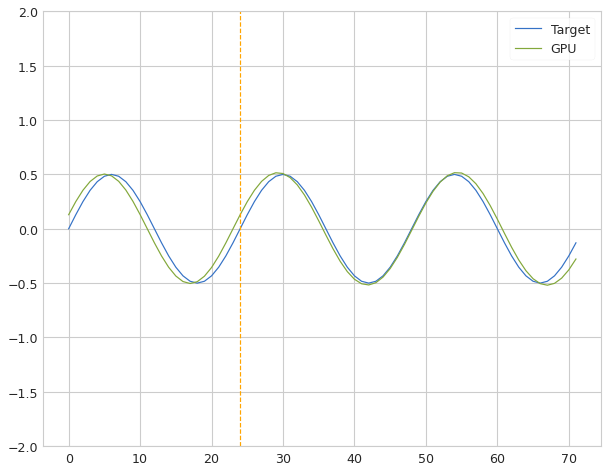

 Iter=85 a=0.917 sr=0.416 amp=0.193  ri=0.212 rr=0.739 loss=0.060990


Iter: 85 #### Diagnostic 0.061   Time 1.04  Best 0.061 NRMSE 0.061 CD 0.012
Iter: 86 #### Diagnostic 0.092   Time 0.03  Best 0.061 NRMSE 0.092 CD 0.034
Iter: 87 #### Diagnostic 0.092   Time 0.06  Best 0.061 NRMSE 0.092 CD 0.034
Iter: 88 #### Diagnostic 0.092   Time 0.05  Best 0.061 NRMSE 0.092 CD 0.034
Iter: 89 #### Diagnostic 0.092   Time 0.05  Best 0.061 NRMSE 0.092 CD 0.034
Iter: 90 #### Diagnostic 0.091   Time 0.06  Best 0.061 NRMSE 0.091 CD 0.033
Iter: 91 #### Diagnostic 0.100   Time 0.05  Best 0.061 NRMSE 0.100 CD 0.040
Iter: 92 #### Diagnostic 0.093   Time 0.05  Best 0.061 NRMSE 0.093 CD 0.035
Iter: 93 #### Diagnostic 0.093   Time 0.10  Best 0.061 NRMSE 0.093 CD 0.034
Iter: 94 #### Diagnostic 0.092   Time 0.11  Best 0.061 NRMSE 0.092 CD 0.034
Iter: 95 #### Diagnostic 0.092   Time 0.07  Best 0.061 NRMSE 0.092 CD 0.034
Iter: 96 #### Diagnostic 0.094   Time 0.06  Best 0.061 NRMSE 0.094 CD 0.035
Iter: 97 #### Dia

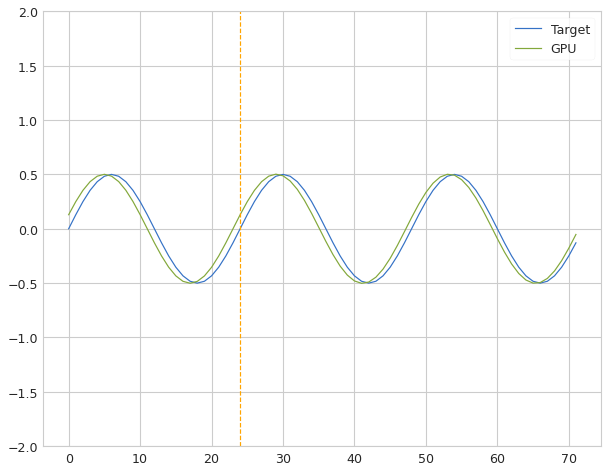

 Iter=59 a=0.633 sr=0.950 amp=0.044  ri=0.273 rr=3.145 loss=0.074502


Iter: 59 #### Diagnostic 0.075   Time 0.97  Best 0.075 NRMSE 0.075 CD 0.022
Iter: 60 #### Diagnostic 0.092   Time 0.06  Best 0.075 NRMSE 0.092 CD 0.034
Iter: 61 #### Diagnostic 0.092   Time 0.12  Best 0.075 NRMSE 0.092 CD 0.034
Iter: 62 #### Diagnostic 0.093   Time 0.06  Best 0.075 NRMSE 0.093 CD 0.035
Iter: 63 #### Diagnostic 0.092   Time 0.04  Best 0.075 NRMSE 0.092 CD 0.034
Iter: 64 #### Diagnostic 0.109   Time 0.04  Best 0.075 NRMSE 0.109 CD 0.036
Iter: 65 #### Diagnostic 0.094   Time 0.06  Best 0.075 NRMSE 0.094 CD 0.036
Iter: 66 #### Diagnostic 29.166   Time 0.06  Best 0.075 NRMSE 29.166 CD 1.114
Iter: 67 #### Diagnostic 0.093   Time 0.07  Best 0.075 NRMSE 0.093 CD 0.034
Iter: 68 #### Diagnostic 0.094   Time 0.09  Best 0.075 NRMSE 0.094 CD 0.035
Iter: 69 #### Diagnostic 0.091   Time 0.09  Best 0.075 NRMSE 0.091 CD 0.033
Iter: 70 #### Diagnostic 0.120   Time 0.08  Best 0.075 NRMSE 0.120 CD 0.048
Iter: 71 #### D

Iter: 65 #### Diagnostic 0.091   Time 0.04  Best 1000.000 NRMSE 0.091 CD 0.033
Iter: 66 #### Diagnostic 0.092   Time 0.04  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 67 #### Diagnostic 0.370   Time 0.03  Best 1000.000 NRMSE 0.370 CD 1.163
Iter: 68 #### Diagnostic 0.091   Time 0.03  Best 1000.000 NRMSE 0.091 CD 0.033
Iter: 69 #### Diagnostic 0.099   Time 0.03  Best 1000.000 NRMSE 0.099 CD 0.037
Iter: 70 #### Diagnostic 0.166   Time 0.03  Best 1000.000 NRMSE 0.166 CD 0.084
Iter: 71 #### Diagnostic 0.093   Time 0.03  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 72 #### Diagnostic 0.100   Time 0.03  Best 1000.000 NRMSE 0.100 CD 0.040
Iter: 73 #### Diagnostic 0.806   Time 0.03  Best 1000.000 NRMSE 0.806 CD 0.067
Iter: 74 #### Diagnostic 0.093   Time 0.04  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 75 #### Diagnostic 0.096   Time 0.03  Best 1000.000 NRMSE 0.096 CD 0.037
Iter: 76 #### Diagnostic 0.093   Time 0.04  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 77 #### Diagnostic 0.092   Time 0.05  Best 100

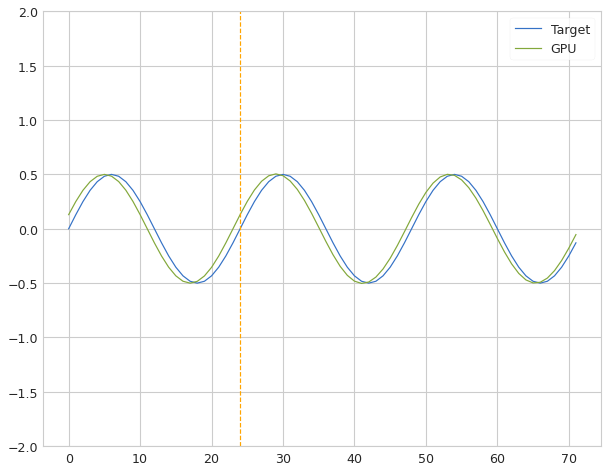

 Iter=26 a=0.929 sr=0.334 amp=0.703  ri=0.615 rr=0.587 loss=0.075038


Iter: 26 #### Diagnostic 0.075   Time 0.61  Best 0.075 NRMSE 0.075 CD 0.022
Iter: 27 #### Diagnostic 0.094   Time 0.07  Best 0.075 NRMSE 0.094 CD 0.035
Iter: 28 #### Diagnostic 0.092   Time 0.05  Best 0.075 NRMSE 0.092 CD 0.034
Iter: 29 #### Diagnostic 0.092   Time 0.13  Best 0.075 NRMSE 0.092 CD 0.034
Iter: 30 #### Diagnostic 0.383   Time 0.05  Best 0.075 NRMSE 0.383 CD 0.985
Iter: 31 #### Diagnostic 0.093   Time 0.05  Best 0.075 NRMSE 0.093 CD 0.034
Iter: 32 #### Diagnostic 0.092   Time 0.05  Best 0.075 NRMSE 0.092 CD 0.034
Iter: 33 #### Diagnostic 0.093   Time 0.07  Best 0.075 NRMSE 0.093 CD 0.035
Iter: 34 #### Diagnostic 0.117   Time 0.05  Best 0.075 NRMSE 0.117 CD 0.056
Iter: 35 #### Diagnostic 0.093   Time 0.05  Best 0.075 NRMSE 0.093 CD 0.035
Iter: 36 #### Diagnostic 0.092   Time 0.06  Best 0.075 NRMSE 0.092 CD 0.034
Iter: 37 #### Diagnostic 0.093   Time 0.05  Best 0.075 NRMSE 0.093 CD 0.034
Iter: 38 #### Dia

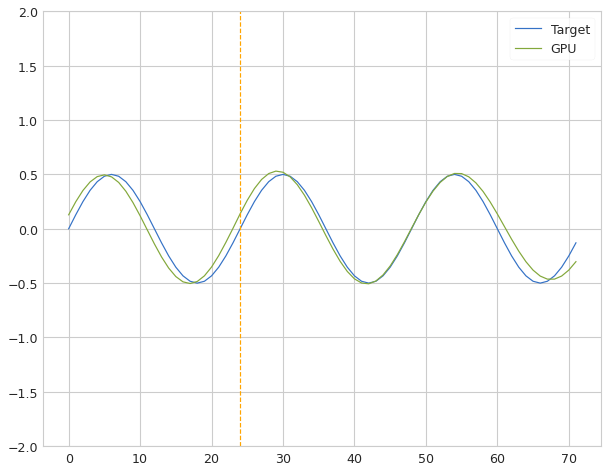

 Iter=3 a=0.673 sr=1.164 amp=0.989  ri=0.778 rr=0.127 loss=0.078259


Iter: 3 #### Diagnostic 0.078   Time 0.54  Best 0.078 NRMSE 0.078 CD 0.023


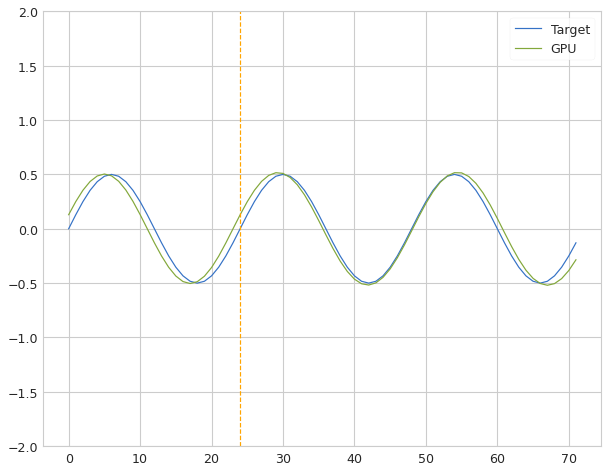

 Iter=4 a=0.921 sr=0.494 amp=0.191  ri=0.205 rr=4.320 loss=0.063020


Iter: 4 #### Diagnostic 0.063   Time 0.68  Best 0.063 NRMSE 0.063 CD 0.013
Iter: 5 #### Diagnostic 0.092   Time 0.03  Best 0.063 NRMSE 0.092 CD 0.034
Iter: 6 #### Diagnostic 0.092   Time 0.12  Best 0.063 NRMSE 0.092 CD 0.034
Iter: 7 #### Diagnostic 0.092   Time 0.04  Best 0.063 NRMSE 0.092 CD 0.034
Iter: 8 #### Diagnostic 0.107   Time 0.04  Best 0.063 NRMSE 0.107 CD 0.015
Iter: 9 #### Diagnostic 0.091   Time 0.04  Best 0.063 NRMSE 0.091 CD 0.033
Iter: 10 #### Diagnostic 0.556   Time 0.04  Best 0.063 NRMSE 0.556 CD 1.657
Iter: 11 #### Diagnostic 0.091   Time 0.04  Best 0.063 NRMSE 0.091 CD 0.033
Iter: 12 #### Diagnostic 0.092   Time 0.04  Best 0.063 NRMSE 0.092 CD 0.034
Iter: 13 #### Diagnostic 10.993   Time 0.04  Best 0.063 NRMSE 10.993 CD 0.191
Iter: 14 #### Diagnostic 0.091   Time 0.06  Best 0.063 NRMSE 0.091 CD 0.033
Iter: 15 #### Diagnostic 0.178   Time 0.04  Best 0.063 NRMSE 0.178 CD 0.052
Iter: 16 #### Diagnost

Iter: 15 #### Diagnostic 0.092   Time 0.03  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 16 #### Diagnostic 0.092   Time 0.03  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 17 #### Diagnostic 0.091   Time 0.03  Best 1000.000 NRMSE 0.091 CD 0.033
Iter: 18 #### Diagnostic 0.092   Time 0.03  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 19 #### Diagnostic 0.252   Time 0.03  Best 1000.000 NRMSE 0.252 CD 0.094
Iter: 20 #### Diagnostic 0.091   Time 0.03  Best 1000.000 NRMSE 0.091 CD 0.033
Iter: 21 #### Diagnostic 0.093   Time 0.03  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 22 #### Diagnostic 0.095   Time 0.03  Best 1000.000 NRMSE 0.095 CD 0.037
Iter: 23 #### Diagnostic 0.092   Time 0.13  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 24 #### Diagnostic 0.093   Time 0.12  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 25 #### Diagnostic 0.093   Time 0.11  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 26 #### Diagnostic 0.133   Time 0.11  Best 1000.000 NRMSE 0.133 CD 0.040
Iter: 27 #### Diagnostic 0.092   Time 0.10  Best 100

Iter: 18 #### Diagnostic 0.100   Time 0.07  Best 1000.000 NRMSE 0.100 CD 0.040
Iter: 19 #### Diagnostic 0.092   Time 0.09  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 20 #### Diagnostic 0.092   Time 0.09  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 21 #### Diagnostic 0.092   Time 0.10  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 22 #### Diagnostic 0.093   Time 0.09  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 23 #### Diagnostic 0.093   Time 0.09  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 24 #### Diagnostic 0.093   Time 0.08  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 25 #### Diagnostic 0.100   Time 0.08  Best 1000.000 NRMSE 0.100 CD 0.040
Iter: 26 #### Diagnostic 0.091   Time 0.07  Best 1000.000 NRMSE 0.091 CD 0.033
Iter: 27 #### Diagnostic 0.091   Time 0.05  Best 1000.000 NRMSE 0.091 CD 0.034
Iter: 28 #### Diagnostic 0.091   Time 0.05  Best 1000.000 NRMSE 0.091 CD 0.033
Iter: 29 #### Diagnostic 0.092   Time 0.10  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 30 #### Diagnostic 0.093   Time 0.06  Best 100

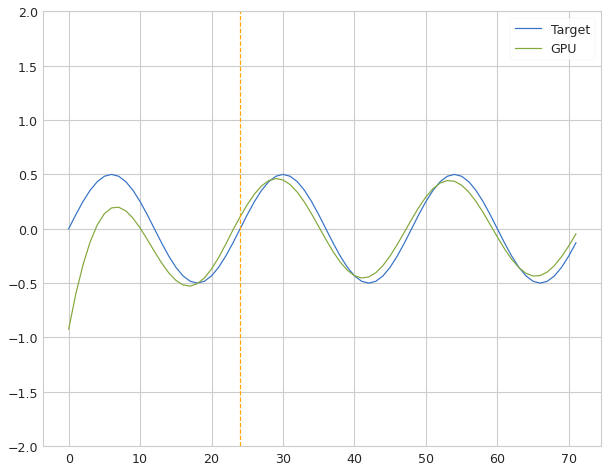

 Iter=53 a=0.192 sr=0.680 amp=0.028  ri=0.054 rr=4.082 loss=0.075906


Iter: 53 #### Diagnostic 0.076   Time 0.69  Best 0.076 NRMSE 0.076 CD 0.020
Iter: 54 #### Diagnostic 0.112   Time 0.03  Best 0.076 NRMSE 0.112 CD 0.051
Iter: 55 #### Diagnostic 0.094   Time 0.09  Best 0.076 NRMSE 0.094 CD 0.035
Iter: 56 #### Diagnostic 0.096   Time 0.09  Best 0.076 NRMSE 0.096 CD 0.037
Iter: 57 #### Diagnostic 3.445   Time 0.08  Best 0.076 NRMSE 3.445 CD 1.789
Iter: 58 #### Diagnostic 0.095   Time 0.09  Best 0.076 NRMSE 0.095 CD 0.036
Iter: 59 #### Diagnostic 0.120   Time 0.12  Best 0.076 NRMSE 0.120 CD 0.059
Iter: 60 #### Diagnostic 0.092   Time 0.12  Best 0.076 NRMSE 0.092 CD 0.034
Iter: 61 #### Diagnostic 0.092   Time 0.08  Best 0.076 NRMSE 0.092 CD 0.034
Iter: 62 #### Diagnostic 0.092   Time 0.04  Best 0.076 NRMSE 0.092 CD 0.034
Iter: 63 #### Diagnostic 0.093   Time 0.09  Best 0.076 NRMSE 0.093 CD 0.035
Iter: 64 #### Diagnostic 0.094   Time 0.08  Best 0.076 NRMSE 0.094 CD 0.035
Iter: 65 #### Dia

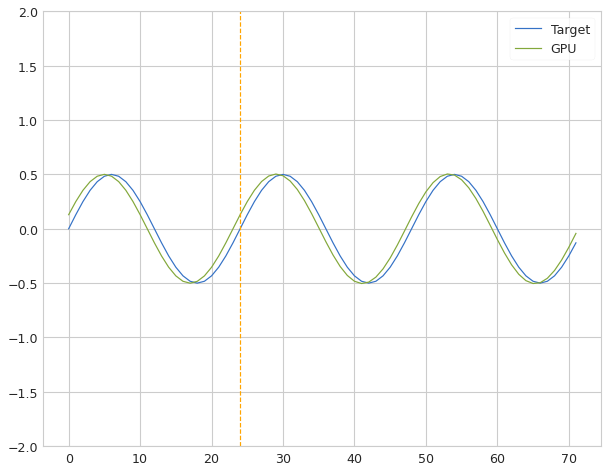

 Iter=41 a=0.792 sr=0.107 amp=0.516  ri=0.899 rr=1.517 loss=0.078026


Iter: 41 #### Diagnostic 0.078   Time 0.51  Best 0.078 NRMSE 0.078 CD 0.024
Iter: 42 #### Diagnostic 0.092   Time 0.04  Best 0.078 NRMSE 0.092 CD 0.034
Iter: 43 #### Diagnostic 0.093   Time 0.04  Best 0.078 NRMSE 0.093 CD 0.034
Iter: 44 #### Diagnostic 0.092   Time 0.03  Best 0.078 NRMSE 0.092 CD 0.034
Iter: 45 #### Diagnostic 0.099   Time 0.03  Best 0.078 NRMSE 0.099 CD 0.039
Iter: 46 #### Diagnostic 0.092   Time 0.06  Best 0.078 NRMSE 0.092 CD 0.034
Iter: 47 #### Diagnostic 0.090   Time 0.05  Best 0.078 NRMSE 0.090 CD 0.032
Iter: 48 #### Diagnostic 0.092   Time 0.05  Best 0.078 NRMSE 0.092 CD 0.034
Iter: 49 #### Diagnostic 0.092   Time 0.06  Best 0.078 NRMSE 0.092 CD 0.034
Iter: 50 #### Diagnostic 0.092   Time 0.06  Best 0.078 NRMSE 0.092 CD 0.034
Iter: 51 #### Diagnostic 0.092   Time 0.03  Best 0.078 NRMSE 0.092 CD 0.034
Iter: 52 #### Diagnostic 0.102   Time 0.03  Best 0.078 NRMSE 0.102 CD 0.021
Iter: 53 #### Dia

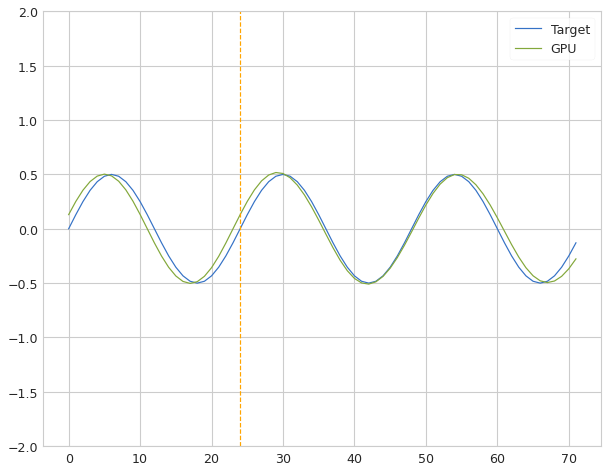

 Iter=86 a=0.945 sr=1.039 amp=0.126  ri=0.886 rr=3.615 loss=0.062627


Iter: 86 #### Diagnostic 0.063   Time 1.21  Best 0.063 NRMSE 0.063 CD 0.015
Iter: 87 #### Diagnostic 0.115   Time 0.03  Best 0.063 NRMSE 0.115 CD 0.054
Iter: 88 #### Diagnostic 0.092   Time 0.09  Best 0.063 NRMSE 0.092 CD 0.034
Iter: 89 #### Diagnostic 0.089   Time 0.07  Best 0.063 NRMSE 0.089 CD 0.032
Iter: 90 #### Diagnostic 0.092   Time 0.05  Best 0.063 NRMSE 0.092 CD 0.034
Iter: 91 #### Diagnostic 0.095   Time 0.06  Best 0.063 NRMSE 0.095 CD 0.036
Iter: 92 #### Diagnostic 0.095   Time 0.06  Best 0.063 NRMSE 0.095 CD 0.036
Iter: 93 #### Diagnostic 0.114   Time 0.05  Best 0.063 NRMSE 0.114 CD 0.053
Iter: 94 #### Diagnostic 0.099   Time 0.05  Best 0.063 NRMSE 0.099 CD 0.039
Iter: 95 #### Diagnostic 0.092   Time 0.06  Best 0.063 NRMSE 0.092 CD 0.034
Iter: 96 #### Diagnostic 0.092   Time 0.06  Best 0.063 NRMSE 0.092 CD 0.034
Iter: 97 #### Diagnostic 0.096   Time 0.05  Best 0.063 NRMSE 0.096 CD 0.035
Iter: 98 #### Dia

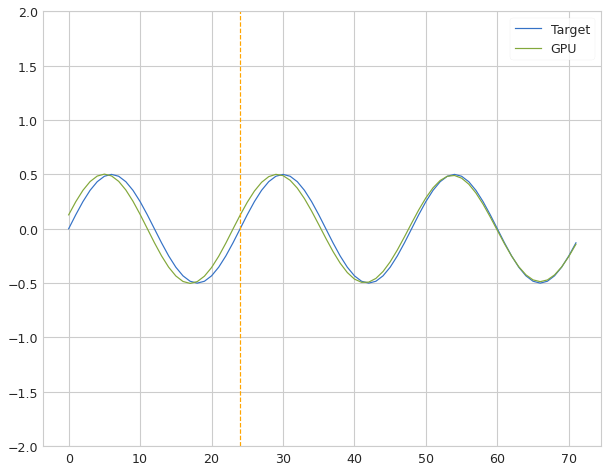

 Iter=34 a=0.438 sr=1.132 amp=0.022  ri=0.106 rr=2.222 loss=0.049080


Iter: 34 #### Diagnostic 0.049   Time 0.44  Best 0.049 NRMSE 0.049 CD 0.010
Iter: 35 #### Diagnostic 0.093   Time 0.05  Best 0.049 NRMSE 0.093 CD 0.034
Iter: 36 #### Diagnostic 0.092   Time 0.12  Best 0.049 NRMSE 0.092 CD 0.034
Iter: 37 #### Diagnostic 0.091   Time 0.06  Best 0.049 NRMSE 0.091 CD 0.033
Iter: 38 #### Diagnostic 0.093   Time 0.05  Best 0.049 NRMSE 0.093 CD 0.034
Iter: 39 #### Diagnostic 0.093   Time 0.05  Best 0.049 NRMSE 0.093 CD 0.034
Iter: 40 #### Diagnostic 0.093   Time 0.06  Best 0.049 NRMSE 0.093 CD 0.034
Iter: 41 #### Diagnostic 0.114   Time 0.05  Best 0.049 NRMSE 0.114 CD 0.052
Iter: 42 #### Diagnostic 0.091   Time 0.05  Best 0.049 NRMSE 0.091 CD 0.033
Iter: 43 #### Diagnostic 0.187   Time 0.06  Best 0.049 NRMSE 0.187 CD 0.138
Iter: 44 #### Diagnostic 0.092   Time 0.04  Best 0.049 NRMSE 0.092 CD 0.034
Iter: 45 #### Diagnostic 0.092   Time 0.03  Best 0.049 NRMSE 0.092 CD 0.034
Iter: 46 #### Dia

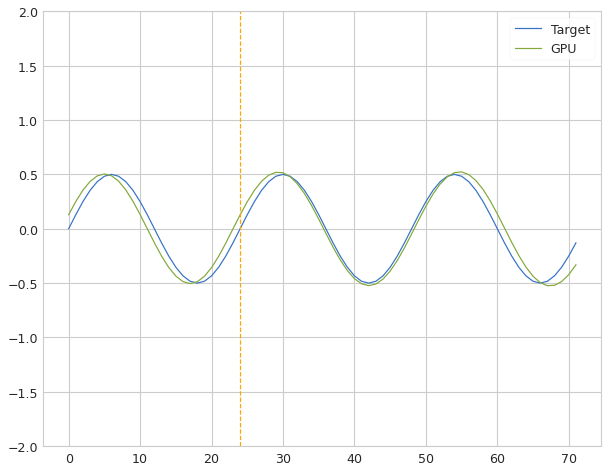

 Iter=4 a=0.921 sr=0.494 amp=0.191  ri=0.205 rr=4.320 loss=0.078089


Iter: 4 #### Diagnostic 0.078   Time 0.50  Best 0.078 NRMSE 0.078 CD 0.020
Iter: 5 #### Diagnostic 0.092   Time 0.04  Best 0.078 NRMSE 0.092 CD 0.034
Iter: 6 #### Diagnostic 0.092   Time 0.07  Best 0.078 NRMSE 0.092 CD 0.034
Iter: 7 #### Diagnostic 0.092   Time 0.04  Best 0.078 NRMSE 0.092 CD 0.034
Iter: 8 #### Diagnostic 0.231   Time 0.04  Best 0.078 NRMSE 0.231 CD 0.033
Iter: 9 #### Diagnostic 0.093   Time 0.03  Best 0.078 NRMSE 0.093 CD 0.034
Iter: 10 #### Diagnostic 0.813   Time 0.05  Best 0.078 NRMSE 0.813 CD 0.023
Iter: 11 #### Diagnostic 0.092   Time 0.05  Best 0.078 NRMSE 0.092 CD 0.034
Iter: 12 #### Diagnostic 0.093   Time 0.05  Best 0.078 NRMSE 0.093 CD 0.034
Iter: 13 #### Diagnostic 4.247   Time 0.03  Best 0.078 NRMSE 4.247 CD 1.934
Iter: 14 #### Diagnostic 0.092   Time 0.03  Best 0.078 NRMSE 0.092 CD 0.034
Iter: 15 #### Diagnostic 0.172   Time 0.03  Best 0.078 NRMSE 0.172 CD 0.002
Iter: 16 #### Diagnostic

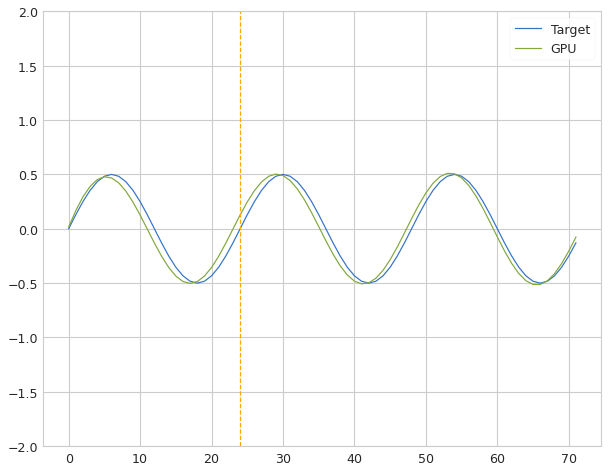

 Iter=77 a=0.264 sr=0.967 amp=0.031  ri=0.037 rr=3.889 loss=0.067642


Iter: 77 #### Diagnostic 0.068   Time 0.56  Best 0.068 NRMSE 0.068 CD 0.018
Iter: 78 #### Diagnostic 0.092   Time 0.03  Best 0.068 NRMSE 0.092 CD 0.034
Iter: 79 #### Diagnostic 0.092   Time 0.12  Best 0.068 NRMSE 0.092 CD 0.034
Iter: 80 #### Diagnostic 0.093   Time 0.09  Best 0.068 NRMSE 0.093 CD 0.034
Iter: 81 #### Diagnostic 0.092   Time 0.05  Best 0.068 NRMSE 0.092 CD 0.034
Iter: 82 #### Diagnostic 0.093   Time 0.05  Best 0.068 NRMSE 0.093 CD 0.034
Iter: 83 #### Diagnostic 0.092   Time 0.04  Best 0.068 NRMSE 0.092 CD 0.034
Iter: 84 #### Diagnostic 0.092   Time 0.04  Best 0.068 NRMSE 0.092 CD 0.034
Iter: 85 #### Diagnostic 0.138   Time 0.04  Best 0.068 NRMSE 0.138 CD 0.048
Iter: 86 #### Diagnostic 0.093   Time 0.04  Best 0.068 NRMSE 0.093 CD 0.035
Iter: 87 #### Diagnostic 0.094   Time 0.04  Best 0.068 NRMSE 0.094 CD 0.035
Iter: 88 #### Diagnostic 0.092   Time 0.04  Best 0.068 NRMSE 0.092 CD 0.034
Iter: 89 #### Dia

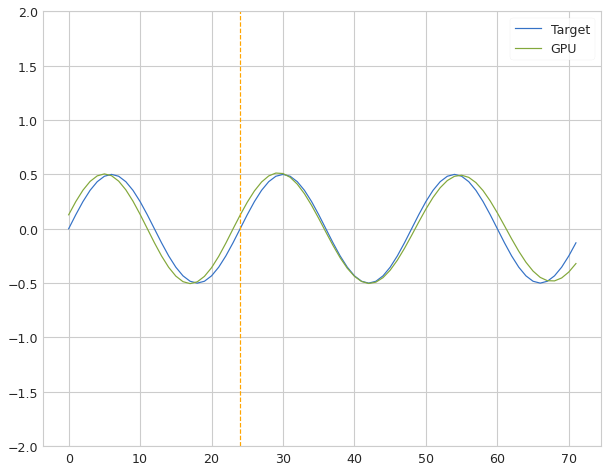

 Iter=44 a=0.773 sr=0.924 amp=0.028  ri=0.246 rr=1.622 loss=0.079610


Iter: 44 #### Diagnostic 0.080   Time 0.66  Best 0.080 NRMSE 0.080 CD 0.025
Iter: 45 #### Diagnostic 0.102   Time 0.04  Best 0.080 NRMSE 0.102 CD 0.042
Iter: 46 #### Diagnostic 0.092   Time 0.03  Best 0.080 NRMSE 0.092 CD 0.034
Iter: 47 #### Diagnostic 0.099   Time 0.03  Best 0.080 NRMSE 0.099 CD 0.040
Iter: 48 #### Diagnostic 0.099   Time 0.03  Best 0.080 NRMSE 0.099 CD 0.040
Iter: 49 #### Diagnostic 0.370   Time 0.03  Best 0.080 NRMSE 0.370 CD 1.162
Iter: 50 #### Diagnostic 0.093   Time 0.03  Best 0.080 NRMSE 0.093 CD 0.034
Iter: 51 #### Diagnostic 0.093   Time 0.03  Best 0.080 NRMSE 0.093 CD 0.035
Iter: 52 #### Diagnostic 0.091   Time 0.04  Best 0.080 NRMSE 0.091 CD 0.033
Iter: 53 #### Diagnostic 0.094   Time 0.04  Best 0.080 NRMSE 0.094 CD 0.035
Iter: 54 #### Diagnostic 0.093   Time 0.04  Best 0.080 NRMSE 0.093 CD 0.034
Iter: 55 #### Diagnostic 0.096   Time 0.04  Best 0.080 NRMSE 0.096 CD 0.035
Iter: 56 #### Dia

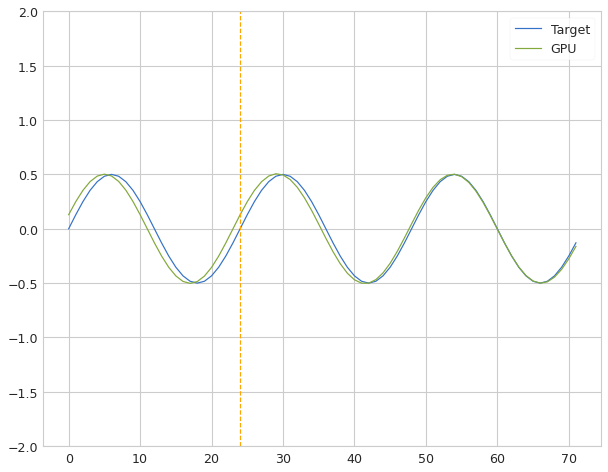

 Iter=85 a=0.917 sr=0.416 amp=0.193  ri=0.212 rr=0.739 loss=0.048425


Iter: 85 #### Diagnostic 0.048   Time 0.51  Best 0.048 NRMSE 0.048 CD 0.009
Iter: 86 #### Diagnostic 0.092   Time 0.03  Best 0.048 NRMSE 0.092 CD 0.034
Iter: 87 #### Diagnostic 0.092   Time 0.08  Best 0.048 NRMSE 0.092 CD 0.034
Iter: 88 #### Diagnostic 0.092   Time 0.05  Best 0.048 NRMSE 0.092 CD 0.034
Iter: 89 #### Diagnostic 0.094   Time 0.04  Best 0.048 NRMSE 0.094 CD 0.035
Iter: 90 #### Diagnostic 0.375   Time 0.05  Best 0.048 NRMSE 0.375 CD 0.665
Iter: 91 #### Diagnostic 0.096   Time 0.06  Best 0.048 NRMSE 0.096 CD 0.037
Iter: 92 #### Diagnostic 0.093   Time 0.06  Best 0.048 NRMSE 0.093 CD 0.035
Iter: 93 #### Diagnostic 0.093   Time 0.06  Best 0.048 NRMSE 0.093 CD 0.034
Iter: 94 #### Diagnostic 0.090   Time 0.03  Best 0.048 NRMSE 0.090 CD 0.033
Iter: 95 #### Diagnostic 0.092   Time 0.03  Best 0.048 NRMSE 0.092 CD 0.034
Iter: 96 #### Diagnostic 0.094   Time 0.03  Best 0.048 NRMSE 0.094 CD 0.035
Iter: 97 #### Dia

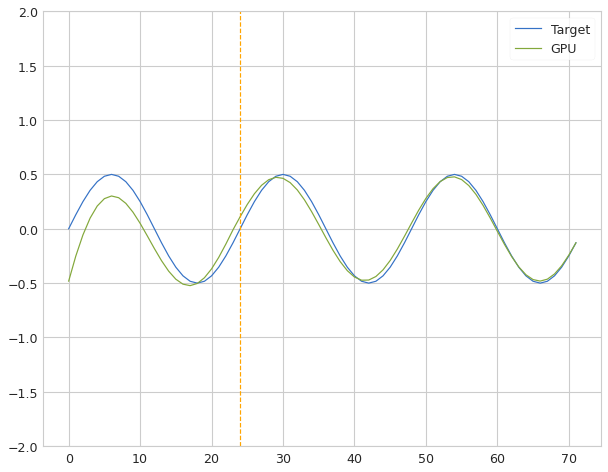

 Iter=53 a=0.192 sr=0.680 amp=0.028  ri=0.054 rr=4.082 loss=0.048032


Iter: 53 #### Diagnostic 0.048   Time 0.75  Best 0.048 NRMSE 0.048 CD 0.009
Iter: 54 #### Diagnostic 0.103   Time 0.04  Best 0.048 NRMSE 0.103 CD 0.043
Iter: 55 #### Diagnostic 0.094   Time 0.09  Best 0.048 NRMSE 0.094 CD 0.036
Iter: 56 #### Diagnostic 0.109   Time 0.09  Best 0.048 NRMSE 0.109 CD 0.049
Iter: 57 #### Diagnostic 0.509   Time 0.09  Best 0.048 NRMSE 0.509 CD 1.234
Iter: 58 #### Diagnostic 0.093   Time 0.15  Best 0.048 NRMSE 0.093 CD 0.034
Iter: 59 #### Diagnostic 0.089   Time 0.07  Best 0.048 NRMSE 0.089 CD 0.032
Iter: 60 #### Diagnostic 0.094   Time 0.04  Best 0.048 NRMSE 0.094 CD 0.035
Iter: 61 #### Diagnostic 0.092   Time 0.04  Best 0.048 NRMSE 0.092 CD 0.034
Iter: 62 #### Diagnostic 0.093   Time 0.05  Best 0.048 NRMSE 0.093 CD 0.034
Iter: 63 #### Diagnostic 0.093   Time 0.04  Best 0.048 NRMSE 0.093 CD 0.034
Iter: 64 #### Diagnostic 0.112   Time 0.03  Best 0.048 NRMSE 0.112 CD 0.029
Iter: 65 #### Dia

Iter: 58 #### Diagnostic 0.092   Time 0.09  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 59 #### Diagnostic 0.091   Time 0.09  Best 1000.000 NRMSE 0.091 CD 0.033
Iter: 60 #### Diagnostic 0.111   Time 0.08  Best 1000.000 NRMSE 0.111 CD 0.008
Iter: 61 #### Diagnostic 0.160   Time 0.04  Best 1000.000 NRMSE 0.160 CD 0.079
Iter: 62 #### Diagnostic 0.121   Time 0.03  Best 1000.000 NRMSE 0.121 CD 0.059
Iter: 63 #### Diagnostic 0.103   Time 0.09  Best 1000.000 NRMSE 0.103 CD 0.043
Iter: 64 #### Diagnostic 0.092   Time 0.13  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 65 #### Diagnostic 0.091   Time 0.07  Best 1000.000 NRMSE 0.091 CD 0.033
Iter: 66 #### Diagnostic 0.093   Time 0.09  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 67 #### Diagnostic 0.370   Time 0.06  Best 1000.000 NRMSE 0.370 CD 1.163
Iter: 68 #### Diagnostic 0.091   Time 0.04  Best 1000.000 NRMSE 0.091 CD 0.030
Iter: 69 #### Diagnostic 0.091   Time 0.05  Best 1000.000 NRMSE 0.091 CD 0.034
Iter: 70 #### Diagnostic 0.347   Time 0.03  Best 100

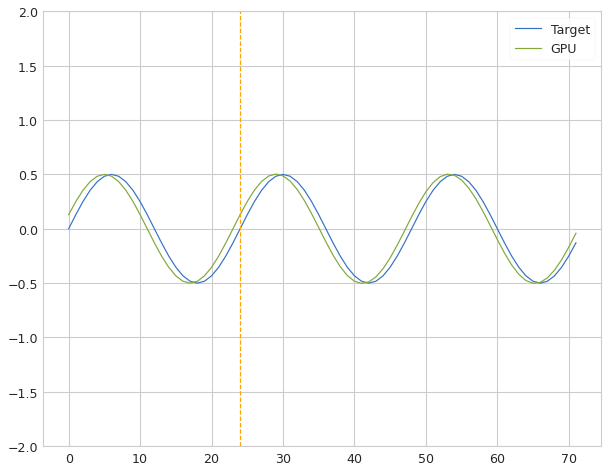

 Iter=72 a=0.820 sr=0.810 amp=0.339  ri=0.682 rr=2.359 loss=0.078849


Iter: 72 #### Diagnostic 0.079   Time 0.51  Best 0.079 NRMSE 0.079 CD 0.025
Iter: 73 #### Diagnostic 1.024   Time 0.03  Best 0.079 NRMSE 1.024 CD 0.065
Iter: 74 #### Diagnostic 0.093   Time 0.09  Best 0.079 NRMSE 0.093 CD 0.034
Iter: 75 #### Diagnostic 0.092   Time 0.04  Best 0.079 NRMSE 0.092 CD 0.034
Iter: 76 #### Diagnostic 0.093   Time 0.04  Best 0.079 NRMSE 0.093 CD 0.034
Iter: 77 #### Diagnostic 0.092   Time 0.04  Best 0.079 NRMSE 0.092 CD 0.034
Iter: 78 #### Diagnostic 0.093   Time 0.04  Best 0.079 NRMSE 0.093 CD 0.034
Iter: 79 #### Diagnostic 0.094   Time 0.04  Best 0.079 NRMSE 0.094 CD 0.035
Iter: 80 #### Diagnostic 0.085   Time 0.05  Best 0.079 NRMSE 0.085 CD 0.028
Iter: 81 #### Diagnostic 0.093   Time 0.05  Best 0.079 NRMSE 0.093 CD 0.034
Iter: 82 #### Diagnostic 0.089   Time 0.06  Best 0.079 NRMSE 0.089 CD 0.032
Iter: 83 #### Diagnostic 0.093   Time 0.07  Best 0.079 NRMSE 0.093 CD 0.035
Iter: 84 #### Dia

Iter: 76 #### Diagnostic 0.092   Time 0.09  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 77 #### Diagnostic 0.092   Time 0.07  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 78 #### Diagnostic 0.107   Time 0.11  Best 1000.000 NRMSE 0.107 CD 0.030
Iter: 79 #### Diagnostic 0.092   Time 0.08  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 80 #### Diagnostic 0.093   Time 0.05  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 81 #### Diagnostic 0.093   Time 0.05  Best 1000.000 NRMSE 0.093 CD 0.034
Iter: 82 #### Diagnostic 0.092   Time 0.05  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 83 #### Diagnostic 0.390   Time 0.06  Best 1000.000 NRMSE 0.390 CD 0.015
Iter: 84 #### Diagnostic 0.093   Time 0.05  Best 1000.000 NRMSE 0.093 CD 0.035
Iter: 85 #### Diagnostic 0.092   Time 0.05  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 86 #### Diagnostic 5.257   Time 0.08  Best 1000.000 NRMSE 5.257 CD 1.883
Iter: 87 #### Diagnostic 0.092   Time 0.11  Best 1000.000 NRMSE 0.092 CD 0.034
Iter: 88 #### Diagnostic 0.095   Time 0.05  Best 100

In [12]:
CALLS = 100
s = torch.torch.from_numpy(signal).cuda(DEVICE).type(dtype)

size = [1000,900,800,700,600,500,400,300,200,100,50]
rand_state = [11,37,3,24,91]

for N in size:
    min_a, max_a = .001, 1.
    min_sr, max_sr = .001, 1.2
    min_g, max_g = .001, 1.
    min_ri, max_ri = .001, 1.
    min_rr, max_rr = .001, 5.
    space = [Real(min_a, max_a, name='a'),
                     Real(min_sr, max_sr, name='sr'),
                     Real(min_g, max_g, name='amp'), 
                     Real(min_ri, max_ri, name='ri'),
                     Real(min_rr, max_rr, name='rr')
                    ]
    for ref in range(5):
        start = time.time()
        alphas = []
        rhos = []
        gammas = []
        inScales = []
        resScales = []

        for rn in range(5):
            running_error = 1000
            counter = 0 
            print(f'\n ********** {N} ***********')
            result_gp = gp_minimize(loop,
                                    space,
                                    n_calls=CALLS,
                                    random_state=rand_state[rn],
                                    n_jobs=-1,
                                    n_initial_points=100)
            print(f'\nBest result = {result_gp.fun}')
            names = ['a','sr','amp','ri','rr']
            for i in range(len(space)):
                print(f'{names[i]} = {result_gp.x[i]}')

        min_a, max_a   = resize_spaces(min_a, max_a,
                                       np.array(alphas),
                                       isAlpha=True)
        min_sr, max_sr = resize_spaces(min_sr, max_sr, np.array(rhos))
        min_g, max_g   = resize_spaces(min_g, max_g, np.array(gammas))
        min_ri, max_ri = resize_spaces(min_ri, max_ri, np.array(inScales))
        min_rr, max_rr = resize_spaces(min_rr, max_rr, np.array(resScales))
        print('Refined search bounds:\n')
        print(f'Alpha ({min_a}, {max_a})\n')
        print(f'Rho ({min_sr}, {max_sr})\n')
        print(f'Gamma ({min_g}, {max_g})\n')
        print(f'r-in ({min_ri}, {max_ri})\n')
        print(f'r-res ({min_rr}, {max_rr})\n')
        end = time.time()-start
        print(f'End Refinement Run {ref} Time {end:.3f}')